In [1]:
# import snowflake.connector
#install library
# !pip install snowflake-connector-python

     |████████████████████████████████| 16.4 MB 29.4 MB/s            
     |████████████████████████████████| 192 kB 83.9 MB/s            
     |████████████████████████████████| 2.0 MB 123.9 MB/s            


In [905]:
try:
    import snowflake.connector
except:
    !pip install snowflake-connector-python
    import snowflake.connector


import base64
WAREHOUSE = 'COMPUTE_WH'
USER = 'OMAR_CLAFLIN'
code = b'T2xsaWUyMSE='
PASSWORD = base64.b64decode(code).decode("utf-8")
ACCOUNT='Renaissance-MM82784'
DATABASE = 'FRECKLE_PROD'
# SCHEMA = ''
# Gets the version
ctx = snowflake.connector.connect(
    user=USER,
    password=PASSWORD,
    account=ACCOUNT, 
    database=DATABASE
#     schema=SCHEMA
    )
cs = ctx.cursor()
try:
    cs.execute("SELECT current_version()")
    one_row = cs.fetchone()
    print(one_row[0])
finally:
    cs.close()
ctx.close()

6.3.3


In [960]:
def query_for_skills():
    try:
        import snowflake.connector
    except:
        !pip install snowflake-connector-python
        import snowflake.connector


    import base64
    WAREHOUSE = 'COMPUTE_WH'
    USER = 'OMAR_CLAFLIN'
    code = b'T2xsaWUyMSE='
    PASSWORD = base64.b64decode(code).decode("utf-8")
    ACCOUNT='Renaissance-MM82784'
    DATABASE = 'FRECKLE_PROD'

    ctx = snowflake.connector.connect(
        user=USER,
        password=PASSWORD,
        account=ACCOUNT, 
        database=DATABASE
    #     schema=SCHEMA
        )

    # Retrieving a Snowflake Query ID
    cur = ctx.cursor()
    cur.execute("USE warehouse COMPUTE_WH;")
    cur.execute("USE DATABASE FRECKLE_PROD;")
    cur.execute("SELECT DISTINCT RL_TOP_LEVEL_SKILL_ID from freckle_prod.views.math_answers_fact")
    print(cur.sfqid)

    # Get the results from a query.
    query_id=cur.sfqid
    cur.get_results_from_sfqid(query_id)
    results = cur.fetchall()
    cur.close()
    #print(f'{results}')
    return results

In [962]:
results = query_for_skills()
len(results)
list_of_skills=results[:]
print(list_of_skills)

01a29e7f-0404-43e9-0000-56f506e39432
[('iquahpai',), ('aiwohngu',), ('ijoophee',), ('theecahs',), ('a0a3bfaa479de311b77c005056801da1',), ('297dcdf7d5014527906b62565e3c9107',), ('f7a3bfaa479de311b77c005056801da1',), ('55a4bfaa479de311b77c005056801da1',), ('1efabc206e5547309d19669314401ced',), ('02a3bfaa479de311b77c005056801da1',), ('37a3bfaa479de311b77c005056801da1',), ('44a4bfaa479de311b77c005056801da1',), ('1db5e33871bd44cda53633af35813c03',), ('ungiecoo',), ('gohxaene',), ('85afef75aa05478f8b25f9747875998c',), ('f3a2bfaa479de311b77c005056801da1',), ('6b31e2e7569649b6930ca995f01c7435',), ('2aa5bfaa479de311b77c005056801da1',), ('0aaceabece72465f9cf1cd6f93aa90ec',), ('a20d7cf7e2f24281b503930836184a2d',), ('5aa3bfaa479de311b77c005056801da1',), ('8ba4bfaa479de311b77c005056801da1',), ('48a3bfaa479de311b77c005056801da1',), ('4e358085ccf1424086e920b0e1869c3a',), ('1fa3bfaa479de311b77c005056801da1',), ('ohquuuch',), ('f5a2bfaa479de311b77c005056801da1',), ('bca3bfaa479de311b77c005056801da1',),

In [ ]:
list_of_skills[0]
cur.execute("SELECT student_id, math_question_id, correctness from "
            +"freckle_prod.views.math_answers_fact where rl_top_level_skill_id ='" 
            +list_of_skills[0][0]+"'")

try:
  query_id = cur.sfqid
  while ctx.is_still_running(ctx.get_query_status_throw_if_error(query_id)):
    time.sleep(1)
except ProgrammingError as err:
  print('Programming Error: {0}'.format(err))

cur.get_results_from_sfqid(query_id)
results = cur.fetchall()
# print(f'{results}')

len(result)


In [6]:
cur.execute("SELECT student_id, math_question_id, correctness from "
            +"freckle_prod.views.math_answers_fact where rl_top_level_skill_id ='" 
            +list_of_skills[0][0]+"'")
cur.is_still_running(cur.get_query_status_throw_if_error(query_id))

AttributeError: 'SnowflakeCursor' object has no attribute 'is_still_running'

In [13]:
query_id = cur.sfqid
ctx.is_still_running(ctx.get_query_status_throw_if_error(query_id))


False

In [9]:
cur.get_results_from_sfqid(query_id)
results = cur.fetchall()
len(results)

2362

In [11]:
#Build stage on snowflake

import time
starttime = time.time()
ctx = snowflake.connector.connect(
    user=USER,
    password=PASSWORD,
    account=ACCOUNT, 
    database=DATABASE
#     schema=SCHEMA
    )
cs = ctx.cursor()
# try:
cs.execute("USE warehouse COMPUTE_WH;")
cs.execute("USE DATABASE FRECKLE_PROD;")
cs.execute("CREATE STAGE omars_adaptive_math_stage")
cs.execute("copy into @omars_adaptive_math_stage/result/data_ from (select * from freckle_prod.views.math_answers_fact) file_format=(compression='gzip');")
# file:///tmp/data/;
# cs.execute("GET '@omars_data_dump' 's3://freckle-data-science/' ;")
# cs.execute("copy into 's3://freckle-data-science/' from '@omars_data_dump';")
# cs.execute("select * from FRECKLE_PROD.VIEWS.MATH_ANSWERS_FACT limit 10 ")
print('completed, ', time.time()-starttime, ' seconds.')

ProgrammingError: 100171 (22000): Error encountered when unloading to PARQUET: TIMESTAMP_TZ and LTZ types are not supported for unloading to Parquet. value get: TIMESTAMP_TZ

In [14]:
import os
os.getcwd()
# os.listdir('//home/ec2-user/SageMaker/')


'/home/ec2-user/SageMaker'

In [3]:
ctx = snowflake.connector.connect(
    user=USER,
    password=PASSWORD,
    account=ACCOUNT, 
    database=DATABASE
#     schema=SCHEMA
    )
cs = ctx.cursor()


import time
starttime = time.time()
# try:
cs.execute("USE warehouse COMPUTE_WH;")
cs.execute("USE DATABASE FRECKLE_PROD;")
cs.execute("GET @omars_adaptive_math_stage file:///home/ec2-user/SageMaker/AdaptiveMath/;")
# file:///tmp/data/;
# cs.execute("GET '@omars_data_dump' 's3://freckle-data-science/' ;")
# cs.execute("copy into 's3://freckle-data-science/' from '@omars_data_dump';")
# cs.execute("select * from FRECKLE_PROD.VIEWS.MATH_ANSWERS_FACT limit 10 ")
print('completed, ', time.time()-starttime, ' seconds.')
# except:
#     print('failed')


IndexError: list index out of range

In [8]:
#should remove stage from snowflake 

import time
starttime = time.time()
ctx = snowflake.connector.connect(
    user=USER,
    password=PASSWORD,
    account=ACCOUNT, 
    database=DATABASE
#     schema=SCHEMA
    )
cs = ctx.cursor()
cs.execute("USE warehouse COMPUTE_WH;")
cs.execute("USE DATABASE FRECKLE_PROD;")
# try:
# cs.execute("USE warehouse COMPUTE_WH;")
# cs.execute("USE DATABASE FRECKLE_PROD;")
cs.execute("drop stage omars_adaptive_math_stage")
# cs.execute("drop stage omars_adaptive_math_dump")
# cs.execute("drop stage omars_math_dump")


print('completed, ', time.time()-starttime, ' seconds.')




completed,  0.8832948207855225  seconds.


In [44]:
#probably need to clean out s3 location

#move to s3
import boto3, os
# s3_connection=boto.connect_s3()
s3_client = boto3.client('s3')
# bucket = s3_connection.get_bucket('data-science-freckle')
bucket = 'freckle-data-science'
for file in os.listdir('AdaptiveMath'):
    if file[-6:]=='csv.gz':
#         key = boto.s3.key.Key(bucket, 'AdaptiveMathData/'+file)
        response=s3_client.upload_file('AdaptiveMath/'+file,bucket,'AdaptiveMathData/'+file)
#         with open(file) as f:
#             key.send_file(f)
        #boto3.Session().resource('s3').Bucket('data-science-freckle').Object(file)
    else:
        print(file, ' skipped.')
        
        

data__0_6_33.csv.gz.part  skipped.
data__0_6_326.csv.gz.part  skipped.
data__0_6_337.csv.gz.part  skipped.
data__0_6_336.csv.gz.part  skipped.
data__0_6_331.csv.gz.part  skipped.
data__0_6_332.csv.gz.part  skipped.
.ipynb_checkpoints  skipped.
data__0_6_335.csv.gz.part  skipped.
data__0_6_328.csv.gz.part  skipped.
data__0_6_333.csv.gz.part  skipped.
data__0_6_334.csv.gz.part  skipped.
data__0_6_327.csv.gz.part  skipped.
data__0_6_330.csv.gz.part  skipped.
data__0_6_329.csv.gz.part  skipped.


AdaptiveMath  removed.


In [887]:
#probably need to clean out s3 location

def downloadFromS3(bucket_name = 'freckle-data-science', local_dir = 'AdaptiveMath'):
    #move from s3
    from boto3.session import Session
    import os

    if local_dir in os.listdir('.'):
        import shutil
        shutil.rmtree(local_dir)
        print(local_dir, ' removed.')
    os.mkdir(local_dir)

    session = Session()
    s3 = session.resource('s3')
    # s3_connection=boto.connect_s3()
    # s3_client = boto3.client('s3')
    bucket = s3.Bucket(bucket_name)
    # for file in os.listdir('AdaptiveMath'):
    # bucket=s3.Bucket(bucket_name)
    for s3_file in bucket.objects.all():
        print(s3_file)
        file_object = s3_file.key
        filename=str(file_object.split('/')[-1])
        bucket.download_file(file_object,local_dir+'/'+filename)
        

def read_filter_csv(filename, names, skill_id):
    df = pd.read_csv(filename, names =names)
    df = df[df['rl_top_level_skill_id']== skill_id][['student_id','math_question_id','correctness']]
    return df

def loadAndFilterIntoDataframe(skill_id = '02a3bfaa479de311b77c005056801da1', local_dir='AdaptiveMath', 
                              parallel = True):
    #load and extract gzip csv files
    #need to dump into a user x question matrix (for each skill probably separately)
    import pandas as pd
    import os

    #header info so the file gets read correctly
    names =['student_id', 'session_id', 'created_at', 'product', 'math_question_id',
                                     'rl_top_level_skill_id', 'duration_seconds', 'correctness', 'attempts',
                                    'answer']

    if parallel:
        files = os.listdir(local_dir)
        filelist = [file for file in files if file[-6:] == 'csv.gz']
        
        #test only a few
        #filelist=filelist[:10]
        from joblib import Parallel, delayed
        results = Parallel(n_jobs=-2)(delayed(read_filter_csv)(local_dir + '/'+i, 
                                names, skill_id) for i in filelist)
        df = pd.concat(results,axis=0,ignore_index=True)        
    if not parallel:
        #non parallel way to do it
        big_df_list=[]
        for file in os.listdir(local_dir)[:]:
            if file[-6:] == 'csv.gz':
                print('file: ',file)
                df = pd.read_csv(local_dir + '/'+file,
                                 names =names)

            df = df[df['rl_top_level_skill_id']== skill_id][['student_id','math_question_id','correctness']]
            big_df_list.append(df)

        df = pd.concat(big_df_list,axis=0,ignore_index=True)
    return df

def returnTable(df):
    #df into table
    table = pd.pivot_table(df, values='correctness', index='student_id', columns='math_question_id',aggfunc='first')
    table = table/100
    # table['general_score']=table.mean(axis=1)
    # table['num_weights']=table.notna().sum(axis=1)
    return table        


In [747]:
def three_param_logistic(theta,a,b,c):
    #theta: student ability
    #b: difficulty parameter
    #a: discrimination parameter
    #c: guessing parameter
    #d: inattention parameter
    import numpy as np
    return c + (1-c)*np.exp(a*(theta-b))/(1+np.exp(a*(theta-b)))

def four_param_logistic(theta,a,b,c,d):
    #theta: student ability
    #b: difficulty parameter
    #a: discrimination parameter
    #c: guessing parameter
    #d: inattention parameter
    import numpy as np
    return c + (d-c)*np.exp(a*(theta-b))/(1+np.exp(a*(theta-b)))



def estimate_parameters_for_skill(table, thetas, PLOT_ON=True, FOUR_PL=True,
                                 bounds = None):
    #table: table which is all users X all items for that skill, pivoted from pandas
    #needs to include a 'general_score', and a 'num_weights'
    MINIMUM_DATA_POINTS = 30
    #FOUR_PL=False
    from scipy.optimize import curve_fit
    import numpy as np
    
    num_items = len(table.columns)
    
    all_discriminability = np.empty((num_items))
    all_difficulty = np.empty((num_items))
    all_guessing = np.empty((num_items))
    all_discriminability[:] = np.nan
    all_difficulty[:] = np.nan
    all_guessing[:] = np.nan
    model = three_param_logistic
    if bounds == None:
        bounds = ((1,0,0),(100,1,.5)) #fix alpha as positive only
    #p0 = [.5, .5, 0]
    
    if FOUR_PL:
        model = four_param_logistic
        all_attention_errors = np.empty((num_items))
        all_attention_errors[:] = np.nan
        if bounds == None:
            bounds = ((1,0,0,.5),(100,1,.5,1))
        #p0 = [.5, .5, 0, 1]


    #LATER CAN PARALLELIZE THIS TO ESTIMATE ALL ITEMS AT ONCE
    for item_num in range(num_items):
        item=table.columns[item_num]
        item_series = table[[item]][table[item].notna()]
        item_thetas = thetas[table[item].notna()]        
        if np.shape(item_series)[0]>MINIMUM_DATA_POINTS: #probably needs ~50 datapoints but we'll be conservative for now about rejection
            item_series = item_series
            try:
                try:
                    popt,pcov = curve_fit(model,item_thetas,item_series[item],
                                          bounds = bounds, method='trf')
                    #print('size: ', np.shape(item_series))
                    #print('lm:',popt,pcov)
                except:
                    popt,pcov = curve_fit(model,item_thetas,item_series[item],
                                          bounds = bounds, method='dogbox')
                    #print('size: ', np.shape(item_series))
                    #print('dogbox:',popt,pcov)

                if PLOT_ON:
                    import matplotlib.pyplot as plt
                    plt.title('Item '+table.columns[item_num])
                    plt.scatter(item_thetas,item_series[item])

                    plt.plot(np.sort(item_thetas),
                             model(np.sort(item_thetas),*popt))
                    plt.show()
                    print('a :', popt[0], ' b: ', popt[1], ' c: ',popt[2])
                    if FOUR_PL:
                        print('d: ', popt[3])
                    
                all_discriminability[item_num] = popt[0]
                all_difficulty[item_num] = popt[1]
                all_guessing[item_num] = popt[2]
                if FOUR_PL:
                    all_attention_errors[item_num]=popt[3]
            except:
                print('modelling broke, skipping item ', table.columns[item_num]) 
                #this can occur because few responses and they're all correct for instance
    if FOUR_PL:
        return all_discriminability, all_difficulty, all_guessing, all_attention_errors
    else:
        return all_discriminability, all_difficulty, all_guessing


# all_discriminability, all_difficulty, all_guessing = estimate_parameters_for_skill(table)




In [950]:
def plot_item_with_model(thetas, item_num, table, popt, FOUR_PL=True):
    #input student thetas, responses for item
    #thetas: student thetas
    #item_num & table: response table and index to select
    #popt: model parameters
    #plots Item Characterisitic (probability) plot
    item=table.columns[item_num]
    item_series = table[[item]][table[item].notna()]
    item_thetas = thetas[table[item].notna()]
    
    import matplotlib.pyplot as plt
    plt.title('Item '+table.columns[item_num])
    plt.scatter(item_thetas,item_series[item])
    plt.plot(np.sort(item_thetas),
             model(np.sort(item_thetas),*popt))
    plt.show()
    print('a :', popt[0], ' b: ', popt[1], ' c: ',popt[2])
    if FOUR_PL:
        print('d: ', popt[3])    
        
def plot_information_curves(table,thetas,est_params, x_axis=None):
    total_curve=np.zeros(100-1)

    #Information Curves
    theta_range = np.linspace(min(thetas),max(thetas),100)
    for item_num in range(len(table.columns)):
        if ~np.isnan(est_params[0][item_num]):
            a,b,c,d = [i[item_num] for i in est_params]
            plt.plot(theta_range[:-1], np.diff(model(theta_range,a,b,c,d)))
            total_curve+=np.diff(model(theta_range,a,b,c,d))
    plt.title('Info curves for all items')
    if not x_axis==None:
        plt.xlim(x_axis)
    plt.show()

    aa,bb=np.histogram(thetas,100)

    plt.plot(theta_range[:-1],total_curve/sum(total_curve))
    plt.plot(bb[:-1],aa/sum(aa))
    if not x_axis==None:
        plt.xlim(x_axis)
    plt.title('Info curve for entire skill (blue) \n and distribution of theta (orange)')
    plt.show()        
    
    
def distributionsOfEstimatedItemParameters(solvedIRT, FOUR_PL=True):
    plt.hist(solvedIRT.est_params[0], bins = int(2*np.sqrt(len(solvedIRT.est_params[0]))))
    plt.title('discriminability distribution of all items')
    plt.show()


    plt.hist(solvedIRT.est_params[1], bins = int(2*np.sqrt(len(solvedIRT.est_params[1]))))
    plt.title('difficulty distribution of all items')
    plt.show()


    plt.hist(solvedIRT.est_params[2], bins = int(2*np.sqrt(len(solvedIRT.est_params[2]))))
    plt.title('guessing distribution of all items')
    plt.show()

    if FOUR_PL:
        plt.hist(solvedIRT.est_params[3], bins = int(2*np.sqrt(len(solvedIRT.est_params[3]))))
        plt.title('inattention distribution of all items')
        plt.show()

        
def plot_sample_parameter_convergence(solvedIRT, sample_of_items = 10,sample_of_students = 100):
    #plot history of estimates across iterations
    import matplotlib.pyplot as plt
    plt.plot(solvedIRT.discriminability_hx[:,np.random.choice(np.shape(solvedIRT.discriminability_hx)[1],sample_of_items)])
    plt.title('History of estimates of discriminability')
    plt.show()

    plt.plot(solvedIRT.difficulty_hx[:,np.random.choice(np.shape(solvedIRT.difficulty_hx)[1],sample_of_items)])
    plt.title('History of estimates of difficulty')
    plt.show()

    plt.plot(solvedIRT.guessing_hx[:,np.random.choice(np.shape(solvedIRT.guessing_hx)[1],sample_of_items)])
    plt.title('History of estimates of guessing')
    plt.show()

    if True:
        plt.plot(solvedIRT.attention_hx[:,np.random.choice(np.shape(solvedIRT.attention_hx)[1],sample_of_items)])
        plt.title('History of estimates of inattention')
        plt.show()


    plt.plot(solvedIRT.student_thetas_hx[:,np.random.choice(np.shape(solvedIRT.student_thetas_hx)[1],sample_of_students)])
    plt.title('History of estimates of thetas')
    plt.show()

def timeCourseOfParameterConvergence(solvedIRT, exclusion_percentage=5):
    #plot history of estimates across iterations
    #exclude first X% (exclusion_percentage ) of runs b/c they're often large numbers
    import matplotlib.pyplot as plt

    listOfParameters = ['discriminability', 'difficulty', 'guessing', 'attention']
    
    exclude = exclusion_percentage/100
    for param in listOfParameters:
        history = eval('solvedIRT.'+param+'_hx')
        err_history = eval('solvedIRT.'+param+'_error_hx')

        fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize=(15,5))
        ax1.plot(np.diff(np.nanmean(history,1),1))
        ax1.set_title('Mean history of changes \n in estimate of '+param)

        ax2.plot(np.nanmean(err_history,1))
        ax2.set_title('Mean history of model \n error in estimate of '+param)

        ax3.plot(np.nanmean(err_history[int(np.shape(err_history)[0]*exclude):,:],1))
        ax3.set_title('Mean history of model \n error in estimate of '+param+' \n excluding first '+str(exclusion_percentage)+'% runs')
        plt.show()    

def correlationOfParametersByPerformance(solvedIRT, exclusion_percentage = 10):
    plt.title("student correct % by estimated student ability (theta)")
    plt.scatter(solvedIRT.thetas, solvedIRT.item_correct)
    plt.show()
    print('Correlation: ', np.corrcoef(solvedIRT.thetas, solvedIRT.item_correct)[0][1])

    #X% outlier removal
    outlier=int(len(solvedIRT_5.thetas)*(exclusion_percentage/100))
    indx = np.argsort(solvedIRT_5.thetas)[outlier:-1*outlier]
    plt.title("Student Correct % by \n Estimated Student Ability (theta) \n "+str(exclusion_percentage)+"% OUTLIER removed")
    plt.scatter(solvedIRT.thetas[indx], solvedIRT.item_correct.values[indx])
    plt.show()
    print('Correlation: ', np.corrcoef(solvedIRT.thetas[indx], solvedIRT.item_correct.values[indx])[0][1])
    
    plt.title("item % correct by estimated item difficulty (beta) ")
    plt.scatter(solvedIRT.est_params[1], solvedIRT.student_correct)
    plt.show()
    indx = ~np.isnan(solvedIRT.est_params[1])
    print('Correlation: ', np.corrcoef(solvedIRT.est_params[1][indx], solvedIRT.student_correct[indx])[0][1])

    plt.title("item % correct by estimated item information (alpha) ")
    plt.scatter(solvedIRT.est_params[0], solvedIRT.student_correct)
    plt.show()
    indx = ~np.isnan(solvedIRT.est_params[0])
    print('Correlation: ', np.corrcoef(solvedIRT.est_params[0][indx], solvedIRT.student_correct[indx])[0][1])


def compareRuns(A,B):
    #inputs two solvedIRT objects; outputs correlation between them
    At = A.thetas
    Bt = B.thetas

    plt.hist(A.thetas,bins=100)
    plt.hist(B.thetas,bins=100)
    plt.title('distribution of thetas')
    plt.show()
    print('theta parameter correl: ', np.corrcoef(At[~np.isnan(At)],Bt[~np.isnan(At)])[0][1])

    Ae = A.est_params[0]
    Be = B.est_params[0]
    print('discriminability parameter correl: ', np.corrcoef(Ae[~np.isnan(Ae)],Be[~np.isnan(Ae)])[0][1])

    Ae = A.est_params[1]
    Be = B.est_params[1]
    print('difficulty parameter correl: ',np.corrcoef(Ae[~np.isnan(Ae)],Be[~np.isnan(Ae)])[0][1])

    Ae = A.est_params[2]
    Be = B.est_params[2]
    print('guessing parameter correl: ',np.corrcoef(Ae[~np.isnan(Ae)],Be[~np.isnan(Ae)])[0][1])

    Ae = A.est_params[3]
    Be = B.est_params[3]
    print('atttention parameter correl: ',np.corrcoef(Ae[~np.isnan(Ae)],Be[~np.isnan(Ae)])[0][1])

    
    

In [748]:
def parallel_estimate_parameters_for_skill(table, thetas, PLOT_ON=True, FOUR_PL=True, est_kernel='trf',
                                          parallel=True, bounds = None):
    #table: table which is all users X all items for that skill, pivoted from pandas
    #needs to include a 'general_score', and a 'num_weights'
    MINIMUM_DATA_POINTS = 30
    #FOUR_PL=False
    from scipy.optimize import curve_fit
    import numpy as np
    
    num_items = len(table.columns)
    
    all_discriminability = np.empty((num_items))
    all_difficulty = np.empty((num_items))
    all_guessing = np.empty((num_items))
    all_errors =  np.empty((num_items))
    all_discriminability[:] = np.nan
    all_difficulty[:] = np.nan
    all_guessing[:] = np.nan
    all_errors =  np.nan
    model = three_param_logistic
    if bounds==None:
        bounds = ((1,-30,0),(100,30,.5)) #fix alpha as positive only
    #p0 = [.5, .5, 0]
    
    if FOUR_PL:
        model = four_param_logistic
        all_attention_errors = np.empty((num_items))
        all_attention_errors[:] = np.nan
        if bounds == None:
            bounds = ((1,-30,0,.5),(100,30,.5,1))
        #p0 = [.5, .5, 0, 1]


    #LATER CAN PARALLELIZE THIS TO ESTIMATE ALL ITEMS AT ONCE
    
#     for item_num in range(num_items):
    def process(item_num):
        item=table.columns[item_num]
        item_series = table[[item]][table[item].notna()]
        item_thetas = thetas[table[item].notna()]        
        if np.shape(item_series)[0]>MINIMUM_DATA_POINTS: #probably needs ~50 datapoints but we'll be conservative for now about rejection
            #if all are correct, or incorrect
            item_series = item_series
            try:
                try:
                    popt,pcov = curve_fit(model,item_thetas,item_series[item],
                                          bounds = bounds, method='trf')
                except:
                    popt,pcov = curve_fit(model,item_thetas,item_series[item],
                                          bounds = bounds, method='dogbox')

                if PLOT_ON:
                    import matplotlib.pyplot as plt
                    plt.title('Item '+table.columns[item_num])
                    plt.scatter(item_thetas,item_series[item])

                    plt.plot(np.sort(item_thetas),
                             model(np.sort(item_thetas),*popt))
                    plt.show()
                    print('a :', popt[0], ' b: ', popt[1], ' c: ',popt[2])
                    if FOUR_PL:
                        print('d: ', popt[3])

                if FOUR_PL:
                    #returns the coefficients, and the ERRORS (est cov matrix)
                    return popt[0], popt[1], popt[2], popt[3], np.sqrt(np.diag(pcov))
        #             return all_discriminability, all_difficulty, all_guessing, all_attention_errors
                else:
                    return popt[0], popt[1], popt[2], np.sqrt(np.diag(pcov))
        #             return all_discriminability, all_difficulty, all_guessing
            except:
                print('modelling broke, skipping item ', table.columns[item_num]) 
        else:
            print('modelling skipped, skipping item ', table.columns[item_num]) 

        #this can occur because few responses and they're all correct for instance
        if FOUR_PL:
            return np.nan, np.nan, np.nan, np.nan, np.asarray([np.nan, np.nan, np.nan, np.nan])
        else:
            return np.nan, np.nan, np.nan, np.asarray([np.nan, np.nan, np.nan])

   
    from joblib import Parallel, delayed
    if parallel:
        results = Parallel(n_jobs=-2)(delayed(process)(i) for i in range(num_items))
    else:
        results = Parallel(n_jobs=1, backend='multiprocessing')(delayed(process)(i) for i in range(num_items))
        
    
    all_discriminability = np.asarray([results[i][0] for i in range(len(results))])
    all_difficulty = np.asarray([results[i][1] for i in range(len(results))])
    all_guessing = np.asarray([results[i][2] for i in range(len(results))])
    
    #stores errors for all parameters (3 or 4, dep on model)
    all_errors = np.asarray([results[i][4] for i in range(len(results))])
    if FOUR_PL:
        all_attention_errors=np.asarray([results[i][3] for i in range(len(results))])
                
    if FOUR_PL:
#             return popt[0], popt[1], popt[2], popt[3]
        return all_discriminability, all_difficulty, all_guessing, all_attention_errors, all_errors
    else:
#             return popt[0], popt[1], popt[2]
        return all_discriminability, all_difficulty, all_guessing, all_errors




In [963]:
# %%capture output


import numpy as np

#this is to estimate probability of student getting item correct
def prob_est(all_thetas, model,all_params):
    return np.asarray([model(all_thetas,*params) for params in all_params]).T

def update_thetas(all_thetas, model, all_est_params, table):
    #thetas, model, item parameters, table of responses
    #inputs: current item parameters (4 if 4PL, etc)
    #table: of all correctness of students x items
    #all probs: all current probabilities for correctness each student and item

    if FOUR_PL:
        model=four_param_logistic
        all_params = zip(all_est_params[0],all_est_params[1],all_est_params[2],all_est_params[3])
    else:
        #set model and current params
        model=three_param_logistic
        all_params = zip(all_est_params[0],all_est_params[1],all_est_params[2])

    all_probs=prob_est(all_thetas,model,all_params) #returns #items by #users
    all_delta_thetas = np.nansum(all_est_params[0]*(table[table.columns]-all_probs),1)/np.nansum(np.power(all_est_params[0],2)*all_probs*(1-all_probs),1)
    
    #MLE denominator
    all_est_delta_confidence = 1/np.nansum(np.power(all_est_params[0],2)*all_probs*(1-all_probs),1)
    return all_delta_thetas, all_est_delta_confidence



def solve_IRT_for_matrix(table, all_thetas = None, iterations = 50, FOUR_PL=True, 
                         show_convergence=10, bounds=None):
    #initialize from scratch
    #history of student ability estimates (& changes over estimation)
    all_student_thetas_hx=np.full((iterations,np.shape(table)[0]), np.nan)
    all_student_delta_thetas_hx=np.full((iterations,np.shape(table)[0]), np.nan)
    #history of item parameter estimates
    all_discriminability_hx=np.full((iterations,len(table.columns)), np.nan)
    all_difficulty_hx=np.full((iterations,len(table.columns)), np.nan)
    all_guessing_hx=np.full((iterations,len(table.columns)), np.nan)
    all_attention_hx=np.full((iterations,len(table.columns)), np.nan)

    #iterations x #items
    all_item_confidence_hx=np.full((iterations,len(table.columns)), np.nan)
    all_item_power_hx=np.full((iterations,len(table.columns)), np.nan)

    #iterations x #students
    all_theta_confidence_hx=np.full((iterations,np.shape(table)[0]), np.nan)
    all_theta_power_hx=np.full((iterations,np.shape(table)[0]), np.nan)

    #capture item paraemter error (iterations x items)
    all_discriminability_error_hx=np.full((iterations,len(table.columns)), np.nan)
    all_difficulty_error_hx=np.full((iterations,len(table.columns)), np.nan)
    all_guessing_error_hx=np.full((iterations,len(table.columns)), np.nan)
    all_attention_error_hx=np.full((iterations,len(table.columns)), np.nan)
    
    #if first run, then assume thetas unknown
    if all_thetas == None:
        all_thetas = table.mean(axis=1) #just create a thetas df
        #replace with random value for initialization
        all_thetas[all_thetas.index] = -.05 + .1*np.random.random((len(all_thetas.index)))


    for iter_num in range(iterations):
        if show_convergence>0:
            print("iteration #", iter_num)

        #if first or last, plot
        if iter_num==0 or iter_num==iterations-1:
            #run estimate function
            #all_discriminability, all_difficulty, all_guessing, all_attention
            #est_params = estimate_parameters_for_skill(table, True,FOUR_PL)
            all_est_params = parallel_estimate_parameters_for_skill(table, all_thetas, 
                                                                    False,FOUR_PL,bounds=bounds)
        else:
            #est_params = estimate_parameters_for_skill(table, False,FOUR_PL)
            all_est_params = parallel_estimate_parameters_for_skill(table, all_thetas, 
                                                                    False,FOUR_PL,bounds=bounds)

        #store history to examine later
        all_discriminability_hx[iter_num,:]=all_est_params[0]
        all_difficulty_hx[iter_num,:]=all_est_params[1]
        all_guessing_hx[iter_num,:] =all_est_params[2]

        #store error history
        all_discriminability_error_hx[iter_num,:]=all_est_params[-1][:,0]
        all_difficulty_error_hx[iter_num,:]=all_est_params[-1][:,1]
        all_guessing_error_hx[iter_num,:] =all_est_params[-1][:,2]

        if FOUR_PL:
            all_attention_hx[iter_num,:]= all_est_params[3]
            #store error history
            all_attention_error_hx[iter_num,:]= all_est_params[-1][:,3]

        all_student_thetas_hx[iter_num,:] = all_thetas

        #update table with new student thetas
        #new theta = old_theta + sum[(a * (response - prob) )]/sum[ a**2 * prob * (1-prob) ]
        # prob = probability of correct response to item i under current ICC model at currently estimated theta (old_theta)
        #delta_thetas = np.sum(all_discriminability*(table[table.columns[:-2]]-all_probs),1)/np.sum(all_discriminability**2*all_probs*(1-all_probs),1)
        #all_delta_thetas = np.nansum(all_est_params[0]*(table[table.columns]-all_probs),1)/np.nansum(np.power(all_est_params[0],2)*all_probs*(1-all_probs),1)

        all_delta_thetas, all_est_delta_confidence = update_thetas(all_thetas, model, all_est_params,table)        
        #update: theta + delta_theta
        all_thetas = np.nansum([all_thetas, all_delta_thetas],0)


        #number of items in estimate for this student's theta
        all_item_power = np.sum(table[table.columns].notna(),1)
        all_student_delta_thetas_hx[iter_num,:] = all_delta_thetas
        all_theta_confidence_hx[iter_num,:] =all_est_delta_confidence
        all_theta_power_hx[iter_num,:] =all_item_power

        #number of students in estimate for this items's params
        all_student_power = np.sum(table[table.columns].notna(),0)

        all_item_power_hx[iter_num,:] =all_student_power

        #if alphas are mostly negative, invert entire theta/beta spectrum
        if sum(all_est_params[0]<0) > sum(all_est_params[0]>=0):
            print('inverting')
            all_thetas*=-1

        if show_convergence > 0:
            show_convergence = int(show_convergence)
            if iter_num%10==0:
                import matplotlib.pyplot as plt
                plt.hist(all_delta_thetas, bins =100)
                plt.show()
    
    class IRTResults(object):
        question_ids = table.columns
        thetas=all_thetas
        est_params = all_est_params
        delta_thetas=all_delta_thetas
        
        item_power = all_item_power #num items for this theta
        student_power = all_student_power #num students in each item
        student_correct = np.nansum(table,0)/all_student_power #% correct across all students
        item_correct = np.nansum(table,1)/all_item_power #% correct across all items
        est_delta_confidence=all_est_delta_confidence #factors in alpha and prob distribution
        
        delta_thetas_hx = all_student_delta_thetas_hx
        student_thetas_hx = all_student_thetas_hx 
        discriminability_hx = all_discriminability_hx
        difficulty_hx=all_difficulty_hx
        guessing_hx=all_guessing_hx
        attention_hx=all_attention_hx
        item_confidence_hx=all_item_confidence_hx
        item_power_hx=all_item_power_hx

        #iterations x #students
        theta_confidence_hx=all_theta_confidence_hx
        theta_power_hx=all_theta_power_hx

        #capture item paraemter error (iterations x items)
        discriminability_error_hx=all_discriminability_error_hx
        difficulty_error_hx=all_difficulty_error_hx
        guessing_error_hx=all_guessing_error_hx
        attention_error_hx=all_attention_error_hx
            
    return IRTResults

          
            
            


In [876]:
downloadFromS3()

AdaptiveMath  removed.
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_0.csv.gz')
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_1.csv.gz')
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_10.csv.gz')
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_100.csv.gz')
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_101.csv.gz')
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_102.csv.gz')
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_103.csv.gz')
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_104.csv.gz')
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_105.csv.gz')
s3.ObjectSummary(bucket_name='freckle-data-science', key='AdaptiveMathData/data__0_0_106.csv.gz')
s3

In [890]:
#parallel test
# 242 sec vs 5032 sec
import time
start=time.time()

df = loadAndFilterIntoDataframe(skill_id = '02a3bfaa479de311b77c005056801da1')
table=returnTable(df)

print(time.time()-start)
import numpy as np
len(df), np.shape(df), np.shape(table)

242.23485231399536


(17220710, (17220710, 3), (999136, 192))

iteration # 0


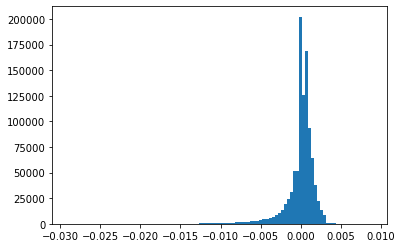

iteration # 1
iteration # 2
iteration # 3
iteration # 4
iteration # 5
iteration # 6
iteration # 7
iteration # 8
iteration # 9
iteration # 10


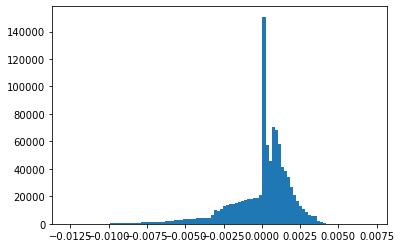

iteration # 11
iteration # 12
iteration # 13
iteration # 14
iteration # 15
iteration # 16
iteration # 17
iteration # 18
iteration # 19
iteration # 20


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: overflow encountered in exp
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in true_divide


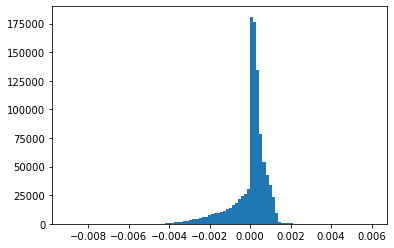

iteration # 21
iteration # 22
iteration # 23
iteration # 24
iteration # 25
iteration # 26
iteration # 27
iteration # 28
iteration # 29
iteration # 30


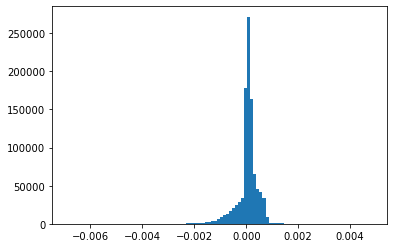

iteration # 31
iteration # 32
iteration # 33
iteration # 34
iteration # 35
iteration # 36
iteration # 37
iteration # 38
iteration # 39
iteration # 40


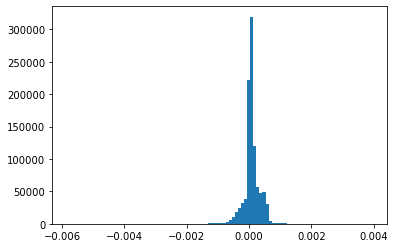

iteration # 41
iteration # 42
iteration # 43
iteration # 44
iteration # 45
iteration # 46
iteration # 47
iteration # 48
iteration # 49
iteration # 50


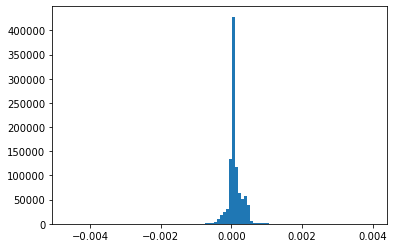

iteration # 51
iteration # 52
iteration # 53
iteration # 54
iteration # 55
iteration # 56
iteration # 57
iteration # 58
iteration # 59
iteration # 60


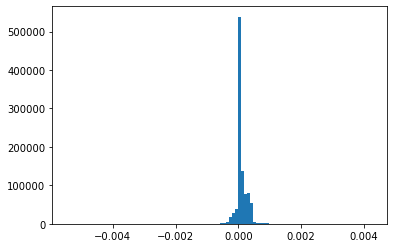

iteration # 61
iteration # 62
iteration # 63
iteration # 64
iteration # 65
iteration # 66
iteration # 67
iteration # 68
iteration # 69
iteration # 70


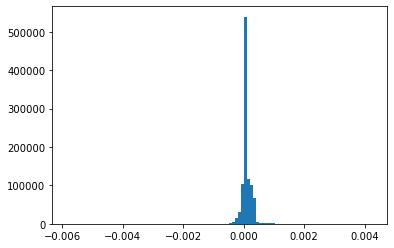

iteration # 71
iteration # 72
iteration # 73
iteration # 74
iteration # 75
iteration # 76
iteration # 77
iteration # 78
iteration # 79
iteration # 80


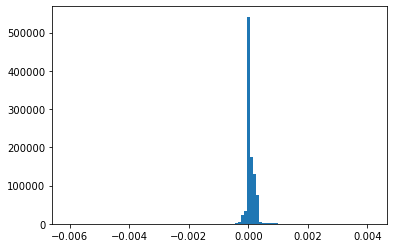

iteration # 81
iteration # 82
iteration # 83
iteration # 84
iteration # 85
iteration # 86
iteration # 87
iteration # 88
iteration # 89
iteration # 90


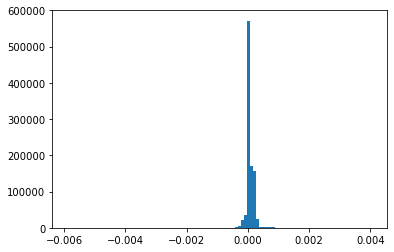

iteration # 91
iteration # 92
iteration # 93
iteration # 94
iteration # 95
iteration # 96
iteration # 97
iteration # 98
iteration # 99
1786.2157740592957  seconds.


In [618]:
import time
starttime = time.time()

solvedIRT = solve_IRT_for_matrix(table, all_thetas = None, iterations = 100, FOUR_PL=True, show_convergence=10)

print(time.time()-starttime, ' seconds.')



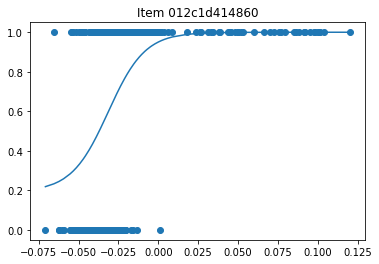

a : 86.7740931058132  b:  -0.031402524312887134  c:  0.19327676331754604
d:  0.9999999999999974


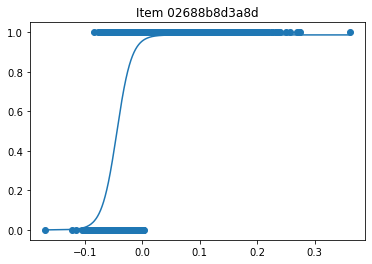

a : 77.5285835649728  b:  -0.044342002649383774  c:  9.644199315343098e-12
d:  0.9864978755580094


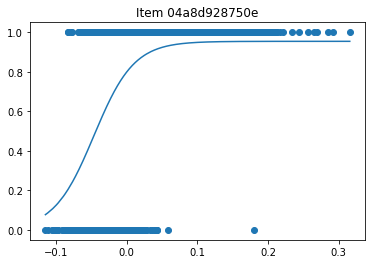

a : 35.369074845432166  b:  -0.046384022749885775  c:  1.6077790193284077e-11
d:  0.9540345625056034


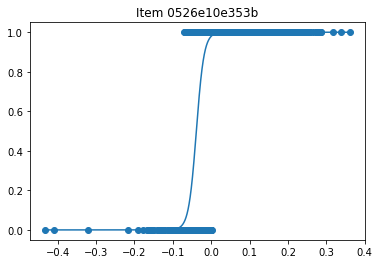

a : 99.99999994374853  b:  -0.03884561724511966  c:  8.86229016154876e-12
d:  0.999999999998614


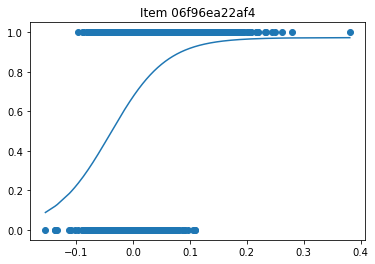

a : 20.235687074275724  b:  -0.040386266404786125  c:  1.0135711449991051e-13
d:  0.9727175208645293


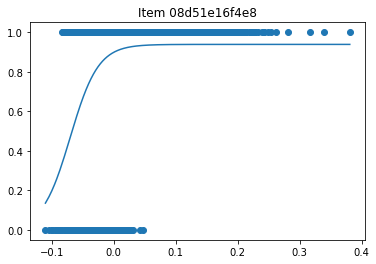

a : 44.36879316480905  b:  -0.06987007536347202  c:  3.1158480488231557e-30
d:  0.9385119000448041


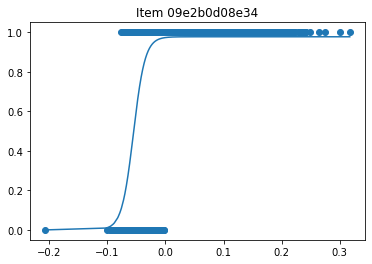

a : 99.99999983779702  b:  -0.05493273530884127  c:  8.280388516482857e-15
d:  0.9770782211508476


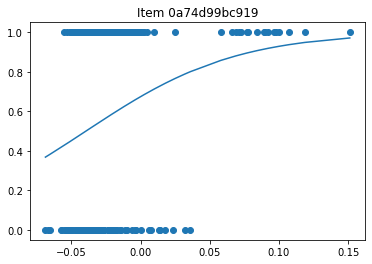

a : 18.425160735992208  b:  -0.039482977310846906  c:  3.1590819354686245e-09
d:  0.9999999997829812


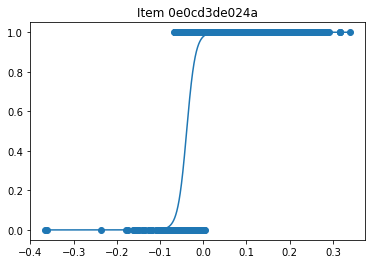

a : 98.85700835563381  b:  -0.03851347497768477  c:  1.5085139077626394e-09
d:  0.9999999999909223


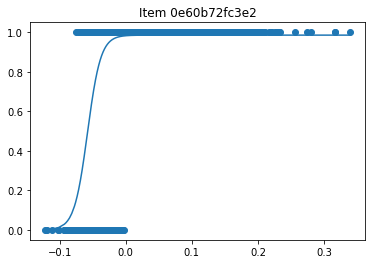

a : 99.99999999993584  b:  -0.057889187117222504  c:  2.168149407864861e-14
d:  0.9854182970739396


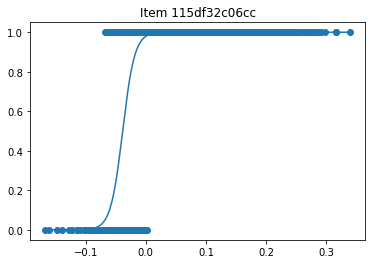

a : 99.99999997960988  b:  -0.03846899051831898  c:  7.195146869620918e-14
d:  0.999999999993235


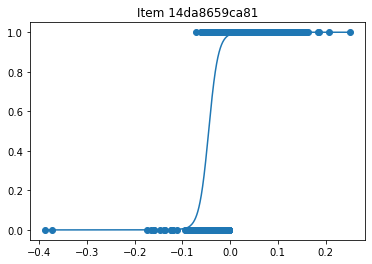

a : 99.99999999932884  b:  -0.045080278537427056  c:  2.6676020017058508e-15
d:  0.999999994773838


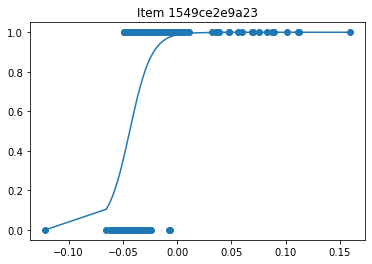

a : 99.9999999991928  b:  -0.04378356988219459  c:  1.189471285872312e-16
d:  0.9999999999963405


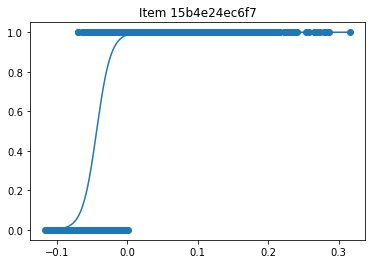

a : 99.99999999617401  b:  -0.04362034493918478  c:  2.0644611309143618e-16
d:  0.999999999940245


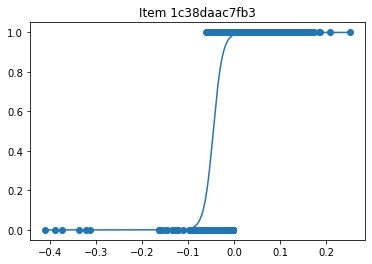

a : 99.99999981266251  b:  -0.04522349291237559  c:  1.6573206640240056e-14
d:  0.9989922836056028


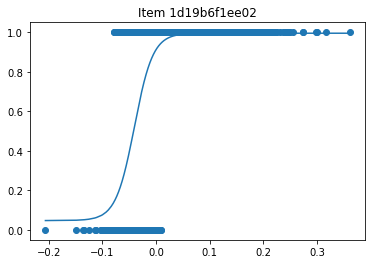

a : 58.00027482136345  b:  -0.040524793878199794  c:  0.0473042482478563
d:  0.9950638603376707


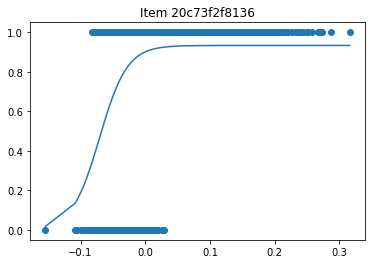

a : 47.04794670269402  b:  -0.07050346925903331  c:  9.886558101548339e-36
d:  0.9331500264946077


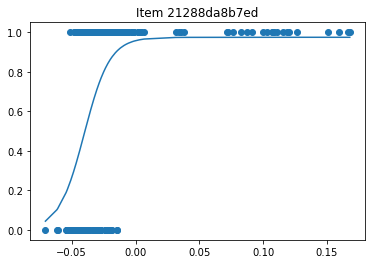

a : 99.99999999999842  b:  -0.04018811331921173  c:  9.319353870359111e-22
d:  0.9744869698721604


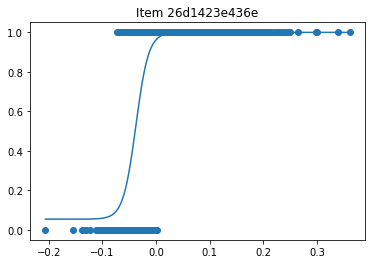

a : 84.7637663354788  b:  -0.03775854838508379  c:  0.05437078024142149
d:  0.9993243799431096


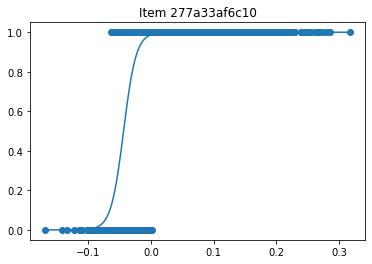

a : 99.99999999550195  b:  -0.04375986946455053  c:  2.5600631314699794e-16
d:  0.9999999996457943


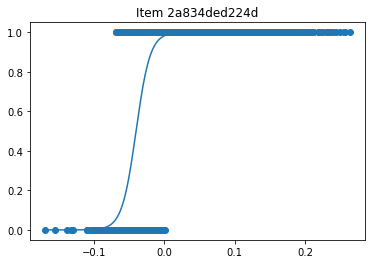

a : 99.99999999999974  b:  -0.0397732284268377  c:  1.3740672241407876e-14
d:  0.9999999999999999


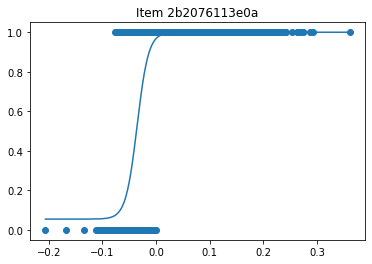

a : 94.74665264946886  b:  -0.0354073511838569  c:  0.05465190297966706
d:  0.999998473066477


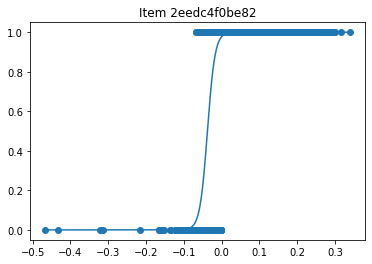

a : 99.99999999638632  b:  -0.037469701286687467  c:  1.4783986216301048e-12
d:  0.9999999999996512


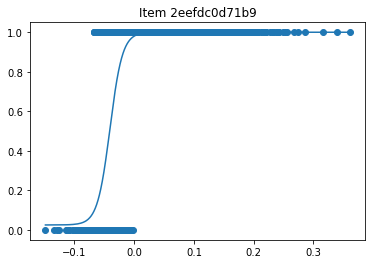

a : 95.74581735183104  b:  -0.0404976756144528  c:  0.02505573318111709
d:  0.9999999963485933


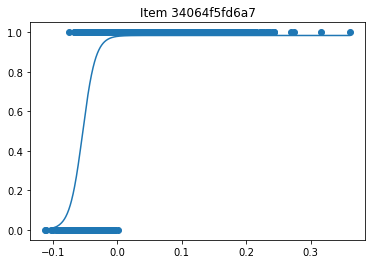

a : 99.99999999999959  b:  -0.0541192832997474  c:  5.134638088908824e-19
d:  0.9836049062546619


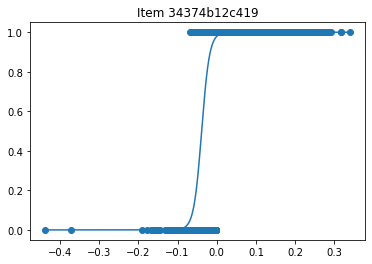

a : 99.99999997861103  b:  -0.038638645771547915  c:  4.0002767755743297e-13
d:  0.9999999999996511


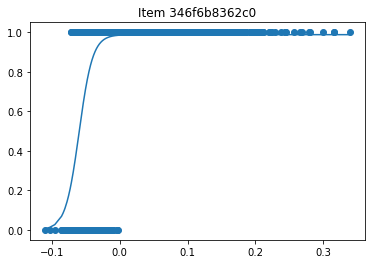

a : 99.9999996919773  b:  -0.06007900226577785  c:  1.195131225449485e-13
d:  0.9877686578847045


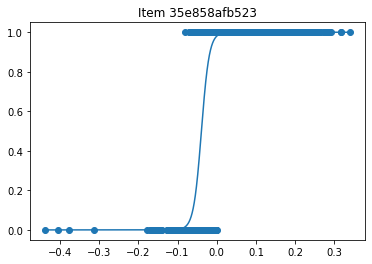

a : 99.99999998251988  b:  -0.03920859153277583  c:  2.9574444057925036e-14
d:  0.9999999999980398


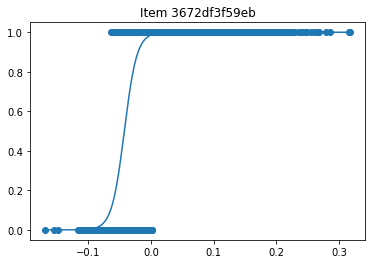

a : 99.99999999993898  b:  -0.04256920823998864  c:  3.758294016247936e-20
d:  0.9999999941671225


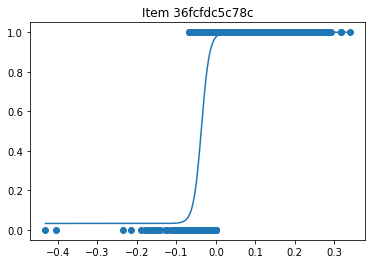

a : 99.9999999933663  b:  -0.03660092690859725  c:  0.03275908255779576
d:  0.9999999999974788


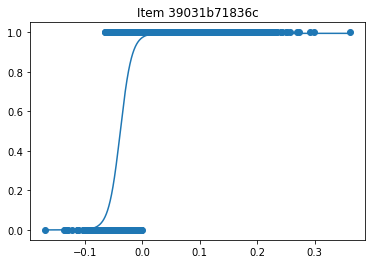

a : 99.99999999998911  b:  -0.03831519551783168  c:  1.5305841989679772e-17
d:  0.9944194709435453


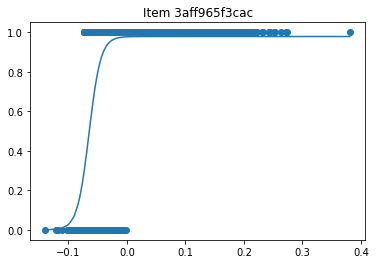

a : 99.99999925487249  b:  -0.06488249172024847  c:  9.093148457111173e-14
d:  0.9783623027745287


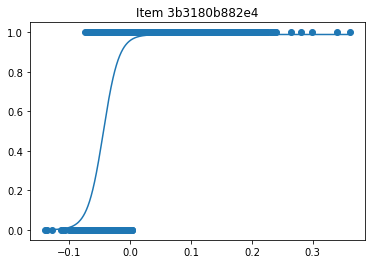

a : 78.06962477160543  b:  -0.04434685733354772  c:  3.4831853988446686e-11
d:  0.9886369872168314


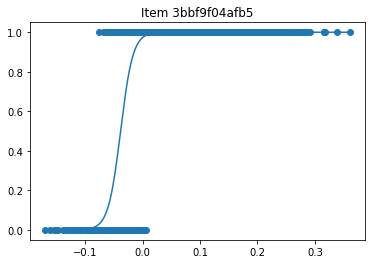

a : 93.27976592729111  b:  -0.038448879410294665  c:  8.099382194410626e-15
d:  0.9999999999999782


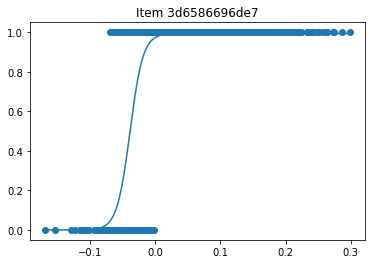

a : 99.99999998986863  b:  -0.038698079810303466  c:  1.089490746189416e-12
d:  0.9933048061277541


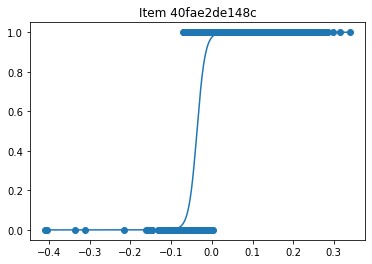

a : 99.99999997704975  b:  -0.03654507291643538  c:  1.4238103357868516e-11
d:  0.9999999999997953


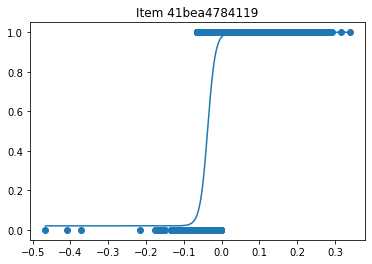

a : 99.9999999298468  b:  -0.036830447312565184  c:  0.02044454645449995
d:  0.9999999999910548


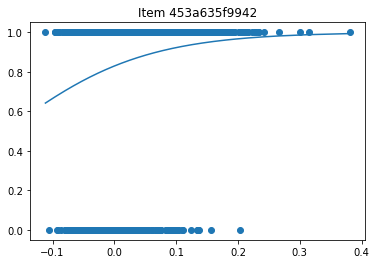

a : 8.942131802674087  b:  -0.17666845224430786  c:  5.329861708671231e-07
d:  0.9999999584437728


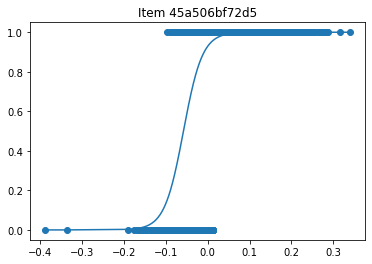

a : 44.45725279637087  b:  -0.057815119377809976  c:  8.758112765255997e-14
d:  0.9999999999439564


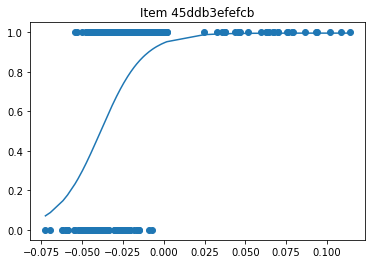

a : 75.91390447368845  b:  -0.038710122562573446  c:  2.246949364048532e-16
d:  0.9956262485563232


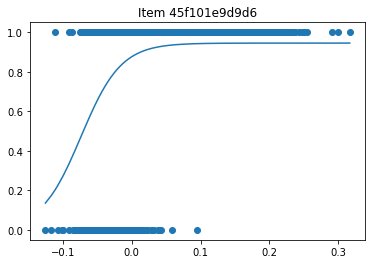

a : 34.4470650998368  b:  -0.07388860561597221  c:  2.2154976633689295e-34
d:  0.9451550304703255


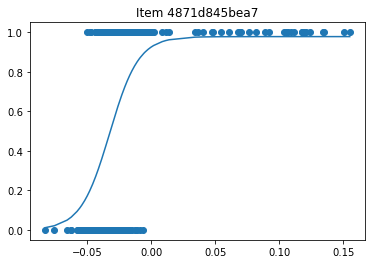

a : 88.20002907139855  b:  -0.03242153222304937  c:  1.6348845477374217e-17
d:  0.9779400360728557


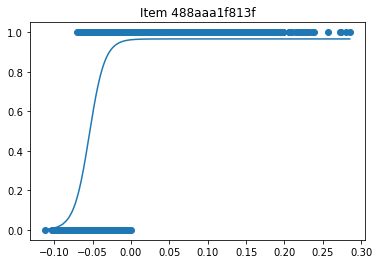

a : 99.99999940713816  b:  -0.05427963263040581  c:  7.156314164737166e-15
d:  0.9661958628094015


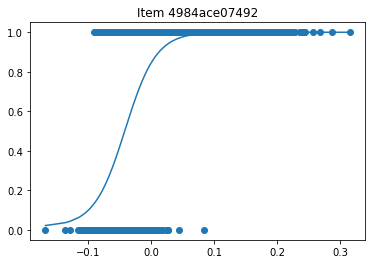

a : 40.59595172508671  b:  -0.04151723153793832  c:  0.016452030051236816
d:  0.9999999999949599


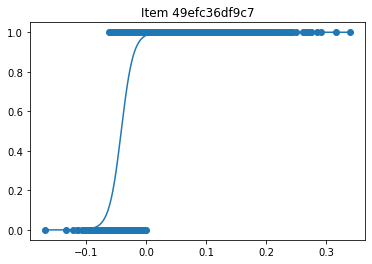

a : 99.99999999979177  b:  -0.04199379601036695  c:  1.2916323154232416e-17
d:  0.9999999999169256


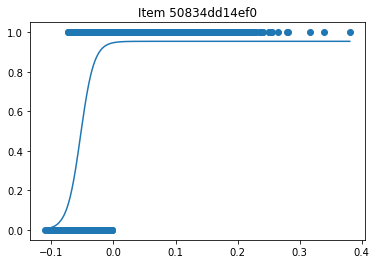

a : 92.79545686865106  b:  -0.05313016551427821  c:  5.749079015996514e-20
d:  0.9541052879061412


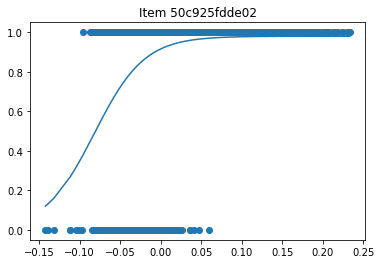

a : 32.49769914700576  b:  -0.08182122995441425  c:  1.1223936388240618e-13
d:  0.9798659934048196


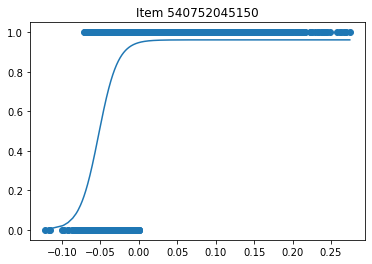

a : 80.80537383848993  b:  -0.05235386900377172  c:  5.182062590267461e-16
d:  0.9614201285232742


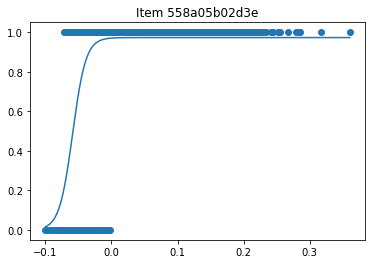

a : 99.999999979301  b:  -0.05889132313810072  c:  2.9051007441599856e-14
d:  0.9730678355818212


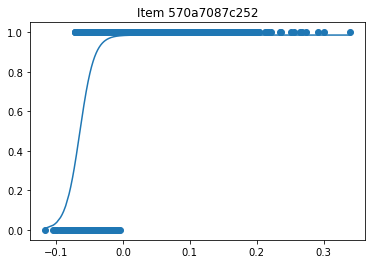

a : 93.14982576029144  b:  -0.06457135156926311  c:  2.2377542707133306e-12
d:  0.9857400716650655


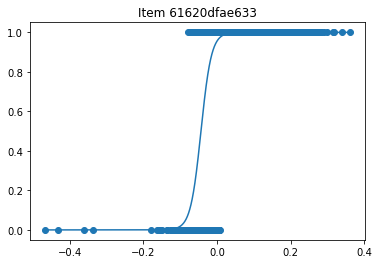

a : 70.49737952266445  b:  -0.04350183148453066  c:  4.478880099834598e-17
d:  0.9993940738774156


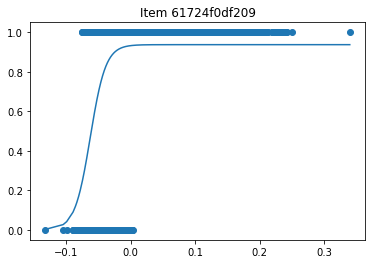

a : 83.92926575984872  b:  -0.06225540370384408  c:  8.298447416921893e-22
d:  0.9371708336709087


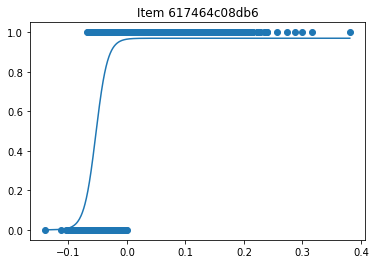

a : 99.9999999999771  b:  -0.053256305589430744  c:  2.8716911798508167e-18
d:  0.9696782349065417


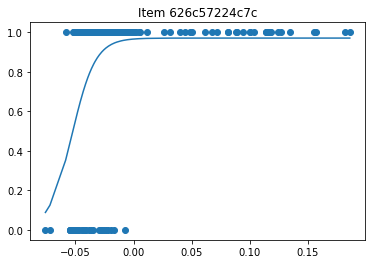

a : 99.9999999881522  b:  -0.05283965183415834  c:  3.010571688146086e-18
d:  0.970493800984272


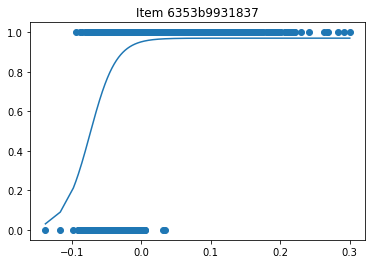

a : 53.2578443088808  b:  -0.07412428102909979  c:  1.1450111477357427e-10
d:  0.9700426946016725


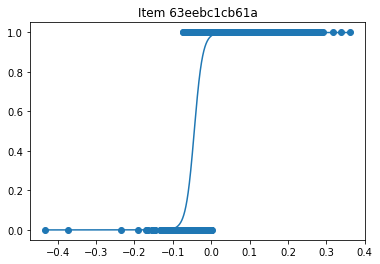

a : 91.51776898760295  b:  -0.044253363898083306  c:  6.23514728900111e-11
d:  0.9986049754715013


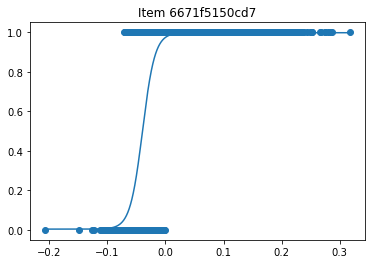

a : 94.06339533222564  b:  -0.039324590072214796  c:  0.004040297618994145
d:  0.99759184041548


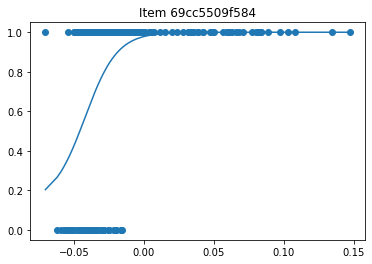

a : 86.8777914017298  b:  -0.04206561943951734  c:  0.1355438543623545
d:  0.9999999994381069


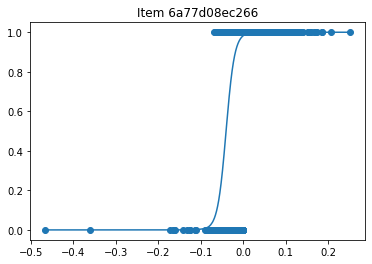

a : 99.99999999694693  b:  -0.0405900053823491  c:  1.8565591396521707e-13
d:  0.9999999999896929


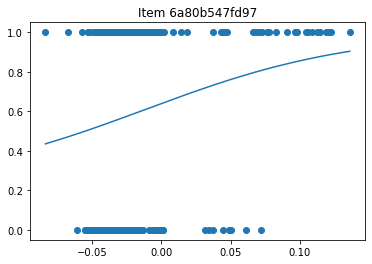

a : 13.331648374848479  b:  -0.011220040892555867  c:  0.21984710364718943
d:  0.9999999999999354


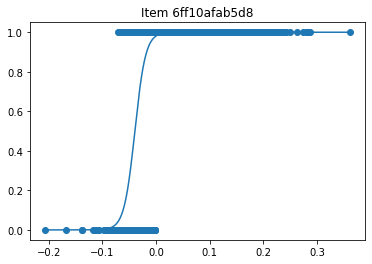

a : 99.99999999781451  b:  -0.039610159290536594  c:  1.1140307830768269e-15
d:  0.9999999973345569


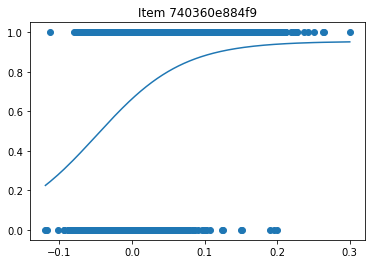

a : 16.741178364207528  b:  -0.04909188970602471  c:  3.552112949828812e-16
d:  0.954089862291092


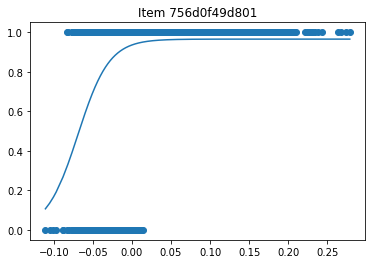

a : 49.954631311702435  b:  -0.0692590029240827  c:  1.5382230220087336e-11
d:  0.9652034500737132


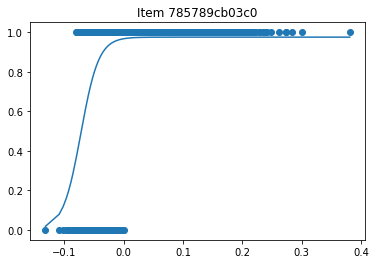

a : 66.53220744584284  b:  -0.07202608024730908  c:  2.2512871789292915e-13
d:  0.9752290205255092


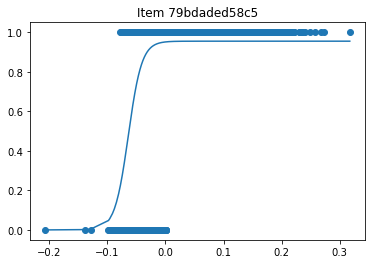

a : 86.42212205617118  b:  -0.06370900041385008  c:  1.5652432697732447e-20
d:  0.954801496876182


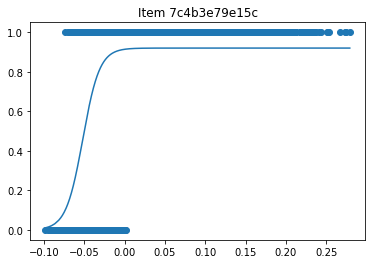

a : 96.51806949694097  b:  -0.05172895348351731  c:  2.722613253626668e-26
d:  0.9199191987090312


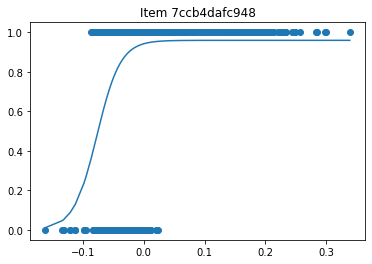

a : 51.952263518605186  b:  -0.07696712356451281  c:  3.4428534322085026e-15
d:  0.9590755796534933


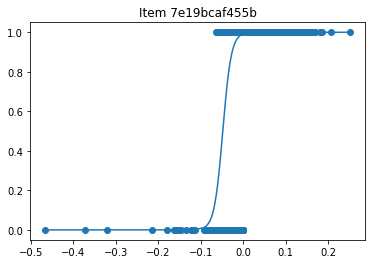

a : 99.99999794157345  b:  -0.04834812510992057  c:  1.3082870642731636e-15
d:  0.9998833651841241


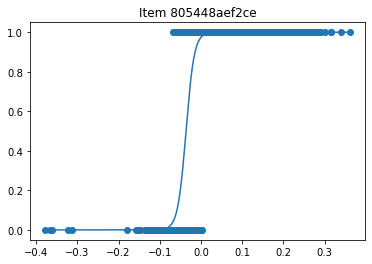

a : 99.999999997487  b:  -0.03640104424496362  c:  1.1368538212040258e-11
d:  0.9999999999999999


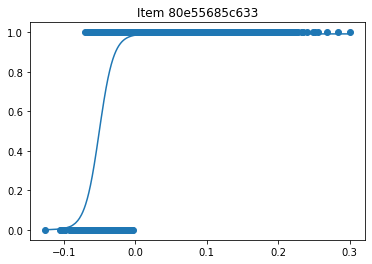

a : 99.99999999996595  b:  -0.05033546256266782  c:  1.0508268499612704e-15
d:  0.9916485008219352


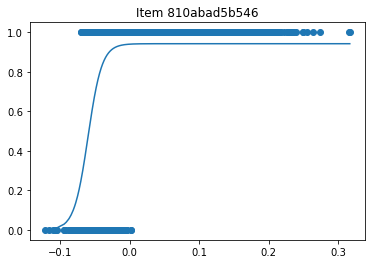

a : 99.99999997713715  b:  -0.06012402769739769  c:  8.736752463700381e-18
d:  0.9420063043352984


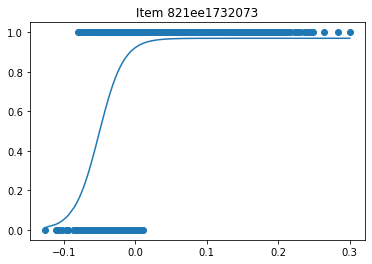

a : 58.327749582045  b:  -0.050822221356145635  c:  3.0996860476162454e-14
d:  0.9694676443600511


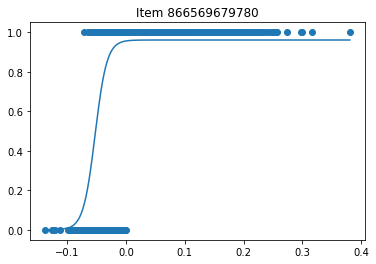

a : 99.99999931282075  b:  -0.05286648710392893  c:  3.554470145968586e-16
d:  0.9607854929736155


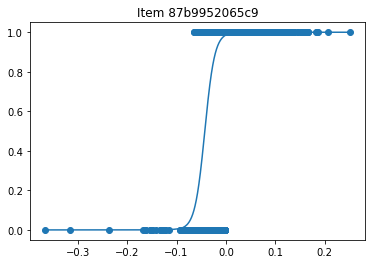

a : 99.99999999646575  b:  -0.04276952430629582  c:  5.613972554428028e-13
d:  0.9999999999562525


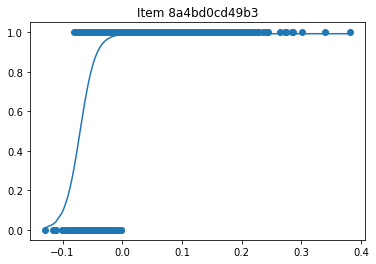

a : 77.70627151497033  b:  -0.07078981416939842  c:  7.79110061451286e-13
d:  0.9926011157410092


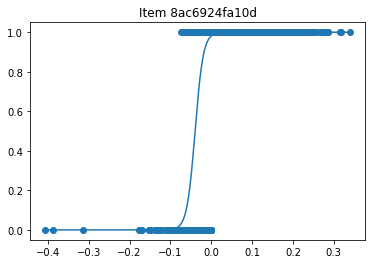

a : 99.9999999958391  b:  -0.039593427479112514  c:  1.027658156508828e-12
d:  0.999999999998724


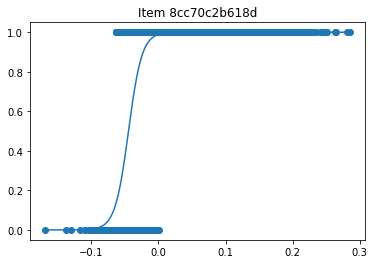

a : 99.99999991734754  b:  -0.04463513791180196  c:  3.944656410954709e-14
d:  0.9999999998180461


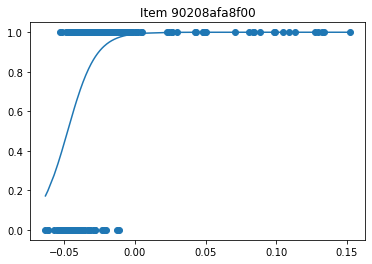

a : 99.99999999904286  b:  -0.04754810756474077  c:  1.8092783260266353e-13
d:  0.9999999999970706


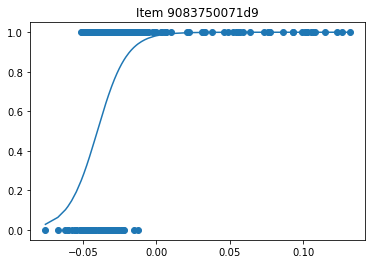

a : 99.9999999322378  b:  -0.040176202322933424  c:  7.382297581076128e-15
d:  0.9999999999326208


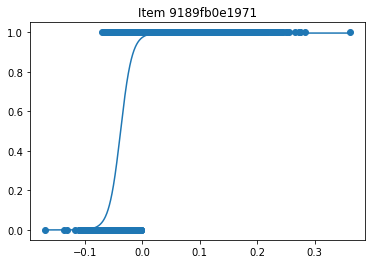

a : 99.99999986109839  b:  -0.03782839251179385  c:  1.437148491923421e-11
d:  0.9958523141035948


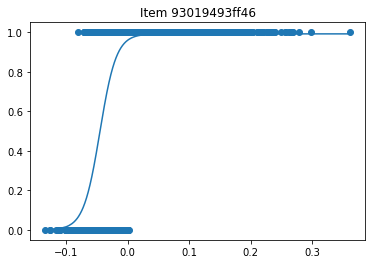

a : 75.19480883046762  b:  -0.045207272237595214  c:  9.679669971278422e-09
d:  0.9917723146965031


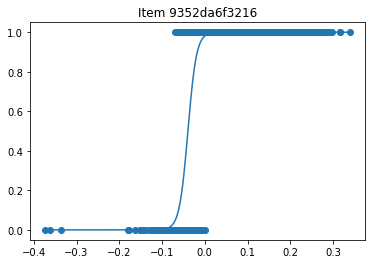

a : 99.99999999678468  b:  -0.03947191232838177  c:  1.028201036796841e-14
d:  0.9999999999973421


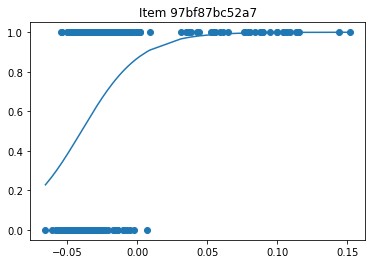

a : 47.28370567095672  b:  -0.039891249440427774  c:  1.655069888294349e-18
d:  0.9999999999578009


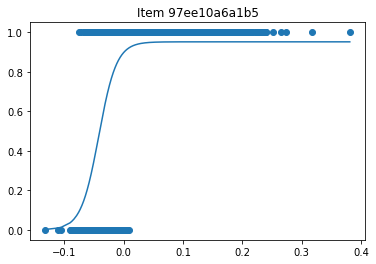

a : 66.94568696729431  b:  -0.04177918255118662  c:  1.6847003031424447e-17
d:  0.9514897536295452


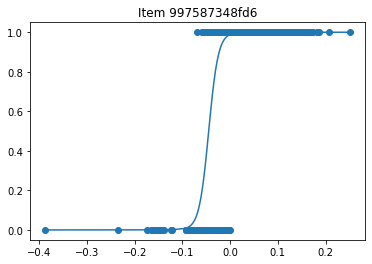

a : 99.99999999866631  b:  -0.04499247023532872  c:  1.0202639275889491e-13
d:  0.9999999952857195


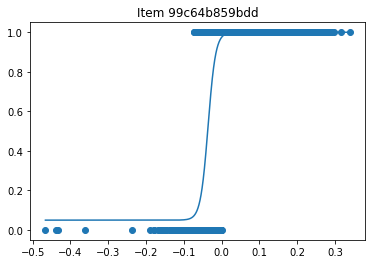

a : 99.99999996975619  b:  -0.035803539141137354  c:  0.04948257678809219
d:  0.9999999999999873


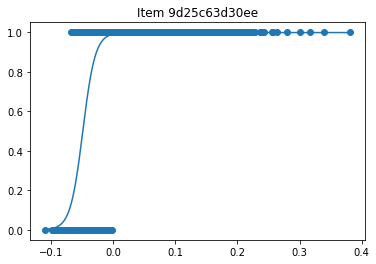

a : 99.99999999860911  b:  -0.049261729339908876  c:  2.243172397477193e-16
d:  0.9983396916887907


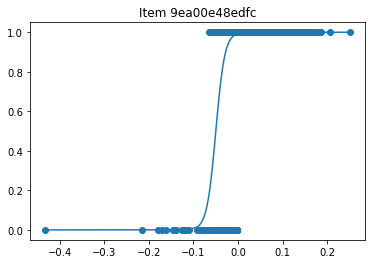

a : 99.99999999963488  b:  -0.049715768834278834  c:  2.6055084350736917e-16
d:  0.999999999995728


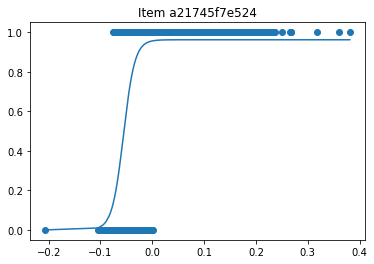

a : 91.73389803058225  b:  -0.0556627304857453  c:  1.9957176484845576e-16
d:  0.9619490675429495


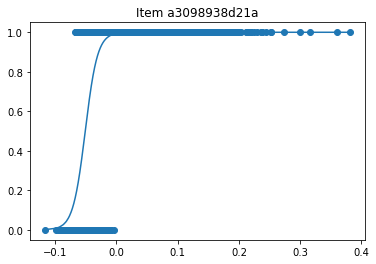

a : 99.99999999878791  b:  -0.050978061592619105  c:  5.1628621956920014e-17
d:  0.9998497257254082


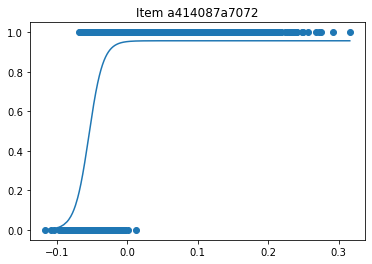

a : 99.9999999516046  b:  -0.05437303069182809  c:  1.9429543358038254e-16
d:  0.9568470291240834


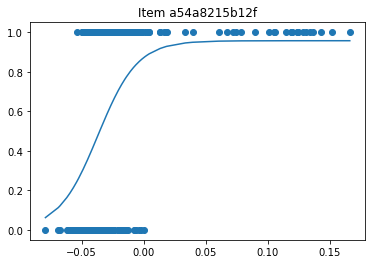

a : 62.95029550291845  b:  -0.03695392210274227  c:  1.2836338176608578e-16
d:  0.9570980931870527


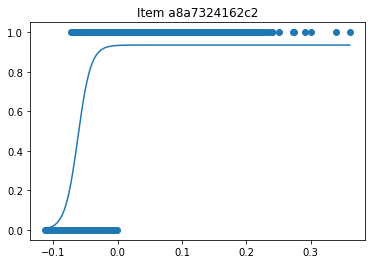

a : 99.76537383905949  b:  -0.06169206837385073  c:  3.964036535906366e-24
d:  0.935245801789215


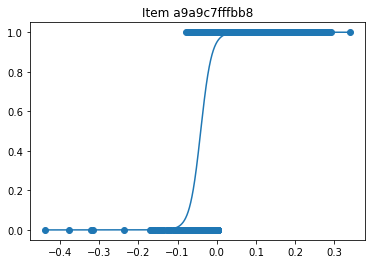

a : 71.47890382246733  b:  -0.04101061896464647  c:  1.8164158604519084e-18
d:  0.9999999998348976


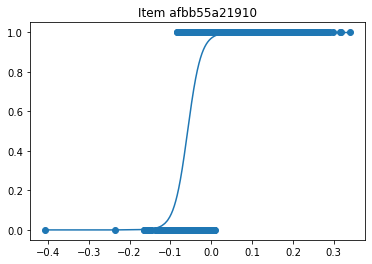

a : 60.635582037130966  b:  -0.05789571612885204  c:  1.67084177101301e-16
d:  0.9986234957447685


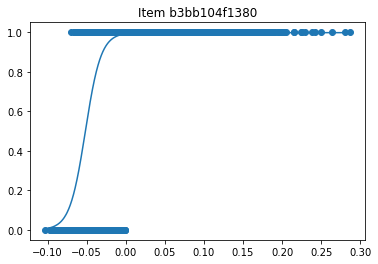

a : 99.99999999912131  b:  -0.051777185964710475  c:  2.800162288874206e-15
d:  0.9979019587538356


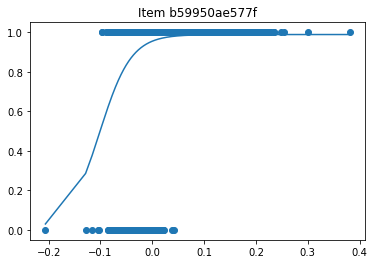

a : 33.00612372079649  b:  -0.10142703243824858  c:  1.2777248098833242e-09
d:  0.9884204464038197


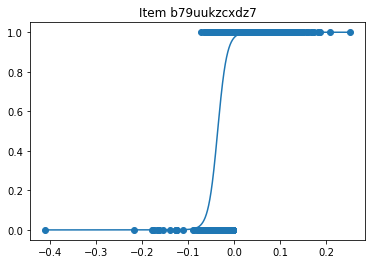

a : 99.99999996347165  b:  -0.035693949878559034  c:  4.827651774371844e-12
d:  0.9999999999699889


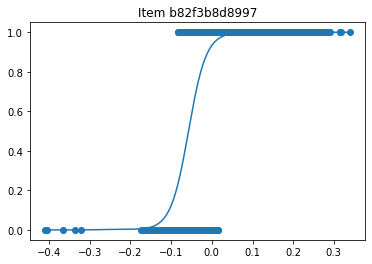

a : 46.03610763242615  b:  -0.05734681970330013  c:  1.7861973111444895e-14
d:  0.999999999938092


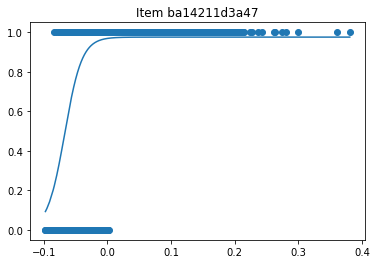

a : 74.22434691624544  b:  -0.06715250858529656  c:  8.176784145170788e-13
d:  0.9753955960656903


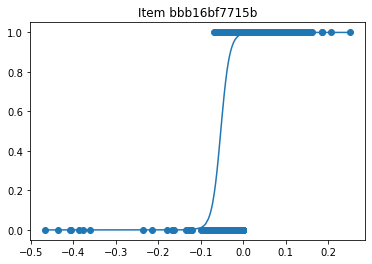

a : 96.72846858657256  b:  -0.05314252206035664  c:  2.9140113222595256e-14
d:  0.9990832180427016


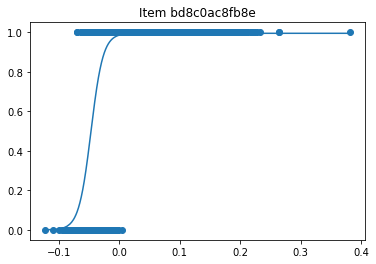

a : 99.99999999241106  b:  -0.04697951672621325  c:  7.935492935227186e-14
d:  0.9946614355677482


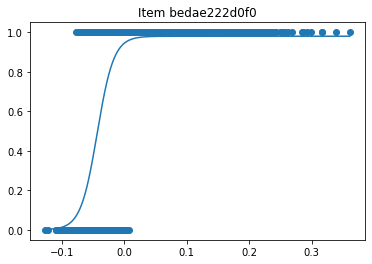

a : 75.70540842384158  b:  -0.04350326121040289  c:  6.459827702537968e-13
d:  0.9798418441424473


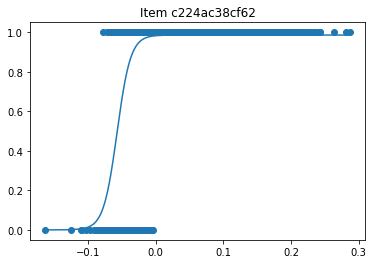

a : 99.9999999752758  b:  -0.057168026762747126  c:  2.221854770375374e-14
d:  0.985787994510077


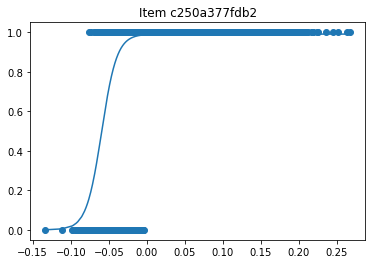

a : 99.99999999518279  b:  -0.05946459262677464  c:  1.3114527315885105e-14
d:  0.9906034908396655


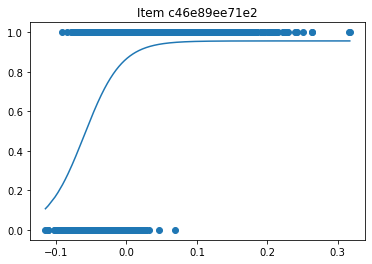

a : 37.61475419308714  b:  -0.06004935451735422  c:  2.624947948657666e-19
d:  0.9560715426249852


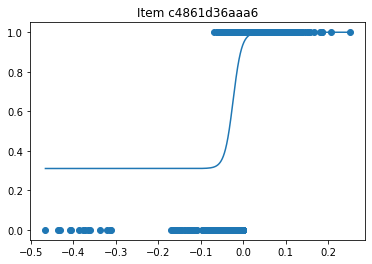

a : 99.99999998611386  b:  -0.024013394340334143  c:  0.3106911915610084
d:  0.9999999999871275


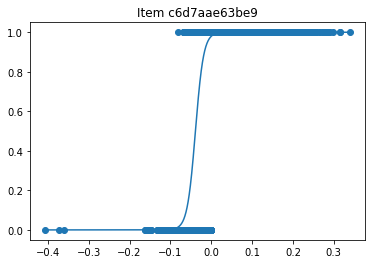

a : 99.99999999966472  b:  -0.03874519955107801  c:  7.24652814274891e-14
d:  0.9999999999999999


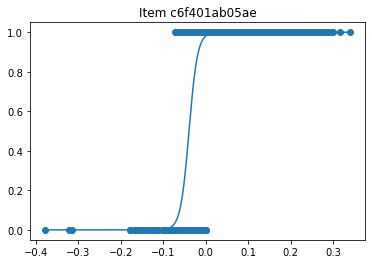

a : 99.99999999985491  b:  -0.039321758057158734  c:  1.650057922091456e-14
d:  0.9999999999996506


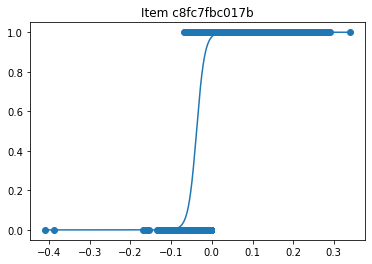

a : 99.99999999218196  b:  -0.037621705437881105  c:  2.4426737517431675e-12
d:  0.999999999998725


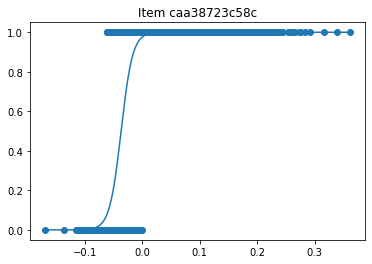

a : 99.9999999998295  b:  -0.03683865020981885  c:  1.7651662509115502e-16
d:  0.9999999999449466


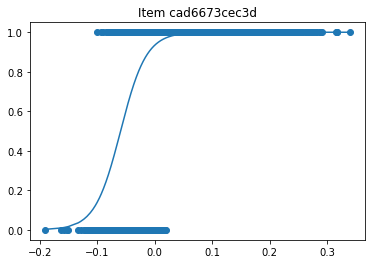

a : 44.738516650539125  b:  -0.05924899476864452  c:  3.9352379410269327e-14
d:  0.9999999964405435


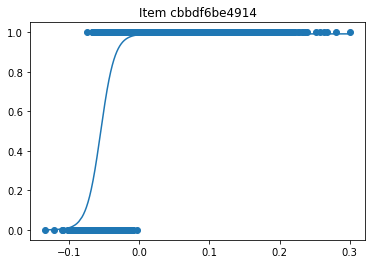

a : 99.99999990423258  b:  -0.05517543250098689  c:  2.4012175345782154e-14
d:  0.9917265443017138


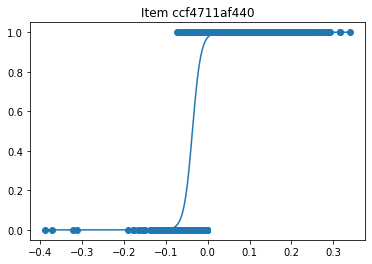

a : 99.4225970989983  b:  -0.03645227791926063  c:  5.380532747245567e-10
d:  0.9999999999698794


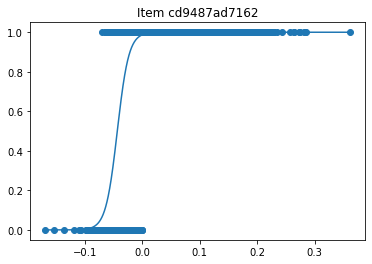

a : 99.9999999992402  b:  -0.04343833265497602  c:  2.901677728443462e-16
d:  0.9999999999988574


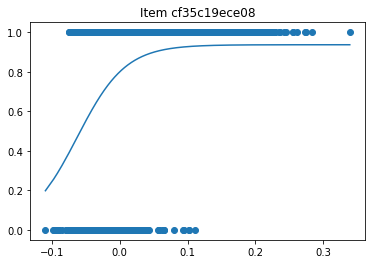

a : 28.109826169918612  b:  -0.06271754662441062  c:  1.687765268063941e-27
d:  0.9367804241049165


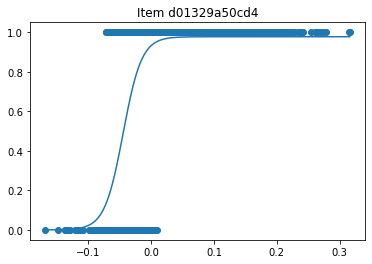

a : 67.88695185762218  b:  -0.044666944841103104  c:  4.136511873767086e-10
d:  0.9773047018441732


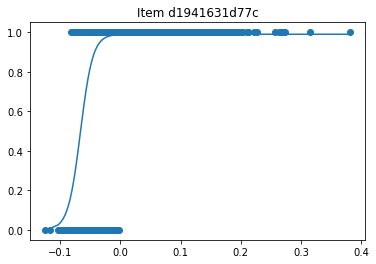

a : 97.6768867052542  b:  -0.06612920326406324  c:  1.0757678551977404e-11
d:  0.9899497148490712


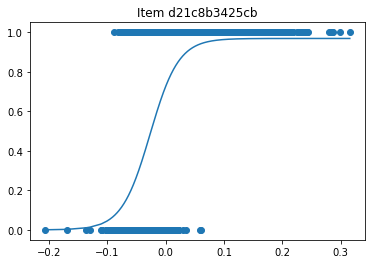

a : 40.96469108317069  b:  -0.026789233126784887  c:  1.5543732043402052e-12
d:  0.9685709496897351


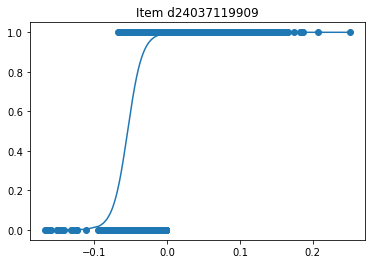

a : 99.99999949561905  b:  -0.054300528143882074  c:  1.0586221223411966e-17
d:  0.9997048461530905


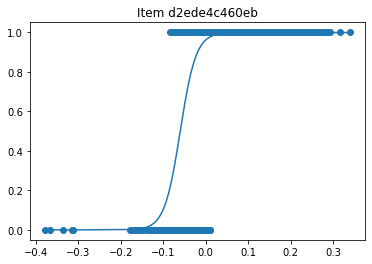

a : 53.899699080712224  b:  -0.05999395239771868  c:  4.0973467169726934e-17
d:  0.9986901589306416


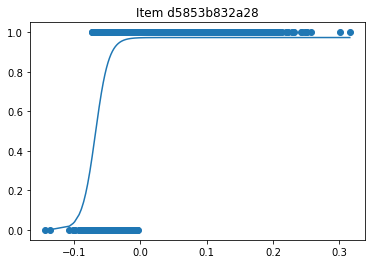

a : 99.99999984578548  b:  -0.06723193857238134  c:  1.0415057009985916e-12
d:  0.9732484770710772


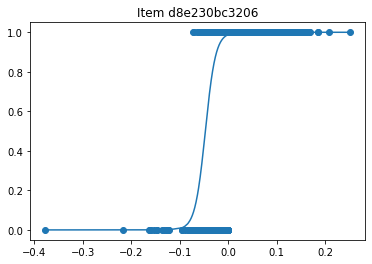

a : 94.26219798433667  b:  -0.047322151904831446  c:  1.8722273143733002e-18
d:  0.9998055467279451


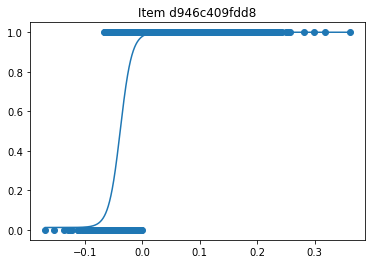

a : 99.99999989343422  b:  -0.03820801644685087  c:  0.012264760893327745
d:  0.99999995365025


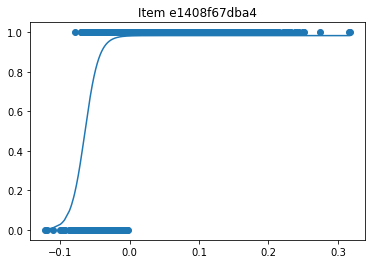

a : 99.9999998594599  b:  -0.06436717800373074  c:  2.8829376397844997e-15
d:  0.9829764200133002


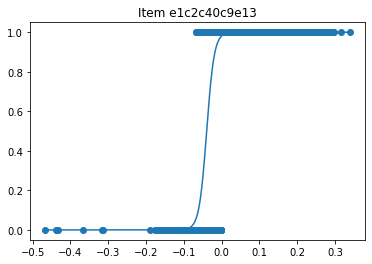

a : 99.99999995292316  b:  -0.03951281771379971  c:  1.0826809398405315e-13
d:  0.9999999999803413


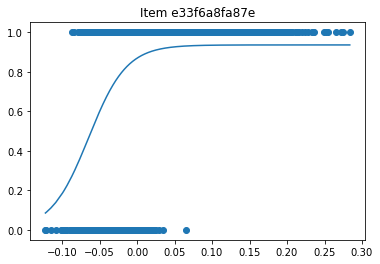

a : 39.75265257526023  b:  -0.06449660418340336  c:  1.534251271451569e-14
d:  0.9357946619038603


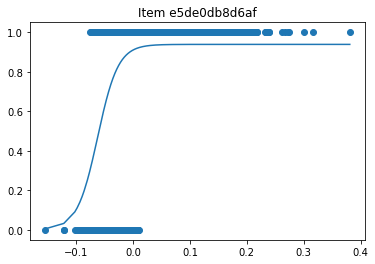

a : 55.59464953739795  b:  -0.06245092839814757  c:  1.781301627684268e-21
d:  0.9385468693672316


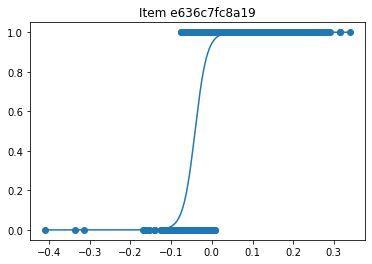

a : 68.55350973872233  b:  -0.04123126887092141  c:  1.6268599413816415e-17
d:  0.999999999437619


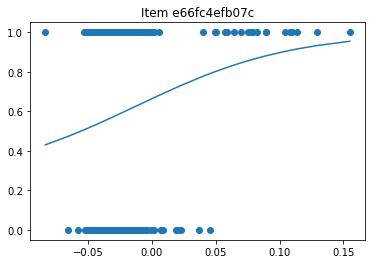

a : 16.29560449708825  b:  -0.012761200904715945  c:  0.2507953042172331
d:  0.9999999999999999


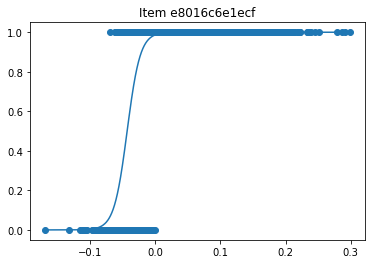

a : 99.99999999930901  b:  -0.04305003958708697  c:  2.61838398759804e-16
d:  0.9999999999991106


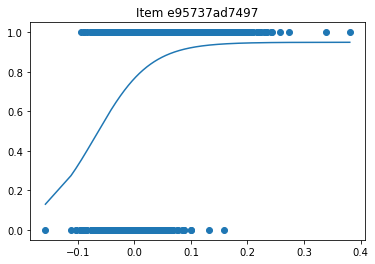

a : 20.785340583658165  b:  -0.06890316016396902  c:  3.2306384713069434e-20
d:  0.94925451858102


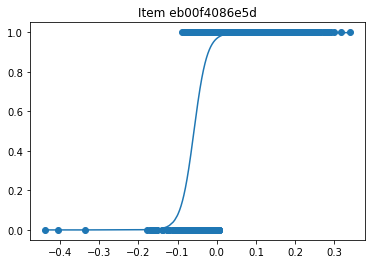

a : 60.05189081384537  b:  -0.05827225594911602  c:  3.6819589436061867e-16
d:  0.9979504466363194


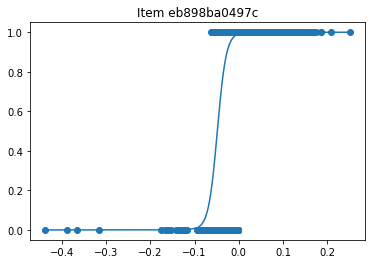

a : 99.99999999998278  b:  -0.048540403584892255  c:  2.0607369249972818e-16
d:  0.9999999999999384


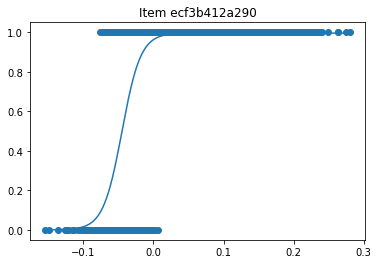

a : 74.831568566679  b:  -0.044994511373959795  c:  1.5244799384520467e-11
d:  0.9956615937508545


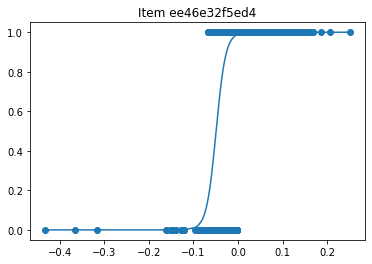

a : 93.40768700238598  b:  -0.049066772830719814  c:  4.513472361278923e-19
d:  0.9999999999997297


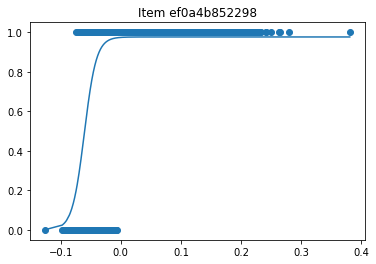

a : 99.99999999274432  b:  -0.06086367284814764  c:  5.928513145401317e-15
d:  0.9761400502561381


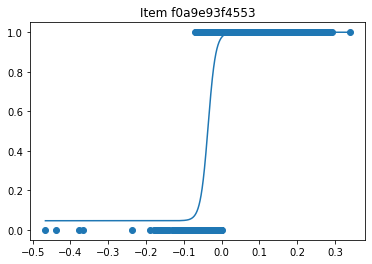

a : 99.999999941399  b:  -0.0357664522721627  c:  0.04645464740360973
d:  0.9999999999997078


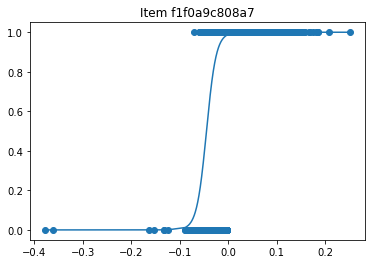

a : 99.9999999999764  b:  -0.04497510943808724  c:  7.832450472290712e-17
d:  0.9999999950989509


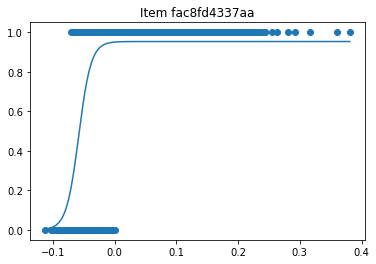

a : 99.99999999994057  b:  -0.057989337447583035  c:  2.10610665524262e-15
d:  0.9530589509744194


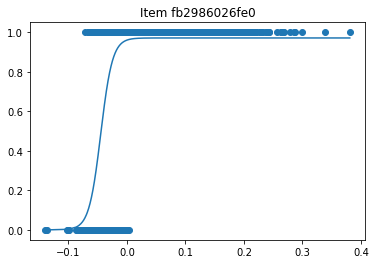

a : 99.99999946306095  b:  -0.0448660283190504  c:  3.821808975055359e-15
d:  0.971087260907019


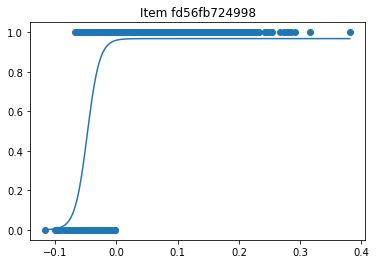

a : 99.9999999209271  b:  -0.04770991151445253  c:  4.28831201456414e-15
d:  0.9678357345516874


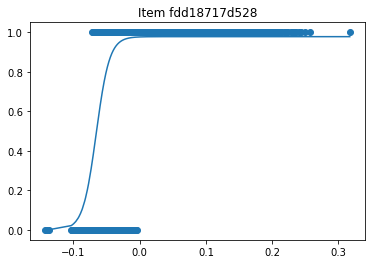

a : 99.99999985406228  b:  -0.0656767842930868  c:  9.204325942542413e-14
d:  0.9776606721605162


In [624]:
for item_num in range(len(table.columns)):
    if ~np.isnan(solvedIRT.est_params[0][item_num]):
        plot_item_with_model(solvedIRT.thetas, item_num, table, [i[item_num] for i in solvedIRT.est_params[:-1]])



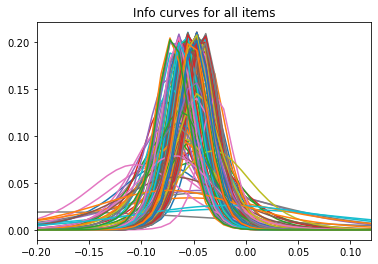

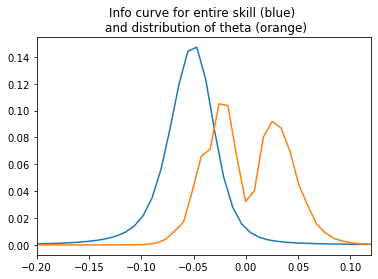

In [956]:
plot_information_curves(table,solvedIRT.thetas, solvedIRT.est_params[:-1], [-.20,0.12])



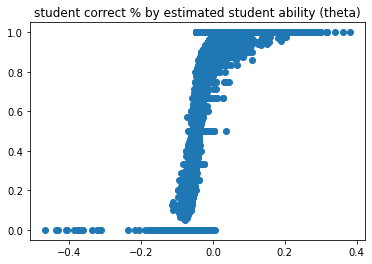

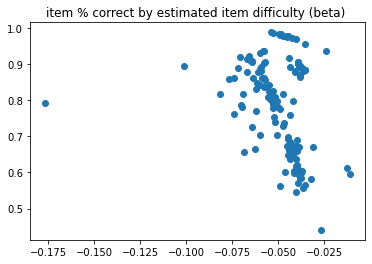

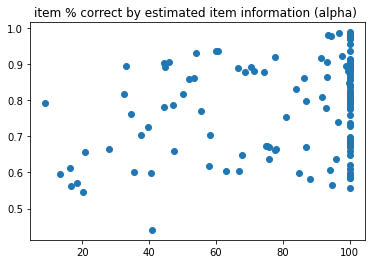

In [957]:
plt.title("student correct % by estimated student ability (theta)")
plt.scatter(solvedIRT.thetas, solvedIRT.item_correct)
plt.show()



plt.title("item % correct by estimated item difficulty (beta) ")
plt.scatter(solvedIRT.est_params[1], solvedIRT.student_correct)
plt.show()

plt.title("item % correct by estimated item information (alpha) ")
plt.scatter(solvedIRT.est_params[0], solvedIRT.student_correct)
plt.show()




In [722]:
#all items sorted by beta
#item id, estimated beta, actual % correct, number of answers
[i for i in zip(table.columns[np.argsort(solvedIRT.est_params[1])], solvedIRT.est_params[1][np.argsort(solvedIRT.est_params[1])], solvedIRT.student_correct[np.argsort(solvedIRT.est_params[1])], solvedIRT.student_power[np.argsort(solvedIRT.est_params[1])])]

[('453a635f9942', -0.17666845224430786, 0.7923545597484277, 10176),
 ('b59950ae577f', -0.10142703243824858, 0.8946333792018871, 10174),
 ('50c925fdde02', -0.08182122995441425, 0.8156619499903082, 10318),
 ('7ccb4dafc948', -0.07696712356451281, 0.8579083151418933, 10078),
 ('6353b9931837', -0.07412428102909979, 0.8601878977674513, 9899),
 ('45f101e9d9d6', -0.07388860561597221, 0.762124248496994, 9980),
 ('785789cb03c0', -0.07202608024730908, 0.8892591140729126, 10204),
 ('8a4bd0cd49b3', -0.07078981416939842, 0.9204655674102813, 10310),
 ('20c73f2f8136', -0.07050346925903331, 0.7876495245884879, 9781),
 ('08d51e16f4e8', -0.06987007536347202, 0.7797383632491633, 9861),
 ('756d0f49d801', -0.0692590029240827, 0.8163265306122449, 9996),
 ('e95737ad7497', -0.06890316016396902, 0.6569313457053038, 9861),
 ('d5853b832a28', -0.06723193857238134, 0.9144897759514724, 10221),
 ('ba14211d3a47', -0.06715250858529656, 0.8778361240463688, 10093),
 ('d1941631d77c', -0.06612920326406324, 0.92262135922330

In [723]:
#all items sorted by alpha
#item id, estimated alpha, actual % correct, number of answers
[i for i in zip(table.columns[np.argsort(solvedIRT.est_params[0])], solvedIRT.est_params[0][np.argsort(solvedIRT.est_params[1])], solvedIRT.student_correct[np.argsort(solvedIRT.est_params[0])], solvedIRT.student_power[np.argsort(solvedIRT.est_params[0])])]

[('453a635f9942', 8.942131802674087, 0.7923545597484277, 10176),
 ('6a80b547fd97', 33.00612372079649, 0.5970149253731343, 268),
 ('e66fc4efb07c', 32.49769914700576, 0.611764705882353, 255),
 ('740360e884f9', 51.952263518605186, 0.5617030028794735, 9724),
 ('0a74d99bc919', 53.2578443088808, 0.5714285714285714, 252),
 ('06f96ea22af4', 34.4470650998368, 0.5452751817237799, 9630),
 ('e95737ad7497', 66.53220744584284, 0.6569313457053038, 9861),
 ('cf35c19ece08', 77.70627151497033, 0.6649300234957606, 9789),
 ('50c925fdde02', 47.04794670269402, 0.8156619499903082, 10318),
 ('b59950ae577f', 44.36879316480905, 0.8946333792018871, 10174),
 ('45f101e9d9d6', 49.954631311702435, 0.762124248496994, 9980),
 ('04a8d928750e', 20.785340583658165, 0.6021336987373984, 10217),
 ('c46e89ee71e2', 99.99999984578548, 0.7040974300753432, 9689),
 ('e33f6a8fa87e', 74.22434691624544, 0.7252211039951204, 9837),
 ('4984ace07492', 97.6768867052542, 0.5979576655170081, 14787),
 ('d21c8b3425cb', 99.99999985406228, 0.4

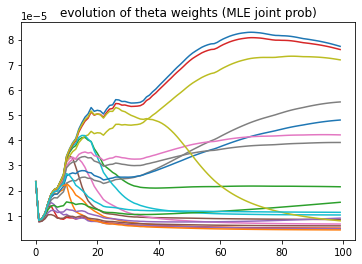

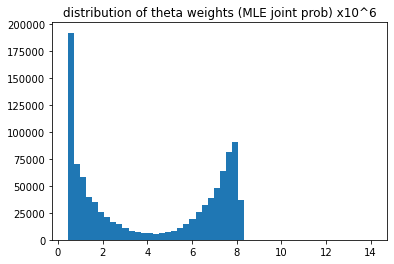

0.43106853201631173
14.065936077074914


In [746]:
plt.title('evolution of theta weights (MLE joint prob)')
plt.plot(solvedIRT.theta_confidence_hx[:,np.random.choice(np.shape(solvedIRT.theta_confidence_hx)[1],20)])
plt.show()

plt.title('distribution of theta weights (MLE joint prob) x10^6')
plt.hist(100000*solvedIRT.theta_confidence_hx[-1,np.isfinite(solvedIRT.theta_confidence_hx[-1,:])],bins=50)
plt.show()

print(min(100000*solvedIRT.theta_confidence_hx[-1,np.isfinite(solvedIRT.theta_confidence_hx[-1,:])]))
print(max(100000*solvedIRT.theta_confidence_hx[-1,np.isfinite(solvedIRT.theta_confidence_hx[-1,:])]))




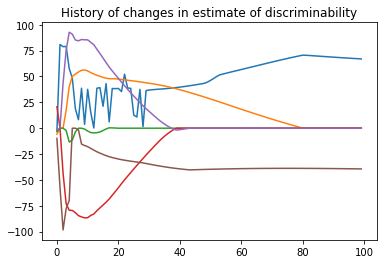

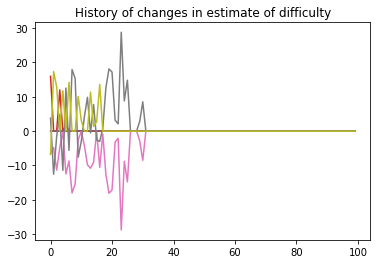

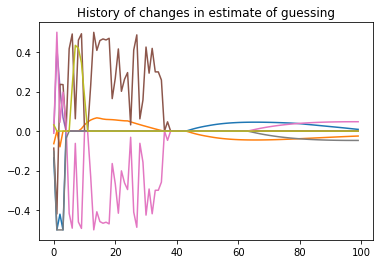

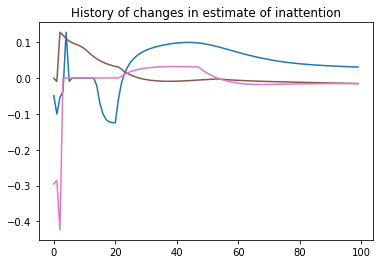

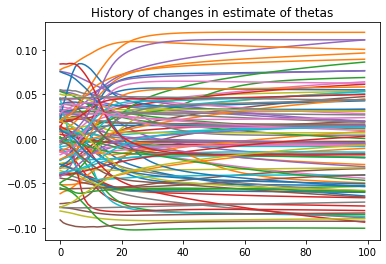

In [945]:



plot_parameter_convergence(solvedIRT, sample_of_items = 10,sample_of_students = 100)




In [735]:
all_theta_confidence_hx[-1,:]

array([inf, inf, inf, ..., inf, inf, inf])

In [ ]:
import time
starttime = time.time()

solvedIRT_p = solve_IRT_for_matrix(table, all_thetas = None, iterations = 50, FOUR_PL=True, show_convergence=10)

print(time.time()-starttime, ' seconds.')


In [576]:
#test repeated measurements

indx = ~np.isnan(table.values)
participant_samples = np.sum(indx,1)

sum(participant_samples>10), sum(participant_samples<=10)


(394816, 604320)

In [577]:
#select 10% of indices
exclude_vals_indx = np.random.choice(len(np.argwhere(indx)), int(.1*len(np.argwhere(indx))))

#first table has 90%, second table has other 10%

first_table = table.copy()
second_table = table.copy()
second_table.loc[:,:] = np.nan

for i,j in np.argwhere(indx)[exclude_vals_indx]:
    first_table.iloc[i,j]=np.nan
    second_table.iloc[i,j]=table.iloc[i,j]
    #[table.values[i,j] ]


In [578]:
np.nansum(np.nansum(first_table)), np.nansum(np.nansum(table))




(9187642.0, 10154014.0)

iteration # 0


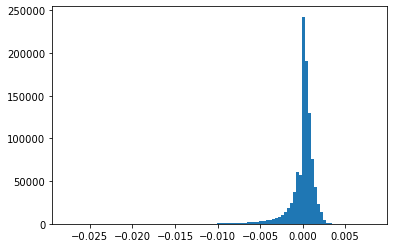

iteration # 1
iteration # 2
iteration # 3
iteration # 4
iteration # 5
iteration # 6
iteration # 7
iteration # 8


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: overflow encountered in exp
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in true_divide


iteration # 9
iteration # 10


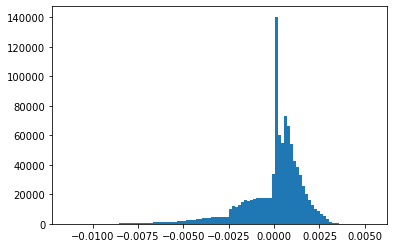

iteration # 11
iteration # 12
iteration # 13
iteration # 14
iteration # 15
iteration # 16
iteration # 17
iteration # 18
iteration # 19
iteration # 20


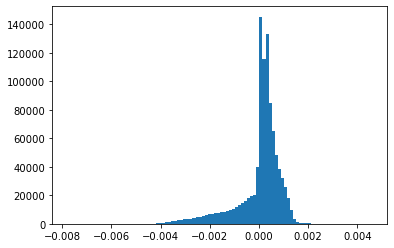

iteration # 21
iteration # 22
iteration # 23
iteration # 24
iteration # 25
iteration # 26
iteration # 27
iteration # 28
iteration # 29
iteration # 30


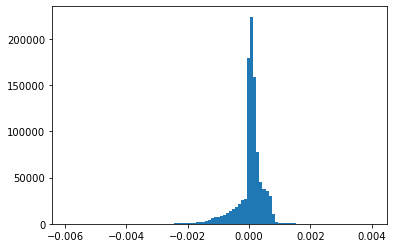

iteration # 31
iteration # 32
iteration # 33
iteration # 34
iteration # 35
iteration # 36
iteration # 37
iteration # 38
iteration # 39
iteration # 40


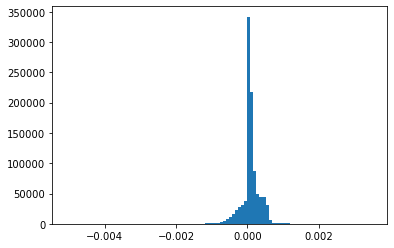

iteration # 41
iteration # 42
iteration # 43
iteration # 44
iteration # 45
iteration # 46
iteration # 48
iteration # 49
794.7968459129333  seconds.


In [ ]:
#run 90% of data
import time
starttime = time.time()

solvedIRT_p = solve_IRT_for_matrix(first_table, all_thetas = None, iterations = 50, FOUR_PL=True, show_convergence=10)

print(time.time()-starttime, ' seconds.')



In [580]:
#90% data compared to %100
A = solvedIRT_p.thetas
B = solvedIRT_1.thetas
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])

A = solvedIRT_p.est_params[0]
B = solvedIRT_1.est_params[0]
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])

A = solvedIRT_p.est_params[1]
B = solvedIRT_1.est_params[1]
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])


0.7141856291713402
0.9165413443637974
0.9118205277637795


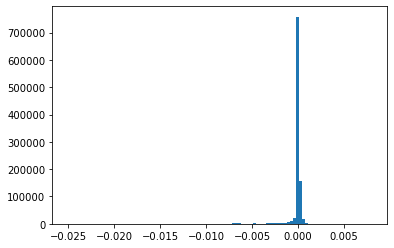

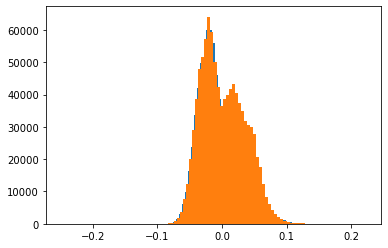

0.9997408607185202
0.7182055794838431


In [598]:
#update thetas using 'new' 10% only
#save thetas from 90% run
saved_thetas = solvedIRT_p.thetas[:]
#update thetas with new data from second table


plt.hist(all_delta_thetas,bins=100)
plt.show()


plt.hist(saved_thetas,bins=100)
plt.hist(solvedIRT_p.thetas,bins=100)
plt.show()


#90% data compared to updated with %90+%10
A = saved_thetas
B = solvedIRT_p.thetas
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])


#90% +10% data compared to %100
A = saved_thetas
B = solvedIRT_1.thetas
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])



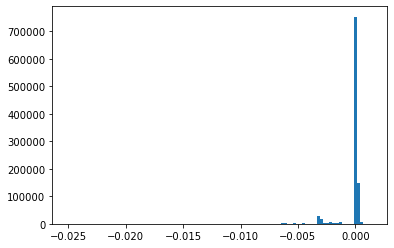

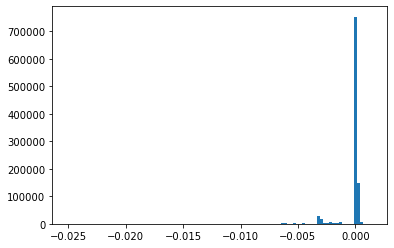

0.21894501311466735
0.31471716908385117


In [600]:
#update thetas using 'new' 10% only starting with NO thetas
#save thetas from 90% run
saved_thetas = np.zeros(len(solvedIRT_p.thetas[:]))
#update thetas with new data from second table

model=four_param_logistic

all_params = zip(solvedIRT_p.est_params[0],solvedIRT_p.est_params[1],solvedIRT_p.est_params[2],solvedIRT_p.est_params[3])
all_probs=prob_est(saved_thetas,model,all_params) #returns #items by #users

all_delta_thetas = update_thetas(solvedIRT_p.est_params[:-1],second_table,all_probs)
saved_thetas = np.nansum([saved_thetas, all_delta_thetas],0)

plt.hist(all_delta_thetas,bins=100)
plt.show()


plt.hist(saved_thetas,bins=100)
# plt.hist(solvedIRT_p.thetas,bins=100)
plt.show()


#90% data compared to updated with %90+%10
A = saved_thetas
B = solvedIRT_p.thetas
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])


#90% +10% data compared to %100
A = saved_thetas
B = solvedIRT_1.thetas
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])





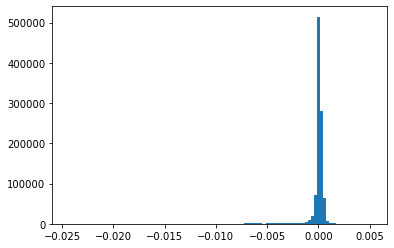

In [595]:
#update thetas using 100% (but freezing item parameters)
#save thetas from 90% run
thetas_from_90 = solvedIRT_p.thetas[:]
#update thetas with new data from second table

model=four_param_logistic

all_params = zip(solvedIRT_p.est_params[0],solvedIRT_p.est_params[1],solvedIRT_p.est_params[2],solvedIRT_p.est_params[3])
all_probs=prob_est(thetas_from_90,model,all_params) #returns #items by #users

all_delta_thetas = update_thetas(solvedIRT_p.est_params[:-1],table,all_probs)
thetas_from_90 = np.nansum([thetas_from_90, all_delta_thetas],0)

plt.hist(all_delta_thetas,bins=100)
plt.show()



In [596]:
#90% +10% data compared to %100
A = thetas_from_90
B = solvedIRT_1.thetas
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])




0.7198950986505241


In [ ]:
#run 10% of data
import time
starttime = time.time()

solvedIRT_p_2 = solve_IRT_for_matrix(first_table, all_thetas = None, iterations = 50, FOUR_PL=True, show_convergence=10)

print(time.time()-starttime, ' seconds.')




iteration # 0


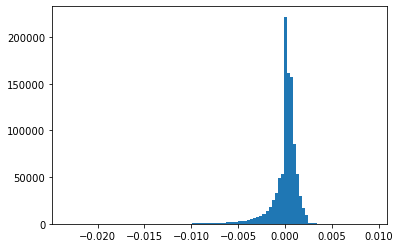

iteration # 1
iteration # 2


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: overflow encountered in exp
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in true_divide


iteration # 3
iteration # 4
iteration # 5
iteration # 6
iteration # 7
iteration # 8
iteration # 9
iteration # 10


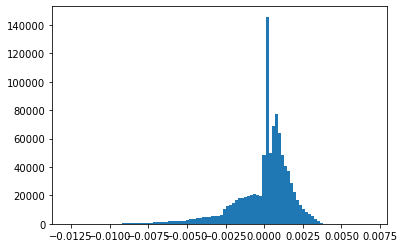

iteration # 11
iteration # 12
iteration # 13
iteration # 14
iteration # 15
iteration # 16
iteration # 17
iteration # 18
iteration # 19
iteration # 20


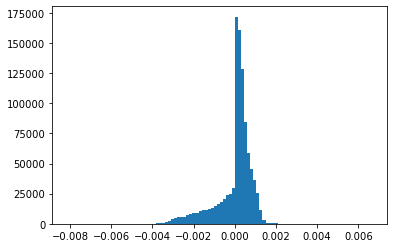

iteration # 21
iteration # 22
iteration # 23
iteration # 24
iteration # 25
iteration # 26
iteration # 27
iteration # 28
iteration # 29
iteration # 30


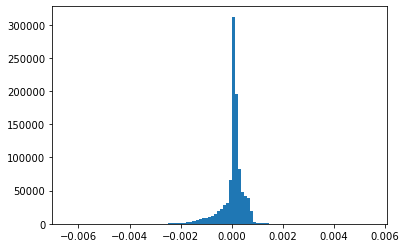

iteration # 31
iteration # 32
iteration # 33
iteration # 34
iteration # 35
iteration # 36
iteration # 37
iteration # 38
iteration # 39
iteration # 40


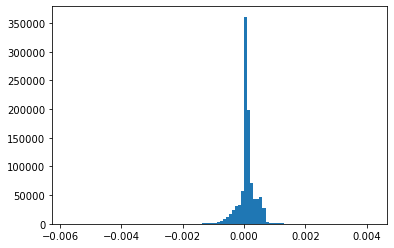

iteration # 41
iteration # 42
iteration # 43
iteration # 44
iteration # 45
iteration # 46
iteration # 47
iteration # 48
iteration # 49
877.2542135715485  seconds.


In [509]:
import time
starttime = time.time()

solvedIRT_1 = solve_IRT_for_matrix(table, all_thetas = None, iterations = 50, FOUR_PL=True, show_convergence=10)

print(time.time()-starttime, ' seconds.')

iteration # 0


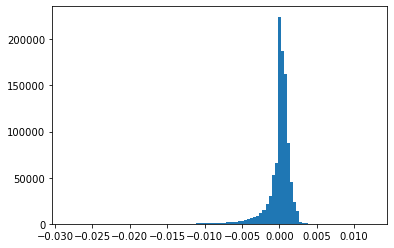

iteration # 1
iteration # 2
iteration # 3
iteration # 4
iteration # 5
iteration # 6
iteration # 7
iteration # 8
iteration # 9
iteration # 10


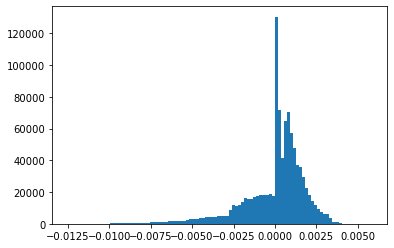

iteration # 11
iteration # 12
iteration # 13
iteration # 14
iteration # 15
iteration # 16
iteration # 17
iteration # 18
iteration # 19
iteration # 20


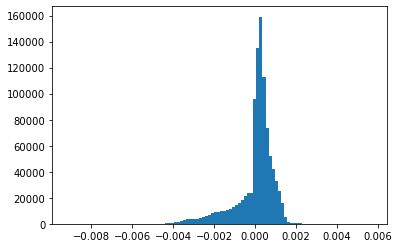

iteration # 21
iteration # 22
iteration # 23
iteration # 24
iteration # 25
iteration # 26
iteration # 27
iteration # 28
iteration # 29
iteration # 30


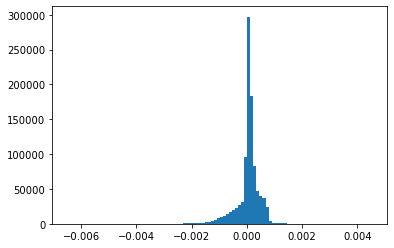

iteration # 31
iteration # 32
iteration # 33
iteration # 34
iteration # 35
iteration # 36
iteration # 37
iteration # 38
iteration # 39
iteration # 40


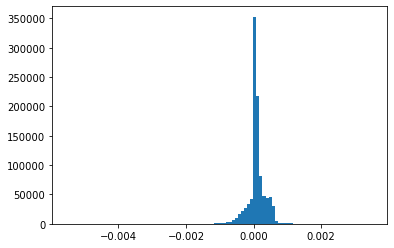

iteration # 41
iteration # 42
iteration # 43
iteration # 44
iteration # 45
iteration # 46
iteration # 47
iteration # 48
iteration # 49
873.715145111084  seconds.


In [510]:
import time
starttime = time.time()

solvedIRT = solve_IRT_for_matrix(table, all_thetas = None, iterations = 50, FOUR_PL=True, show_convergence=10)

print(time.time()-starttime, ' seconds.')


In [533]:
A = solvedIRT.thetas
B = solvedIRT_1.thetas
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])

A = solvedIRT.est_params[0]
B = solvedIRT_1.est_params[0]
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])

A = solvedIRT.est_params[1]
B = solvedIRT_1.est_params[1]
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])

0.7509679212909746
0.9836422971897006
0.8821873648109807


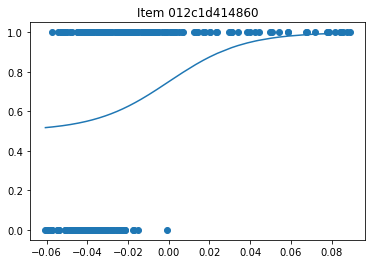

a : 54.69517006249806  b:  8.750933837722886e-35  c:  0.49999999999999994
d:  0.9999999999999999


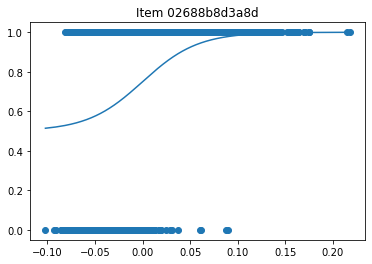

a : 34.448106325223925  b:  1.4131696333567003e-14  c:  0.4999999999972539
d:  0.9999999999993978


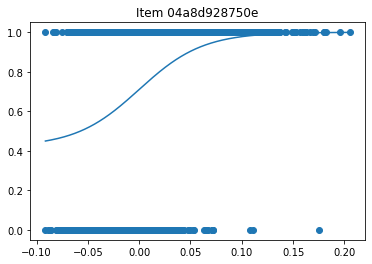

a : 32.210590318839394  b:  3.1822266273873005e-19  c:  0.42068096926766513
d:  0.9999999999999994


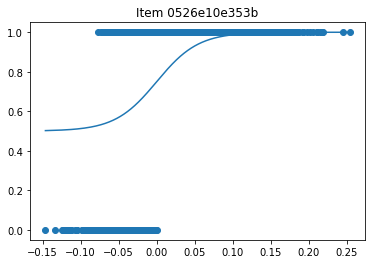

a : 36.504348656331636  b:  6.465509670771325e-22  c:  0.49999999999999994
d:  0.9999999999999999


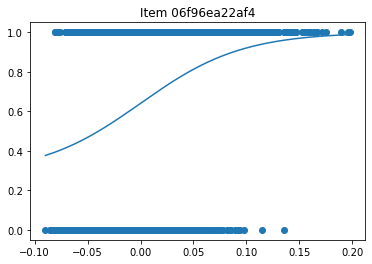

a : 20.839629324415075  b:  5.463190160774591e-13  c:  0.2805808119866158
d:  0.9999999999889292


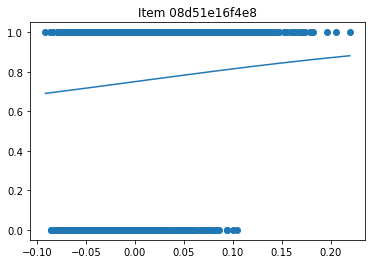

a : 5.314099420731867  b:  4.780771578926386e-13  c:  0.499999999999942
d:  0.9999999999995343


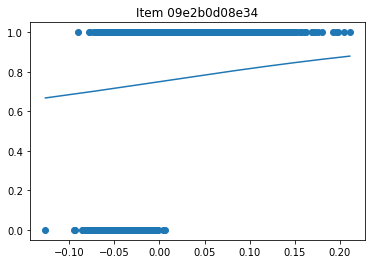

a : 5.420428272930073  b:  7.11150986045659e-14  c:  0.4999999999999855
d:  0.99999999999994


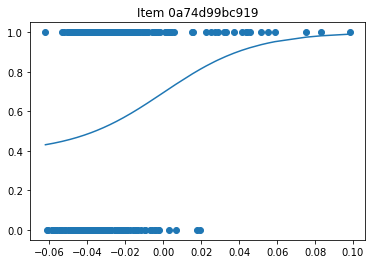

a : 41.99500629299431  b:  1.9574833570690815e-21  c:  0.38905855337081785
d:  0.9999999999999999


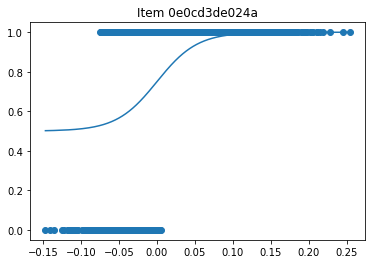

a : 37.57901739911647  b:  6.284682926296156e-22  c:  0.49999999999999994
d:  0.9999999999999999


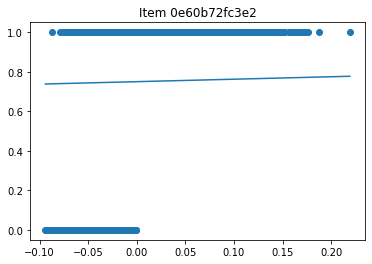

a : 1.0000000000081024  b:  3.538882182475457e-18  c:  0.49999999999999994
d:  0.9999999999999999


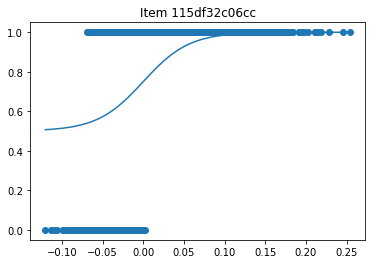

a : 35.43237996152057  b:  5.663108442505182e-23  c:  0.49999999999999994
d:  0.9999999999999999


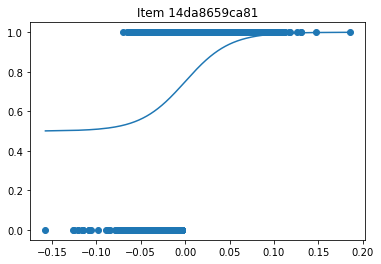

a : 39.78720996021769  b:  5.023345012586616e-19  c:  0.49999999999999994
d:  0.9999999999999999


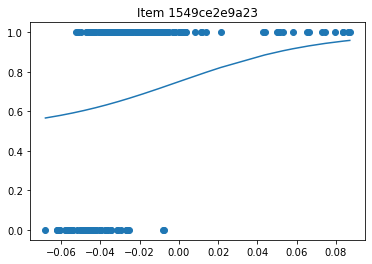

a : 27.649728693773042  b:  1.3607415626636173e-42  c:  0.49999999999999994
d:  0.9999999999999999


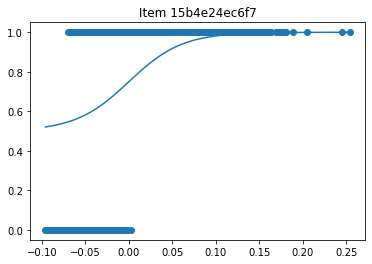

a : 32.60121403640478  b:  5.891707697626727e-17  c:  0.4999999999999988
d:  0.9999999999999999


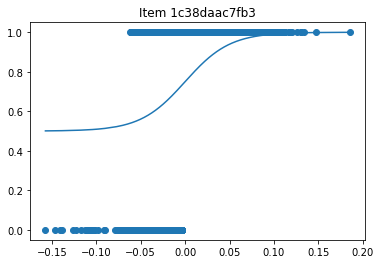

a : 39.65354584721122  b:  3.5816336983324237e-19  c:  0.49999999999999994
d:  0.9999999999999999


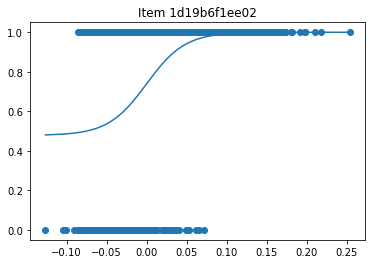

a : 41.496665198885395  b:  1.775301922835807e-20  c:  0.4777220896822974
d:  0.9999999999999989


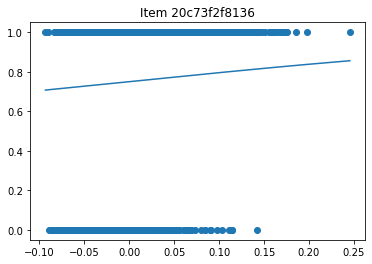

a : 3.6848864872182725  b:  1.1653562089002845e-13  c:  0.4999999999999675
d:  0.9999999999999064


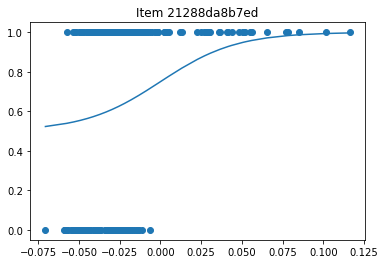

a : 42.834824717144265  b:  3.4766925095503923e-13  c:  0.49999999999878736
d:  0.9999999999998883


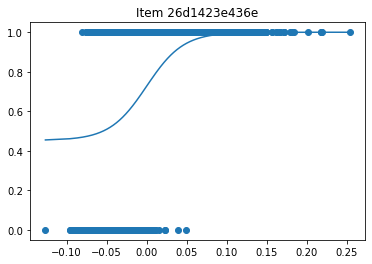

a : 43.518343288848726  b:  1.3589275980367562e-18  c:  0.45294220566278043
d:  0.9999999999988511


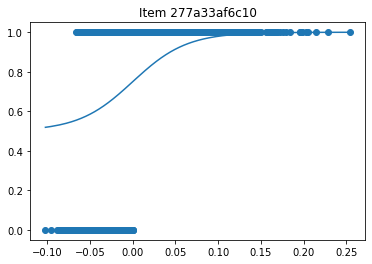

a : 31.59881122577667  b:  2.276139770961273e-20  c:  0.49999999999999994
d:  0.9999999999999999


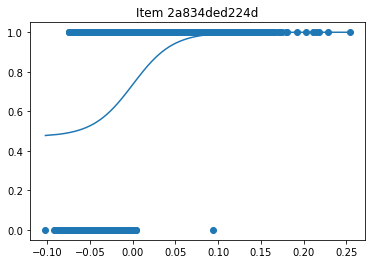

a : 42.78193713375331  b:  6.550540379500169e-28  c:  0.47108599008741453
d:  0.9999999999999999


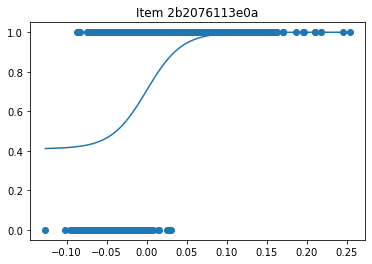

a : 45.44572405893175  b:  1.183318968929555e-18  c:  0.4098747239359711
d:  0.9999999999999999


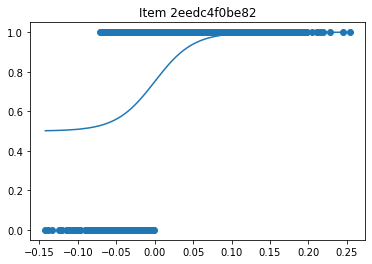

a : 39.8184428591631  b:  5.696242536464881e-26  c:  0.49999999999999994
d:  0.9999999999999999


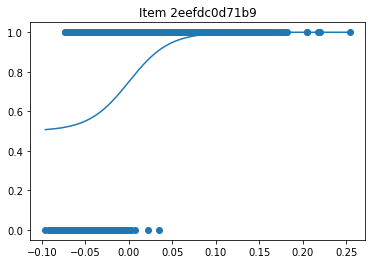

a : 43.38730405753646  b:  3.0884637920839715e-17  c:  0.4997216218155367
d:  0.9999999999999926


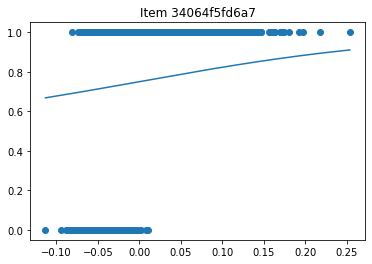

a : 6.002408482667667  b:  4.502901039552854e-13  c:  0.499999999999932
d:  0.9999999999995837


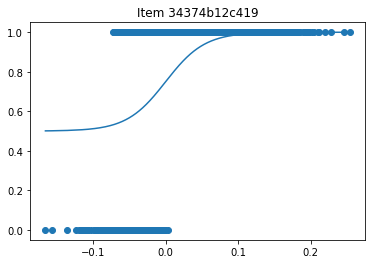

a : 37.115326775778954  b:  6.729905497168881e-22  c:  0.49999999999999994
d:  0.9999999999999999


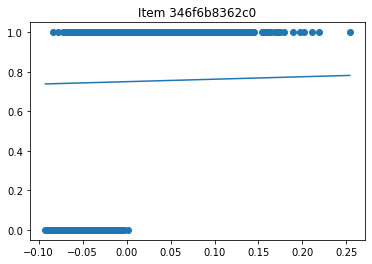

a : 1.0000000010966976  b:  4.386876674774449e-14  c:  0.49999999999997
d:  0.9999999999999808


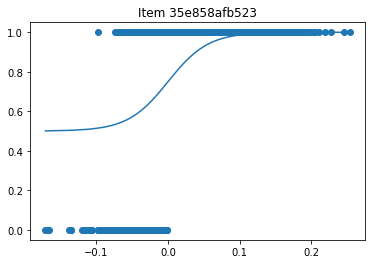

a : 35.62941047384256  b:  3.0317305692695304e-26  c:  0.49999999999999994
d:  0.9999999999999999


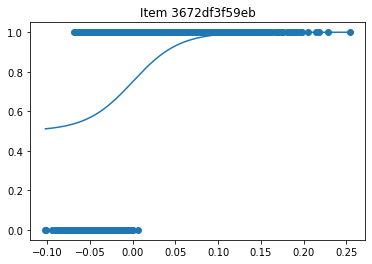

a : 36.78877243174959  b:  3.118942642050437e-20  c:  0.49999999999999895
d:  0.9999999999999999


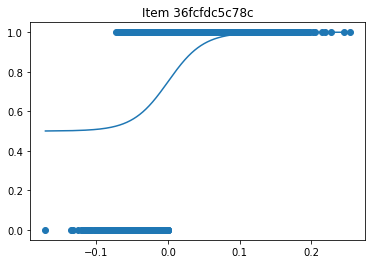

a : 40.44451977194452  b:  1.472522311349413e-21  c:  0.49999999999999994
d:  0.9999999999999999


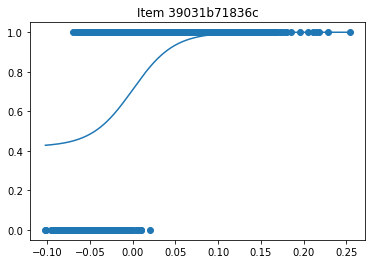

a : 41.52691646921583  b:  3.33709873679979e-16  c:  0.42001940555194295
d:  0.999999999976781


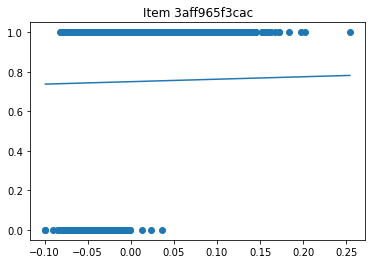

a : 1.0000000000003353  b:  8.803929841942476e-17  c:  0.49999999999999994
d:  0.9999999999999999


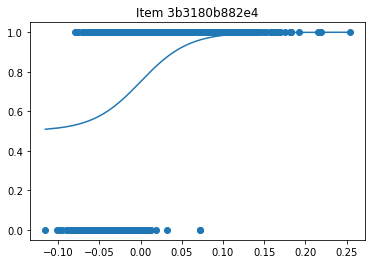

a : 34.31318038772284  b:  6.281881374782995e-13  c:  0.4999999999484241
d:  0.9999999999994946


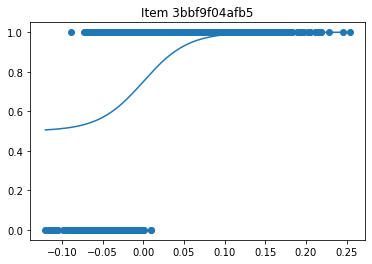

a : 36.56767564099432  b:  3.522521159886282e-23  c:  0.49999999999999994
d:  0.9999999999999999


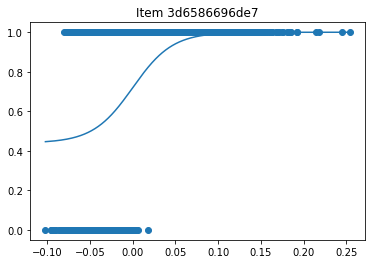

a : 43.00543408859377  b:  8.739950850357973e-23  c:  0.4395703359994403
d:  0.9999999999999991


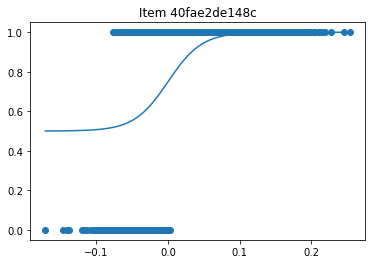

a : 42.25000743369879  b:  7.120372781240668e-26  c:  0.49999999999999994
d:  0.9999999999999999


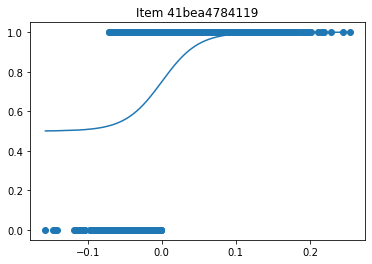

a : 40.40887445529338  b:  1.6613312891556988e-21  c:  0.49999999999999994
d:  0.9999999999999999


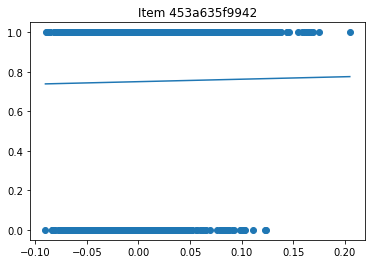

a : 1.0000000000066522  b:  2.198799536321893e-20  c:  0.49999999999999994
d:  0.9999999999999999


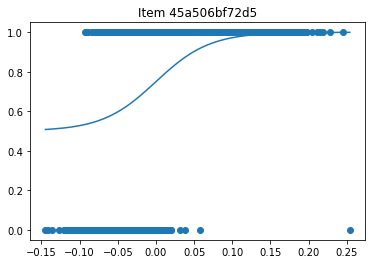

a : 28.420468908271687  b:  3.2706461688168906e-13  c:  0.49999999999999917
d:  0.9999999999993384


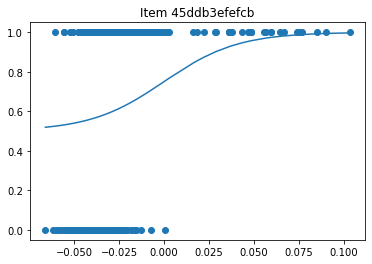

a : 48.753133128864185  b:  5.633901355956335e-28  c:  0.4999999999999693
d:  0.9999999999999999


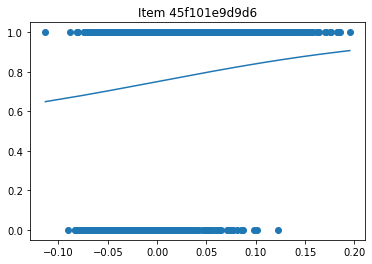

a : 7.57244975438579  b:  1.6224555596349551e-13  c:  0.4999999999999935
d:  0.9999999999998157


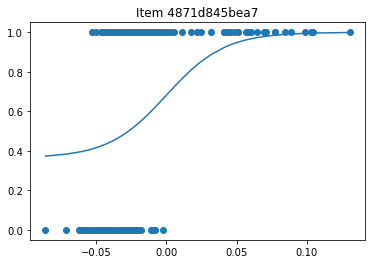

a : 48.256218539371  b:  7.425768666331615e-23  c:  0.3636764334708387
d:  0.9999999999999999


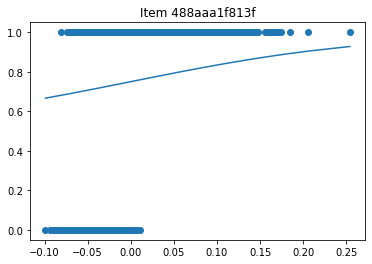

a : 7.016458991186521  b:  1.5817586037338738e-14  c:  0.4999999999999987
d:  0.9999999999999829


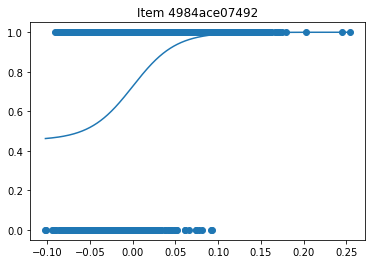

a : 39.84196645814659  b:  2.5250004197828334e-16  c:  0.4531314301174732
d:  0.9999999999999952


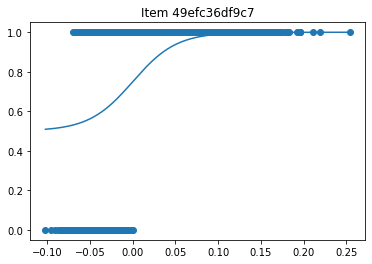

a : 39.077962499131765  b:  2.7537598929854996e-24  c:  0.499999999995706
d:  0.9999999999999999


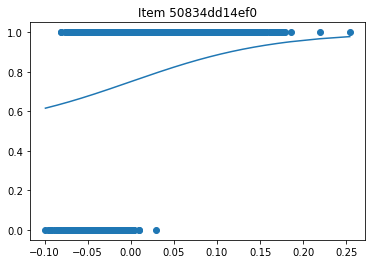

a : 12.105559489889771  b:  3.65794218981239e-16  c:  0.49999999999999994
d:  0.9999999999999997


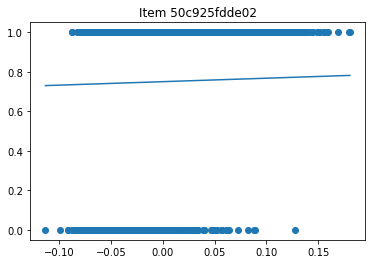

a : 1.4091957135165634  b:  6.517106744408439e-17  c:  0.49999999999999994
d:  0.9999999999999999


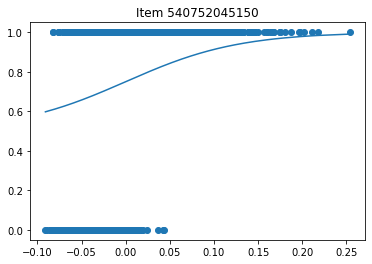

a : 15.575517273992759  b:  5.296005323725336e-16  c:  0.4999999999891024
d:  0.9999999999947992


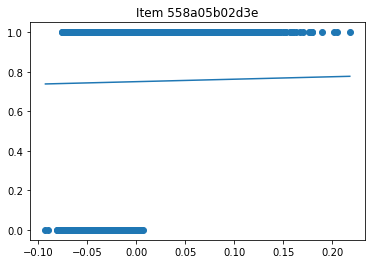

a : 1.0000000000011082  b:  8.65576620834203e-19  c:  0.49999999999999994
d:  0.9999999999999999


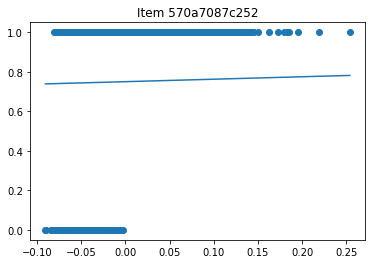

a : 1.0000000000007672  b:  1.6379245879877132e-16  c:  0.4999999999999999
d:  0.9999999999999999


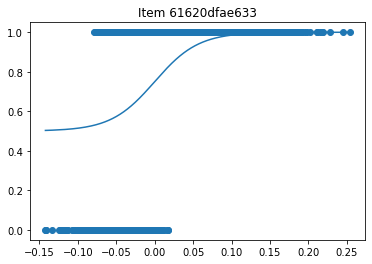

a : 35.13640050600013  b:  1.0864154607836198e-15  c:  0.49999999999999994
d:  0.9999999999999954


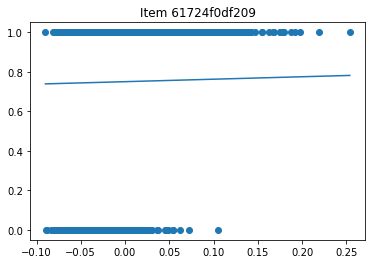

a : 1.0000000061640926  b:  6.672238837881125e-15  c:  0.4999999999999948
d:  0.9999999999999972


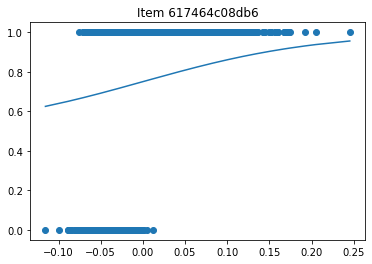

a : 9.508396833606918  b:  1.8045455224463083e-13  c:  0.49999999999999606
d:  0.999999999999778


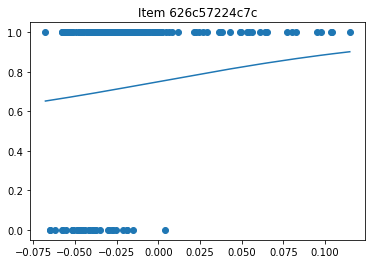

a : 12.230527834092378  b:  9.630239439472334e-15  c:  0.4999999999999998
d:  0.9999999999999909


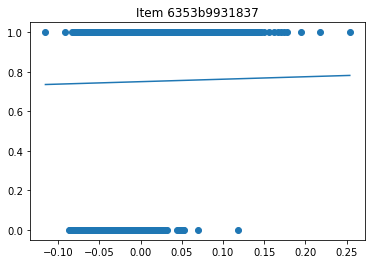

a : 1.0000000000000002  b:  2.5317239935217055e-22  c:  0.49999999999999994
d:  0.9999999999999999


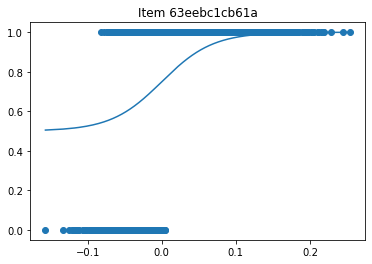

a : 29.096753450524265  b:  6.182284087459921e-21  c:  0.49999999999999994
d:  0.9999999999999999


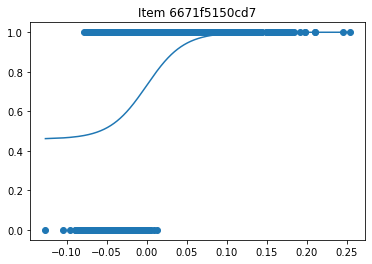

a : 43.11547031938377  b:  6.7110959258174835e-21  c:  0.4595490730659613
d:  0.9999999999999991


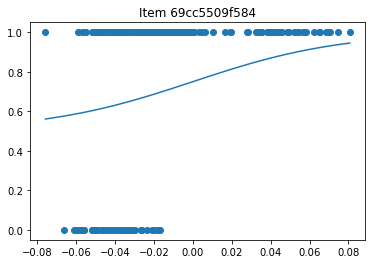

a : 26.019803045015646  b:  1.0738672371723028e-25  c:  0.49999999999999994
d:  0.9999999999999999


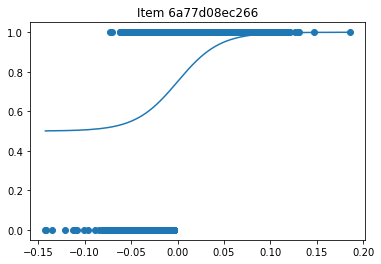

a : 44.09788078551617  b:  1.474654973417628e-17  c:  0.49999999999999994
d:  0.9999999999999998


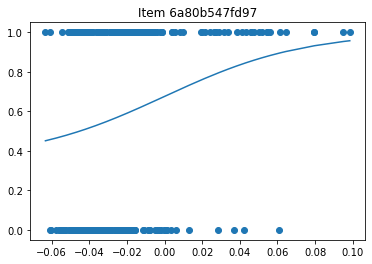

a : 26.894085788198723  b:  2.2798263315323163e-13  c:  0.35098669803524735
d:  0.9999999999106608


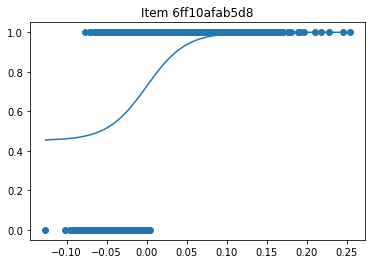

a : 40.82085985140997  b:  4.014716029868959e-16  c:  0.4518950085620233
d:  0.9999999999901128


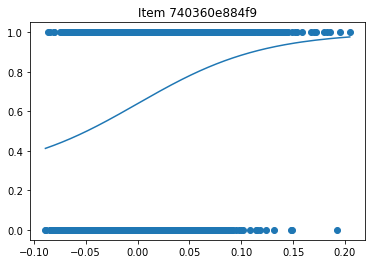

a : 16.520924929540147  b:  9.297835072723994e-12  c:  0.27698272731248774
d:  0.9999999999040546


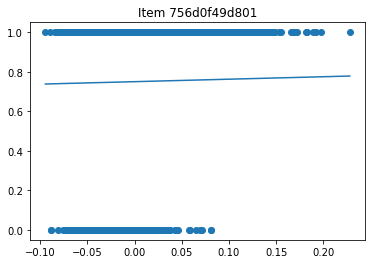

a : 1.0010369223899158  b:  2.0132308997899063e-24  c:  0.49999999999999994
d:  0.9999999999999999


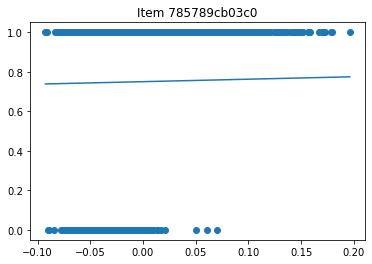

a : 1.0000000000079694  b:  2.1120279032620165e-15  c:  0.49999999999999867
d:  0.999999999999999


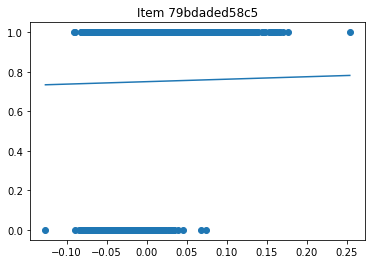

a : 1.0000000000000002  b:  4.1946357135338877e-22  c:  0.49999999999999994
d:  0.9999999999999999


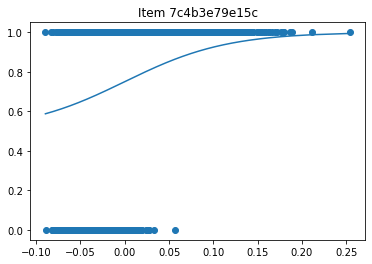

a : 17.311616078360654  b:  1.2799701606538972e-15  c:  0.4999999999720202
d:  0.9999999999889729


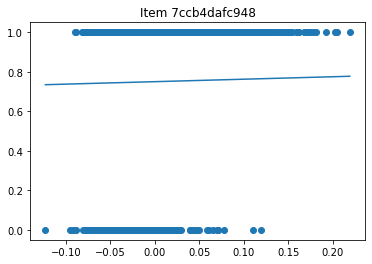

a : 1.0000000027292413  b:  7.559860398012965e-13  c:  0.49999999999949557
d:  0.9999999999996563


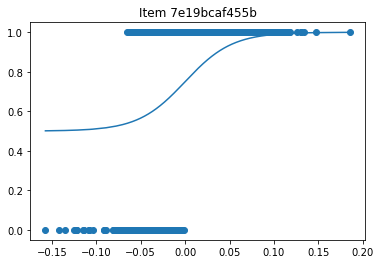

a : 37.76278957545652  b:  3.9250564243880317e-19  c:  0.49999999999999994
d:  0.9999999999999999


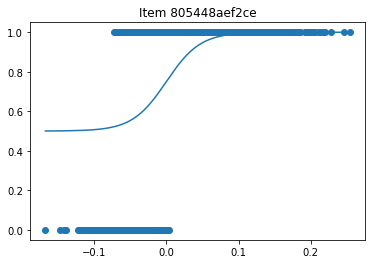

a : 42.53242958086706  b:  6.216362199752405e-26  c:  0.49999999999999994
d:  0.9999999999999999


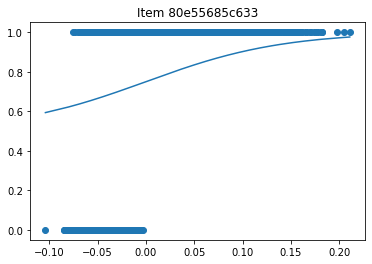

a : 14.153661011372101  b:  3.2276933936640408e-15  c:  0.4999999999999419
d:  0.9999999999996946


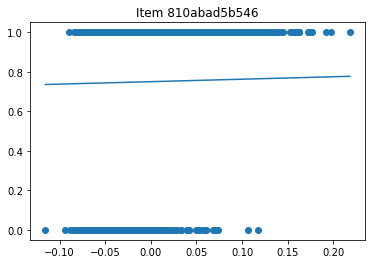

a : 1.00000000000166  b:  8.67666030593898e-18  c:  0.49999999999999994
d:  0.9999999999999999


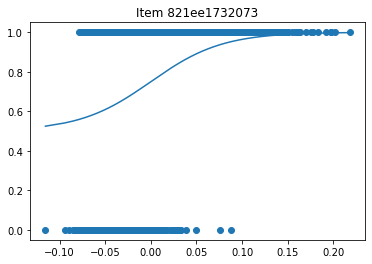

a : 25.563136370128067  b:  2.479617252840439e-15  c:  0.49999999999732564
d:  0.9999999999999482


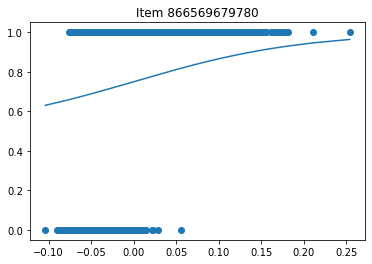

a : 10.030802231591625  b:  6.032458850270159e-13  c:  0.4999999999999926
d:  0.9999999999991603


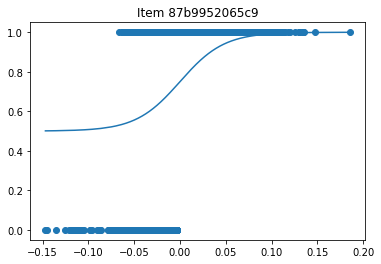

a : 41.56038247381523  b:  3.9476321906534985e-19  c:  0.49999999999999994
d:  0.9999999999999999


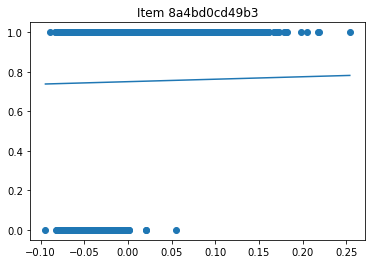

a : 1.000000000000028  b:  7.568254479763353e-18  c:  0.49999999999999994
d:  0.9999999999999999


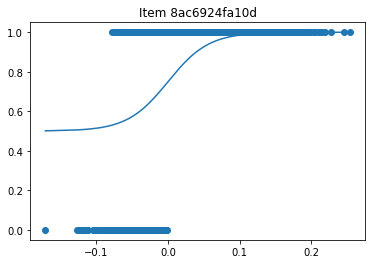

a : 35.16298596309456  b:  5.307752265094613e-22  c:  0.49999999999999994
d:  0.9999999999999999


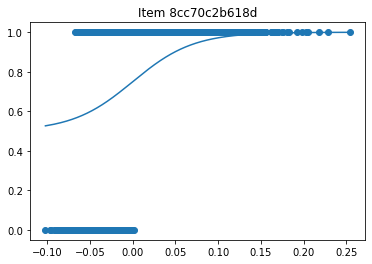

a : 28.223609177151854  b:  1.004661197162804e-15  c:  0.4999999999999949
d:  0.9999999999999992


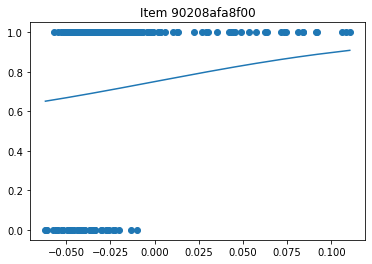

a : 13.53820361104699  b:  6.8972004536834235e-15  c:  0.4999999999999999
d:  0.9999999999999936


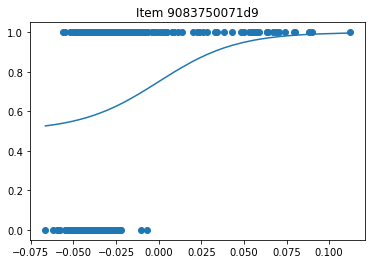

a : 43.61719998481768  b:  1.4374967544144396e-27  c:  0.49999999999999994
d:  0.9999999999999999


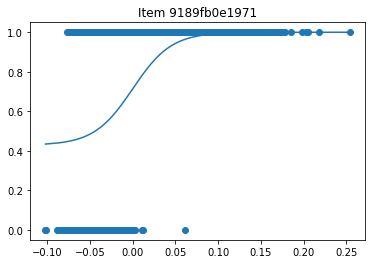

a : 44.231786968658085  b:  9.105195355444788e-24  c:  0.4282357531263175
d:  0.9999999999999987


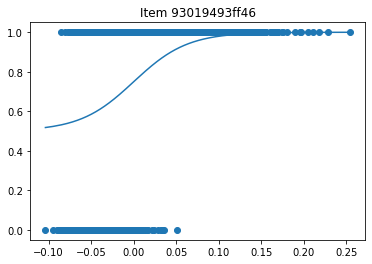

a : 31.66942070124741  b:  5.173519794191026e-16  c:  0.4999999999992875
d:  0.9999999999999897


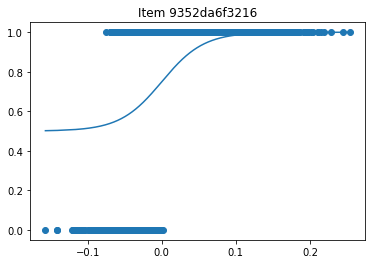

a : 35.37068431447543  b:  5.939352984839676e-22  c:  0.49999999999999994
d:  0.9999999999999999


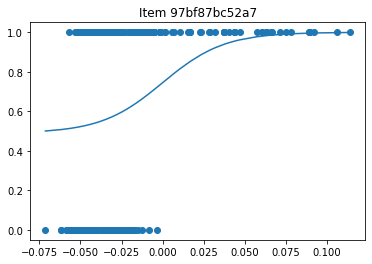

a : 53.33411427559927  b:  1.1200905253807319e-30  c:  0.48929850266736513
d:  0.9999999999999999


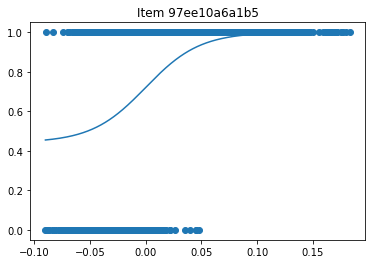

a : 41.13873161770686  b:  1.3112777063827619e-23  c:  0.4414367319956846
d:  0.9999999999999999


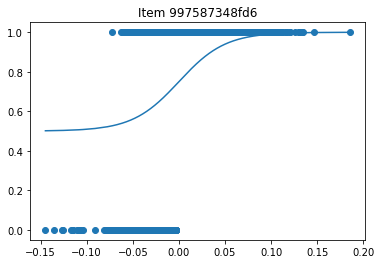

a : 39.72772762162613  b:  4.61621756290328e-19  c:  0.49999999999999994
d:  0.9999999999999999


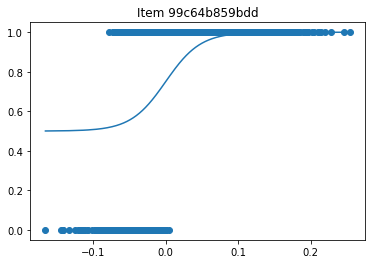

a : 41.59735960389188  b:  1.5035649803766193e-21  c:  0.49999999999999994
d:  0.9999999999999999


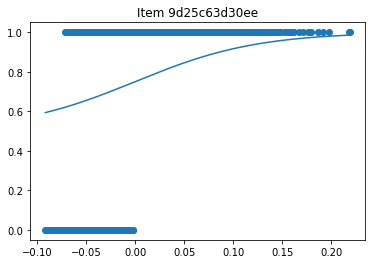

a : 16.05446337203973  b:  9.399692624961984e-16  c:  0.49999999999997996
d:  0.9999999999999284


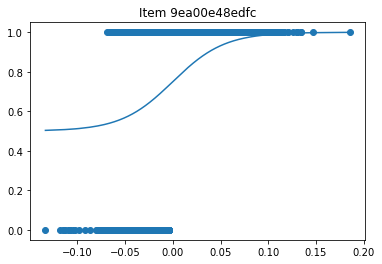

a : 36.92981274493052  b:  4.266878923622505e-19  c:  0.49999999999999994
d:  0.9999999999999999


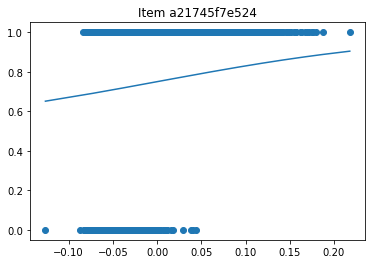

a : 6.611013860895821  b:  1.4252569943471307e-14  c:  0.4999999999999986
d:  0.9999999999999847


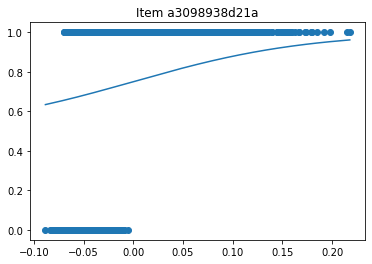

a : 11.362933456970477  b:  5.418887926133259e-13  c:  0.4999999999999944
d:  0.9999999999993399


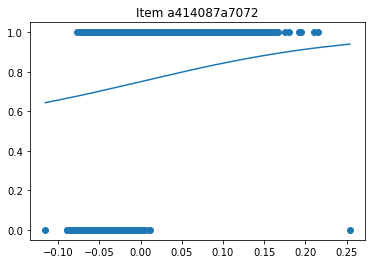

a : 7.856635857888939  b:  2.8708972781740736e-12  c:  0.49999999999997236
d:  0.9999999999970024


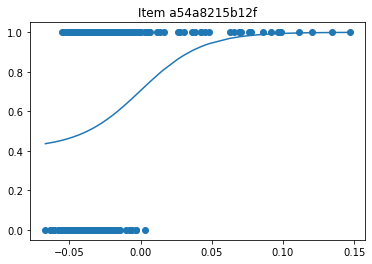

a : 46.1363500529829  b:  6.668148613469147e-17  c:  0.4105519131976353
d:  0.9999999999972009


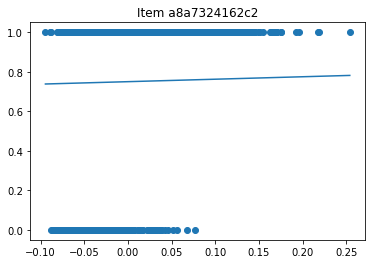

a : 1.0000000000000269  b:  2.5445968787134627e-19  c:  0.49999999999999994
d:  0.9999999999999999


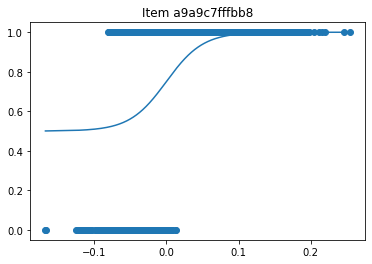

a : 39.44176280146613  b:  2.2455165119836744e-13  c:  0.49999999999999517
d:  0.9999999999985191


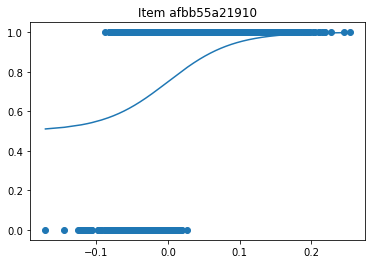

a : 22.255269955309053  b:  2.4884890700892293e-19  c:  0.49999999999999994
d:  0.9999999999999999


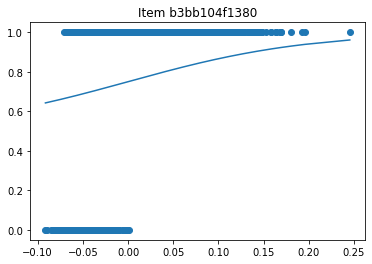

a : 10.054335333266298  b:  3.1637060782267344e-14  c:  0.49999999999999917
d:  0.999999999999968


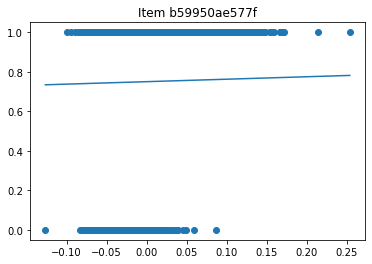

a : 1.0000000000015408  b:  5.255660973495775e-16  c:  0.49999999999999967
d:  0.9999999999999998


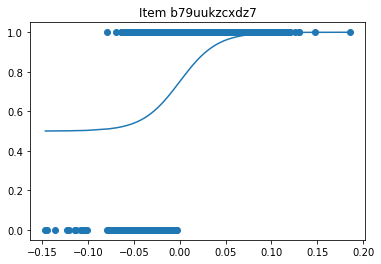

a : 48.875018376106645  b:  2.8894817122833167e-21  c:  0.49999999999999994
d:  0.9999999999999999


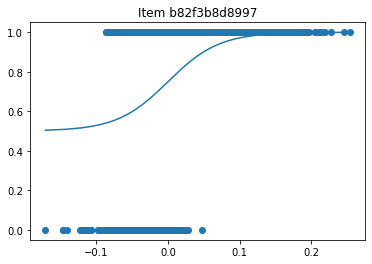

a : 28.04033766924781  b:  1.141242493867366e-15  c:  0.49999999999999994
d:  0.9999999999999978


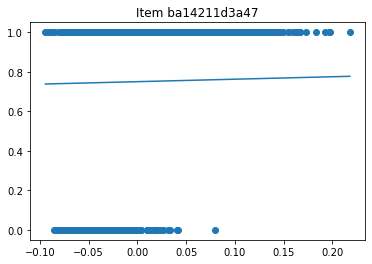

a : 1.0000000001845866  b:  3.0253380049123916e-14  c:  0.49999999999997996
d:  0.9999999999999863


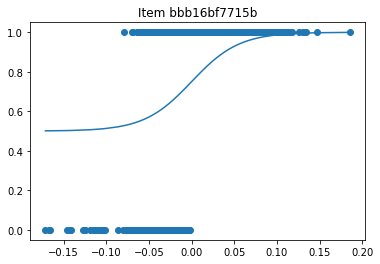

a : 35.954431775972076  b:  3.006630696673401e-19  c:  0.49999999999999994
d:  0.9999999999999999


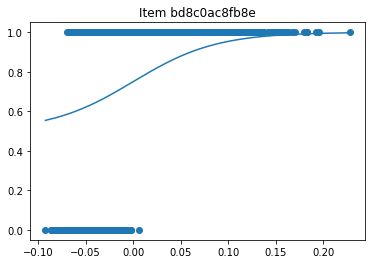

a : 22.829320193296745  b:  9.626563036586982e-19  c:  0.4999999999994657
d:  0.9999999999999946


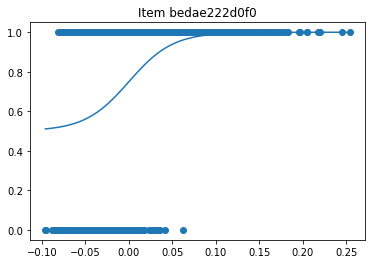

a : 39.63093418069947  b:  1.1372043963932917e-17  c:  0.49999999971514464
d:  0.9999999999999999


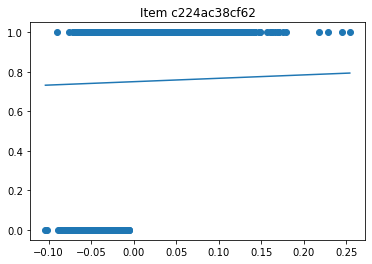

a : 1.3845942142131071  b:  7.914121920731143e-14  c:  0.49999999999994066
d:  0.9999999999999661


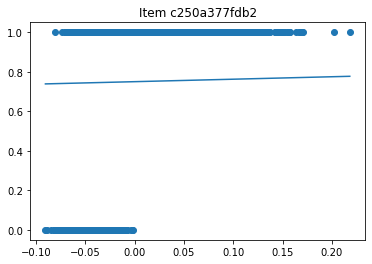

a : 1.0000000000000002  b:  6.937174642931367e-23  c:  0.49999999999999994
d:  0.9999999999999999


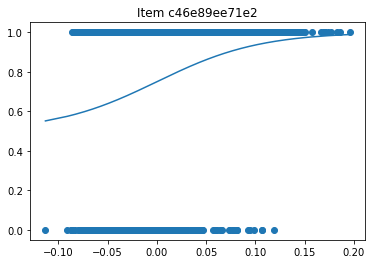

a : 19.114673943300563  b:  4.3340106725569435e-14  c:  0.49999999999996936
d:  0.9999999999998366


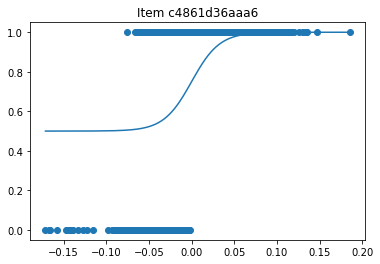

a : 61.09585288014924  b:  3.270455217251178e-18  c:  0.49999999999999994
d:  0.9999999999999998


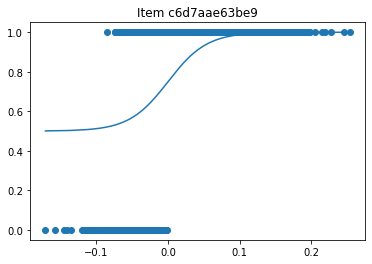

a : 36.80948042278087  b:  6.65974479516762e-22  c:  0.49999999999999994
d:  0.9999999999999999


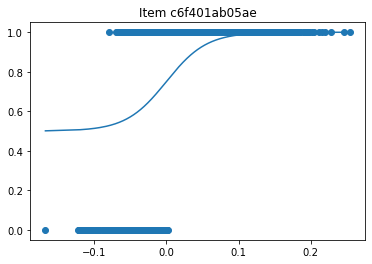

a : 35.82363750203102  b:  5.805142584637733e-22  c:  0.49999999999999994
d:  0.9999999999999999


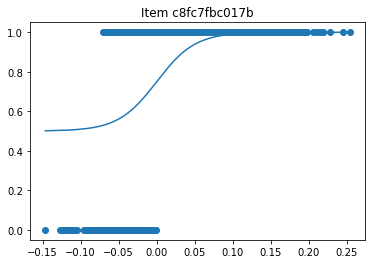

a : 39.47193072905195  b:  3.9768519100280504e-26  c:  0.49999999999999994
d:  0.9999999999999999


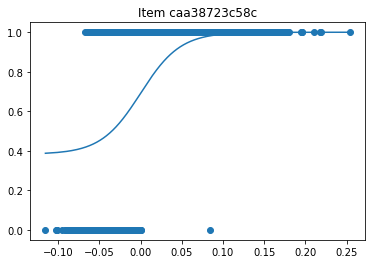

a : 41.53263946084821  b:  7.085568894479965e-18  c:  0.38273853772744765
d:  0.9999999999999554


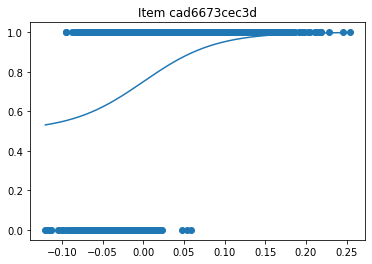

a : 22.47092401325118  b:  1.0712996815130052e-15  c:  0.49999999999999994
d:  0.9999999999999984


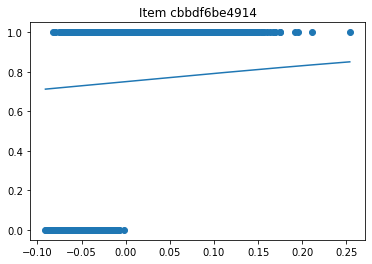

a : 3.3484580400554766  b:  5.386869900500547e-13  c:  0.49999999999972794
d:  0.9999999999996995


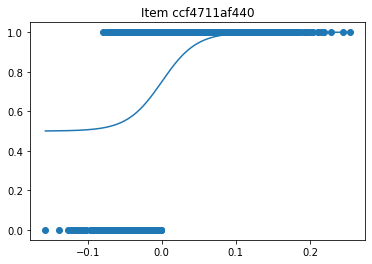

a : 42.793263233840996  b:  2.5304996700440233e-21  c:  0.49999999999999994
d:  0.9999999999999999


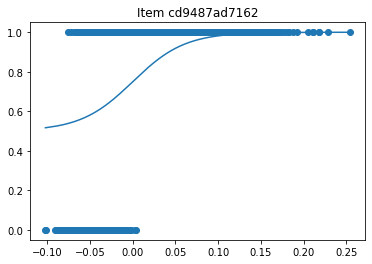

a : 32.82914598020433  b:  1.1051392219134316e-16  c:  0.4999999999999984
d:  0.9999999999999999


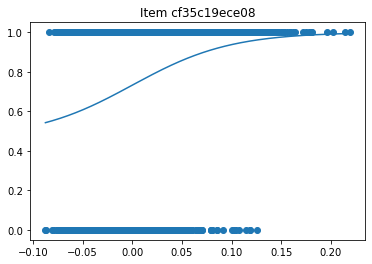

a : 20.22067802499012  b:  3.9639080557076794e-13  c:  0.4646043523921764
d:  0.9999999999850497


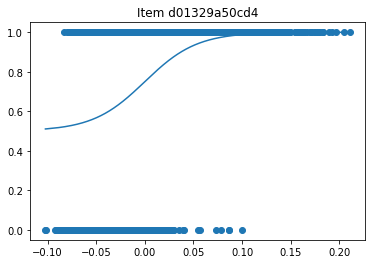

a : 37.32175877317705  b:  2.058008254022121e-15  c:  0.49999999999947875
d:  0.9999999999998594


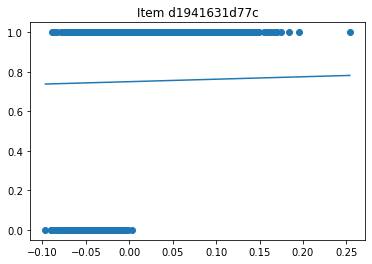

a : 1.0000000000000167  b:  5.069821407200784e-18  c:  0.49999999999999994
d:  0.9999999999999999


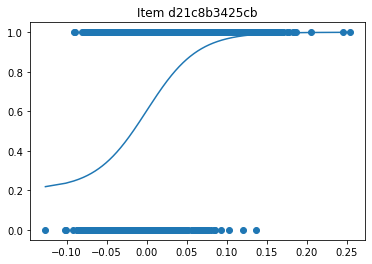

a : 31.307797109958933  b:  1.898793159382081e-21  c:  0.2039207812158945
d:  0.9999999999999988


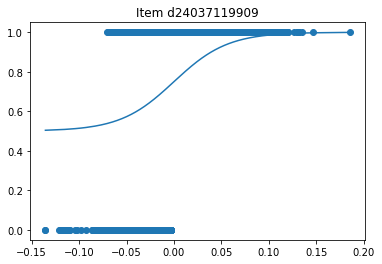

a : 35.30588951618564  b:  3.293143369187112e-19  c:  0.49999999999999994
d:  0.9999999999999999


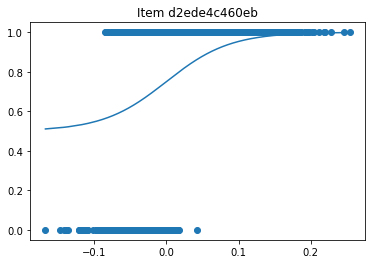

a : 22.77341876513337  b:  1.7113728454271346e-19  c:  0.49999999999999994
d:  0.9999999999999999


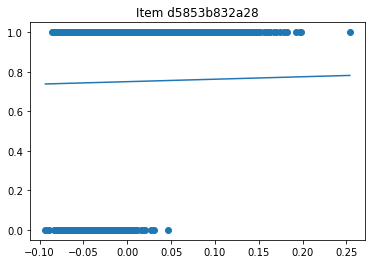

a : 1.000000000000041  b:  1.5253126329850503e-17  c:  0.49999999999999994
d:  0.9999999999999999


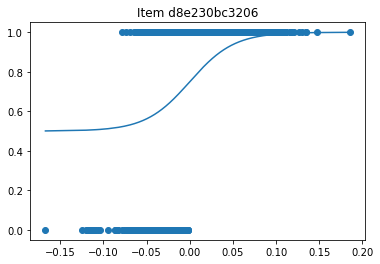

a : 39.05924429097856  b:  2.3575523967284684e-19  c:  0.49999999999999994
d:  0.9999999999999999


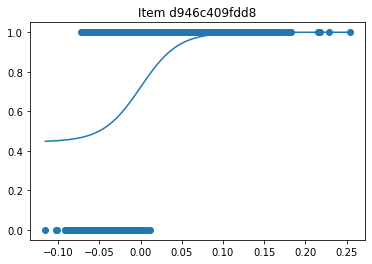

a : 43.737161191275405  b:  3.482394342543486e-21  c:  0.4447527727115363
d:  0.9999999999999982


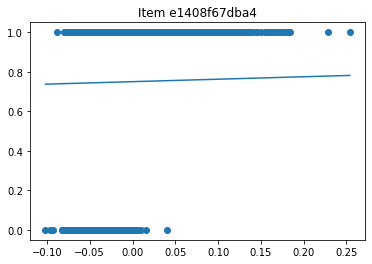

a : 1.0000000000002998  b:  7.001684398384547e-17  c:  0.49999999999999994
d:  0.9999999999999999


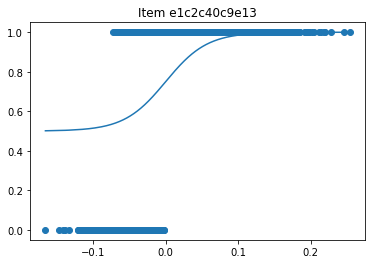

a : 34.982793646455875  b:  1.6714147093426813e-26  c:  0.49999999999999994
d:  0.9999999999999999


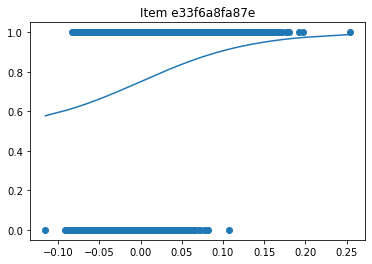

a : 14.672311464160064  b:  2.4041947827646483e-15  c:  0.49999999999992145
d:  0.9999999999992213


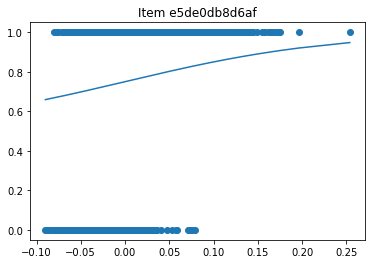

a : 8.460914167774988  b:  6.538877452874511e-13  c:  0.4999999999999904
d:  0.9999999999989229


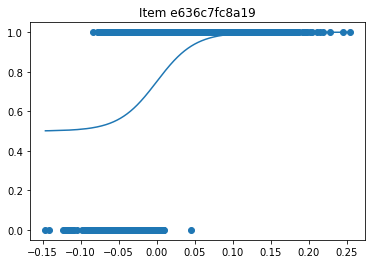

a : 39.92548827577218  b:  5.384221123545976e-13  c:  0.4999999999999919
d:  0.9999999999928226


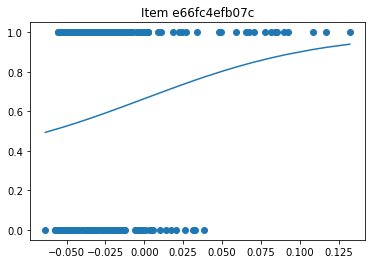

a : 17.55418978156439  b:  1.9595204433039093e-11  c:  0.32783381233845327
d:  0.9999999999473946


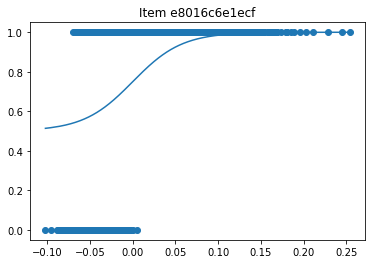

a : 34.7701780941656  b:  5.164303908905662e-22  c:  0.49999999999999994
d:  0.9999999999999999


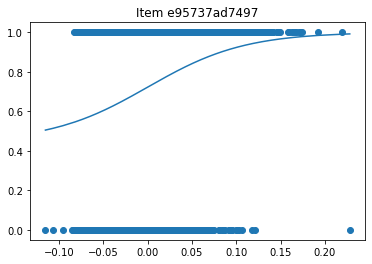

a : 18.28685861114392  b:  2.006381207786296e-12  c:  0.4452303026722466
d:  0.9999999995432608


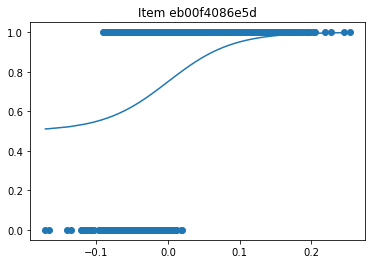

a : 22.22069185798127  b:  2.4143060038223343e-19  c:  0.49999999999999994
d:  0.9999999999999999


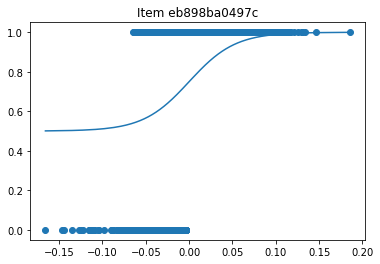

a : 37.67592070654262  b:  3.864165253995972e-19  c:  0.49999999999999994
d:  0.9999999999999999


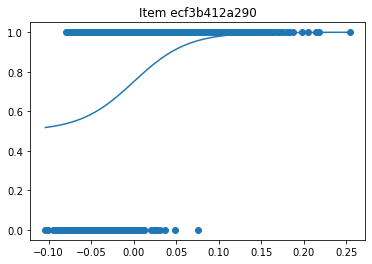

a : 31.571085678717395  b:  8.704800417944462e-16  c:  0.49999999999877515
d:  0.9999999999999823


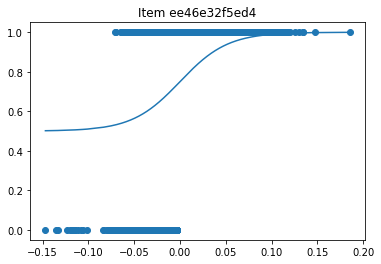

a : 38.39190370927083  b:  2.863612593363563e-19  c:  0.49999999999999994
d:  0.9999999999999999


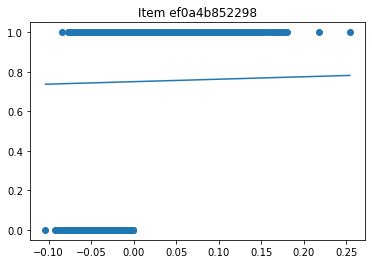

a : 1.0000000044754314  b:  1.8298666233674926e-13  c:  0.4999999999998733
d:  0.9999999999999202


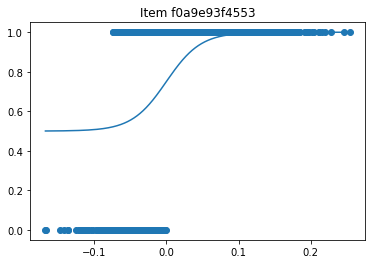

a : 41.91794449496508  b:  1.4617423741058893e-21  c:  0.49999999999999994
d:  0.9999999999999999


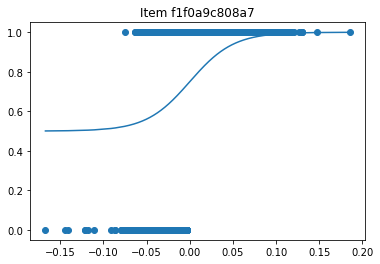

a : 39.55025382047467  b:  4.729019668125437e-19  c:  0.49999999999999994
d:  0.9999999999999999


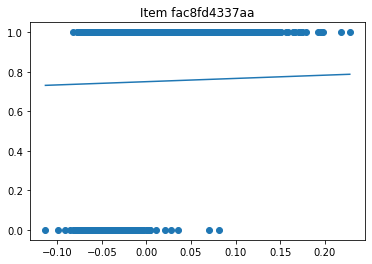

a : 1.32192921106132  b:  1.917884090232349e-13  c:  0.4999999999998478
d:  0.9999999999999213


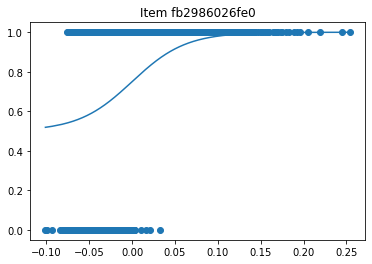

a : 31.938663554370404  b:  3.713828411280505e-15  c:  0.4999999999996307
d:  0.9999999999999925


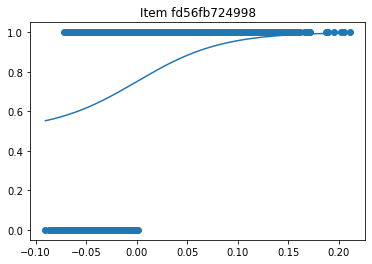

a : 23.774956867146656  b:  1.2528281337235732e-19  c:  0.49999999999995437
d:  0.9999999999999996


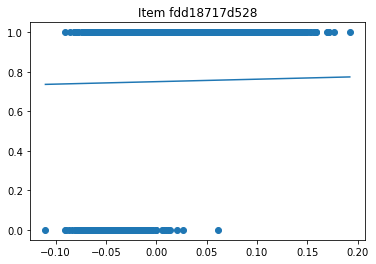

a : 1.0000000000000921  b:  3.2254790465497755e-17  c:  0.49999999999999994
d:  0.9999999999999999
76.86699986457825 secs


In [262]:
import time 
start = time.time()
est_params = estimate_parameters_for_skill(table, solvedIRT.thetas, True,FOUR_PL)
print(time.time() - start,  'secs')



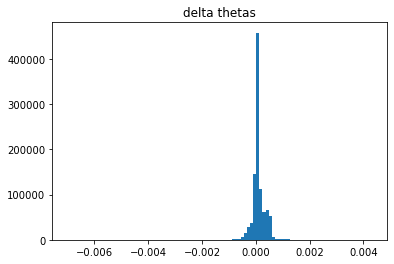

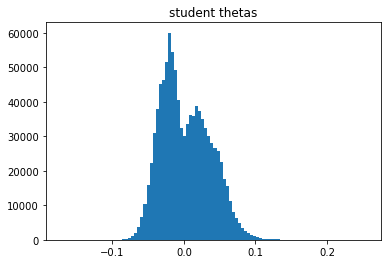

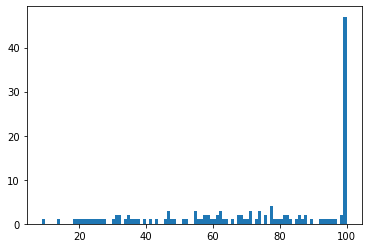

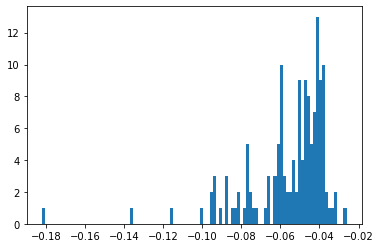

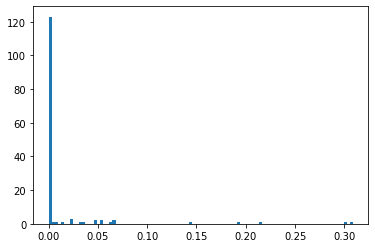

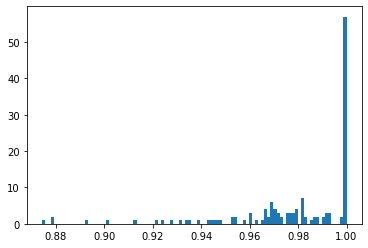

In [263]:
try:
    plt.hist(solvedIRT.delta_thetas, bins =100)
    plt.title('delta thetas')
    plt.show()
except:
    print('failed to plot delta thetas')
    
plt.hist(solvedIRT.thetas, bins =100)
plt.title('student thetas')
plt.show()

plt.hist(solvedIRT.est_params[0], bins =100)
plt.show()

plt.hist(solvedIRT.est_params[1], bins =100)
plt.show()


plt.hist(solvedIRT.est_params[2], bins =100)
plt.show()


plt.hist(solvedIRT.est_params[3], bins =100)
plt.show()




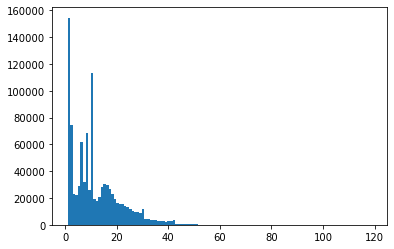

In [268]:

plt.hist(solvedIRT.item_power[solvedIRT.item_power>0],bins=max(solvedIRT.item_power))
plt.show()



In [274]:
#number of student answers for questions not solved
solvedIRT.student_power[np.any(np.isnan(solvedIRT.est_params[-1]),1)]



math_question_id
059f523973ed     6
07e8cb78c01d     1
0bbe1774d5cd     1
15323a29db6a     1
196d676d1966     1
2388959e9d13     1
269fec987ec0     1
2749ccc2d750     1
2913d2729e16     4
340bb53beb5b     1
396b70f22cbb    10
41c388a5a6b8     1
4e94db401bb9     1
50d285f55be2     4
532c51e89f73     2
63d78c84f613     1
66ef4b882495     2
6c6d80708a26     1
6f48c2dd38f8     1
73e0ecfd68cd     3
746c1ff835c0     1
7d0f0a4f97e0     1
7e81e43369e9     1
85611b68f33b     1
86091ca0ea23     5
91ee64cdd54c     1
9b3f22e8a000     2
9c70c89e8d01     5
9d2ebb9cd3fa     1
9eca6476720e     1
a5d43671a290     1
aa27f9ea0d33     1
acdb91a967a7     4
be3c5e9beb7c     1
be649fc3ac4d     1
c4dde61467d3     1
c8c5f4c9a11f     2
c9f3f0e206ba     1
d4aac3465ace     1
d6df6e11f17e     1
dff2f230c542     1
ed0c28b35bb1    13
ed3af7c115fa     5
f6166b65e327     1
f6c4ed89044d     6
f9a197ce79b8     1
fabcec79ed19     6
fbe10b25dd16     1
fe6dcf7170f2     1
dtype: int64

In [288]:
table.iloc[np.argsort(solvedIRT.thetas)[-1],:][table.iloc[np.argsort(solvedIRT.thetas)[-1],:].notna()], np.sort(solvedIRT.thetas)[-1]



(math_question_id
 0526e10e353b    1.0
 0e0cd3de024a    1.0
 115df32c06cc    1.0
 15b4e24ec6f7    1.0
 1d19b6f1ee02    1.0
                ... 
 eb00f4086e5d    1.0
 ecf3b412a290    1.0
 ef0a4b852298    1.0
 f0a9e93f4553    1.0
 fb2986026fe0    1.0
 Name: 5712684, Length: 80, dtype: float64,
 0.25390596243799746)

In [286]:
table.iloc[np.argsort(solvedIRT.thetas)[0],:][table.iloc[np.argsort(solvedIRT.thetas)[0],:].notna()], np.sort(solvedIRT.thetas)[0]

(math_question_id
 35e858afb523    0.0
 36fcfdc5c78c    0.0
 40fae2de148c    0.0
 8ac6924fa10d    0.0
 afbb55a21910    0.0
 b82f3b8d8997    0.0
 bbb16bf7715b    0.0
 c4861d36aaa6    0.0
 c6d7aae63be9    0.0
 eb00f4086e5d    0.0
 Name: 30357311, dtype: float64,
 -0.1712799327632374)

iteration # 0


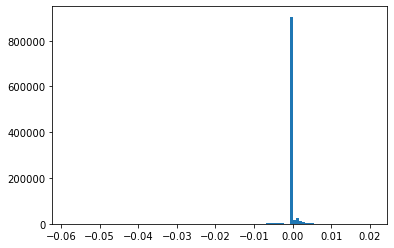

iteration # 1
iteration # 2
iteration # 3
iteration # 4
iteration # 5
iteration # 6
iteration # 7
iteration # 8
iteration # 9
iteration # 10


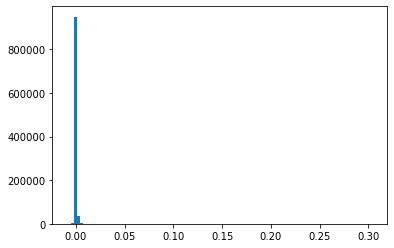

iteration # 11
iteration # 12
iteration # 13
iteration # 14
iteration # 15
iteration # 16
iteration # 17
iteration # 18
iteration # 19
iteration # 20


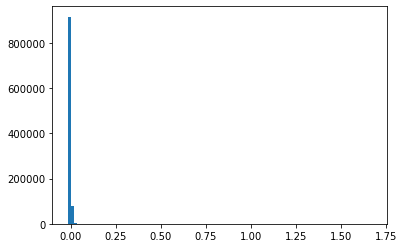

iteration # 21
iteration # 22
iteration # 23
iteration # 24
iteration # 25
iteration # 26
iteration # 27
iteration # 28
iteration # 29
iteration # 30


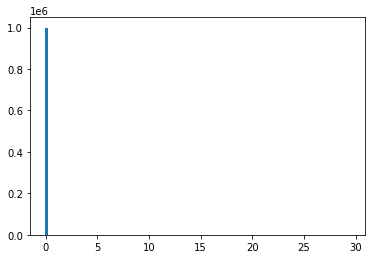

iteration # 31
iteration # 32
iteration # 33
iteration # 34
iteration # 35
iteration # 36
iteration # 37
iteration # 38
iteration # 39
78.61636471748352  seconds.


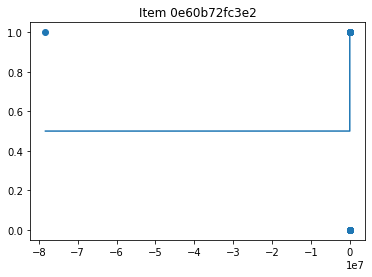

a : 46.70445921980756  b:  2.5863761710086872e-30  c:  0.49999999999999994
d:  0.9999999999999999


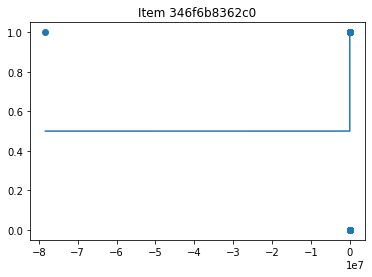

a : 38.69419196348048  b:  9.316017033487154e-17  c:  0.49999999999999994
d:  0.9999999999999742


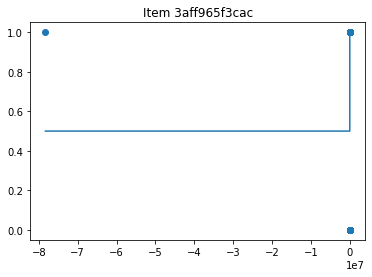

a : 31.43361602318601  b:  9.437975906892472e-30  c:  0.49999999999999994
d:  0.9999999999999999


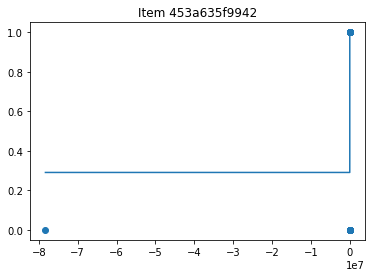

a : 13.802549599734988  b:  2.4308383483290555e-18  c:  0.29072007845157777
d:  0.9999999999999999


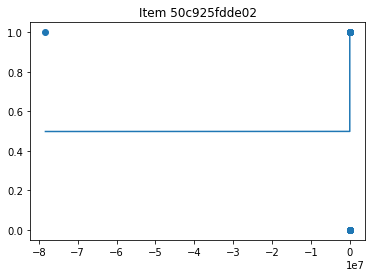

a : 67.75892671103209  b:  7.084071123365841e-26  c:  0.4978767509102782
d:  0.9999999999999999


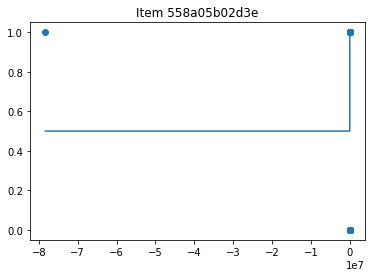

a : 48.21016085834799  b:  2.6317211641207724e-24  c:  0.49999999999999994
d:  0.9999999999999999


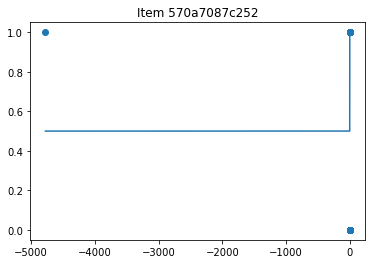

a : 31.236327244399206  b:  1.066347753753303e-27  c:  0.49999999999999994
d:  0.9999999999999999


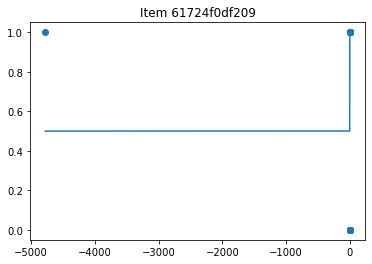

a : 59.292592352761496  b:  3.1928151252439514e-31  c:  0.49999999999999994
d:  0.9999999999999999


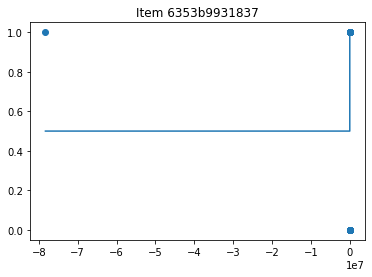

a : 45.07175124840578  b:  4.803797502373086e-30  c:  0.49999999999999994
d:  0.9999999999999999


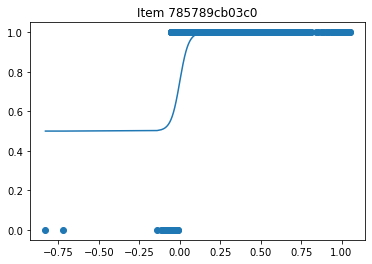

a : 37.305145157155515  b:  2.6618389452147224e-27  c:  0.49999999999999994
d:  0.9999999999999999


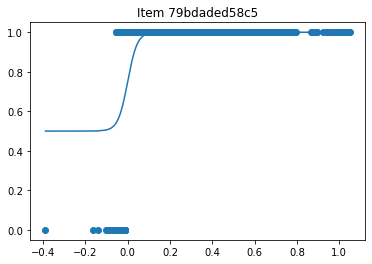

a : 44.145144675558676  b:  6.485350822920188e-30  c:  0.49999999999999994
d:  0.9999999999999999


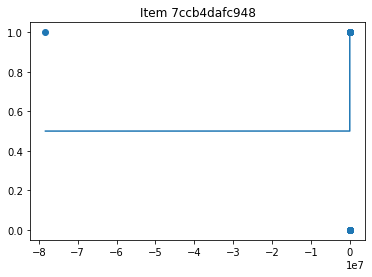

a : 16.491116570742406  b:  4.324324942099335e-18  c:  0.49999999999999994
d:  0.9999999999999719


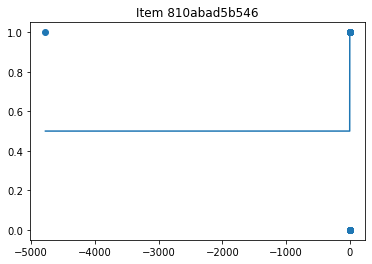

a : 53.52345515971066  b:  6.313446794913759e-33  c:  0.49999999999999994
d:  0.9999999999999999


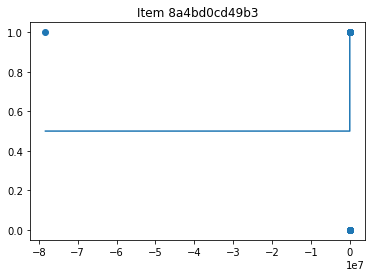

a : 25.954343207547122  b:  6.2165690816047824e-27  c:  0.49999999999999994
d:  0.9999999999999999


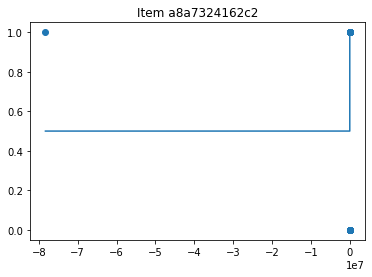

a : 50.845591405473  b:  7.201425499377017e-30  c:  0.49999999999999994
d:  0.9999999999999999


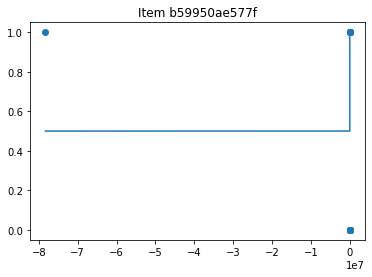

a : 25.457933642273588  b:  2.0946256007966757e-13  c:  0.4999999999999944
d:  0.9999999999901396


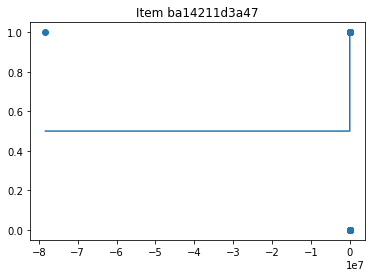

a : 39.2539701534979  b:  1.6405606317101798e-26  c:  0.49999999999999994
d:  0.9999999999999999


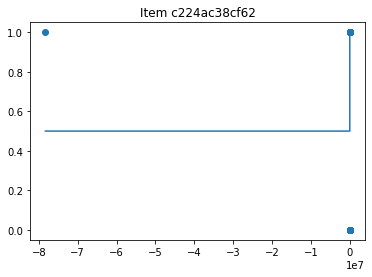

a : 49.161095654444466  b:  2.7352619369541467e-28  c:  0.49999999999999994
d:  0.9999999999999999


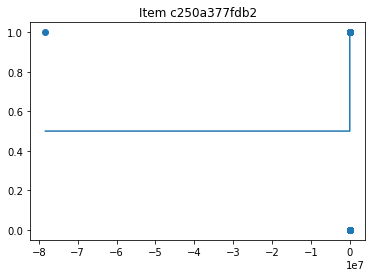

a : 39.53412914210143  b:  8.191865956238812e-26  c:  0.49999999999999994
d:  0.9999999999999999


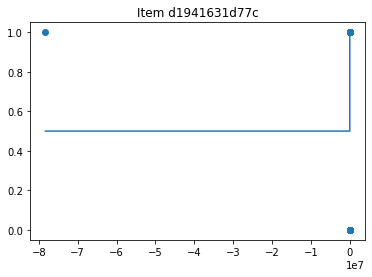

a : 25.011514213906523  b:  7.73459228448901e-23  c:  0.49999999999999994
d:  0.9999999999999999


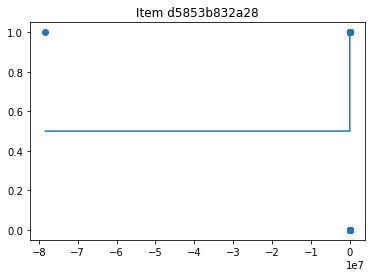

a : 27.63497312817184  b:  7.715239572280838e-28  c:  0.49999999999999994
d:  0.9999999999999999


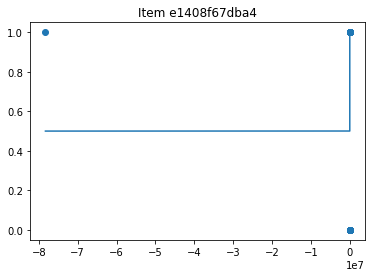

a : 29.27047192731163  b:  1.656025997539943e-27  c:  0.49999999999999994
d:  0.9999999999999999


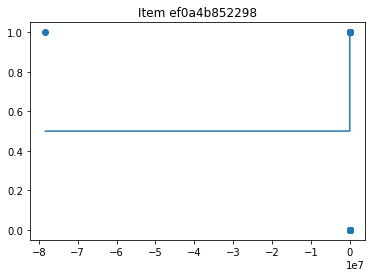

a : 39.82596999826415  b:  2.7169199531617383e-28  c:  0.49999999999999994
d:  0.9999999999999999


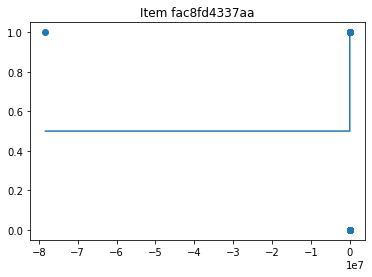

a : 51.02561976123772  b:  1.2202100884754357e-29  c:  0.49999999999999994
d:  0.9999999999999999


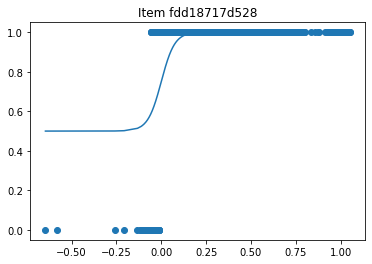

a : 26.761766426516964  b:  1.5064150387239526e-21  c:  0.49999999999999994
d:  0.9999999999999999
6.749646425247192 secs


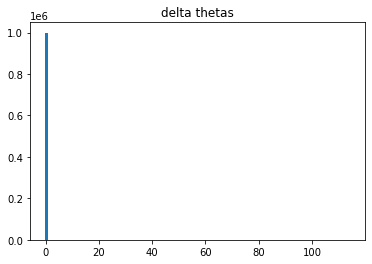

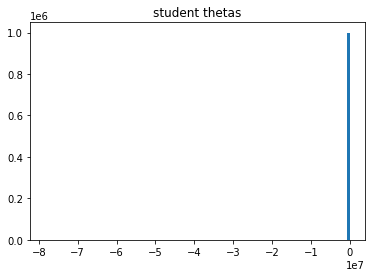

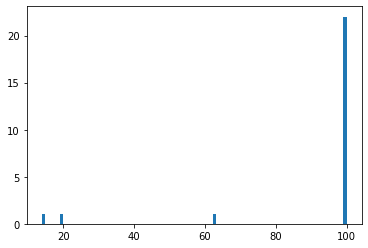

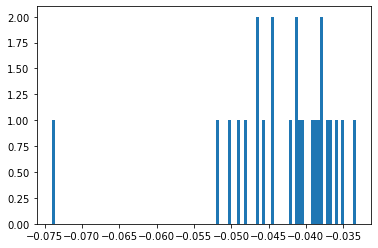

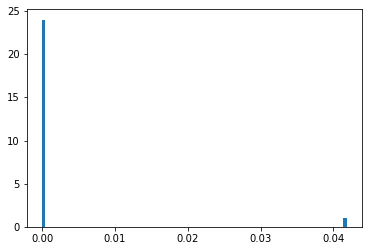

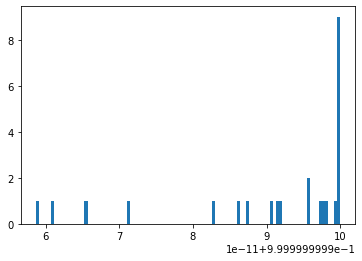

In [245]:
#only take parameters for items where alpha > 1
bad_est_items = [i[0] for i in np.argwhere(est_params[0]<1)]
#select only those questions
new_table_4 = table.iloc[:,bad_est_items]

import time 
starttime = time.time()
#run estimation procedure on that set separately
solvedIRT_4 = solve_IRT_for_matrix(new_table_4, all_thetas = None, iterations = 40, FOUR_PL=True)
print(time.time()-starttime, ' seconds.')


#visualize the results of this set of estimation cycles
start = time.time()
est_params_4 = estimate_parameters_for_skill(new_table_4, solvedIRT_4.thetas, True,FOUR_PL)
print(time.time() - start,  'secs')



try:
    plt.hist(solvedIRT_4.delta_thetas, bins =100)
    plt.title('delta thetas')
    plt.show()
except:
    print('failed to plot delta thetas')
    
plt.hist(solvedIRT_4.thetas, bins =100)
plt.title('student thetas')
plt.show()

plt.hist(solvedIRT_4.est_params[0], bins =100)
plt.show()

plt.hist(solvedIRT_4.est_params[1], bins =100)
plt.show()


plt.hist(solvedIRT_4.est_params[2], bins =100)
plt.show()


plt.hist(solvedIRT_4.est_params[3], bins =100)
plt.show()

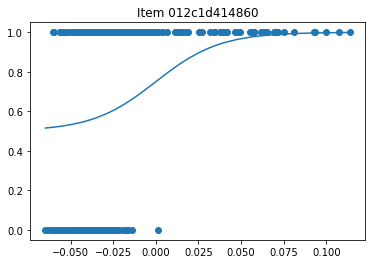

a : 53.308324439259316  b:  3.245980483845004e-17  c:  0.4999999999483253
d:  0.9999999999999999


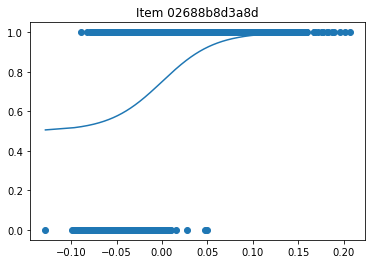

a : 34.436304365277756  b:  6.07007804517721e-14  c:  0.4999999999996923
d:  0.9999999999999637


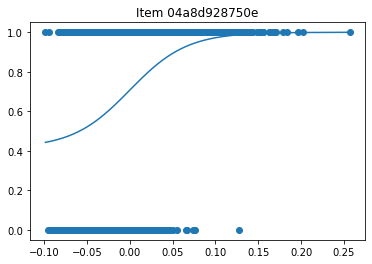

a : 29.9665150294693  b:  3.736187088760964e-27  c:  0.4134895996329862
d:  0.9999999999999999


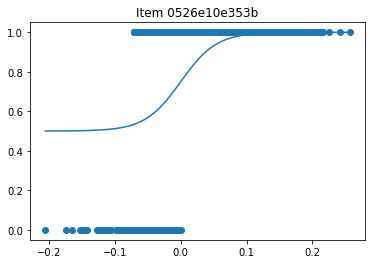

a : 36.77608044014015  b:  1.2560959445404025e-26  c:  0.49999999999999994
d:  0.9999999999999999


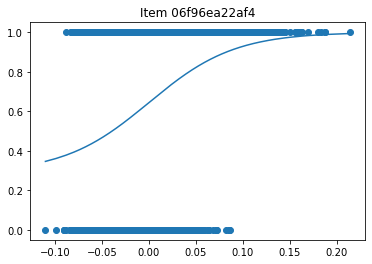

a : 21.972457444532534  b:  4.6984633608161754e-11  c:  0.2883876146845418
d:  0.9999999994625339


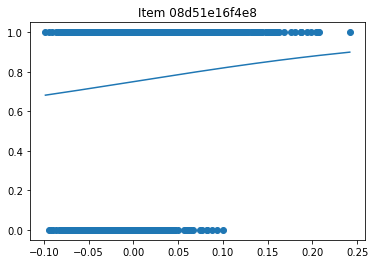

a : 5.698284072643206  b:  7.07123721363187e-13  c:  0.4999999999999251
d:  0.9999999999992923


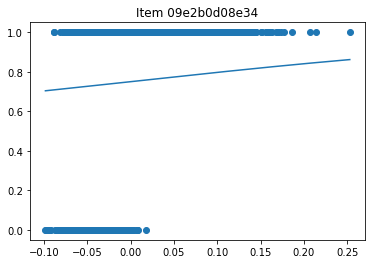

a : 3.801255292569582  b:  4.160205337568058e-15  c:  0.4999999999999984
d:  0.9999999999999972


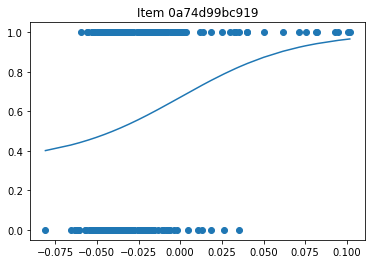

a : 28.59547918375657  b:  2.759953301662341e-20  c:  0.34207953321781376
d:  0.9999999999999999


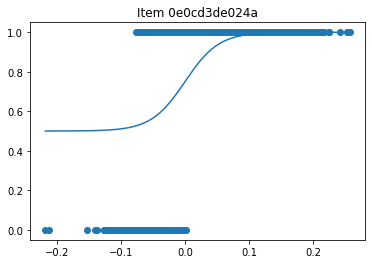

a : 37.84920271597887  b:  1.0788582635967993e-21  c:  0.49999999999999994
d:  0.9999999999999999


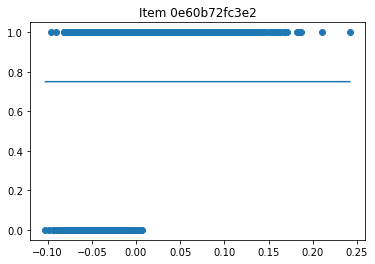

a : 5.2320301989323644e-11  b:  1.8247230976582542e-17  c:  0.49999999999999994
d:  0.9999999999999999


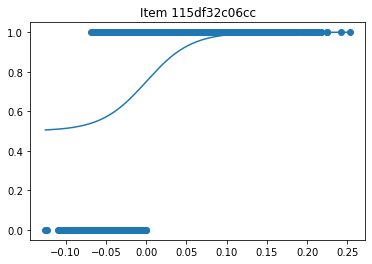

a : 35.80574754132933  b:  2.5757747022244168e-27  c:  0.49999999999999994
d:  0.9999999999999999


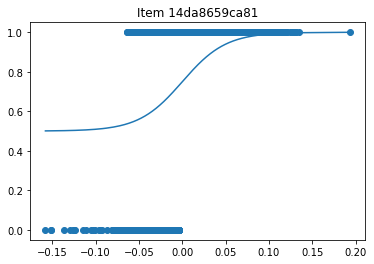

a : 39.7819069349362  b:  2.1208166753985176e-23  c:  0.49999999999999994
d:  0.9999999999999999


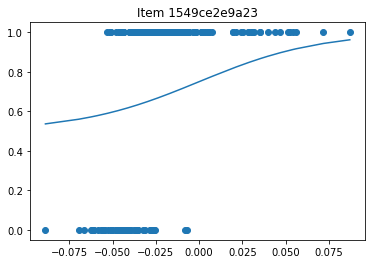

a : 28.627691433809982  b:  4.867744073850652e-40  c:  0.49999999999999994
d:  0.9999999999999999


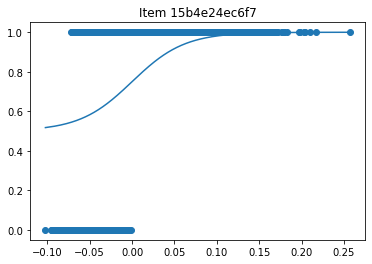

a : 32.362000894040996  b:  1.5862883097243954e-22  c:  0.49999999999999994
d:  0.9999999999999999


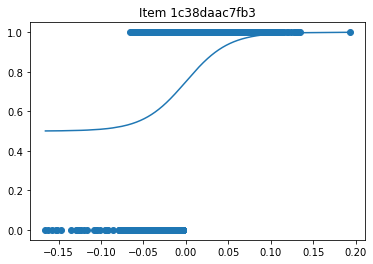

a : 39.576300142863644  b:  1.1800988522599704e-23  c:  0.49999999999999994
d:  0.9999999999999999


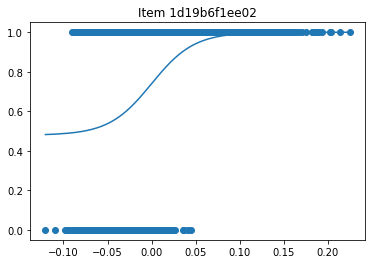

a : 41.34340690934419  b:  2.581661973007518e-19  c:  0.4789483808591012
d:  0.9999999999999932


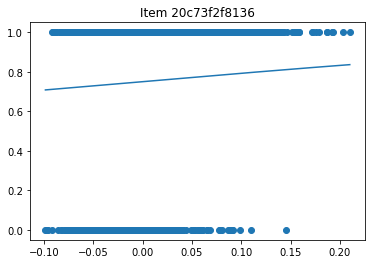

a : 3.419600194882578  b:  1.7886115088428492e-14  c:  0.49999999999999595
d:  0.9999999999999829


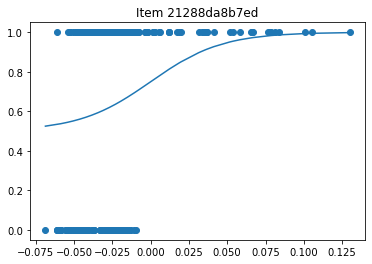

a : 42.88460992344681  b:  1.7431532774379198e-19  c:  0.49999999999999994
d:  0.9999999999999999


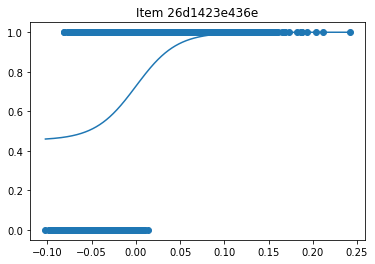

a : 43.46547333265924  b:  2.5233378948308786e-18  c:  0.453448974366481
d:  0.9999999999999999


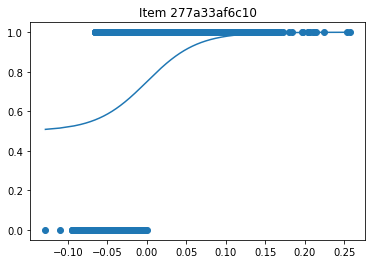

a : 31.389622181918618  b:  5.753456975858697e-20  c:  0.49999999999999994
d:  0.9999999999999999


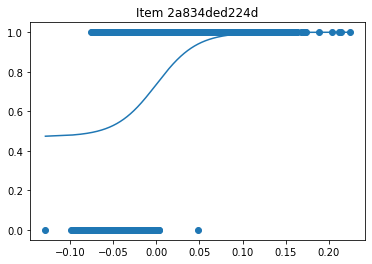

a : 42.51288045273508  b:  2.5938915101255012e-18  c:  0.47180544452078704
d:  0.9999999999998825


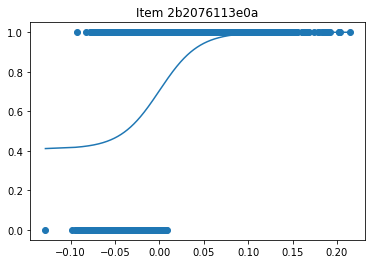

a : 45.11067722342052  b:  7.485166930208659e-19  c:  0.40977002468857476
d:  0.9999999999996703


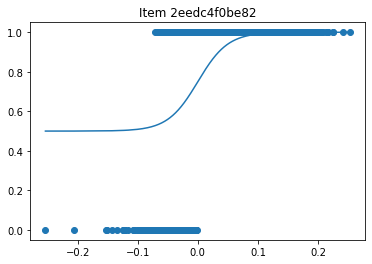

a : 39.97566560904741  b:  1.140873509171397e-25  c:  0.49999999999999994
d:  0.9999999999999999


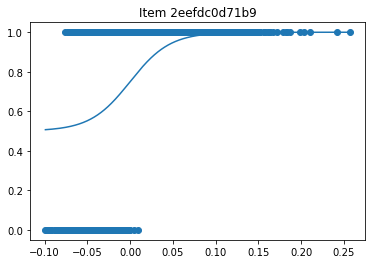

a : 42.908566551266695  b:  8.8734650487831e-15  c:  0.49999998627130327
d:  0.9999999999999993


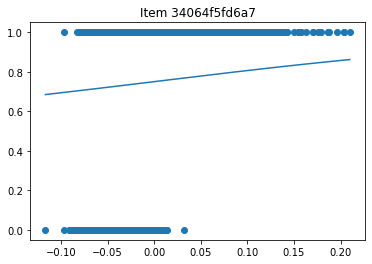

a : 4.583885527847932  b:  3.2502560738084674e-15  c:  0.4999999999999992
d:  0.9999999999999972


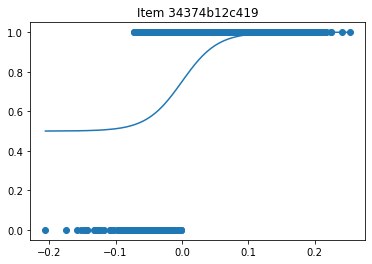

a : 37.34719209803074  b:  1.090727471399474e-21  c:  0.49999999999999994
d:  0.9999999999999999


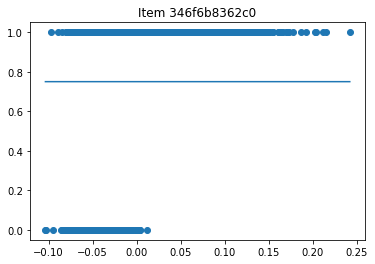

a : 1.3665593554624883e-09  b:  6.206139185935879e-14  c:  0.49999999999996075
d:  0.9999999999999706


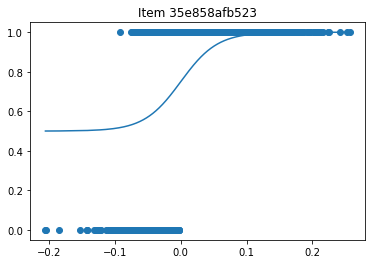

a : 35.88061217560426  b:  2.4569610361340123e-28  c:  0.49999999999999994
d:  0.9999999999999999


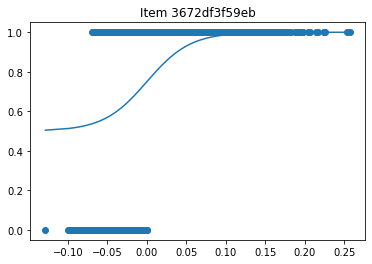

a : 36.42933847662033  b:  5.283283618564843e-21  c:  0.4999999999999834
d:  0.9999999999999999


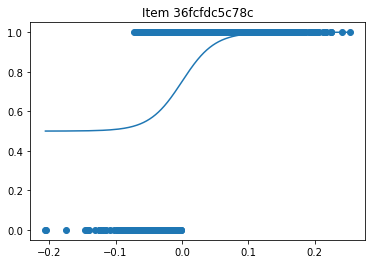

a : 40.61418485897943  b:  4.938864234779683e-26  c:  0.49999999999999994
d:  0.9999999999999999


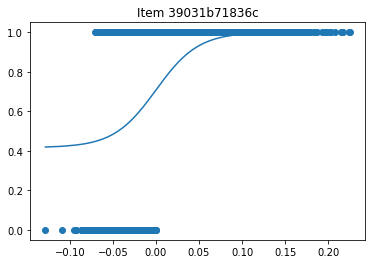

a : 40.58785339238753  b:  2.494344210140667e-19  c:  0.41615944029521046
d:  0.9999999999998613


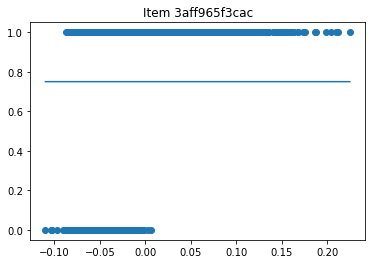

a : 1.5396015888165227e-12  b:  2.3747646906202773e-16  c:  0.49999999999999983
d:  0.9999999999999999


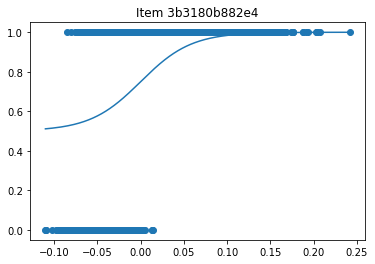

a : 34.132204417022045  b:  3.3812029392531437e-13  c:  0.49999999999618305
d:  0.9999999999997119


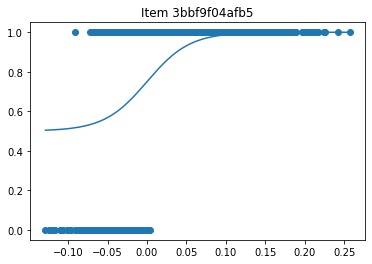

a : 36.89136964557796  b:  4.8670815204358907e-23  c:  0.49999999999999994
d:  0.9999999999999999


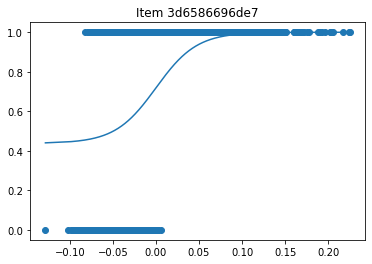

a : 42.14907645634159  b:  1.5130980570497128e-22  c:  0.4379754368108194
d:  0.9999999999999999


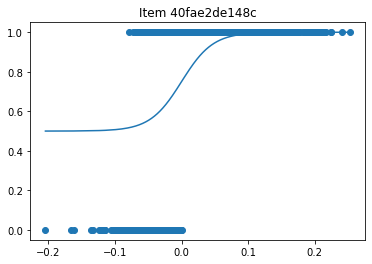

a : 42.35054901217729  b:  1.53909841289638e-25  c:  0.49999999999999994
d:  0.9999999999999999


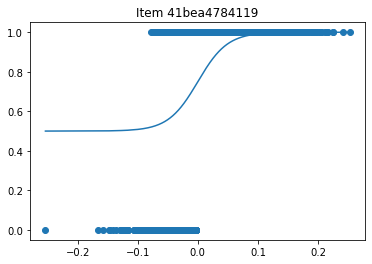

a : 40.604908436978384  b:  5.67193547334068e-26  c:  0.49999999999999994
d:  0.9999999999999999


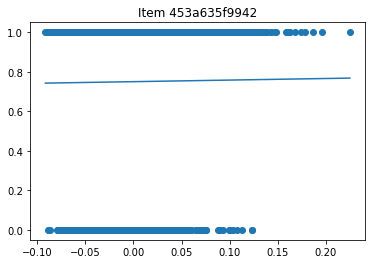

a : 0.6402159843004995  b:  2.1296260365075135e-12  c:  0.4999999999984854
d:  0.999999999999


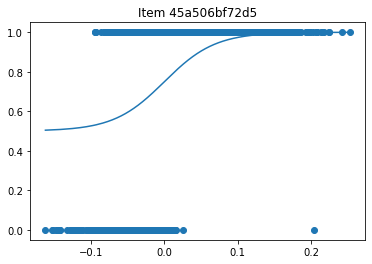

a : 28.903981089454735  b:  1.1042609524631907e-15  c:  0.49999999999999994
d:  0.9999999999999977


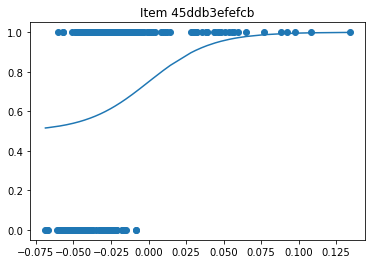

a : 47.72109932104786  b:  6.96945061055812e-18  c:  0.497422434550021
d:  0.9999999999999787


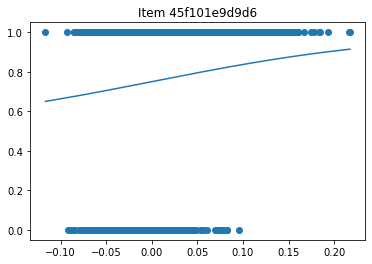

a : 7.260634280938958  b:  1.9093276541531714e-13  c:  0.4999999999999934
d:  0.999999999999769


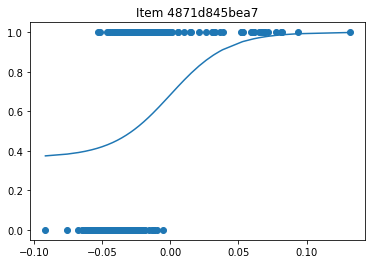

a : 47.33247504141648  b:  6.536826218863545e-18  c:  0.36636389347027687
d:  0.9999999999999999


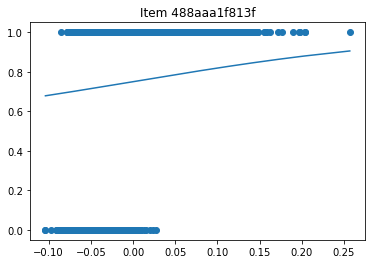

a : 5.662067877771287  b:  1.4262943447827716e-14  c:  0.49999999999999817
d:  0.9999999999999849


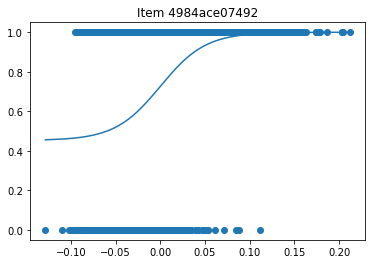

a : 39.460528122228204  b:  1.194767102356374e-19  c:  0.4525152902342731
d:  0.9999999999999999


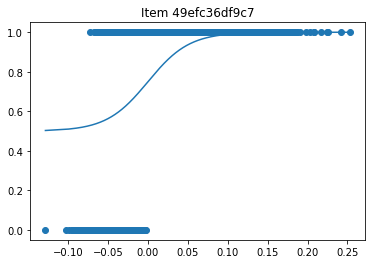

a : 38.549980046282606  b:  3.3283108627365156e-16  c:  0.49952809493155215
d:  0.9999999999999802


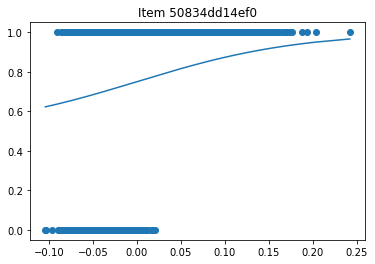

a : 10.818857220104139  b:  3.2447372616059702e-12  c:  0.4999999999999865
d:  0.9999999999949513


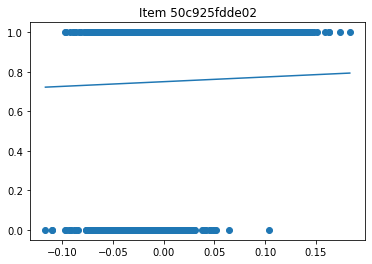

a : 1.9140077107471791  b:  4.462819673755135e-15  c:  0.4999999999999974
d:  0.9999999999999976


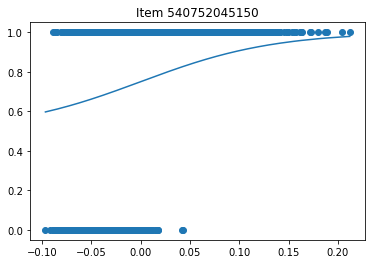

a : 14.763115338072536  b:  6.820464157295212e-16  c:  0.4999999999892006
d:  0.9999999999926351


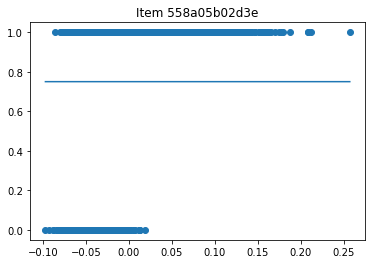

a : 4.534669240280375e-11  b:  1.5692662778089225e-17  c:  0.49999999999999994
d:  0.9999999999999999


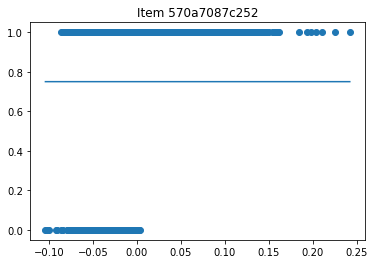

a : 1.6331263564520106e-12  b:  2.868683246508464e-16  c:  0.49999999999999983
d:  0.9999999999999999


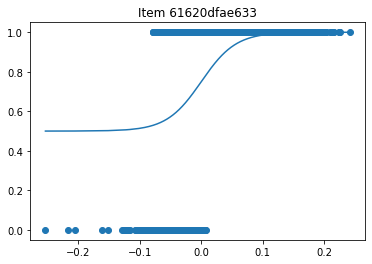

a : 35.44959589495253  b:  1.2225418021700775e-20  c:  0.49999999999999994
d:  0.9999999999999999


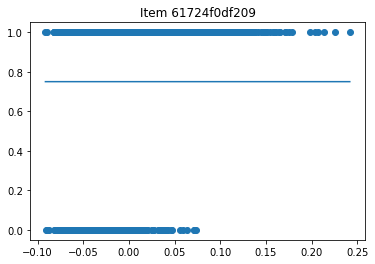

a : 3.6316150162129207e-16  b:  1.0420003737324661e-20  c:  0.49999999999999994
d:  0.9999999999999999


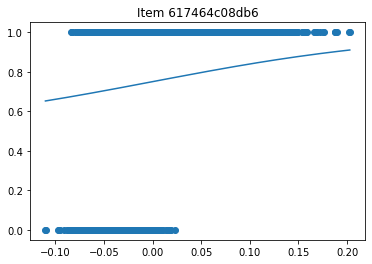

a : 7.49102704396582  b:  1.0542270421575923e-13  c:  0.49999999999999567
d:  0.999999999999861


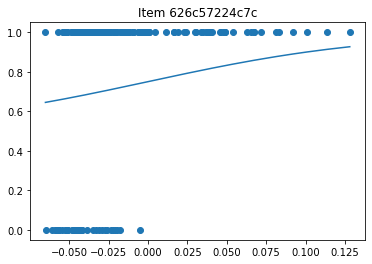

a : 13.754274135832187  b:  9.936404804553176e-15  c:  0.49999999999999983
d:  0.9999999999999916


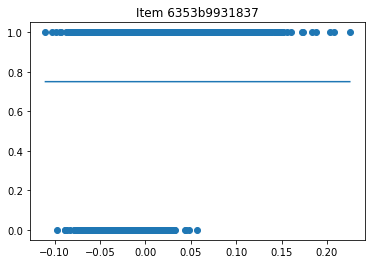

a : 1.3206783196250626e-16  b:  2.127448758762433e-21  c:  0.49999999999999994
d:  0.9999999999999999


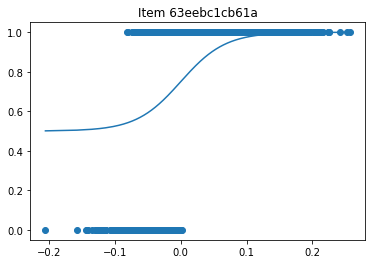

a : 29.546535548296873  b:  4.608897797782854e-21  c:  0.49999999999999994
d:  0.9999999999999999


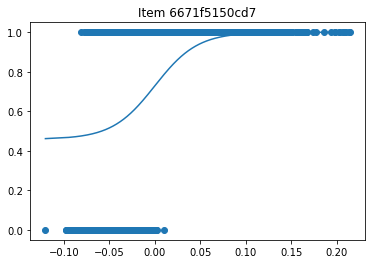

a : 42.5718590998634  b:  8.296232603132674e-22  c:  0.4586635059476607
d:  0.999999999999999


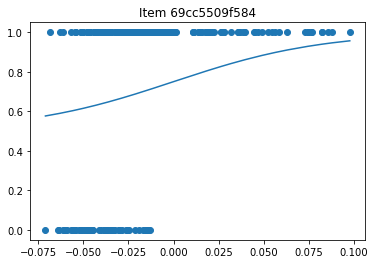

a : 24.143494856749804  b:  7.368526181394733e-24  c:  0.49999999999999994
d:  0.9999999999999999


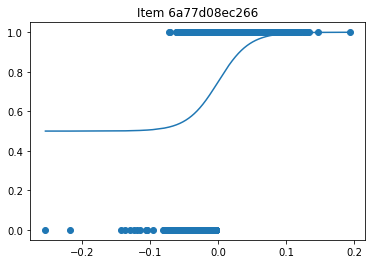

a : 43.86550457513211  b:  3.97849278894256e-19  c:  0.49999999999999994
d:  0.9999999999999999


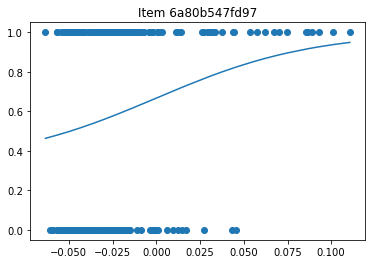

a : 22.42282635380869  b:  2.3727656908355797e-13  c:  0.33372863048685947
d:  0.9999999999967769


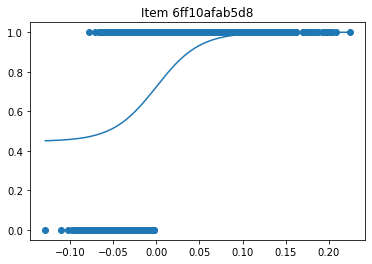

a : 39.67709163185583  b:  1.3005362842359398e-24  c:  0.4474845880370343
d:  0.9999999999999999


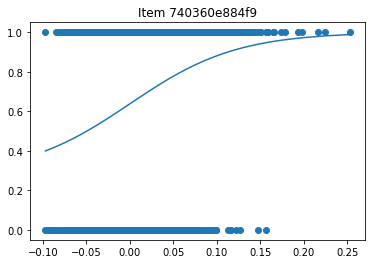

a : 16.243255780209747  b:  1.406546970259033e-12  c:  0.2753021524283283
d:  0.9999999999913096


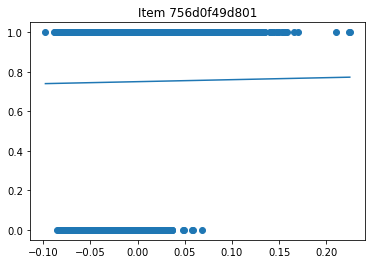

a : 0.8103046202523492  b:  4.005520402507584e-11  c:  0.49999999997140937
d:  0.9999999999811663


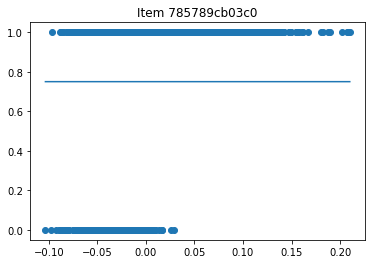

a : 3.4482718516383936e-11  b:  5.5060277959170915e-15  c:  0.4999999999999966
d:  0.9999999999999973


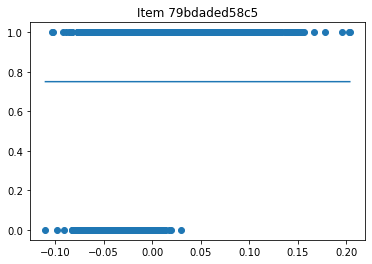

a : 4.090474451754492e-14  b:  1.2831315165449783e-19  c:  0.49999999999999994
d:  0.9999999999999999


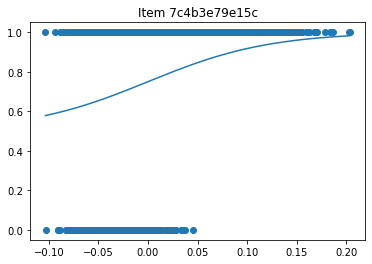

a : 16.235311871462663  b:  1.9287128925657993e-15  c:  0.49999999997041383
d:  0.9999999999808935


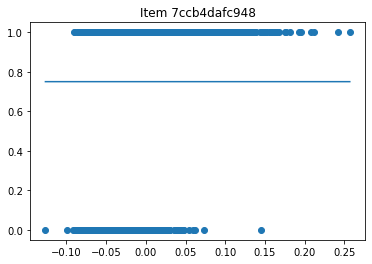

a : 4.420315550629451e-17  b:  1.5549346809326783e-20  c:  0.49999999999999994
d:  0.9999999999999999


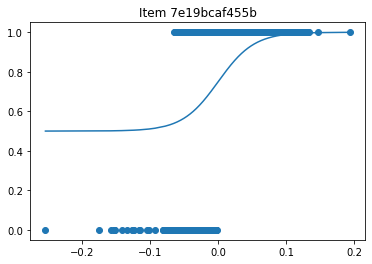

a : 37.89164864298209  b:  1.2622535700509657e-23  c:  0.49999999999999994
d:  0.9999999999999999


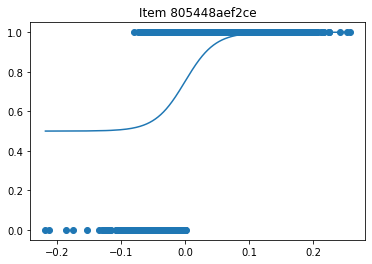

a : 42.720003577905935  b:  1.4228471828967044e-25  c:  0.49999999999999994
d:  0.9999999999999999


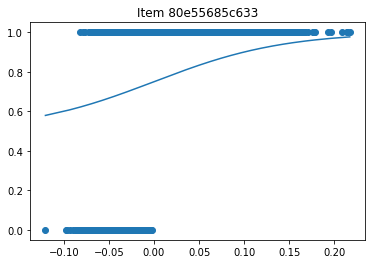

a : 13.859751938429316  b:  3.135308871088824e-15  c:  0.49999999999994554
d:  0.9999999999996937


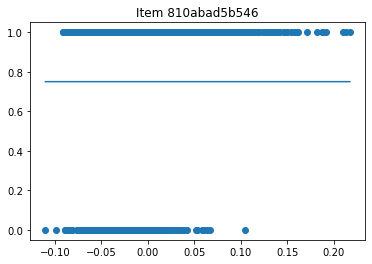

a : 3.650483539584248e-11  b:  1.0117168529123533e-16  c:  0.49999999999999994
d:  0.9999999999999999


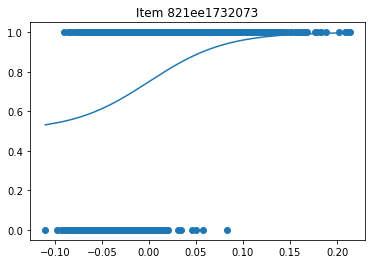

a : 24.52272880513377  b:  2.9417831930714967e-16  c:  0.4999999999994718
d:  0.9999999999999859


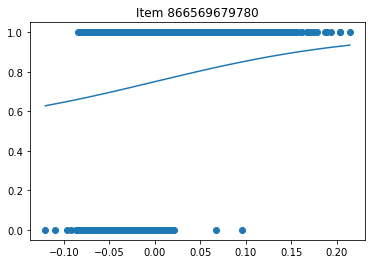

a : 8.845595483353671  b:  4.711327111932115e-13  c:  0.4999999999999925
d:  0.9999999999992968


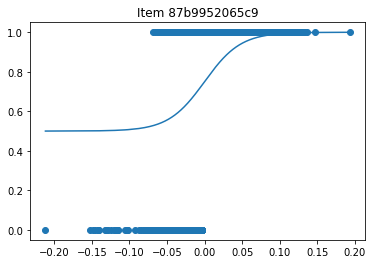

a : 41.487316156567715  b:  1.600355778722713e-23  c:  0.49999999999999994
d:  0.9999999999999999


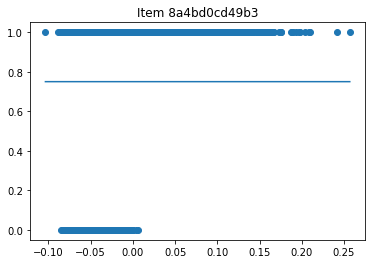

a : 1.0551592169043321e-13  b:  1.7660287259648205e-17  c:  0.49999999999999994
d:  0.9999999999999999


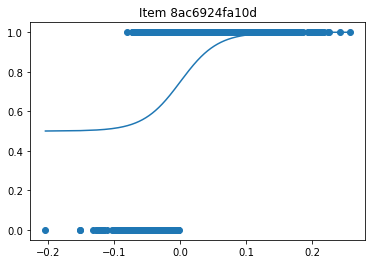

a : 35.44766545700293  b:  8.512540090004177e-27  c:  0.49999999999999994
d:  0.9999999999999999


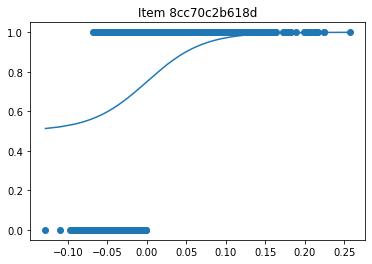

a : 28.2113328496095  b:  2.0086754792036632e-19  c:  0.49999999999999994
d:  0.9999999999999999


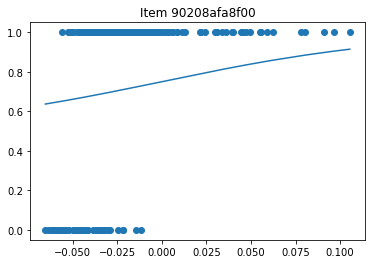

a : 14.938596202174493  b:  6.181537566295253e-14  c:  0.4999999999999993
d:  0.9999999999999434


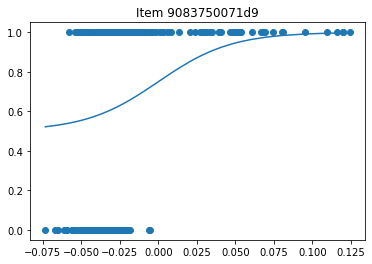

a : 42.136295774960075  b:  1.772847225975303e-23  c:  0.49999999999999994
d:  0.9999999999999999


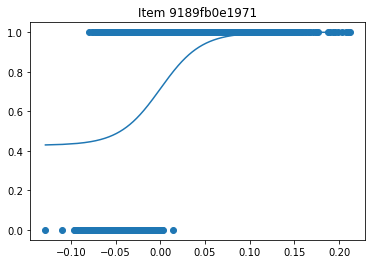

a : 43.660036297829855  b:  2.3223769745714957e-15  c:  0.42784809626931664
d:  0.9999999999940392


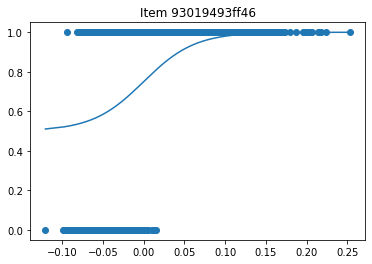

a : 31.821880008843927  b:  1.5961122764809359e-15  c:  0.49999999999598244
d:  0.9999999999999704


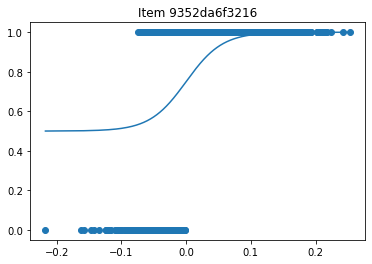

a : 35.676078400563306  b:  1.0522871796151443e-26  c:  0.49999999999999994
d:  0.9999999999999999


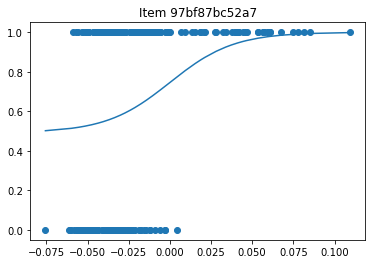

a : 51.67156017987611  b:  1.3922043483861074e-17  c:  0.49183617415612235
d:  0.9999999999999871


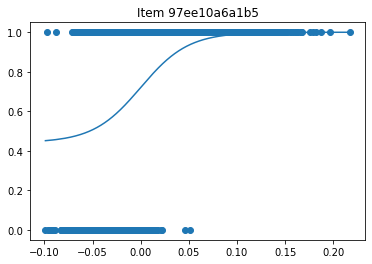

a : 40.45060493379525  b:  5.45313422949541e-15  c:  0.4414645220052792
d:  0.9999999999996481


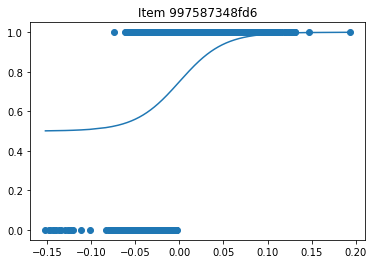

a : 39.74424977229386  b:  1.761043931563696e-23  c:  0.49999999999999994
d:  0.9999999999999999


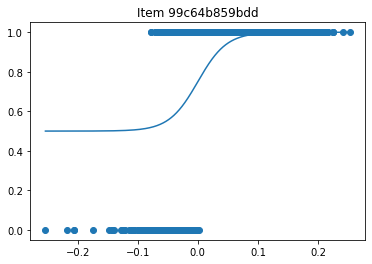

a : 41.71161373240797  b:  2.7190499353134784e-21  c:  0.49999999999999994
d:  0.9999999999999999


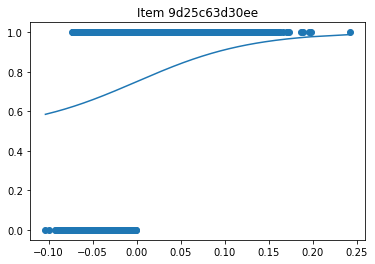

a : 15.34987345305447  b:  4.401874416715119e-15  c:  0.4999999999999356
d:  0.9999999999995908


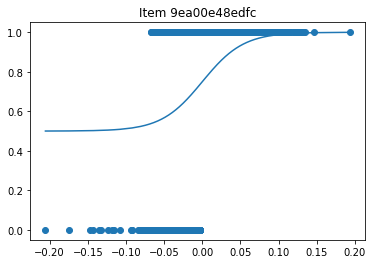

a : 37.14921026778436  b:  1.4947040712903305e-23  c:  0.49999999999999994
d:  0.9999999999999999


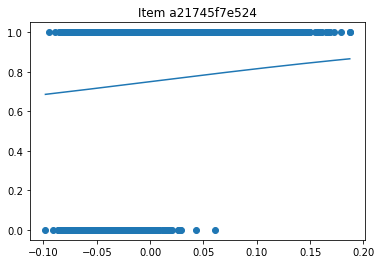

a : 5.351180337810298  b:  1.1825555563287036e-14  c:  0.4999999999999983
d:  0.9999999999999879


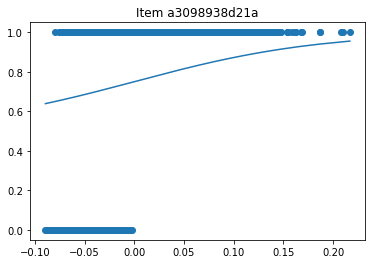

a : 10.692334038895938  b:  6.905192924080836e-13  c:  0.49999999999999295
d:  0.999999999999088


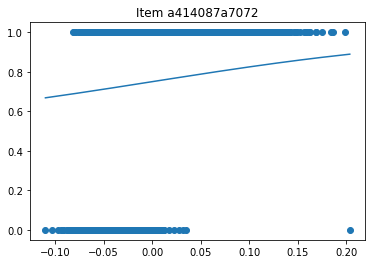

a : 6.1634694816245  b:  4.935641139252194e-14  c:  0.49999999999999667
d:  0.9999999999999405


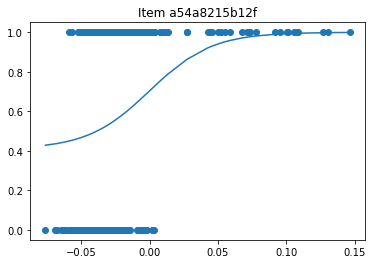

a : 43.904345705854205  b:  4.719232851030822e-18  c:  0.40833336932787556
d:  0.9999999999927741


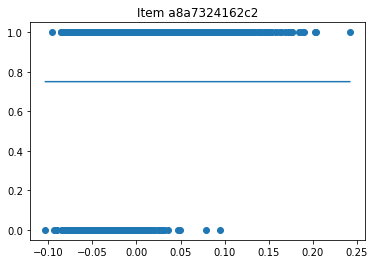

a : 2.9869389682413096e-13  b:  1.9627364774489483e-18  c:  0.49999999999999994
d:  0.9999999999999999


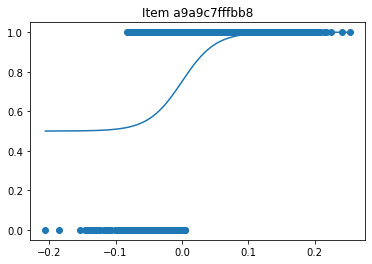

a : 39.59217494438795  b:  1.7085116077716584e-15  c:  0.49999999999999994
d:  0.9999999999999909


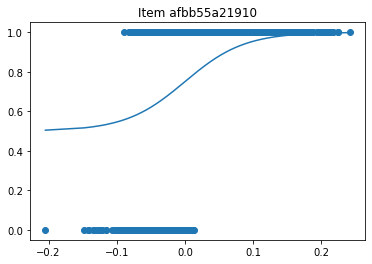

a : 22.934260716561685  b:  3.8676991567844305e-19  c:  0.49999999999999994
d:  0.9999999999999999


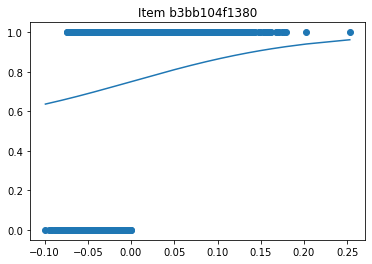

a : 9.878092704803676  b:  8.089558269796135e-14  c:  0.4999999999999981
d:  0.9999999999999107


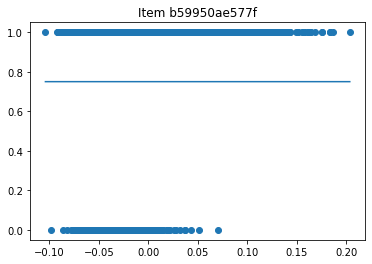

a : 7.469006775299362e-12  b:  1.4059126775386415e-15  c:  0.49999999999999917
d:  0.9999999999999993


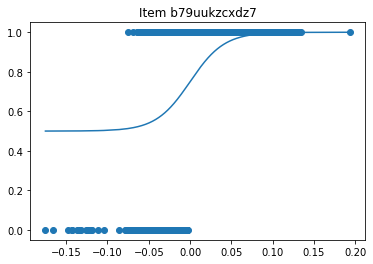

a : 48.42639453606793  b:  3.7529423372840026e-19  c:  0.49999999999999994
d:  0.9999999999999999


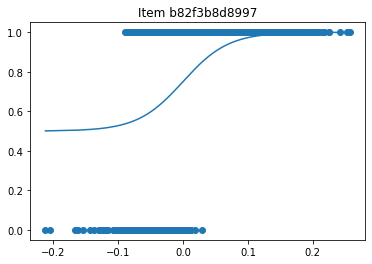

a : 28.57215247469309  b:  9.784143791111092e-16  c:  0.49999999999999994
d:  0.999999999999998


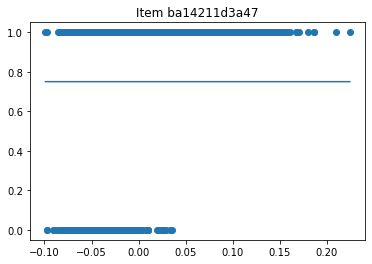

a : 9.836914173440335e-10  b:  9.249748468077705e-14  c:  0.4999999999999415
d:  0.999999999999956


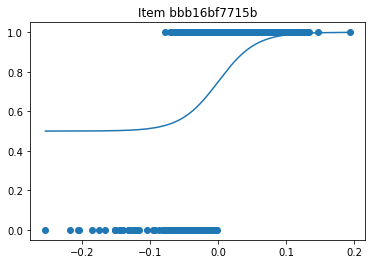

a : 36.08055671575143  b:  5.893238637297554e-19  c:  0.49999999999999994
d:  0.9999999999999999


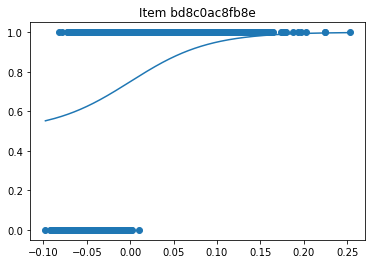

a : 22.049938876134217  b:  1.3724983154554816e-18  c:  0.49999999999393835
d:  0.9999999999999631


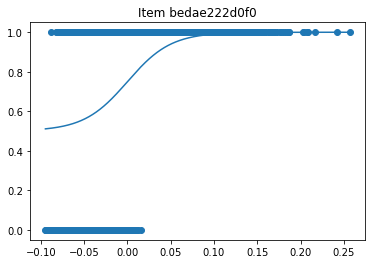

a : 39.789366168568904  b:  1.6828831883960112e-17  c:  0.49999999615864144
d:  0.9999999999999997


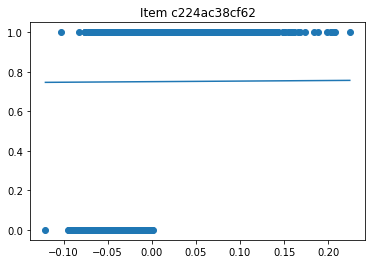

a : 0.23292649339442462  b:  5.48592740504882e-12  c:  0.4999999999961057
d:  0.9999999999975272


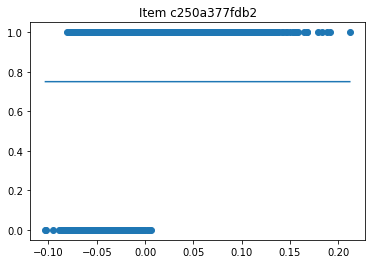

a : 3.734125888252617e-17  b:  1.2241227982857573e-22  c:  0.49999999999999994
d:  0.9999999999999999


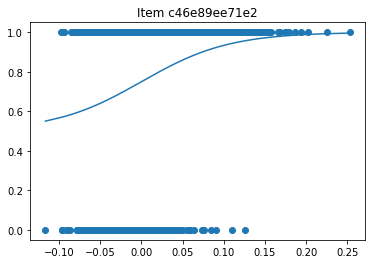

a : 18.77535931415234  b:  1.6623319815648626e-15  c:  0.49999999999934513
d:  0.999999999999757


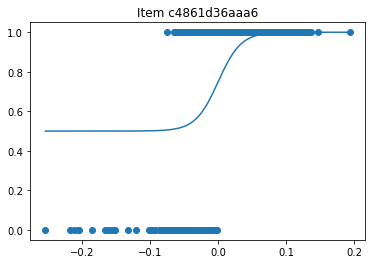

a : 60.03422031643516  b:  4.910334686597886e-20  c:  0.49999999999999994
d:  0.9999999999999999


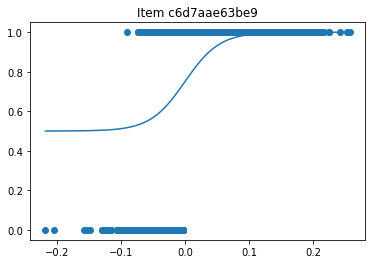

a : 37.025725962446124  b:  1.0444387577562895e-21  c:  0.49999999999999994
d:  0.9999999999999999


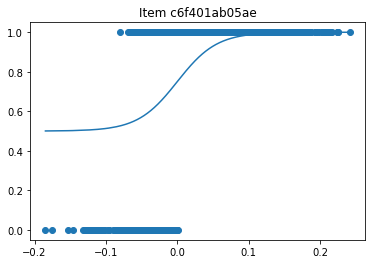

a : 36.09779450912063  b:  9.020565928886876e-27  c:  0.49999999999999994
d:  0.9999999999999999


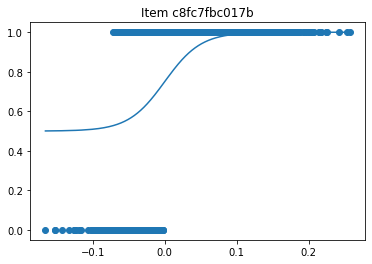

a : 39.71790044759313  b:  7.166619920892357e-26  c:  0.49999999999999994
d:  0.9999999999999999


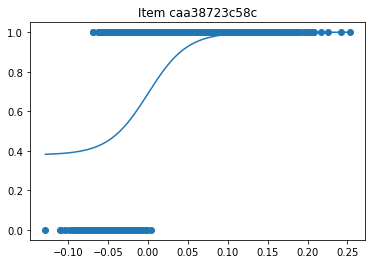

a : 40.648904250555795  b:  3.955758814585328e-17  c:  0.379168210335961
d:  0.9999999999999775


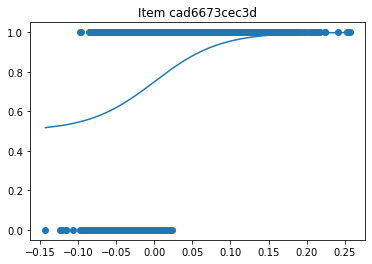

a : 23.192393662165774  b:  8.247134003127235e-16  c:  0.49999999999999994
d:  0.9999999999999987


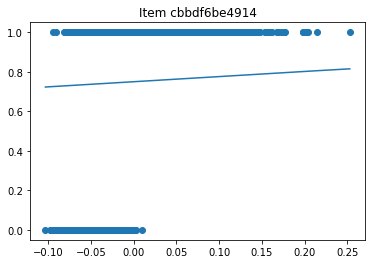

a : 2.1011616809330795  b:  5.98300415090454e-13  c:  0.49999999999963574
d:  0.9999999999996896


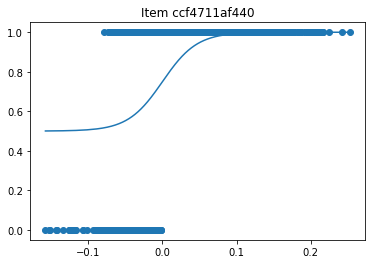

a : 42.86516616085666  b:  1.2852161410888833e-25  c:  0.49999999999999994
d:  0.9999999999999999


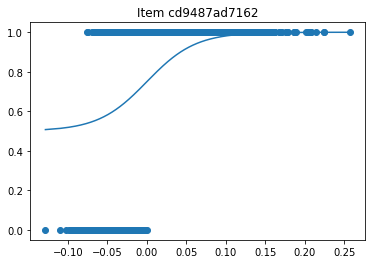

a : 32.54175240180504  b:  1.0942949644112472e-21  c:  0.49999999999999994
d:  0.9999999999999999


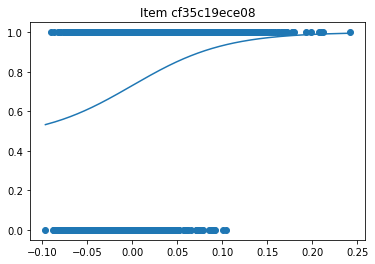

a : 19.386900234708015  b:  2.6110512669472334e-14  c:  0.46075011110489883
d:  0.99999999999901


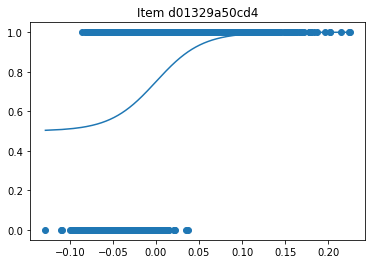

a : 37.61609453897942  b:  8.059026766107864e-16  c:  0.49999999996332545
d:  0.9999999999999768


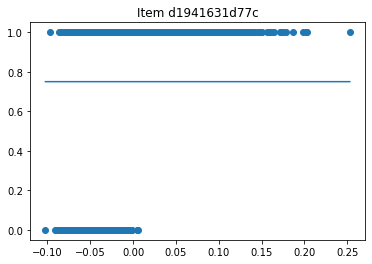

a : 4.0541881002776215e-14  b:  9.362242965087746e-18  c:  0.49999999999999994
d:  0.9999999999999999


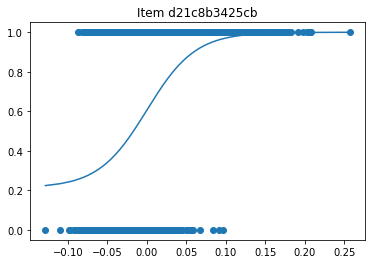

a : 32.57414403862779  b:  1.9322559448114544e-19  c:  0.21243860186903882
d:  0.9999999999943987


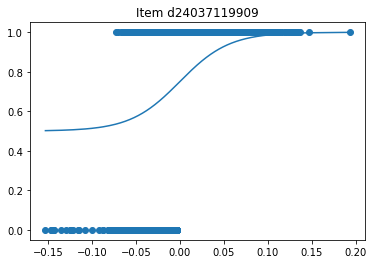

a : 35.55133652815675  b:  6.23750538631651e-19  c:  0.49999999999999994
d:  0.9999999999999999


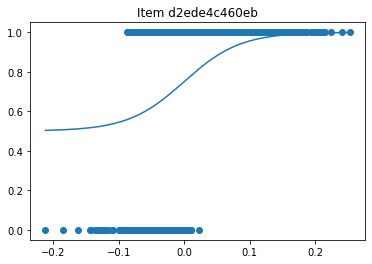

a : 23.341310661256152  b:  3.2321400602203246e-19  c:  0.49999999999999994
d:  0.9999999999999999


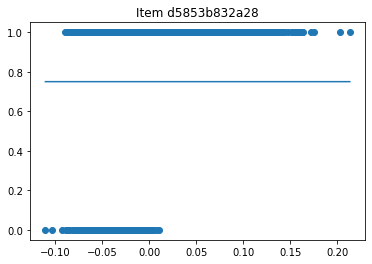

a : 1.4666923384970142e-13  b:  3.4297307847405544e-17  c:  0.49999999999999994
d:  0.9999999999999999


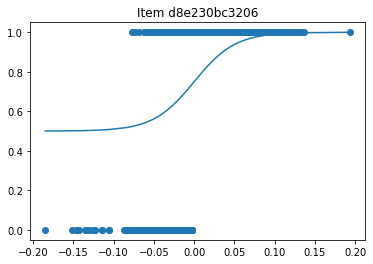

a : 39.14969154454158  b:  5.434604191034931e-19  c:  0.49999999999999994
d:  0.9999999999999999


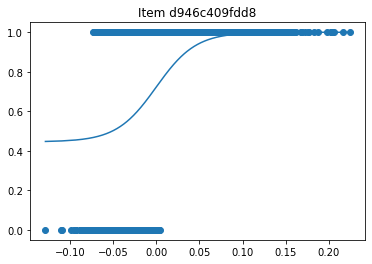

a : 43.500783012177465  b:  2.8060751640353984e-20  c:  0.44548652732902005
d:  0.9999999999999131


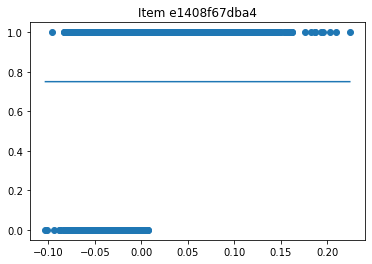

a : 8.260575014985936e-13  b:  1.4140242496805335e-16  c:  0.49999999999999994
d:  0.9999999999999999


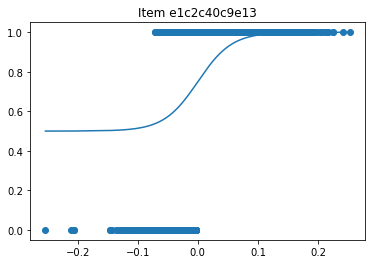

a : 35.2842431617945  b:  2.4906610795313866e-26  c:  0.49999999999999994
d:  0.9999999999999999


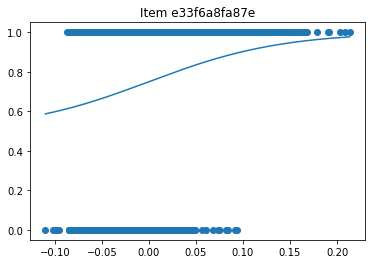

a : 14.16120985702885  b:  3.5458575178228662e-15  c:  0.49999999999989103
d:  0.9999999999984912


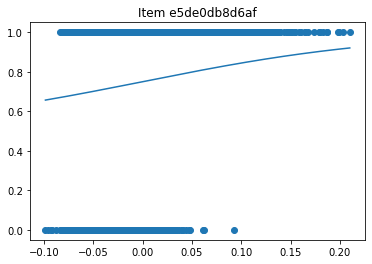

a : 7.93668044682205  b:  7.261226564183299e-13  c:  0.49999999999999034
d:  0.9999999999987444


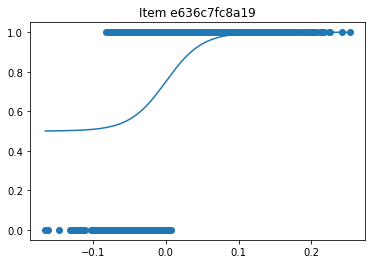

a : 40.11560934711037  b:  2.6054842555447923e-13  c:  0.4999999999999959
d:  0.9999999999983146


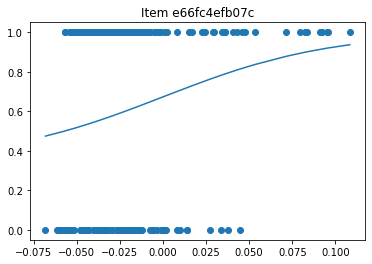

a : 20.64006796637105  b:  7.766806469488323e-13  c:  0.34595236625968323
d:  0.9999999999995658


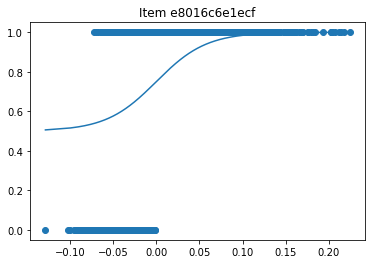

a : 34.40988104876994  b:  2.850353847312498e-26  c:  0.49999999999999994
d:  0.9999999999999999


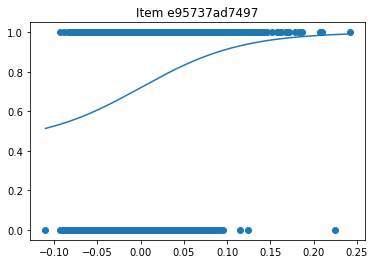

a : 17.136507471827283  b:  3.064862968059619e-11  c:  0.4395201685678001
d:  0.9999999979449138


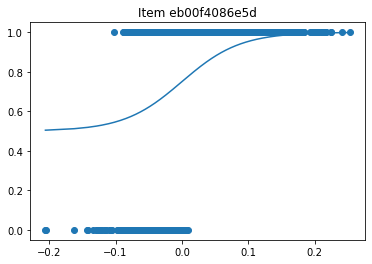

a : 22.8053468647179  b:  3.6512980101982884e-19  c:  0.49999999999999994
d:  0.9999999999999999


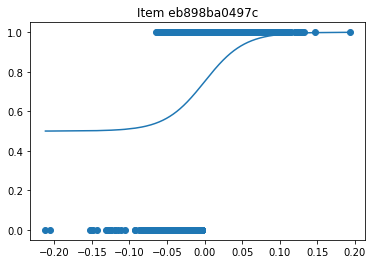

a : 37.77063706688687  b:  1.4867077715734233e-23  c:  0.49999999999999994
d:  0.9999999999999999


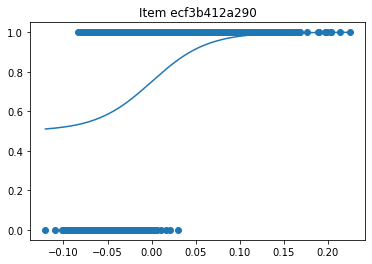

a : 31.724570498013993  b:  5.306643174863386e-15  c:  0.4999999999917504
d:  0.9999999999999007


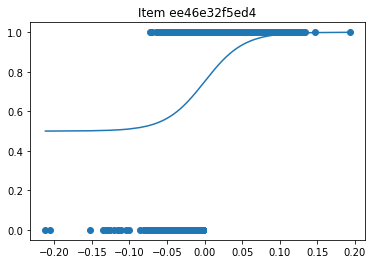

a : 38.251758668005415  b:  6.080050724468786e-19  c:  0.49999999999999994
d:  0.9999999999999999


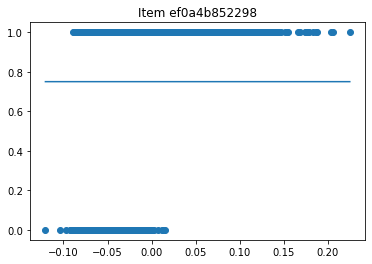

a : 9.640546848205447e-18  b:  5.95468057100353e-23  c:  0.49999999999999994
d:  0.9999999999999999


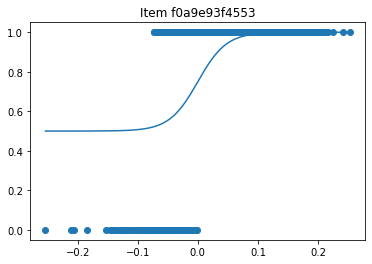

a : 42.07206101194489  b:  2.559543113442029e-21  c:  0.49999999999999994
d:  0.9999999999999999


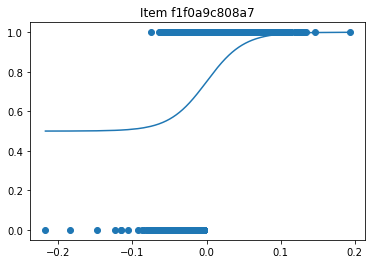

a : 39.683488517742134  b:  2.1507486897910567e-23  c:  0.49999999999999994
d:  0.9999999999999999


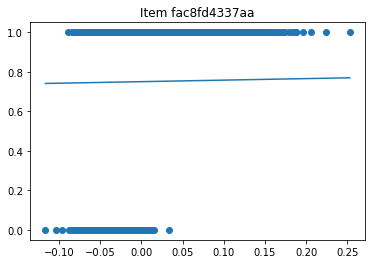

a : 0.6210570711576905  b:  5.086405279159438e-14  c:  0.49999999999996314
d:  0.999999999999977


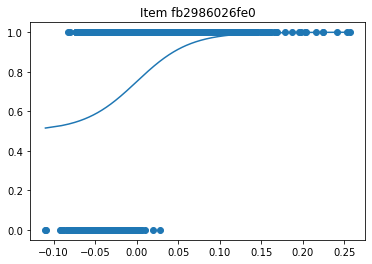

a : 31.337251594038168  b:  2.896730939204504e-15  c:  0.4999999999997383
d:  0.9999999999999944


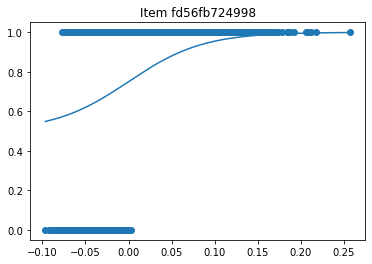

a : 23.078705739732378  b:  1.4072359099075308e-18  c:  0.49999999999979006
d:  0.9999999999999937


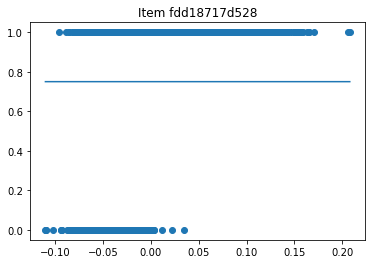

a : 2.6230318792354356e-13  b:  6.396545242507139e-17  c:  0.49999999999999994
d:  0.9999999999999999
78.17545080184937 secs


failed to plot delta thetas


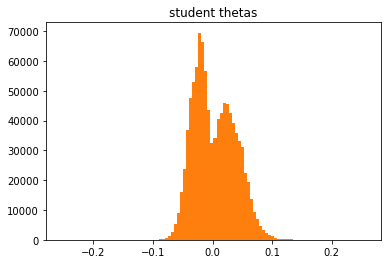

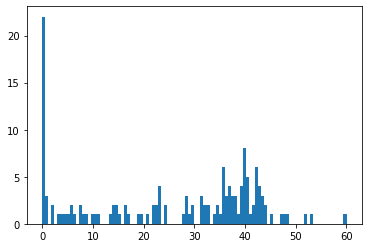

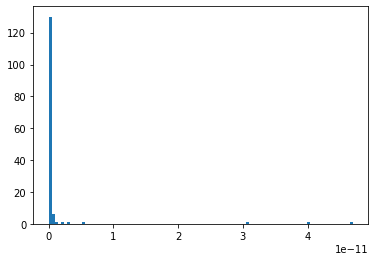

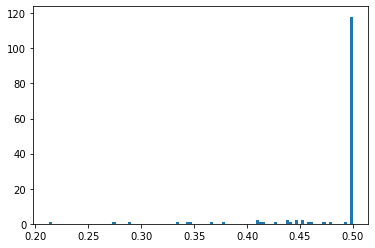

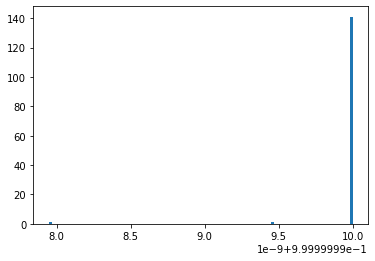

In [110]:
# i,j = np.where(all_discriminability_hx>600)
# print(i,j)
# all_discriminability_hx[:,j], all_difficulty_hx[:,j], all_guessing_hx[:,j]
try:
    plt.hist(delta_thetas, bins =100)
    plt.title('delta thetas')
    plt.show()
except:
    print('failed to plot delta thetas')
    
plt.hist(thetas, bins =100)
plt.title('student thetas')
plt.show()

plt.hist(est_params[0], bins =100)
plt.show()

plt.hist(est_params[1], bins =100)
plt.show()


plt.hist(est_params[2], bins =100)
plt.show()


plt.hist(est_params[3], bins =100)
plt.show()





In [124]:
print(np.shape(est_params))

#only take parameters for items where alpha > 1
good_est_params= np.squeeze(np.asarray([est_params[i][np.argwhere(est_params[0]>1)] for i in range(np.shape(est_params)[0])]))
print(np.shape(good_est_params))



(4, 192)
(4, 118)


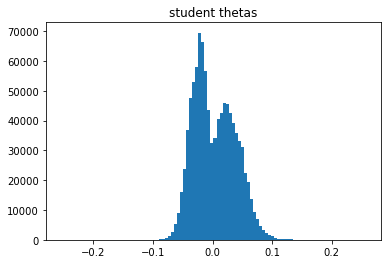

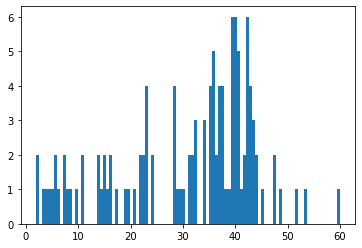

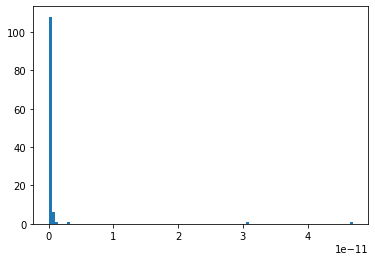

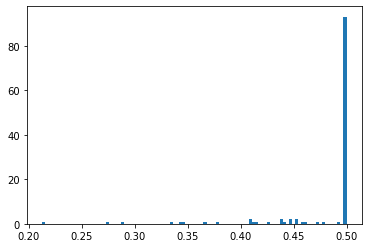

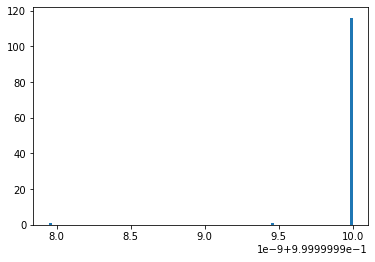

In [125]:
    
plt.hist(thetas, bins =100)
plt.title('student thetas')
plt.show()

plt.hist(good_est_params[0], bins =100)
plt.show()

plt.hist(good_est_params[1], bins =100)
plt.show()


plt.hist(good_est_params[2], bins =100)
plt.show()


plt.hist(good_est_params[3], bins =100)
plt.show()







In [ ]:
# table['general_score']=0.5
# thetas = table['general_score']
# thetas
# all_params = zip(est_params[0],est_params[1],est_params[2],est_params[3])
# # est_params[1]
# all_probs=prob_est(thetas,model,all_params) #returns #items by #users
# # np.shape(all_probs)
# all_probs

# delta_thetas = np.nanmean(all_discriminability*(table[table.columns[:-2]]-all_probs),1)/np.nansum(all_discriminability**2*all_probs*(1-all_probs),1)
# import matplotlib.pyplot as plt
# plt.hist(delta_thetas, bins =100)
# plt.show()

table['general_score']

In [ ]:
np.shape(student_thetas_hx), np.shape(all_difficulty_hx)
# np.random.choice(np.shape(student_thetas_hx)[1],1000)
plt.plot(np.mean(np.diff(student_thetas_hx,axis=0),1))
plt.show()
plt.plot(np.std(np.diff(student_thetas_hx,axis=0),1))
plt.show()

In [ ]:
plt.plot(np.nanmean(np.diff(all_difficulty_hx,axis=0),1))
plt.show()
plt.plot(np.nanstd(np.diff(all_difficulty_hx,axis=0),1))
plt.show()

In [ ]:
plt.plot(np.nanmean(np.diff(all_discriminability_hx,axis=0),1))
plt.show()
plt.plot(np.nanstd(np.diff(all_discriminability_hx,axis=0),1))
plt.show()

In [ ]:
plt.plot(np.nanmean(np.diff(all_guessing_hx,axis=0),1))
plt.show()
plt.plot(np.nanstd(np.diff(all_guessing_hx,axis=0),1))
plt.show()

In [ ]:
plt.plot(np.nanmean(np.diff(all_attention_hx,axis=0),1))
plt.show()
plt.plot(np.nanstd(np.diff(all_attention_hx,axis=0),1))
plt.show()

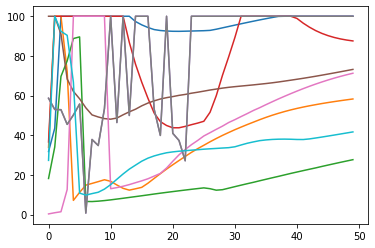

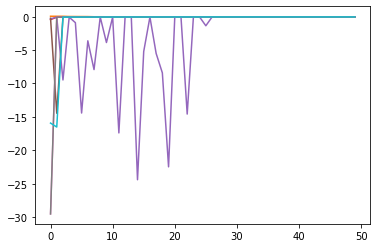

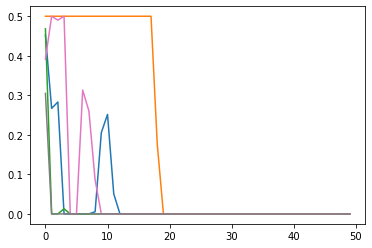

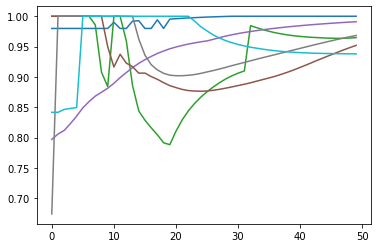

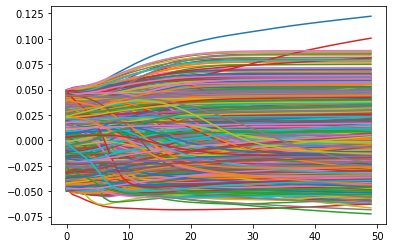

In [236]:
#plot history of estimates across iterations

import matplotlib.pyplot as plt
plt.plot(all_discriminability_hx[:,np.random.choice(np.shape(all_discriminability_hx)[1],10)])
plt.show()

plt.plot(all_difficulty_hx[:,np.random.choice(np.shape(all_difficulty_hx)[1],10)])
plt.show()

plt.plot(all_guessing_hx[:,np.random.choice(np.shape(all_guessing_hx)[1],10)])
plt.show()

if True:
    plt.plot(all_attention_hx[:,np.random.choice(np.shape(all_attention_hx)[1],10)])
    plt.show()


plt.plot(student_thetas_hx[:,np.random.choice(np.shape(student_thetas_hx)[1],1000)])
plt.show()


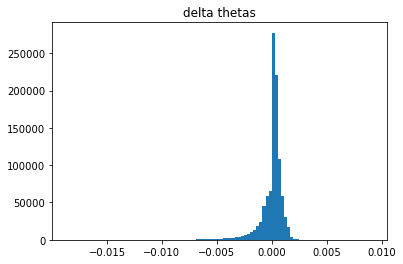

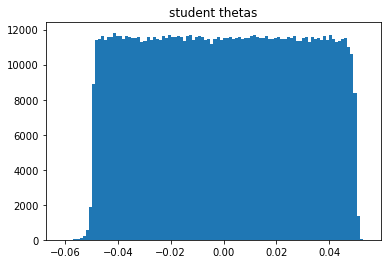

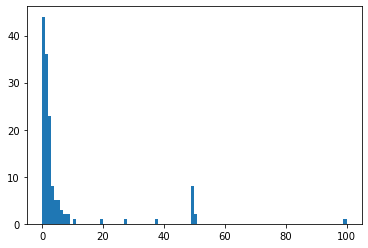

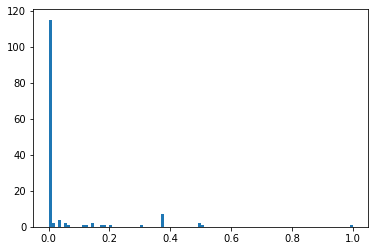

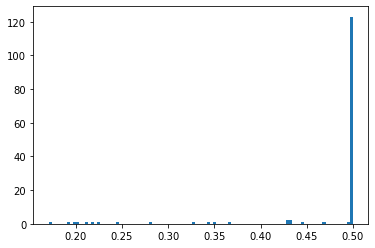

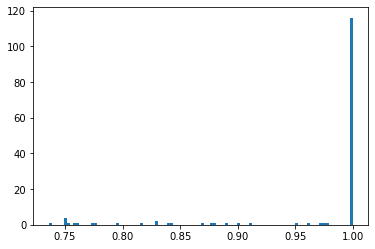

In [31]:
# i,j = np.where(all_discriminability_hx>600)
# print(i,j)
# all_discriminability_hx[:,j], all_difficulty_hx[:,j], all_guessing_hx[:,j]
plt.hist(delta_thetas, bins =100)
plt.title('delta thetas')
plt.show()

plt.hist(table['general_score'], bins =100)
plt.title('student thetas')
plt.show()

plt.hist(est_params[0], bins =100)
plt.show()

plt.hist(est_params[1], bins =100)
plt.show()


plt.hist(est_params[2], bins =100)
plt.show()


plt.hist(est_params[3], bins =100)
plt.show()




In [17]:
#check ones close to 100%, 0%
#deal with high discriminability --> hardcap? --> influences theta too much
#if guessing level <0, or =1 or high; probably bad model


In [238]:
# plt.scatter(range(10),np.min(student_thetas_hx,1))
# plt.scatter(range(10), np.max(student_thetas_hx,1))

np.nanmin(student_thetas_hx,1), np.nanmax(student_thetas_hx,1)


(array([-0.04999994, -0.07602423, -0.07765631, -0.07838404, -0.0812701 ,
        -0.08262107, -0.08545716, -0.08693366, -0.08940595, -0.09105928,
        -0.09221162, -0.09186287, -0.09365592, -0.09515984, -0.09636296,
        -0.09721573, -0.09977144, -0.10284701, -0.10603306, -0.10993088,
        -0.11216744, -0.11523721, -0.11819879, -0.12102448, -0.12339147,
        -0.12574433, -0.12815084, -0.13053805, -0.13290213, -0.13516097,
        -0.13750145, -0.13981053, -0.14209941, -0.14463199, -0.14718172,
        -0.14975696, -0.15241064, -0.15518378, -0.15806815, -0.16105873,
        -0.16415222, -0.16729087, -0.17052177, -0.17381204, -0.17715993,
        -0.18055798, -0.18397869, -0.18741378, -0.1908583 , -0.19429134]),
 array([0.04999995, 0.05430115, 0.05707479, 0.06044682, 0.06783218,
        0.07497024, 0.0819102 , 0.08893631, 0.09460253, 0.10027444,
        0.10604255, 0.11198535, 0.11710756, 0.12240734, 0.12709897,
        0.13184829, 0.13640057, 0.14124951, 0.14588941, 0.150995

In [179]:
first_run_theta_estimates = table['general_score'][:]
first_run_param_estimates = est_params[:]

In [206]:
second_run_theta_estimates = table['general_score'][:]
second_run_param_estimates = est_params[:]

In [239]:
third_run_theta_estimates = table['general_score'][:]
third_run_param_estimates = est_params[:]

In [240]:
np.corrcoef(first_run_theta_estimates,third_run_theta_estimates)[0][1]



0.9999999999999998

In [241]:
items_w_vals = ~np.isnan(first_run_param_estimates[0]) & ~np.isnan(third_run_param_estimates[0])

np.corrcoef(first_run_param_estimates[0][items_w_vals],
            third_run_param_estimates[0][items_w_vals])[0][1]

0.9303664694658522

In [242]:
items_w_vals = ~np.isnan(first_run_param_estimates[1]) & ~np.isnan(third_run_param_estimates[1])

np.corrcoef(first_run_param_estimates[1][items_w_vals],
            third_run_param_estimates[1][items_w_vals])[0][1]

0.8521787718814293

In [243]:
items_w_vals = ~np.isnan(first_run_param_estimates[2]) & ~np.isnan(third_run_param_estimates[2])

np.corrcoef(first_run_param_estimates[2][items_w_vals],
            third_run_param_estimates[2][items_w_vals])[0][1]

0.8331894103624278

In [244]:
items_w_vals = ~np.isnan(first_run_param_estimates[3]) & ~np.isnan(third_run_param_estimates[3])

np.corrcoef(first_run_param_estimates[3][items_w_vals],
            third_run_param_estimates[3][items_w_vals])[0][1]

0.6910424726995855

In [210]:
np.corrcoef(first_run_theta_estimates,second_run_theta_estimates)[0][1]


1.0

In [229]:
items_w_vals = ~np.isnan(first_run_param_estimates[0]) & ~np.isnan(second_run_param_estimates[0])

np.corrcoef(first_run_param_estimates[0][items_w_vals],
            second_run_param_estimates[0][items_w_vals])[0][1]

0.9206900157155001

In [230]:
items_w_vals = ~np.isnan(first_run_param_estimates[1]) & ~np.isnan(second_run_param_estimates[1])

np.corrcoef(first_run_param_estimates[1][items_w_vals],
            second_run_param_estimates[1][items_w_vals])[0][1]

0.8572842211660671

In [231]:
items_w_vals = ~np.isnan(first_run_param_estimates[2]) & ~np.isnan(second_run_param_estimates[2])

np.corrcoef(first_run_param_estimates[2][items_w_vals],
            second_run_param_estimates[2][items_w_vals])[0][1]

0.8164703432948086

In [232]:
items_w_vals = ~np.isnan(first_run_param_estimates[3]) & ~np.isnan(second_run_param_estimates[3])

np.corrcoef(first_run_param_estimates[3][items_w_vals],
            second_run_param_estimates[3][items_w_vals])[0][1]

0.7220738096790538

In [45]:
all_probs=prob_est(thetas,model,all_params) #returns #items by #users

np.shape(table[table.columns[:-2]]),np.shape(all_probs)

((47922, 143), (0,))

In [54]:
delta_thetas

array([ 9.05660095e-06,  1.54634410e-03,  1.64774787e-03, ...,
       -8.73224115e-06, -5.33585930e-06,  2.26592236e-03])

In [27]:
np.shape(thetas), np.shape(delta_theta)

((47922,), (47922,))

In [9]:
np.shape(all_discriminability), np.shape(table[table.columns[:-2]]), np.shape(all_probs)

((143,), (47922, 143), (47922, 143))

In [36]:
np.shape( np.nansum(all_discriminability*(table[table.columns[:-2]]-all_probs),1) )

(47922,)

In [35]:
np.shape( np.nansum(all_discriminability**2*all_probs*(1-all_probs),1) )

# np.shape(all_discriminability**2*all_probs)

(47922,)

In [135]:


print(min(delta_theta.values), max(delta_theta.values))

NameError: name 'delta_theta' is not defined

iteration # 0


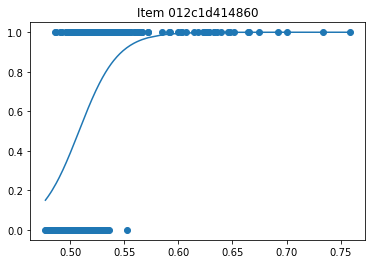

a : 55.782434539982646  b:  0.5081652072731854  c:  0.0
d:  1.0


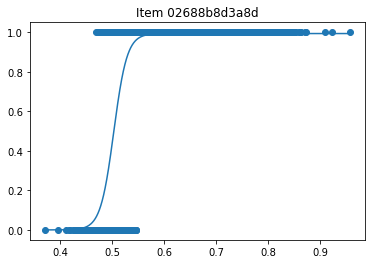

a : 78.37907178151843  b:  0.503177624925753  c:  0.0
d:  0.9934309975379743


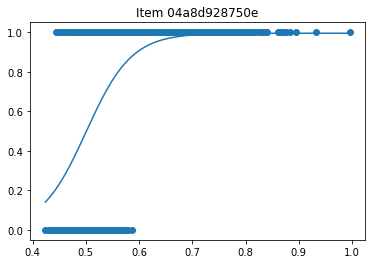

a : 23.49613289400808  b:  0.5007430683201268  c:  0.0
d:  0.9951407124584257


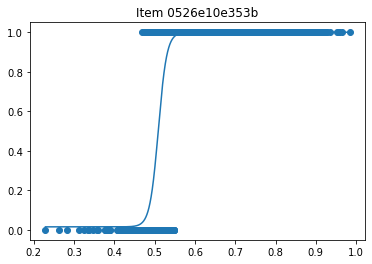

a : 95.12181471754143  b:  0.5092623490989588  c:  0.01552428659753347
d:  1.0


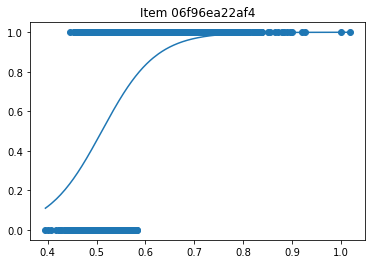

a : 18.11835118052179  b:  0.5108144066113394  c:  0.0
d:  1.0


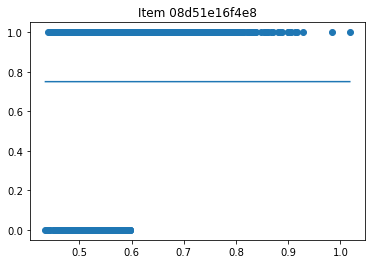

a : 0.0025290637335306024  b:  0.5  c:  0.5
d:  1.0


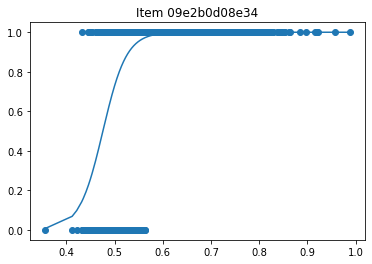

a : 40.84229922912776  b:  0.4755708055503922  c:  0.0
d:  1.0


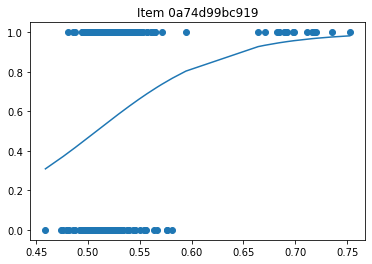

a : 16.31858183327558  b:  0.5081830906654422  c:  0.0
d:  1.0


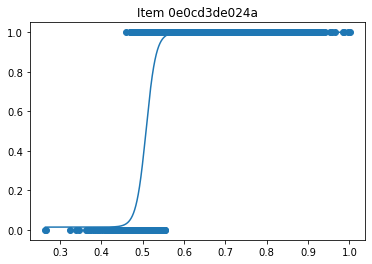

a : 83.90704596507786  b:  0.508221703366854  c:  0.01418397179068931
d:  1.0


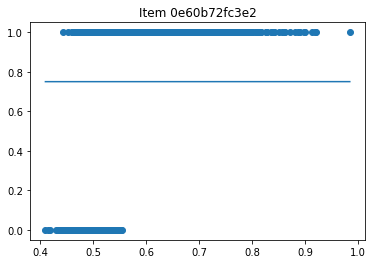

a : 0.002255480710641594  b:  0.5  c:  0.5
d:  1.0


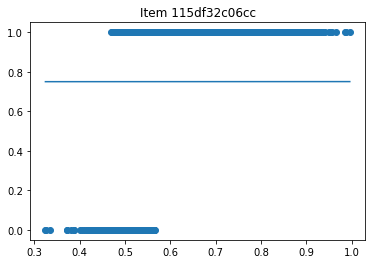

a : 0.005239574056205821  b:  0.5  c:  0.5
d:  1.0


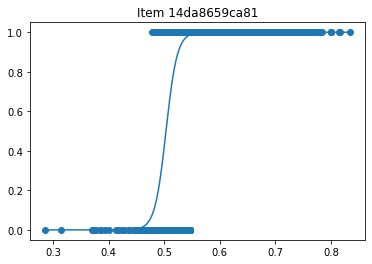

a : 100.0  b:  0.5034054183193306  c:  0.0
d:  1.0


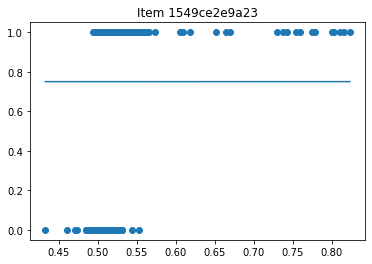

a : 0.004338290273874729  b:  0.5  c:  0.5
d:  1.0


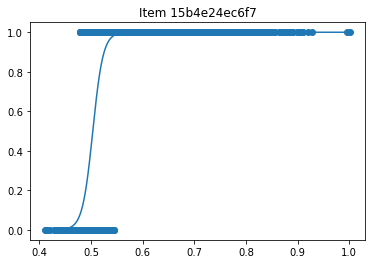

a : 100.0  b:  0.5034552082315424  c:  0.0
d:  1.0


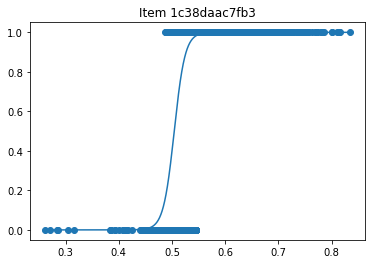

a : 98.4097937192285  b:  0.5041147857185121  c:  0.0
d:  0.9995245811278896


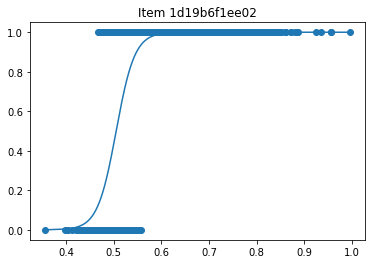

a : 51.38934973604287  b:  0.5048901201303553  c:  0.0
d:  1.0


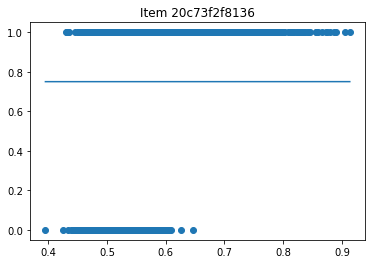

a : 0.0024017387600882094  b:  0.5  c:  0.5
d:  1.0


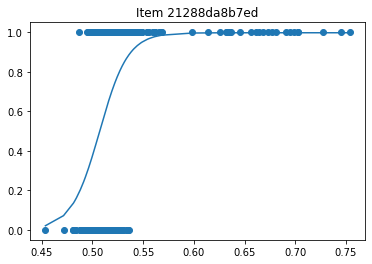

a : 71.65995845386837  b:  0.5070725802144039  c:  0.0
d:  0.9974333695312335


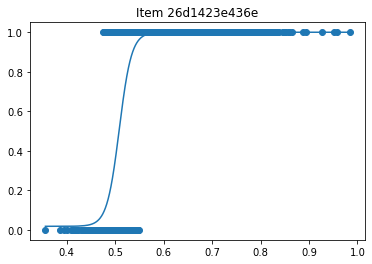

a : 78.9232094577904  b:  0.5086168729792259  c:  0.018275476072784416
d:  1.0


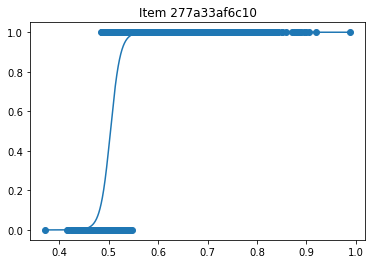

a : 100.0  b:  0.5033236072058479  c:  0.0
d:  1.0


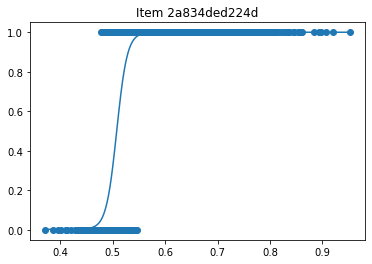

a : 100.0  b:  0.5076965538349575  c:  0.003049647411796845
d:  1.0


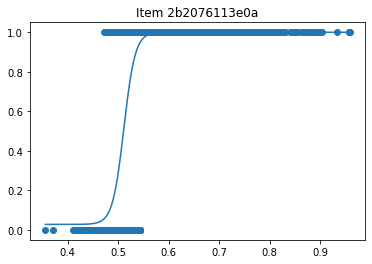

a : 89.65807721257539  b:  0.5114559498554693  c:  0.027881817082965447
d:  1.0


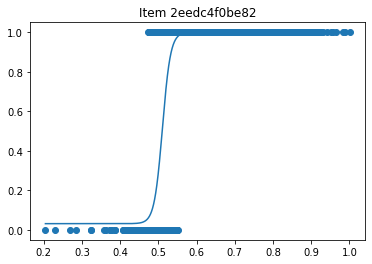

a : 94.18656750918485  b:  0.5107232998802868  c:  0.031639827033991166
d:  1.0


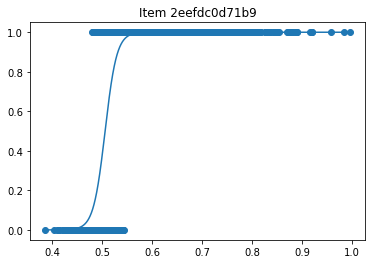

a : 85.94067262065609  b:  0.5059572633483231  c:  0.0
d:  1.0


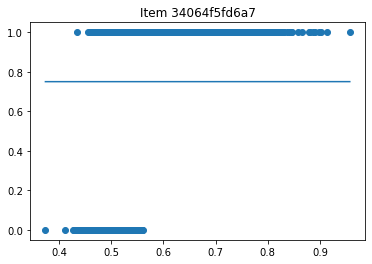

a : 0.0024163799919188025  b:  0.5  c:  0.5
d:  1.0


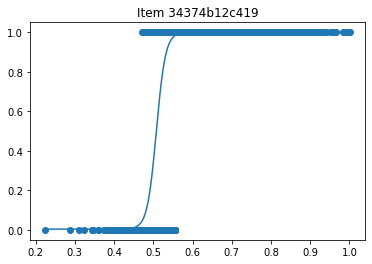

a : 85.99763512731712  b:  0.5079038413763228  c:  0.003961029935767149
d:  0.9995889792938897


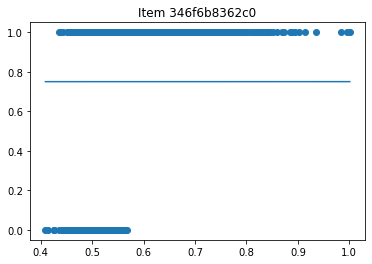

a : 0.0021049791196655282  b:  0.5  c:  0.5
d:  1.0


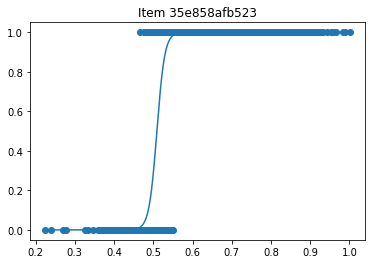

a : 100.0  b:  0.5092127443229343  c:  0.0
d:  1.0


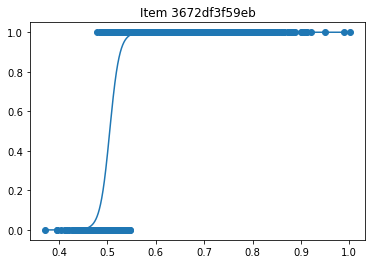

a : 100.0  b:  0.504647769179064  c:  0.0
d:  1.0


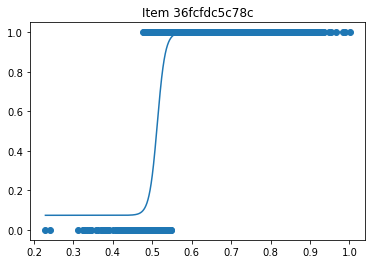

a : 100.0  b:  0.5128673136891182  c:  0.07393552530848702
d:  1.0


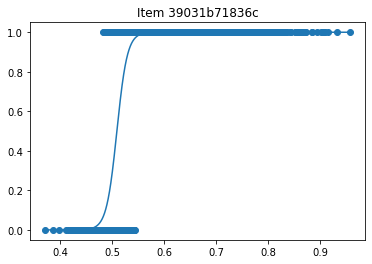

a : 100.0  b:  0.5091691329872776  c:  0.0
d:  1.0


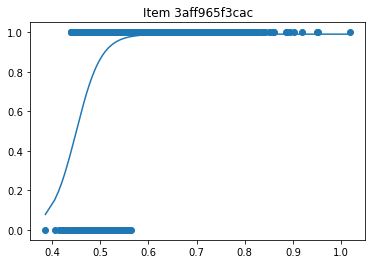

a : 38.507796468053314  b:  0.4502113356547799  c:  0.0
d:  0.9903889305070924


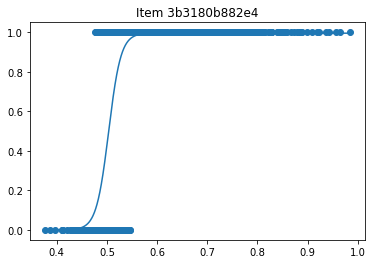

a : 81.87234666613423  b:  0.5034420712693031  c:  0.0
d:  0.9952656368298565


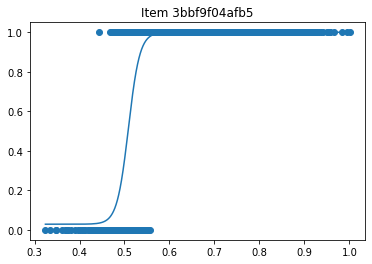

a : 79.20678528912433  b:  0.508717313686427  c:  0.028887665422394286
d:  1.0


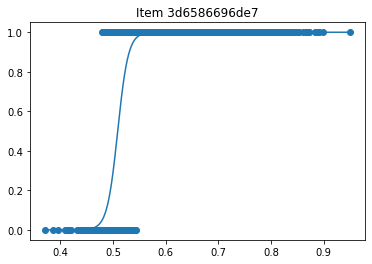

a : 100.0  b:  0.5088872079750141  c:  0.0
d:  1.0


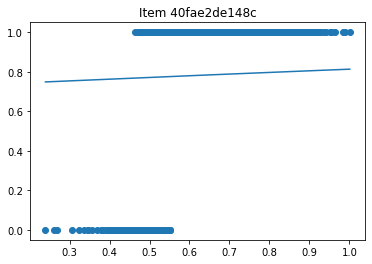

a : 0.650693806230151  b:  5.551115123125783e-17  c:  0.45489443145375497
d:  1.0


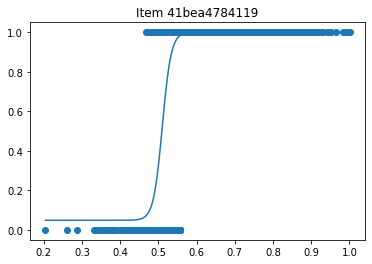

a : 86.66753446324336  b:  0.5104419546508431  c:  0.04863200060671091
d:  1.0


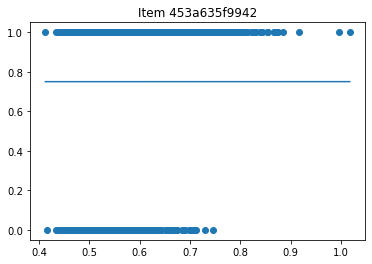

a : 0.002123514636724937  b:  0.5  c:  0.5
d:  1.0


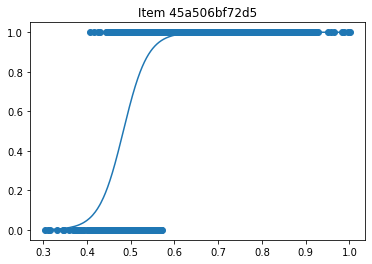

a : 35.897360274884605  b:  0.4831101843827274  c:  0.0
d:  1.0


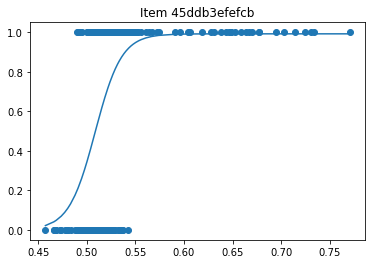

a : 73.90539819156902  b:  0.5086999087706516  c:  0.0
d:  0.9919636174863611


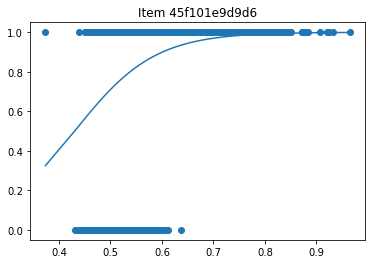

a : 12.875758418837204  b:  0.43040538955738356  c:  0.0
d:  1.0


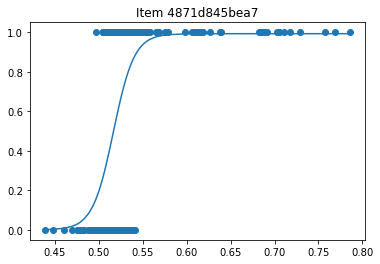

a : 84.69703465127337  b:  0.5169194121246795  c:  0.0
d:  0.992723750702766


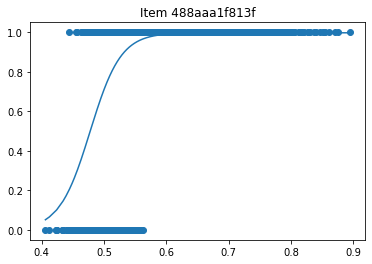

a : 40.53483339532821  b:  0.4776003147203972  c:  0.0
d:  0.9971999661771764


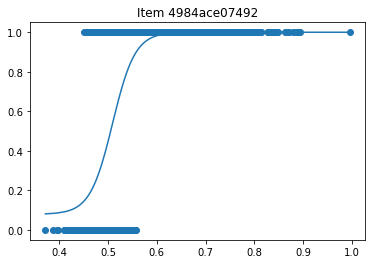

a : 43.4659481573615  b:  0.5094352846108124  c:  0.07907289366724768
d:  1.0


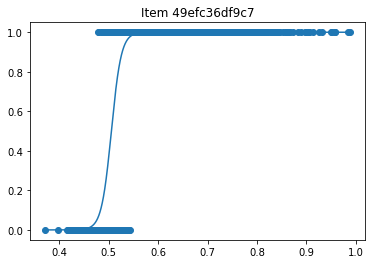

a : 100.0  b:  0.5052159076502061  c:  0.0
d:  1.0


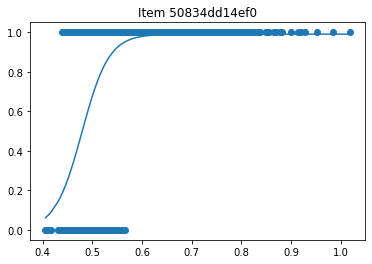

a : 36.96671469737154  b:  0.4793485231263881  c:  0.0
d:  0.9902947330395024


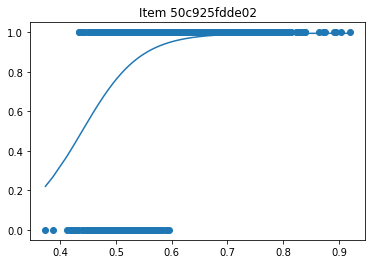

a : 19.233710726293378  b:  0.43896926024028254  c:  0.0
d:  0.9949140833401157


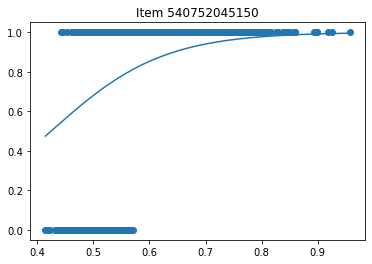

a : 10.014536246668838  b:  0.4245425198237796  c:  0.0
d:  0.9999999999966972


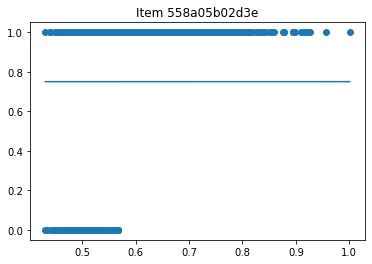

a : 0.00222988305757599  b:  0.5  c:  0.5
d:  1.0


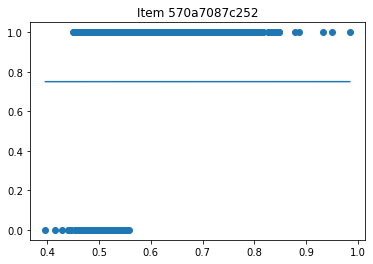

a : 0.001968371731363881  b:  0.5  c:  0.5
d:  1.0


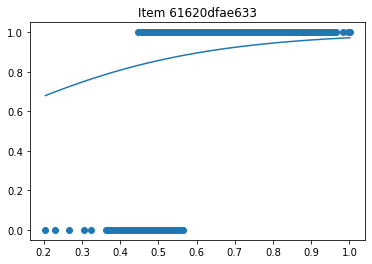

a : 3.535164209039268  b:  0.0  c:  0.01927782982342
d:  0.9999999999882239


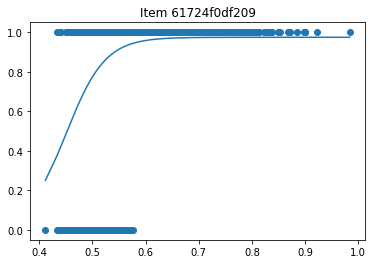

a : 27.256381979805177  b:  0.4505338641237918  c:  0.0
d:  0.974551826719403


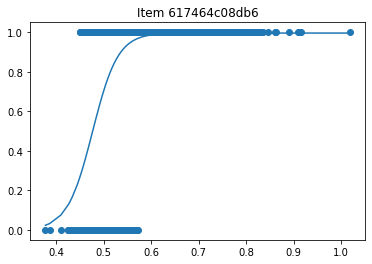

a : 37.57223673998189  b:  0.4766839602324976  c:  0.0
d:  0.9959126411989745


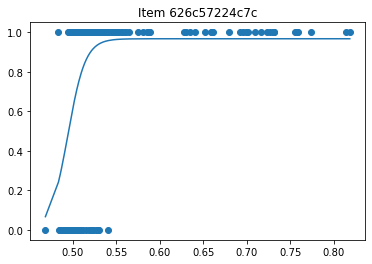

a : 100.0  b:  0.49420849889517715  c:  0.0
d:  0.9671198329338012


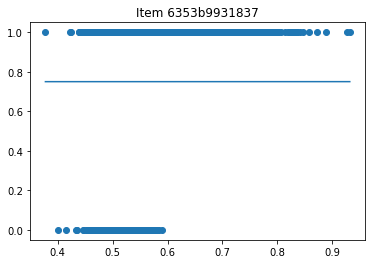

a : 0.002054699515716723  b:  0.5  c:  0.5
d:  1.0


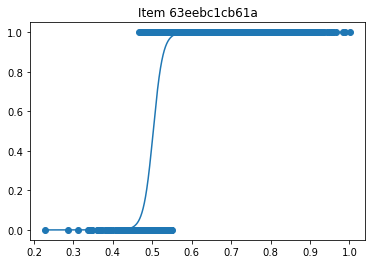

a : 82.00851516515084  b:  0.5025148667839588  c:  0.0
d:  0.9993524330920943


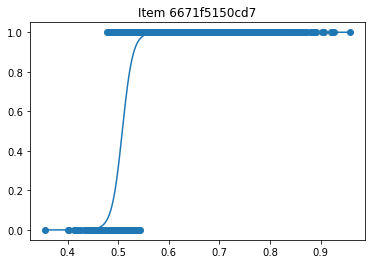

a : 96.63997466980675  b:  0.5080648413263286  c:  0.0
d:  1.0


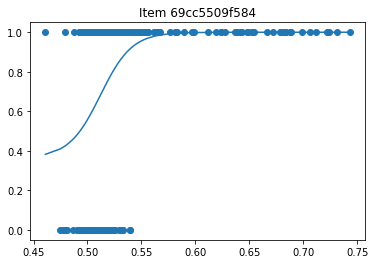

a : 68.51443482024743  b:  0.5120131328385894  c:  0.363568483926675
d:  1.0


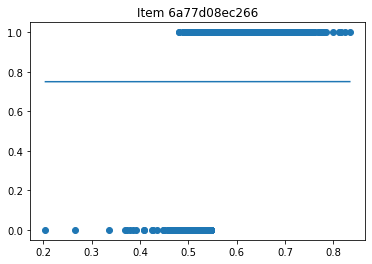

a : 0.0059676736060849415  b:  0.5  c:  0.5
d:  1.0


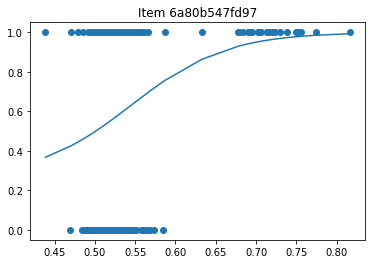

a : 16.92297085346976  b:  0.5454806277370096  c:  0.26393745385103723
d:  1.0


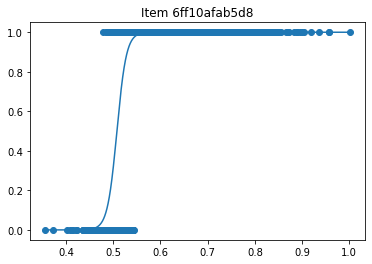

a : 100.0  b:  0.5076747906272526  c:  0.0
d:  1.0


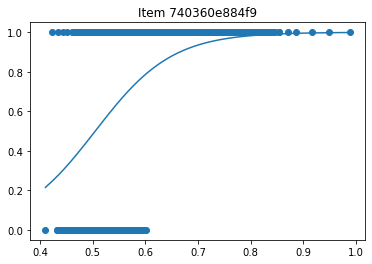

a : 13.684439613808445  b:  0.5045864822649345  c:  0.0
d:  1.0


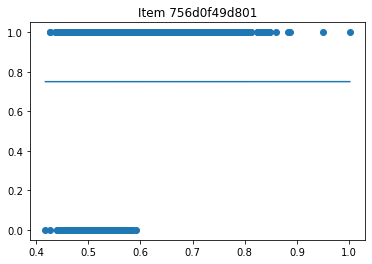

a : 0.002181525123620772  b:  0.5  c:  0.5
d:  1.0


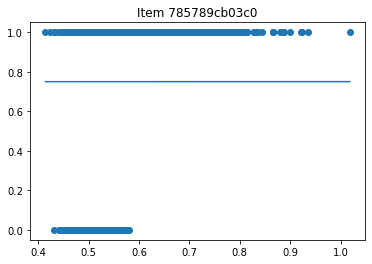

a : 0.0019533105388242463  b:  0.5  c:  0.5
d:  1.0


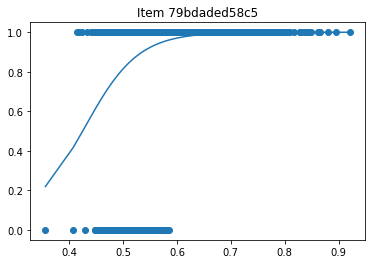

a : 20.253033917234593  b:  0.42976902076182644  c:  0.04342766706811346
d:  1.0


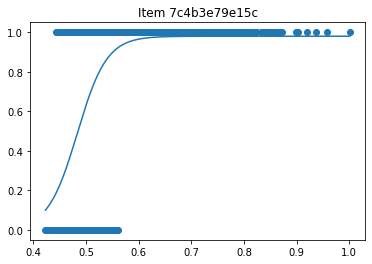

a : 35.86989995130183  b:  0.4838046499692108  c:  0.0
d:  0.9799026752764949


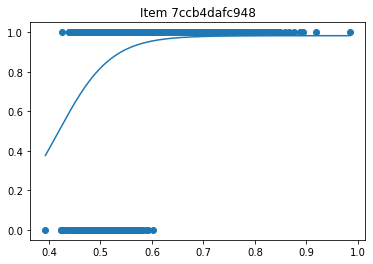

a : 19.515489030014386  b:  0.41755001682514736  c:  0.0
d:  0.9825646949642112


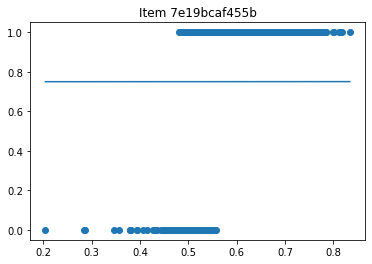

a : 0.0057929089198353765  b:  0.5  c:  0.5
d:  1.0


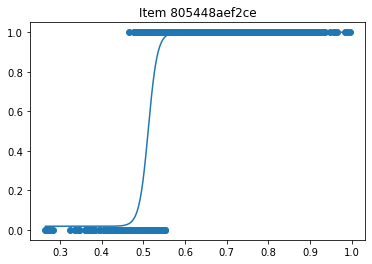

a : 92.37098781108187  b:  0.5117907453057282  c:  0.018553318837548866
d:  1.0


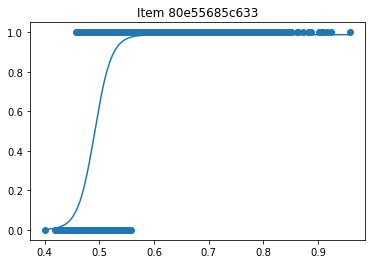

a : 65.45959358161932  b:  0.49127062431088475  c:  0.0
d:  0.987728546088278


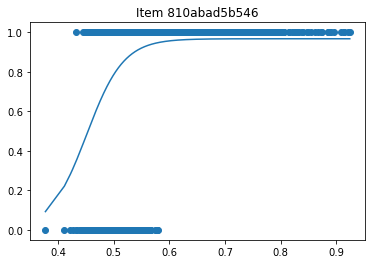

a : 30.254144876508853  b:  0.4516298863636987  c:  0.0
d:  0.9670712024512834


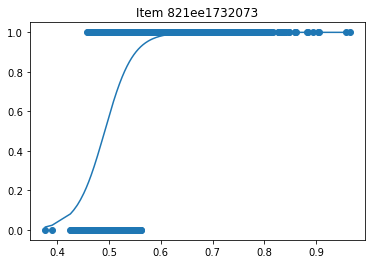

a : 36.626833266665024  b:  0.49188316687570544  c:  0.0
d:  0.9994757822407836


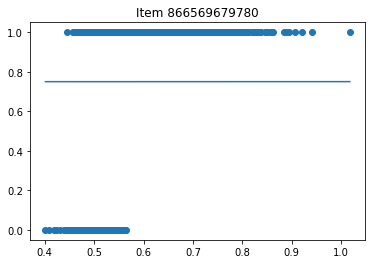

a : 0.0026263434458450416  b:  0.5  c:  0.5
d:  1.0


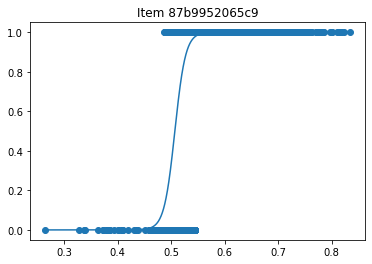

a : 100.0  b:  0.5067897082876459  c:  0.0
d:  1.0


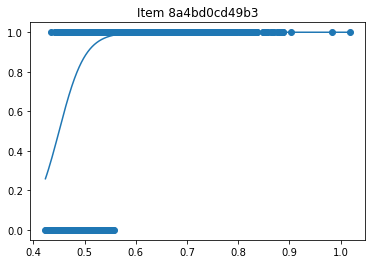

a : 39.37922873115665  b:  0.4500857842573056  c:  0.0
d:  1.0


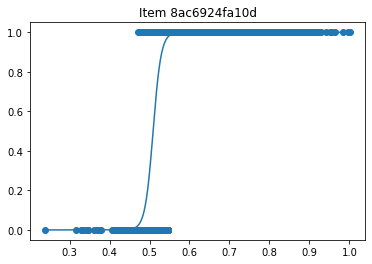

a : 100.0  b:  0.5089536714954451  c:  0.0
d:  1.0


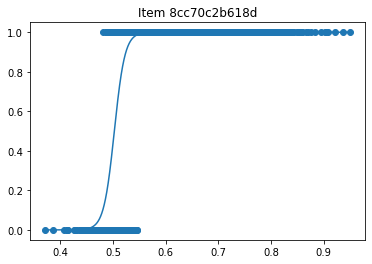

a : 100.0  b:  0.5025014514540547  c:  0.0
d:  1.0


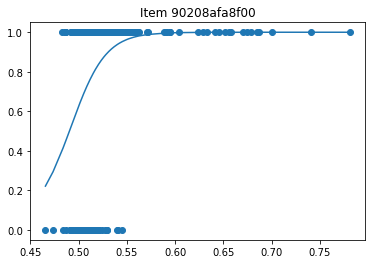

a : 55.595737126906734  b:  0.49203661797002884  c:  0.04269122241576602
d:  1.0
modelling broke, skipping item  9083750071d9


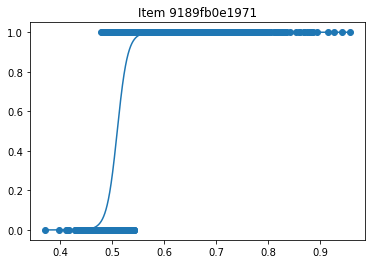

a : 100.0  b:  0.5098422227002648  c:  0.0
d:  1.0


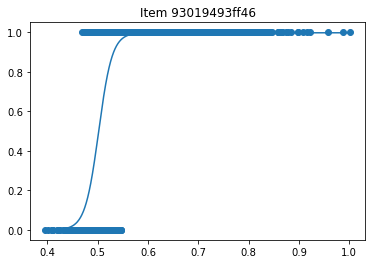

a : 74.5556574012816  b:  0.5021163935844022  c:  0.0
d:  0.9972554514949351


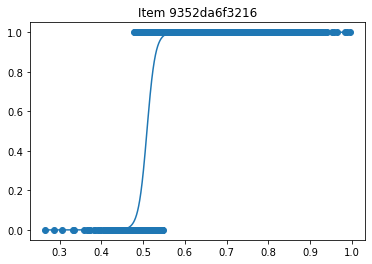

a : 100.0  b:  0.5090479421583357  c:  0.0
d:  1.0


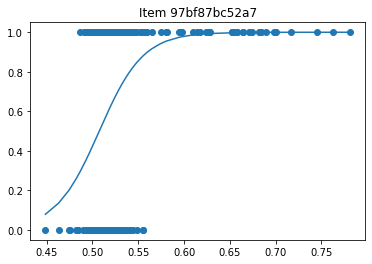

a : 41.75195128839485  b:  0.5073901279846336  c:  0.0
d:  1.0


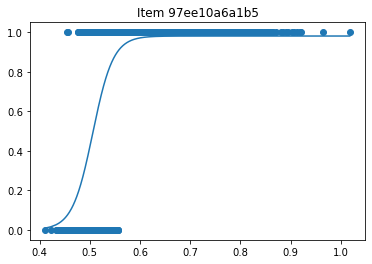

a : 49.227988688158405  b:  0.5059441273464492  c:  0.0
d:  0.9808489074268584


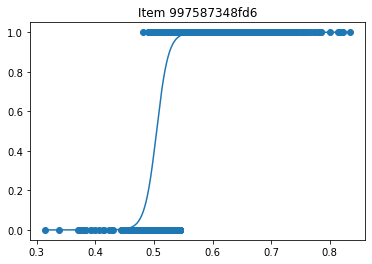

a : 100.0  b:  0.5046739182500207  c:  0.0
d:  1.0


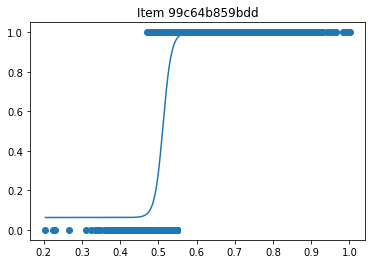

a : 92.54906183890638  b:  0.5123810355378906  c:  0.0628449965689613
d:  1.0


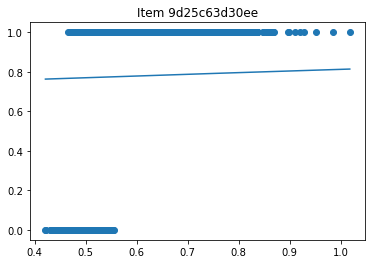

a : 0.6563595436785538  b:  2.7755575615628914e-17  c:  0.4504313064526504
d:  1.0


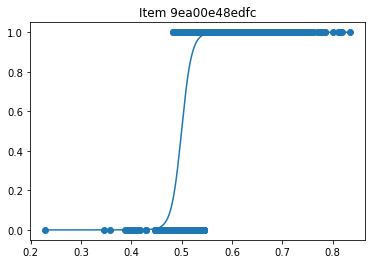

a : 100.0  b:  0.4996863477587432  c:  0.0
d:  1.0


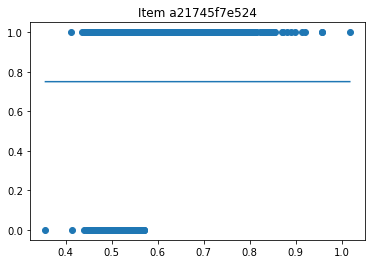

a : 0.002472178553108227  b:  0.5  c:  0.5
d:  1.0


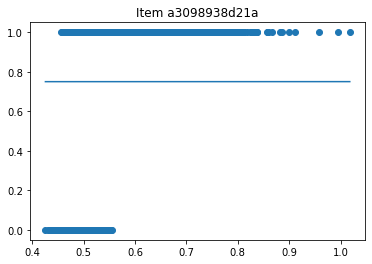

a : 0.002658660607006869  b:  0.5  c:  0.5
d:  1.0


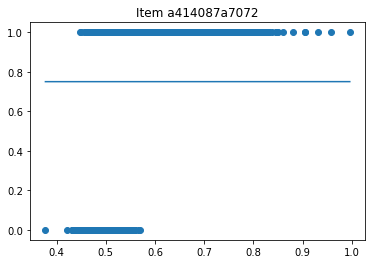

a : 0.0024943716685190418  b:  0.5  c:  0.5
d:  1.0


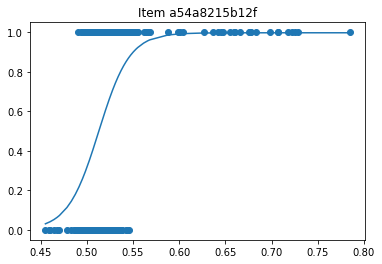

a : 59.60851923008139  b:  0.5129953937496273  c:  0.0
d:  0.9973178245614421


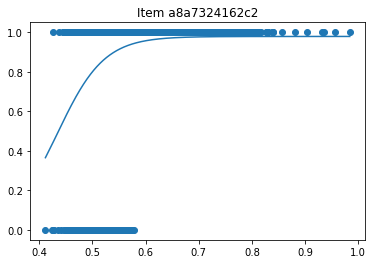

a : 22.79245802918063  b:  0.4342021365864952  c:  0.0
d:  0.9787431938814098


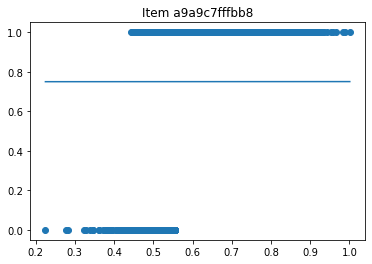

a : 0.005590581709952049  b:  0.5  c:  0.5
d:  1.0


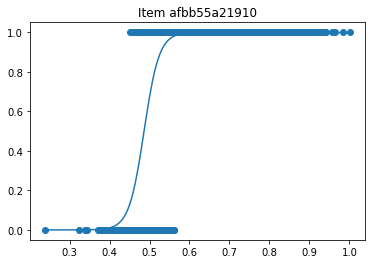

a : 52.98910721803607  b:  0.48634168474583056  c:  0.0
d:  0.9984767259530289


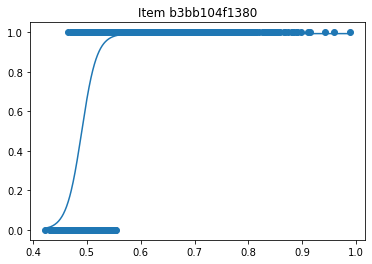

a : 71.41441497921522  b:  0.49043242113681285  c:  0.0
d:  0.9931105509040409


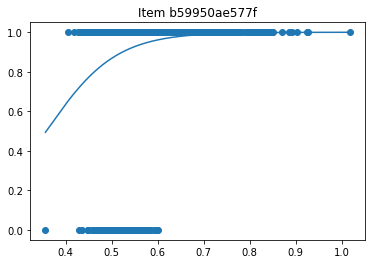

a : 13.254290554481779  b:  0.3581083776294478  c:  0.0
d:  1.0


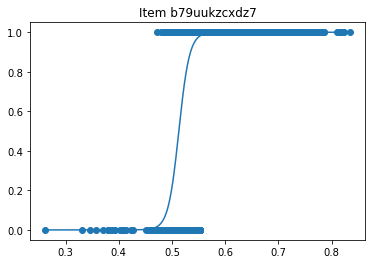

a : 100.0  b:  0.5127828442621394  c:  0.0
d:  0.9999976454630874


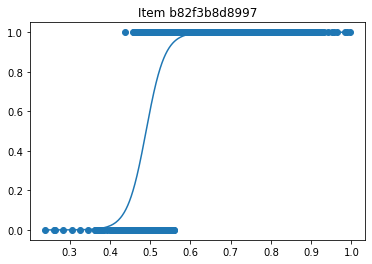

a : 42.93351978028615  b:  0.4897238052812666  c:  0.0
d:  1.0


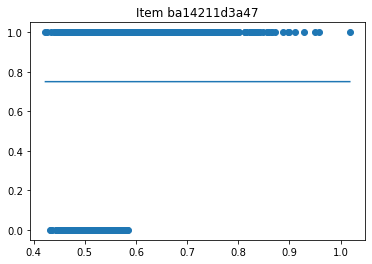

a : 0.0020139142458194836  b:  0.5  c:  0.5
d:  1.0


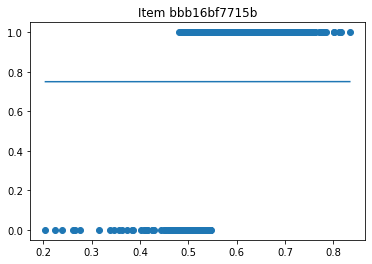

a : 0.00575689891864585  b:  0.5  c:  0.5
d:  1.0


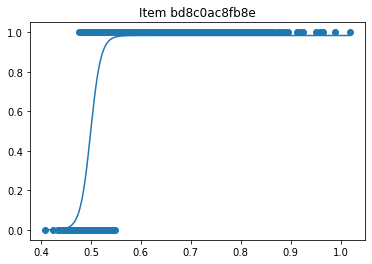

a : 97.38018946980898  b:  0.49938902006201663  c:  0.0
d:  0.9835294800135281


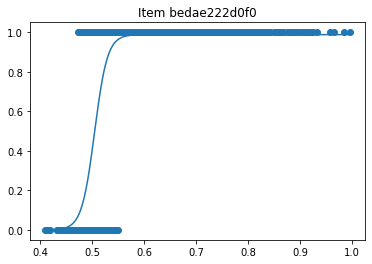

a : 80.91932046547407  b:  0.5043677635032024  c:  0.0
d:  0.9879624997322086


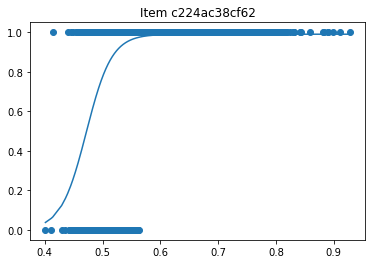

a : 45.593682840463245  b:  0.4719814914399785  c:  0.0
d:  0.9900449681898329


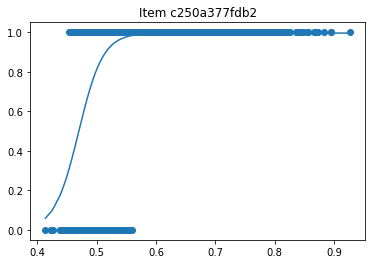

a : 49.161360726909166  b:  0.4700788368083259  c:  0.0
d:  0.9957304356409128


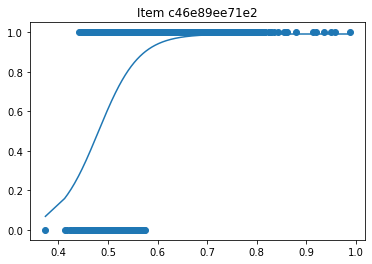

a : 24.378680661690236  b:  0.4802732520461029  c:  0.0
d:  0.9911279410046298


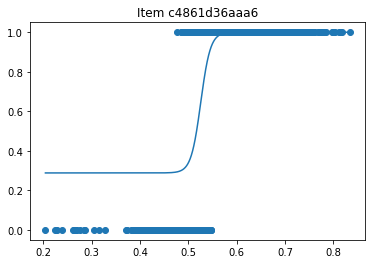

a : 100.0  b:  0.5257575018515885  c:  0.2882508412464721
d:  1.0


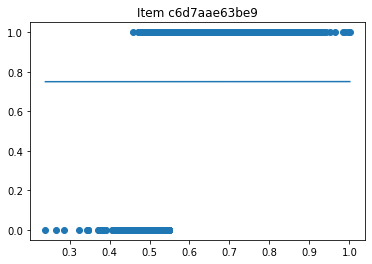

a : 0.005425346548609765  b:  0.5  c:  0.5
d:  1.0


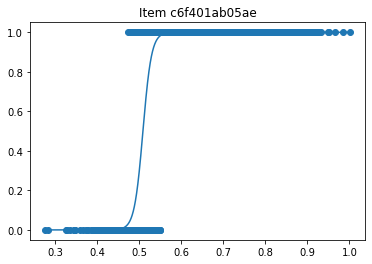

a : 98.14579010563493  b:  0.508676529150505  c:  0.0
d:  0.9996963433444507


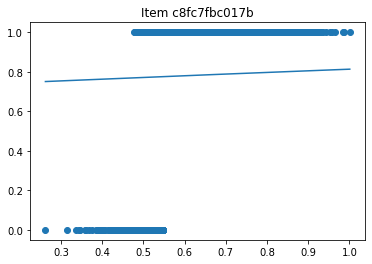

a : 0.6503849714785965  b:  0.0  c:  0.45490372215607094
d:  1.0


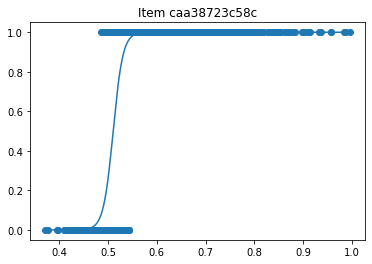

a : 100.0  b:  0.5105767698973029  c:  0.0
d:  1.0


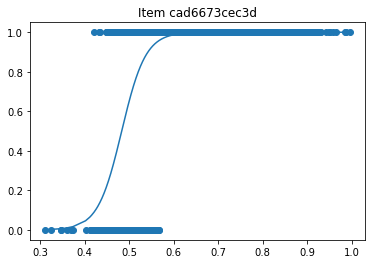

a : 37.25355690527861  b:  0.483106171301654  c:  0.0
d:  1.0


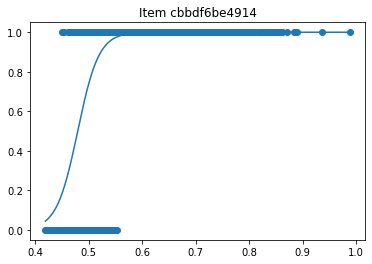

a : 50.776952400864005  b:  0.47949335805141285  c:  0.0
d:  1.0


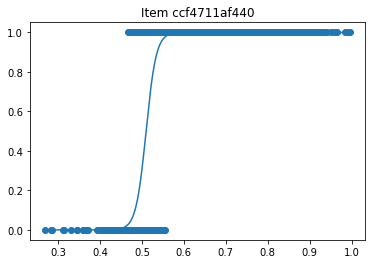

a : 82.97181536340874  b:  0.5099228957386578  c:  0.0
d:  0.9989478361005542


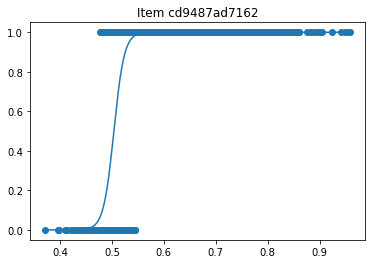

a : 100.0  b:  0.503645647204834  c:  0.0
d:  1.0


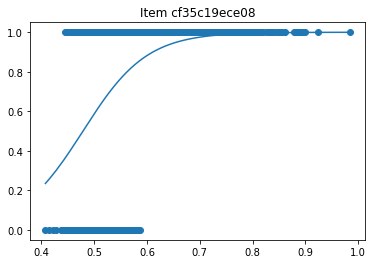

a : 16.594587185659897  b:  0.4789365655890304  c:  0.0
d:  1.0


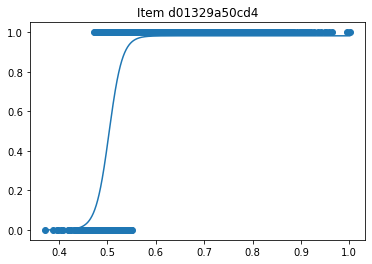

a : 72.76471157788244  b:  0.5031864258117854  c:  0.0
d:  0.9819332026736131


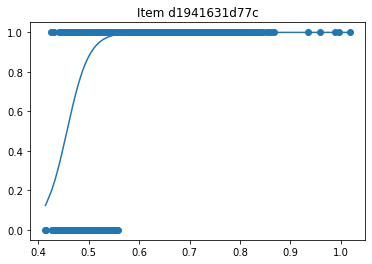

a : 45.68928578922263  b:  0.4566500495631272  c:  0.0
d:  0.9992567843534207


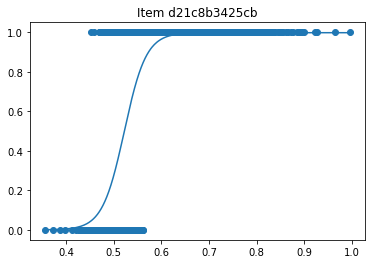

a : 43.537207445518185  b:  0.5219874581622373  c:  0.0
d:  0.9976967302536733


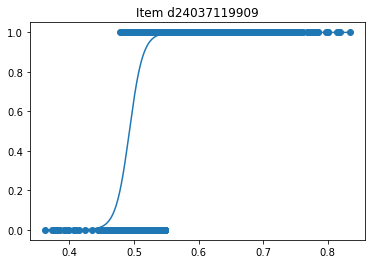

a : 95.52646382177038  b:  0.49288151315600154  c:  0.0
d:  0.9993012036504402


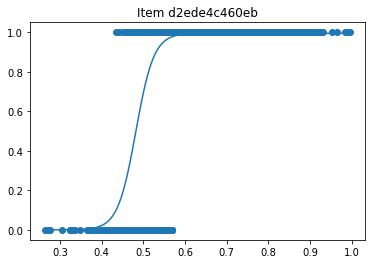

a : 46.15373239063926  b:  0.48180612043893084  c:  0.0
d:  0.9947408059059513


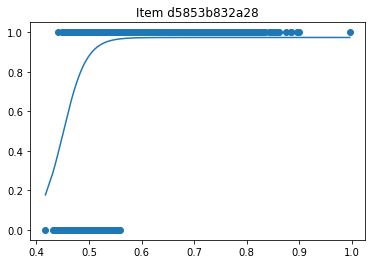

a : 45.26783299075892  b:  0.4503955736658312  c:  0.0
d:  0.9735668620034326


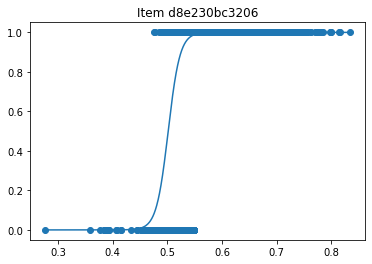

a : 93.032648355758  b:  0.5014305033699678  c:  0.0
d:  0.9992688768390822


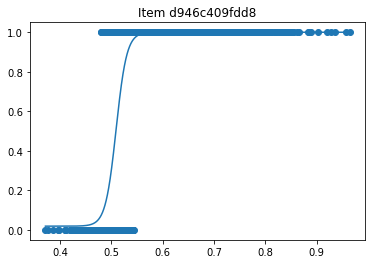

a : 96.82859823881631  b:  0.509469661396178  c:  0.019016382404123216
d:  1.0


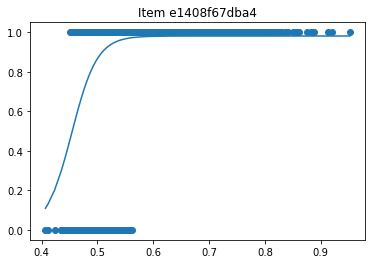

a : 44.0028440248507  b:  0.453936717568233  c:  0.0
d:  0.9809963002575609


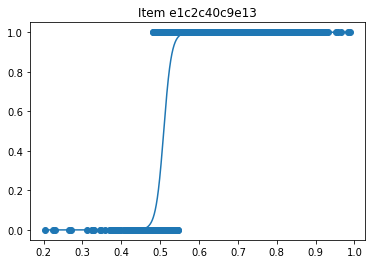

a : 100.0  b:  0.5090909425844475  c:  0.0
d:  1.0


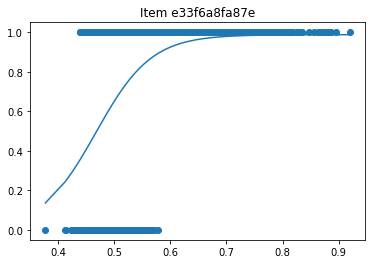

a : 20.290043136581012  b:  0.46762848218694597  c:  0.0
d:  0.9877727901967507


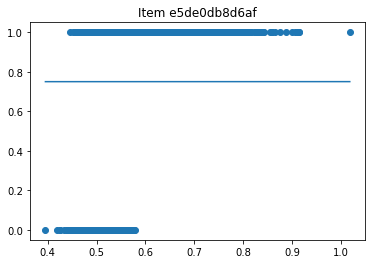

a : 0.0025057311471499187  b:  0.5  c:  0.5
d:  1.0


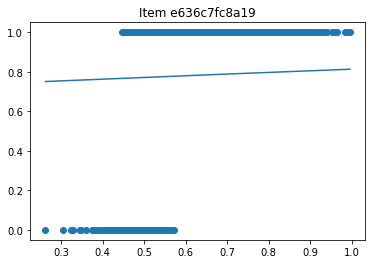

a : 0.6513027319233035  b:  0.0  c:  0.45484314958608374
d:  1.0


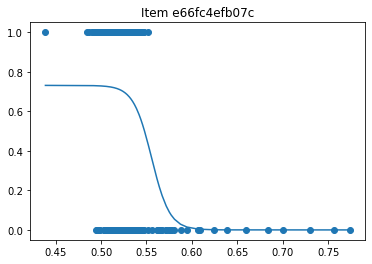

a : -100.0  b:  0.5555586521653539  c:  0.0
d:  0.7311293492748134


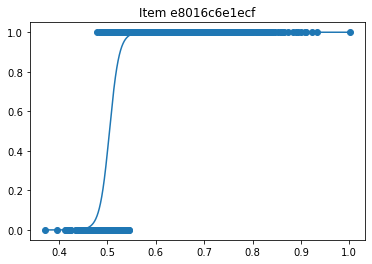

a : 100.0  b:  0.5040927076594032  c:  0.0
d:  1.0


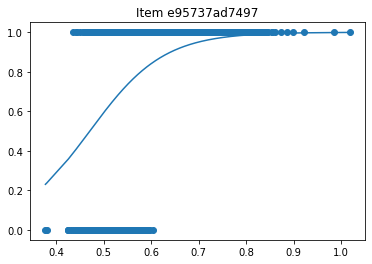

a : 12.901153310485503  b:  0.4707989164858823  c:  0.0
d:  1.0


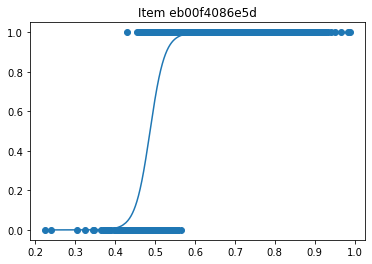

a : 54.10829703205213  b:  0.48721135252923636  c:  0.0
d:  0.9983628727890008


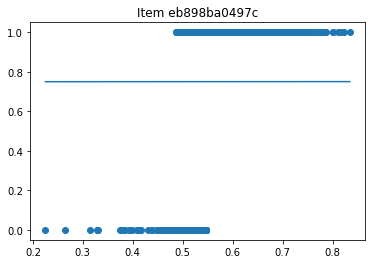

a : 0.005792571881543823  b:  0.5  c:  0.5
d:  1.0


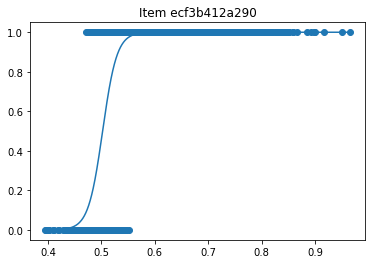

a : 74.96567448215909  b:  0.502389250713124  c:  0.0
d:  1.0


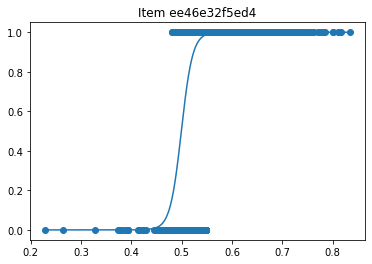

a : 89.67059339987323  b:  0.4993245228821629  c:  0.0
d:  1.0


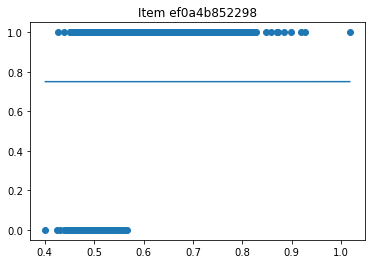

a : 0.0020963099785999174  b:  0.5  c:  0.49999999999999994
d:  1.0


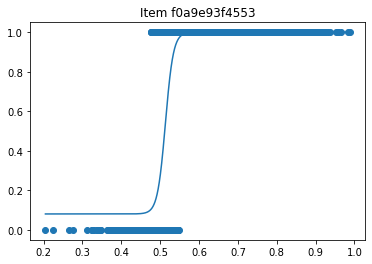

a : 98.05764323692945  b:  0.513445955986062  c:  0.08075671054164212
d:  1.0


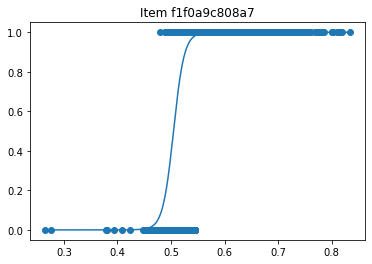

a : 100.0  b:  0.5047213969874614  c:  0.0
d:  1.0


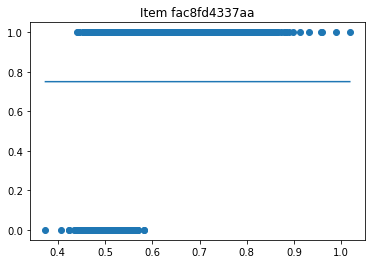

a : 0.002393194260974259  b:  0.5  c:  0.5
d:  1.0


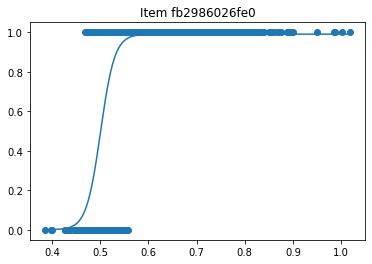

a : 68.29195568829483  b:  0.5008412418183075  c:  0.0
d:  0.9903534339241871


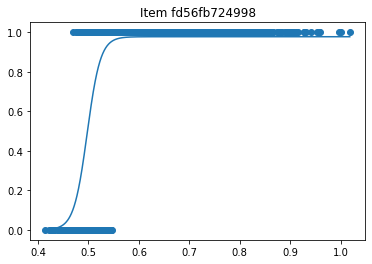

a : 76.0292588765374  b:  0.4974719795578657  c:  0.0
d:  0.9773132868626104


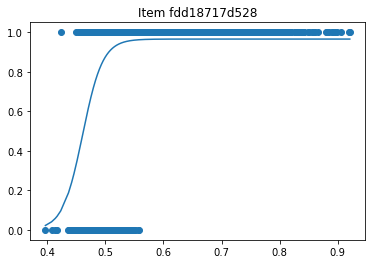

a : 58.261882062514985  b:  0.4610876353868732  c:  0.0
d:  0.9654568435642046


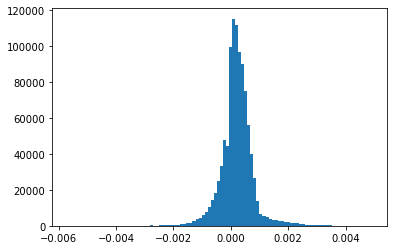

In [74]:
import numpy as np

iterations = 1



FOUR_PL=True
thetas=table['general_score'] #start with mean scores as theta estimate

for iter_num in range(iterations):
    print("iteration #", iter_num)
        
    #if first or last, plot
    if iter_num==0 or iter_num==iterations-1:
        #run estimate function
        #all_discriminability, all_difficulty, all_guessing, all_attention
        est_params = estimate_parameters_for_skill(table, True,FOUR_PL)
    else:
        est_params = estimate_parameters_for_skill(table, False,FOUR_PL)


    #store history to examine later
    all_discriminability_hx[iter_num,:]=est_params[0]
    all_difficulty_hx[iter_num,:]=est_params[1]
    all_guessing_hx[iter_num,:] =est_params[2]
    if FOUR_PL:
        all_attention_hx[iter_num,:]= est_params[3]
    student_thetas_hx[iter_num,:] = table['general_score']

    #update table with new student thetas
    #new theta = old_theta + sum[(a * (response - prob) )]/sum[ a**2 * prob * (1-prob) ]
    # prob = probability of correct response to item i under current ICC model at currently estimated theta (old_theta)

    #this is to estimate probability of student getting item correct
    def prob_est(thetas, model,all_params):
        return np.asarray([model(thetas,*params) for params in all_params]).T
    if FOUR_PL:
        model=four_param_logistic
        all_params = zip(est_params[0],est_params[1],est_params[2],est_params[3])
    else:
        #set model and current params
        model=three_param_logistic
        all_params = zip(est_params[0],est_params[1],est_params[2])


        
    #list of probabilities getting 
    all_probs=prob_est(thetas,model,all_params) #returns #items by #users

    #calculate delta thetas for all users
    #delta_thetas = np.sum(all_discriminability*(table[table.columns[:-2]]-all_probs),1)/np.sum(all_discriminability**2*all_probs*(1-all_probs),1)
    delta_thetas = np.nansum(est_params[0]*(table[table.columns[:-2]]-all_probs),1)/np.nansum(est_params[0]**2*all_probs*(1-all_probs),1)
    #MLE denominator
    est_delta_confidence = 1/np.nansum(est_params[0]**2*all_probs*(1-all_probs),1)
    #number of items in estimate for this student's theta
    item_power = np.sum(table[table.columns[:-2]].notna(),1)

    all_theta_confidence_hx[iter_num,:] =est_delta_confidence
    all_theta_power_hx[iter_num,:] =item_power

    #number of students in estimate for this items's params
    student_power = np.sum(table[table.columns[:-2]].notna(),0)

    all_item_power_hx[iter_num,:] =student_power

    #update
    table['general_score'] = thetas + delta_thetas
    if True:
        import matplotlib.pyplot as plt
        plt.hist(delta_thetas, bins =100)
        plt.show()






(47922,)

In [ ]:
np.shape(all_probs)



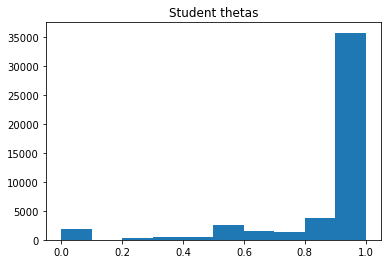

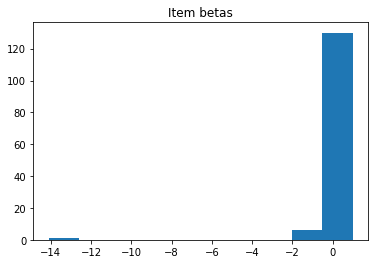

In [57]:
plt.title('Student thetas')
plt.hist(student_thetas_hx[0,:])
plt.show()


plt.title('Item betas')
plt.hist(all_difficulty_hx[0,:])
plt.show()



In [20]:
all_probs

[student_id
 42002       1.000000
 86746       1.000000
 150729      1.000000
 169494      1.000000
 189969      1.000000
               ...   
 38363478    1.000000
 38363793    1.000000
 38364213    0.054344
 38365977    1.000000
 38367231    1.000000
 Name: general_score, Length: 204635, dtype: float64,
 student_id
 42002       1.000000
 86746       1.000000
 150729      1.000000
 169494      1.000000
 189969      1.000000
               ...   
 38363478    1.000000
 38363793    1.000000
 38364213    0.034785
 38365977    1.000000
 38367231    1.000000
 Name: general_score, Length: 204635, dtype: float64,
 student_id
 42002       1.000000
 86746       1.000000
 150729      1.000000
 169494      1.000000
 189969      1.000000
               ...   
 38363478    1.000000
 38363793    1.000000
 38364213    0.060502
 38365977    1.000000
 38367231    1.000000
 Name: general_score, Length: 204635, dtype: float64,
 student_id
 42002       1.000000
 86746       1.000000
 150729      1.00000

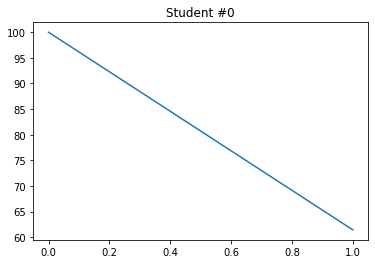

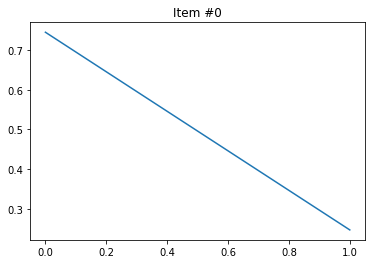

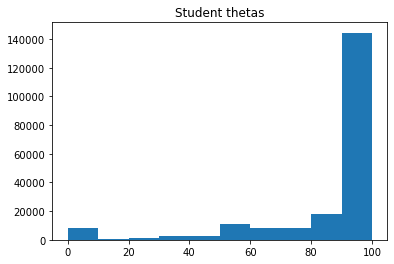

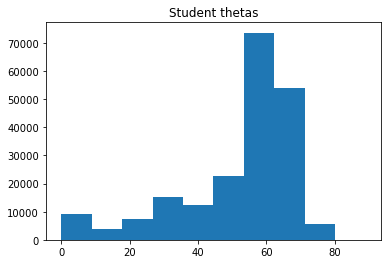

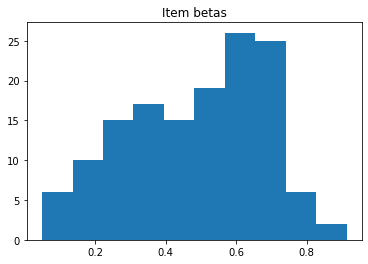

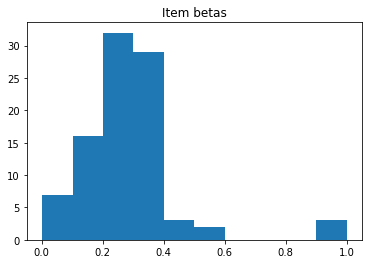

In [11]:
import matplotlib.pyplot as plt
plt.title('Student #0')
plt.plot(student_thetas_hx[:,0])
plt.show()

plt.title('Item #0')
plt.plot(all_difficulty_hx[:,0])
plt.show()


plt.title('Student thetas')
plt.hist(student_thetas_hx[0,:])
plt.show()

plt.title('Student thetas')
plt.hist(student_thetas_hx[1,:])
plt.show()

plt.title('Item betas')
plt.hist(all_difficulty_hx[0,:])
plt.show()



plt.title('Item betas')
plt.hist(all_difficulty_hx[1,:])
plt.show()





[(7.044406800055687, 0.24664808725339338, -0.17171951720444562),
 (8.842401837822564, 0.1899399683445068, -0.22961518575781922),
 (6.066511954561008, 0.11169853674842786, -0.5606742000616095),
 (12.699602241526526, 0.358740844377189, 0.15576453719071287),
 (139.727301938558, 0.504231602655404, 0.5000000007745481),
 (4.655048421197788, 0.0021749593344689813, -1.089699389376951),
 (nan, nan, nan),
 (nan, nan, nan),
 (nan, nan, nan),
 (12.354070438850739, 0.3589010993395386, 0.14141185358777641),
 (nan, nan, nan),
 (11.792099491583194, 0.34996810971110986, 0.10482957637884753),
 (13.92059028958452, 0.2953333143994705, 0.11832673443838258),
 (nan, nan, nan),
 (67.3004180876758, 0.3679179650225549, 0.35779017756922465),
 (13.704336752494992, 0.21916771819502145, -0.09802451681714097),
 (13.419994380986612, 0.29651714991688743, 0.15458983252926373),
 (6.8079856301731905, 0.18278427386111215, -0.2899143714281864),
 (nan, nan, nan),
 (22.129948273869857, 0.30612874291705916, 0.0278784617709610

In [100]:
np.mean(table[table.columns[:-2]]*all_difficulty, axis=1)




student_id
42002       61.412827
86746       70.456325
150729      61.868433
169494      59.818262
189969      28.563929
              ...    
38363478    54.690376
38363793    54.404281
38364213    16.119675
38365977    54.462231
38367231    59.239402
Length: 204635, dtype: float64

In [104]:
max(np.mean(table[table.columns[:-2]]*all_difficulty, axis=1)), min(np.mean(table[table.columns[:-2]]*all_difficulty, axis=1))


(89.06781597263387, -38.964889586048)

In [105]:
min(all_difficulty)



-0.38964889586048

In [5]:
all_first_responses = df[['student_id','correctness','math_question_id']].groupby(['student_id','math_question_id']).first().reset_index()
all_first_responses



,student_id,math_question_id,correctness,created_at,rl_top_level_skill_id
0,"567888\\""}""",2021-04-26 17:56:10.017 Z,d3528830069f,1,31
1,"\\""}""",2020-01-08 16:35:42.356 Z,a3eb9995d77b,2,454
2,"0\\""}""",2020-01-07 15:32:10.462 Z,ff1c0e3efe01,1,8
3,"0\\""}""",2020-01-07 15:32:37.339 Z,ff1c0e3efe01,1,23
4,"0\\""}""",2020-01-07 15:36:25.645 Z,ff1c0e3efe01,1,7
...,...,...,...,...,...
2543138,"\\""}""",2021-04-27 15:41:09.808 Z,d98e92f2ef8e,3,82
2543139,"\\""}""",2021-04-27 15:43:56.838 Z,f133c02857ef,3,78
2543140,"\\""}""",2021-04-27 19:47:23.451 Z,46cf94aea7c0,3,224
2543141,"\\""}""",2021-04-27 19:51:54.603 Z,c150a8de5436,1,37


In [6]:
all_user_performance = all_first_responses[['student_id','correctness']].groupby('student_id').mean()

import matplotlib.pyplot as plt
plt.hist(all_user_performance)
plt.show()

DataError: No numeric types to aggregate

In [7]:
all_first_responses[['student_id','correctness']].groupby('student_id').count().reset_index()['correctness'].max()




1701237

In [656]:
table

math_question_id,012c1d414860,02688b8d3a8d,04a8d928750e,0526e10e353b,059f523973ed,06f96ea22af4,07e8cb78c01d,08d51e16f4e8,09e2b0d08e34,0a74d99bc919,...,f6166b65e327,f6c4ed89044d,f9a197ce79b8,fabcec79ed19,fac8fd4337aa,fb2986026fe0,fbe10b25dd16,fd56fb724998,fdd18717d528,fe6dcf7170f2
student_id,,,,,,,,,,,,,,,,,,,,,
42002,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43111,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
62475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
62479,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
62492,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38398503,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
38398507,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
38398513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [655]:
skill='02a3bfaa479de311b77c005056801da1'

In [653]:
solvedIRT

__main__.solve_IRT_for_matrix.<locals>.IRTResults

In [670]:
import boto3
from boto3.dynamodb.conditions import Key
# def create_table():
#     dynamodb = boto3.resource('dynamodb')
    
#     table = dynamodb.create_table(
#         TableName='ItemLevels',
#         KeySchema=[
#             {
#                 'AttributeName': 'question_id',
#                 'KeyType': 'HASH'
#             },

#         ],
#         AttributeDefinitions=[
#             {
#                 'AttributeName': 'question_id',
#                 'AttributeType': 'S'
#             },
#             {
#                 'AttributeName': 'discriminability',
#                 'AttributeType': 'N'
#             },

#             {
#                 'AttributeName': 'difficulty',
#                 'AttributeType': 'N'
#             },

#             {
#                 'AttributeName': 'guessing',
#                 'AttributeType': 'N'
#             },

#             {
#                 'AttributeName': 'inattention',
#                 'AttributeType': 'N'
#             },

#         ],
#         ProvisionedThroughput={
#             'ReadCapacityUnits': 10,
#             'WriteCapacityUnits': 10,
#         }
#     )
#     print("Table status:", table.table_status)
#     return table
    
def get_item():
    dynamodb = boto3.resource('dynamodb')
    
    dbtable = dynamodb.Table('ItemParameters')
    
    resp = table.get_item(
            Key={
                'id' : 1,
            }
        )
    if 'Item' in resp:
        print(resp['Item'])
        
        


In [701]:
for questionitem in range(len(table.columns)):
    #item 0
    qid = table.columns[questionitem]
    alpha,beta,gamma,epsilon = [solvedIRT.est_params[i][questionitem] for i in range(4)]
    alpha_c,beta_c,gamma_c,epsilon_c = [solvedIRT.est_params[-1][questionitem][i] for i in range(4)]

    dynamodb = boto3.resource('dynamodb')
    dbtable = dynamodb.Table('ItemParameters')
    dbtable.put_item(
        Item={
            'question_id': qid,
            'skill_id': skill,
            'discriminability': format(alpha, ".15g"),
            'difficulty': format(beta, ".15g"),
            'guessing': format(gamma, ".15g"),
            'inattention': format(epsilon, ".15g"),
            'discriminability_error': format(alpha_c, ".15g"),
            'difficulty_error': format(beta_c, ".15g"),
            'guessing_error': format(gamma_c, ".15g"),
            'inattention_error': format(epsilon_c,  ".15g"),
            'key_one': qid,
        }
    )
    

In [702]:
response = dbtable.get_item(
    Key={
        'key_one': qid
    }
)
item = response['Item']
print(item)


{'inattention_error': 'nan', 'discriminability_error': 'nan', 'guessing': 'nan', 'discriminability': 'nan', 'question_id': 'fe6dcf7170f2', 'guessing_error': 'nan', 'difficulty_error': 'nan', 'difficulty': 'nan', 'inattention': 'nan', 'skill_id': '02a3bfaa479de311b77c005056801da1', 'key_one': 'fe6dcf7170f2'}


In [893]:
qid=table.columns[12]
print(qid)

response = dbtable.get_item(
    Key={
        'key_one': qid
    }
)
item = response['Item']
print(item)

0e60b72fc3e2
{'inattention_error': '0.00678724409502296', 'discriminability_error': '6.43466621661017', 'guessing': '2.16814940786486e-14', 'discriminability': '99.9999999999358', 'question_id': '0e60b72fc3e2', 'guessing_error': '0.0659814968334423', 'difficulty_error': '0.00145905479235688', 'difficulty': '-0.0578891871172225', 'inattention': '0.98541829707394', 'skill_id': '02a3bfaa479de311b77c005056801da1', 'key_one': '0e60b72fc3e2'}


iteration # 0


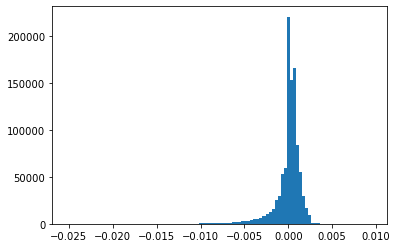

iteration # 1
iteration # 2
iteration # 3
iteration # 4
iteration # 5


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: overflow encountered in exp
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in true_divide


iteration # 6
iteration # 7
iteration # 8
iteration # 9
iteration # 10


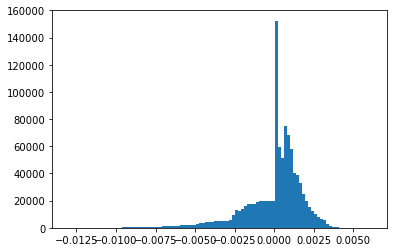

iteration # 11
iteration # 12
iteration # 13
iteration # 14
iteration # 15
iteration # 16
iteration # 17
iteration # 18
iteration # 19
iteration # 20


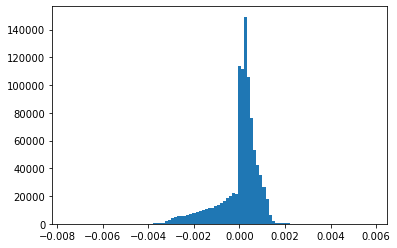

iteration # 21
iteration # 22
iteration # 23
iteration # 24
iteration # 25
iteration # 26
iteration # 27
iteration # 28
iteration # 29
iteration # 30


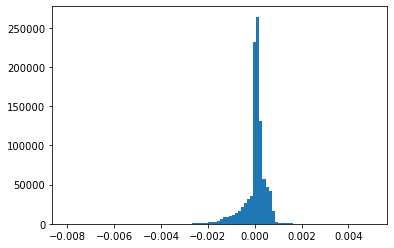

iteration # 31
iteration # 32
iteration # 33
iteration # 34
iteration # 35
iteration # 36
iteration # 37
iteration # 38
iteration # 39
iteration # 40


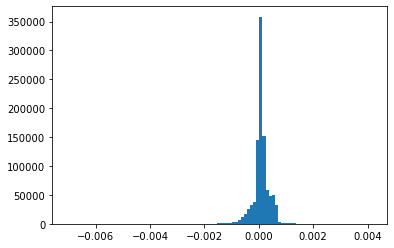

iteration # 41
iteration # 42
iteration # 43
iteration # 44
iteration # 45
iteration # 46
iteration # 47
iteration # 48
iteration # 49
iteration # 50


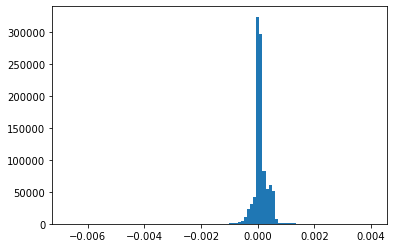

iteration # 51
iteration # 52
iteration # 53
iteration # 54
iteration # 55
iteration # 56
iteration # 57
iteration # 58
iteration # 59
iteration # 60


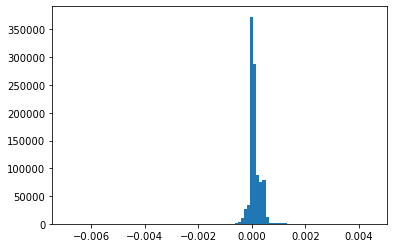

iteration # 61
iteration # 62
iteration # 63
iteration # 64
iteration # 65
iteration # 66
iteration # 67
iteration # 68
iteration # 69
iteration # 70


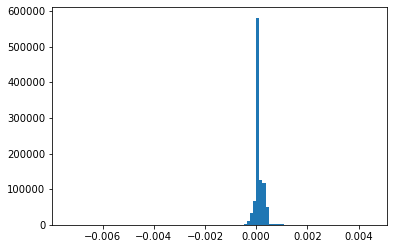

iteration # 71
iteration # 72
iteration # 73
iteration # 74
iteration # 75
iteration # 76
iteration # 77
iteration # 78
iteration # 79
iteration # 80


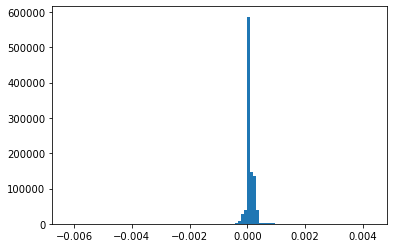

iteration # 81
iteration # 82
iteration # 83
iteration # 84
iteration # 85
iteration # 86
iteration # 87
iteration # 88
iteration # 89
iteration # 90


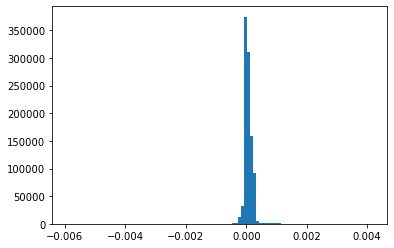

iteration # 91
iteration # 92
iteration # 93
iteration # 94
iteration # 95
iteration # 96
iteration # 97
iteration # 98
iteration # 99
iteration # 100


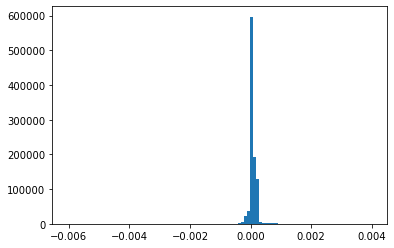

iteration # 101
iteration # 102
iteration # 103
iteration # 104
iteration # 105
iteration # 106
iteration # 107
iteration # 108
iteration # 109
iteration # 110


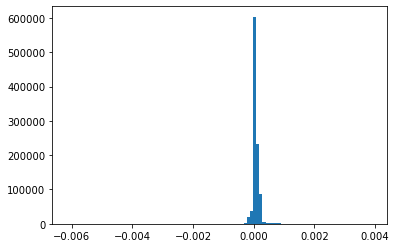

iteration # 111
iteration # 112
iteration # 113
iteration # 114
iteration # 115
iteration # 116
iteration # 117
iteration # 118
iteration # 119
iteration # 120


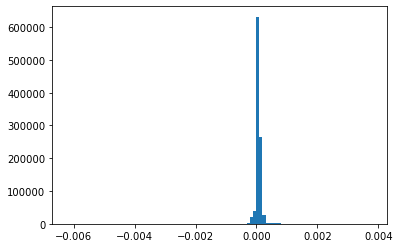

iteration # 121
iteration # 122
iteration # 123
iteration # 124
iteration # 125
iteration # 126
iteration # 127
iteration # 128
iteration # 129
iteration # 130


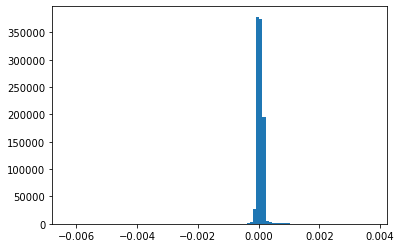

iteration # 131
iteration # 132
iteration # 133
iteration # 134
iteration # 135
iteration # 136
iteration # 137
iteration # 138
iteration # 139
iteration # 140


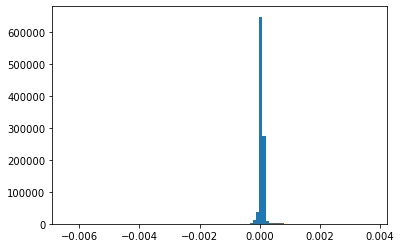

iteration # 141
iteration # 142
iteration # 143
iteration # 144
iteration # 145
iteration # 146
iteration # 147
iteration # 148
iteration # 149
iteration # 150


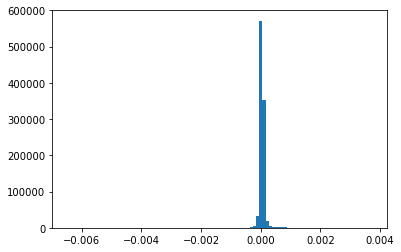

iteration # 151
iteration # 152
iteration # 153
iteration # 154
iteration # 155
iteration # 156
iteration # 157
iteration # 158
iteration # 159
iteration # 160


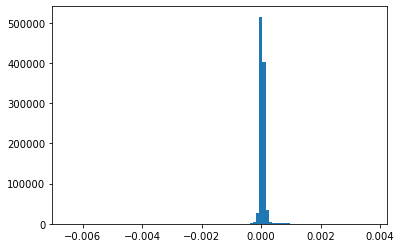

iteration # 161
iteration # 162
iteration # 163
iteration # 164
iteration # 165
iteration # 166
iteration # 167
iteration # 168
iteration # 169
iteration # 170


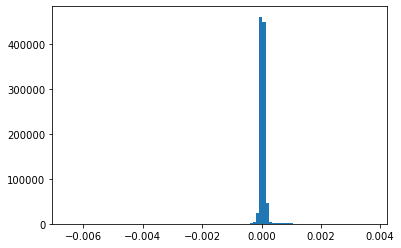

iteration # 171
iteration # 172
iteration # 173
iteration # 174
iteration # 175
iteration # 176
iteration # 177
iteration # 178
iteration # 179
iteration # 180


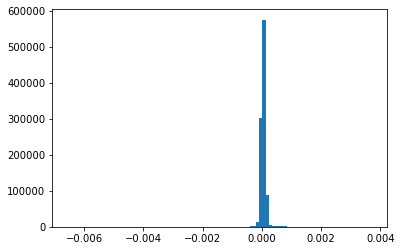

iteration # 181
iteration # 182
iteration # 183


In [ ]:

import time
starttime = time.time()
solvedIRT_3 = solve_IRT_for_matrix(table, all_thetas = None, iterations = 250, FOUR_PL=True, show_convergence=10)
print(time.time()-starttime, ' seconds.')

starttime = time.time()
solvedIRT_4 = solve_IRT_for_matrix(table, all_thetas = None, iterations = 250, FOUR_PL=True, show_convergence=10)
print(time.time()-starttime, ' seconds.')


for item_num in range(len(table.columns)):
    if ~np.isnan(solvedIRT_3.est_params[0][item_num]):
        plot_item_with_model(solvedIRT_3.thetas, item_num, table, [i[item_num] for i in solvedIRT_3.est_params[:-1]])
plot_information_curves(table,solvedIRT_3.thetas, solvedIRT_3.est_params[:-1])
plot_parameter_convergence(solvedIRT_3, sample_of_items = 10,sample_of_students = 100)

for item_num in range(len(table.columns)):
    if ~np.isnan(solvedIRT_4.est_params[0][item_num]):
        plot_item_with_model(solvedIRT_4.thetas, item_num, table, [i[item_num] for i in solvedIRT_4.est_params[:-1]])
plot_information_curves(table,solvedIRT_4.thetas, solvedIRT_4.est_params[:-1])
plot_parameter_convergence(solvedIRT_4, sample_of_items = 10,sample_of_students = 100)



#90% data compared to %100
A = solvedIRT_3.thetas
B = solvedIRT_4.thetas
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])

A = solvedIRT_3.est_params[0]
B = solvedIRT_4.est_params[0]
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])

A = solvedIRT_3.est_params[1]
B = solvedIRT_4.est_params[1]
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])





In [ ]:

for item_num in range(len(table.columns)):
    if ~np.isnan(solvedIRT_3.est_params[0][item_num]):
        plot_item_with_model(solvedIRT_3.thetas, item_num, table, [i[item_num] for i in solvedIRT_3.est_params[:-1]])

for item_num in range(len(table.columns)):
    if ~np.isnan(solvedIRT_4.est_params[0][item_num]):
        plot_item_with_model(solvedIRT_4.thetas, item_num, table, [i[item_num] for i in solvedIRT_4.est_params[:-1]])





In [ ]:

#90% data compared to %100
A = solvedIRT_3.thetas
B = solvedIRT_4.thetas
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])

A = solvedIRT_3.est_params[0]
B = solvedIRT_4.est_params[0]
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])

A = solvedIRT_3.est_params[1]
B = solvedIRT_4.est_params[1]
print(np.corrcoef(A[~np.isnan(A)],B[~np.isnan(A)])[0][1])




In [ ]:
plot_information_curves(table,solvedIRT_3.thetas, solvedIRT_3.est_params[:-1])
plot_parameter_convergence(solvedIRT_3, sample_of_items = 10,sample_of_students = 100)
plot_information_curves(table,solvedIRT_4.thetas, solvedIRT_4.est_params[:-1])
plot_parameter_convergence(solvedIRT_4, sample_of_items = 10,sample_of_students = 100)




In [ ]:
min(solvedIRT_3.est_params[1]), max(solvedIRT_3.est_params[1])


In [ ]:
np.sort(solvedIRT_3.thetas)[:3], np.sort(solvedIRT_3.thetas)[-3:]


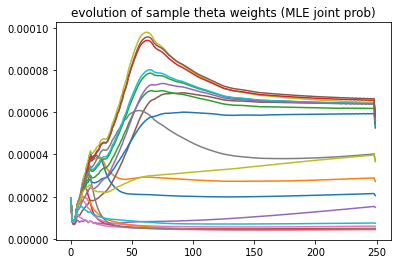

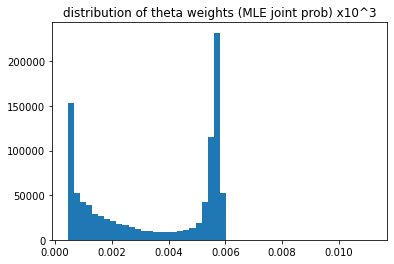

0.0004411520692670868
0.011174427006619816


In [822]:

plt.title('evolution of sample theta weights (MLE joint prob)')
plt.plot(solvedIRT_3.theta_confidence_hx[:,np.random.choice(np.shape(solvedIRT_3.theta_confidence_hx)[1],20)])
plt.show()

plt.title('distribution of theta weights (MLE joint prob) x10^3')
plt.hist(1000*solvedIRT_3.theta_confidence_hx[-1,np.isfinite(solvedIRT_3.theta_confidence_hx[-1,:])],bins=50)
plt.show()

print(min(100*solvedIRT_3.theta_confidence_hx[-1,np.isfinite(solvedIRT_3.theta_confidence_hx[-1,:])]))
print(max(100*solvedIRT_3.theta_confidence_hx[-1,np.isfinite(solvedIRT_3.theta_confidence_hx[-1,:])]))




iteration # 0


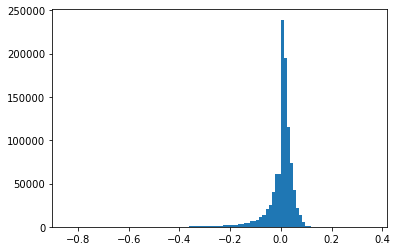

iteration # 1
iteration # 2
iteration # 3
iteration # 4
iteration # 5
iteration # 6
iteration # 7
iteration # 8
iteration # 9
iteration # 10


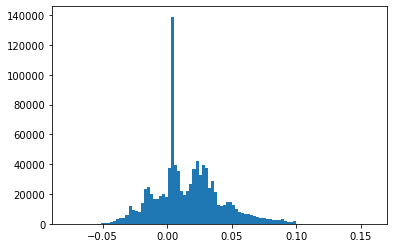

iteration # 11
iteration # 12
iteration # 13
iteration # 14
iteration # 15
iteration # 16
iteration # 17
iteration # 18
iteration # 19


In [ ]:
starttime = time.time()
solvedIRT_5 = solve_IRT_for_matrix(table, all_thetas = None, iterations = 250, 
                                   FOUR_PL=True, show_convergence=10,
                                   bounds = ((1,-3,0,.5),(2,3,.5,1)))
print(time.time()-starttime, ' seconds.')



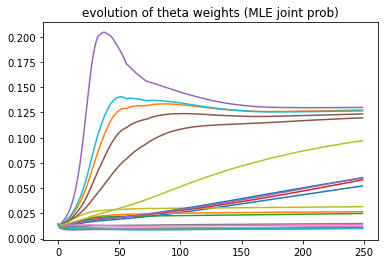

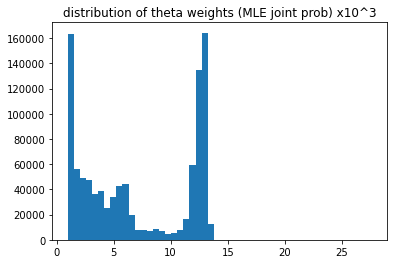

0.9754598187723406
27.637950160761065


In [817]:
plt.title('evolution of sample theta weights (MLE joint prob)')
plt.plot(solvedIRT_5.theta_confidence_hx[:,np.random.choice(np.shape(solvedIRT_5.theta_confidence_hx)[1],20)])
plt.show()

plt.title('distribution of theta weights (MLE joint prob) x10^3')
plt.hist(100*solvedIRT_5.theta_confidence_hx[-1,np.isfinite(solvedIRT_5.theta_confidence_hx[-1,:])],bins=50)
plt.show()

print(min(100*solvedIRT_5.theta_confidence_hx[-1,np.isfinite(solvedIRT_5.theta_confidence_hx[-1,:])]))
print(max(100*solvedIRT_5.theta_confidence_hx[-1,np.isfinite(solvedIRT_5.theta_confidence_hx[-1,:])]))


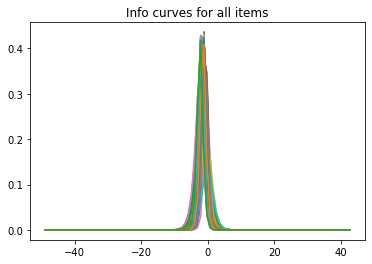

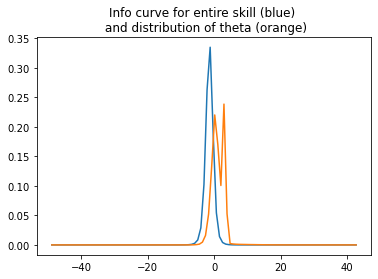

Theta range (students):  -48.79560218290458 43.591273923422904
Beta range (items):  -2.333396046008785 0.3725002539591279


In [821]:
plot_information_curves(table,solvedIRT_5.thetas, solvedIRT_5.est_params[:-1])

print('Theta range (students): ', min(solvedIRT_5.thetas), max(solvedIRT_5.thetas))
print('Beta range (items): ', min(solvedIRT_5.est_params[1]), max(solvedIRT_5.est_params[1]))

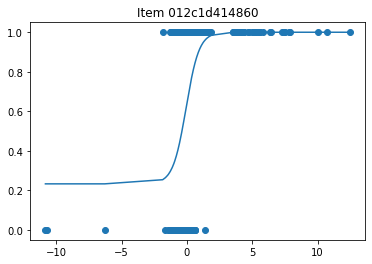

a : 1.9999999999982097  b:  -0.06725153984648956  c:  0.23303611400964555
d:  0.9999999999998765


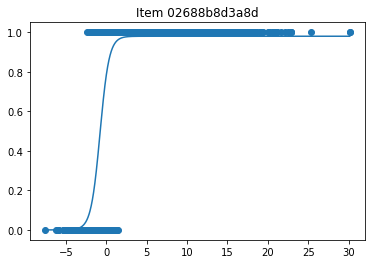

a : 1.7844286252779165  b:  -0.7788671377347085  c:  5.169302351481002e-13
d:  0.9797881735193711


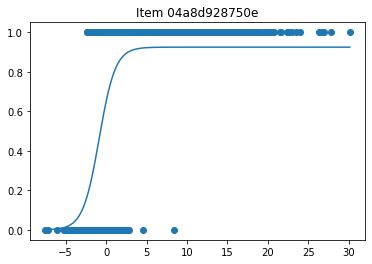

a : 1.0000000000000007  b:  -0.8530204833968298  c:  5.998124972937961e-13
d:  0.9246246625071736


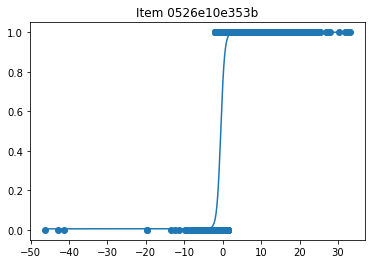

a : 1.9999999996935225  b:  -0.5110274765119851  c:  0.005467931824438432
d:  0.9999999998193165


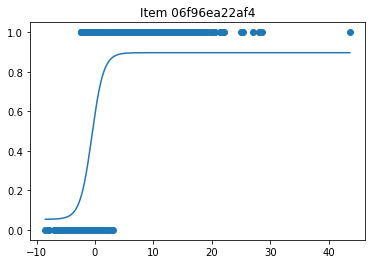

a : 1.0000000000000002  b:  -0.5364247123274911  c:  0.0535420979239479
d:  0.8965777480471512


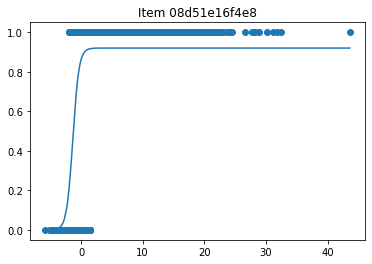

a : 1.999999983341109  b:  -1.3470034615940376  c:  1.1288170222294247e-14
d:  0.9200283575474559


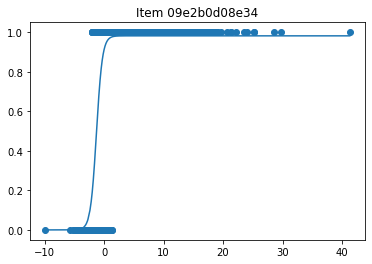

a : 1.999999999955977  b:  -1.2991642730766713  c:  2.3842224353441386e-12
d:  0.9817983104635555


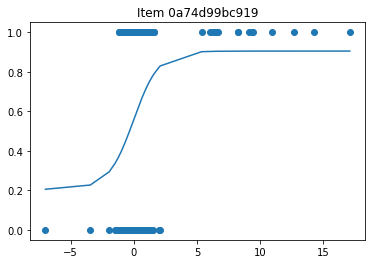

a : 1.0000000000000002  b:  -0.02249834257621059  c:  0.20500713133521625
d:  0.9047226372704082


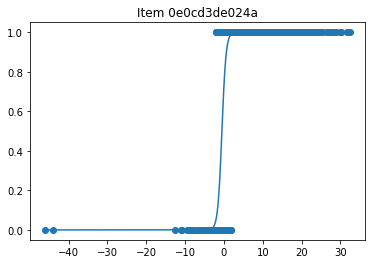

a : 1.9015742378031584  b:  -0.5168398809195638  c:  9.593432164376601e-17
d:  0.9999999999999549


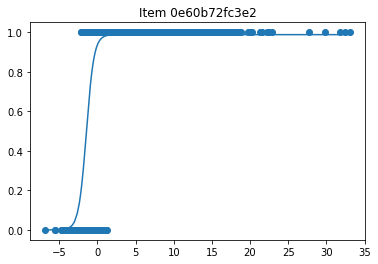

a : 1.9999999999997908  b:  -1.4511952661442633  c:  3.4278076844897746e-17
d:  0.9878925837200841


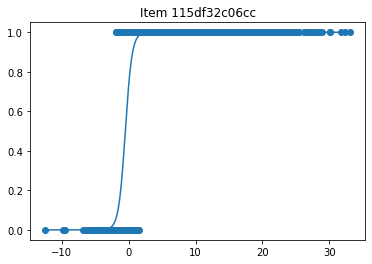

a : 1.9999469059089863  b:  -0.4966685279658207  c:  1.4800100496496134e-15
d:  0.9999999999380144


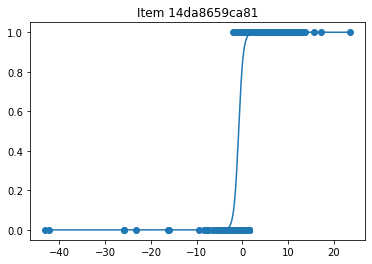

a : 1.9999999999999998  b:  -0.8485185999123953  c:  7.094406899222347e-24
d:  0.9999999999999999


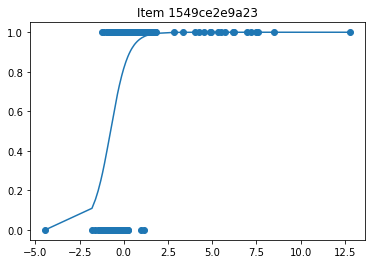

a : 1.9999999999999998  b:  -0.7523553211654905  c:  8.909479275742539e-18
d:  0.9999999999999074


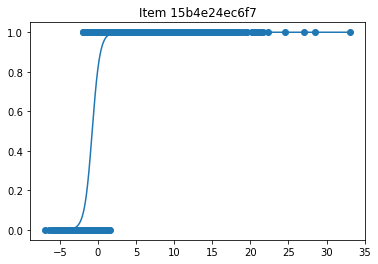

a : 1.9999999999999996  b:  -0.7588998206179985  c:  2.2841213245077913e-17
d:  0.9999999999962761


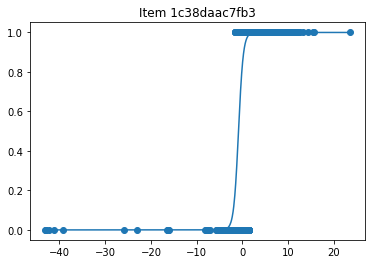

a : 1.930834150133348  b:  -0.8744660716179002  c:  8.96817793475994e-17
d:  0.9989106038946775


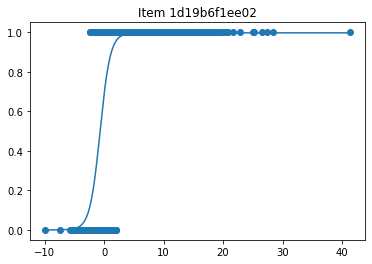

a : 1.1687849319214976  b:  -0.6907568946218678  c:  1.224099260642917e-11
d:  0.9969574376087093


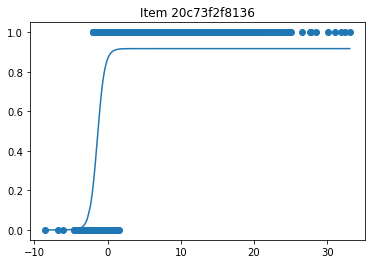

a : 1.9999999999965132  b:  -1.396437115626398  c:  5.566552987625288e-16
d:  0.9171961127746528


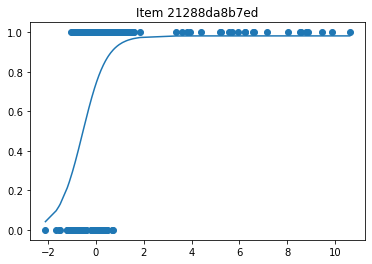

a : 1.999999999999847  b:  -0.5527047746730224  c:  9.295799355389589e-17
d:  0.9815082090504644


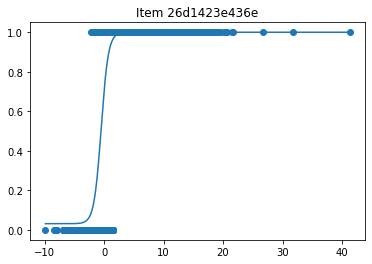

a : 1.6642202572259028  b:  -0.5011206294103222  c:  0.031477962363183884
d:  0.9999999999999948


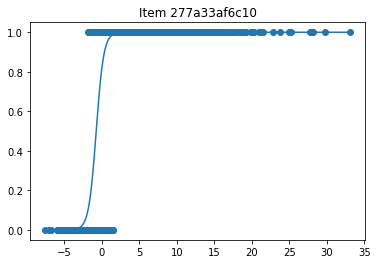

a : 1.9999999999999998  b:  -0.7666452875141068  c:  1.0768356472019494e-22
d:  0.9999999999955818


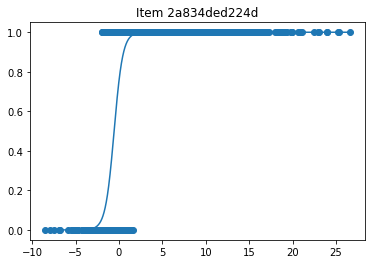

a : 1.999999999999982  b:  -0.5630692260214812  c:  5.416381822244534e-09
d:  0.9999999999999999


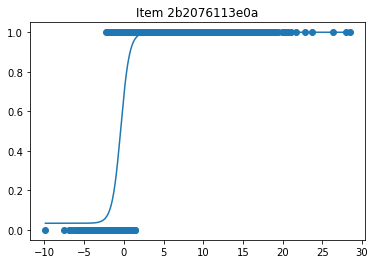

a : 1.850305163692935  b:  -0.3806531152973685  c:  0.033681837943327415
d:  0.9999999999973036


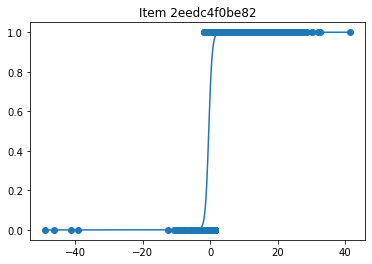

a : 1.9999999999961573  b:  -0.4460483637341653  c:  1.001766683181709e-14
d:  0.9999999999581779


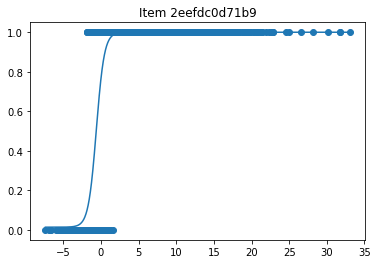

a : 1.8959083093410756  b:  -0.6153445659625745  c:  0.013859577015043026
d:  0.9999999999999165


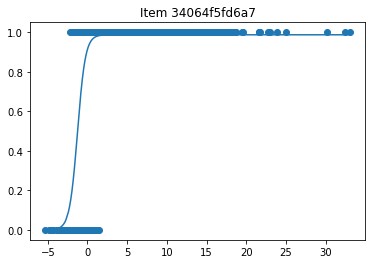

a : 1.9999999999975042  b:  -1.2611081174209369  c:  9.189412005363018e-13
d:  0.9871373243351423


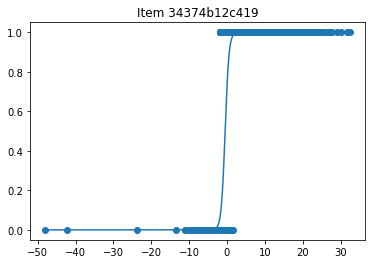

a : 1.9810977585648537  b:  -0.5090983780144096  c:  1.4371694788678458e-10
d:  0.9999999999914205


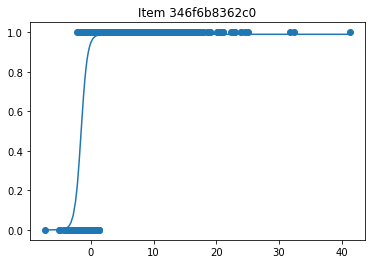

a : 1.9999999999989553  b:  -1.561093614415875  c:  2.589528338715442e-15
d:  0.9896535300981466


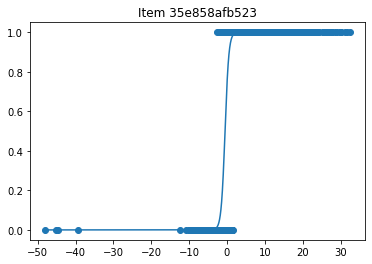

a : 1.9999999999999922  b:  -0.5341745453420995  c:  3.0521527010724635e-16
d:  0.9999999999986883


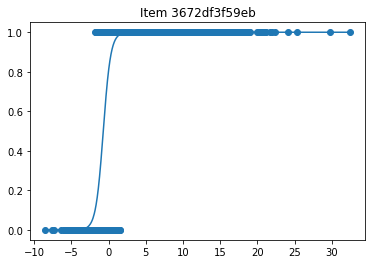

a : 1.9999999999999998  b:  -0.7063820273373086  c:  1.6815445479585062e-25
d:  0.9999999999147074


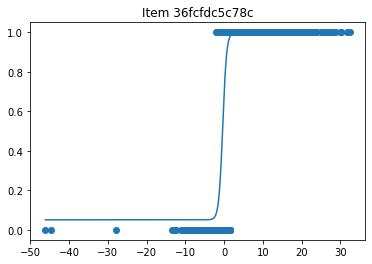

a : 1.9999999985472932  b:  -0.38509157528772003  c:  0.05101712122181093
d:  0.9999999998023616


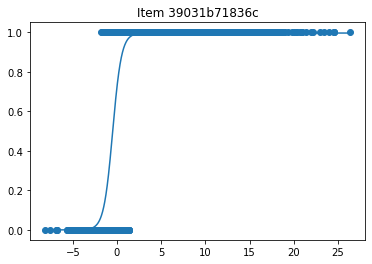

a : 1.999999999983889  b:  -0.49320616181499644  c:  1.631874084335207e-13
d:  0.9959561150471028


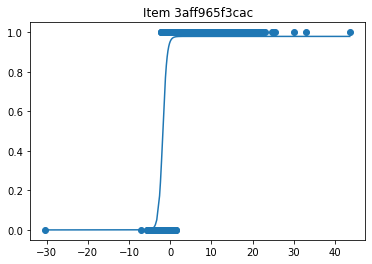

a : 1.9999999997625992  b:  -1.809059535767397  c:  2.6051589810675003e-10
d:  0.9789479979150286


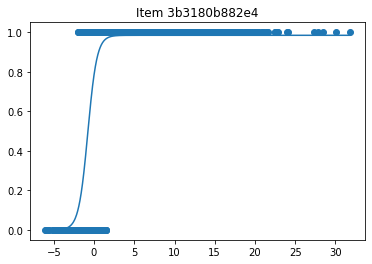

a : 1.7661874215914706  b:  -0.7759644114882737  c:  1.5614079726076337e-14
d:  0.9845433424047353


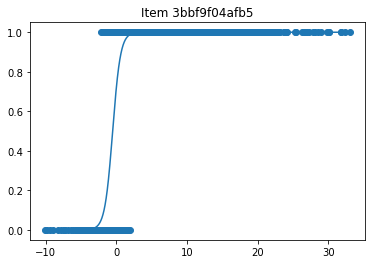

a : 1.802117089239509  b:  -0.512163934952908  c:  6.479121601354221e-14
d:  0.9999999999997574


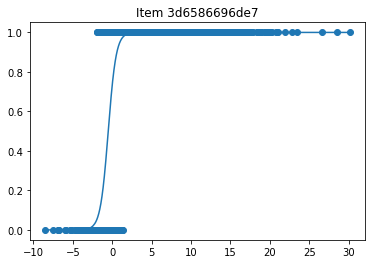

a : 1.9999999999999998  b:  -0.5062096637033672  c:  6.90216417038714e-14
d:  0.9990770970621007


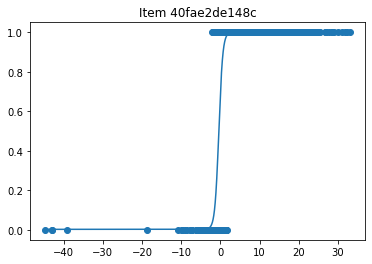

a : 1.9967654868068294  b:  -0.39801495809076204  c:  0.002893642614698559
d:  0.9999999999999128


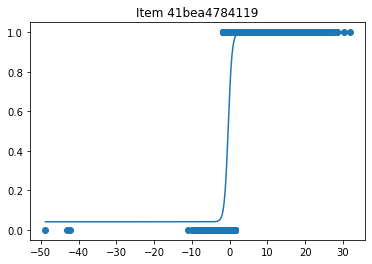

a : 1.9999999977894474  b:  -0.39439001471551854  c:  0.04098033647217337
d:  0.9999999998203606


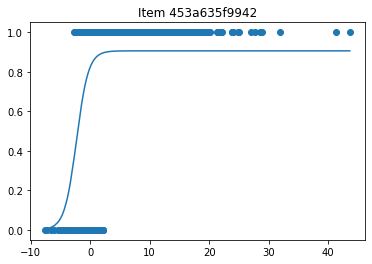

a : 1.0000000000000002  b:  -2.286806074531287  c:  2.276198090440054e-09
d:  0.905932413778202


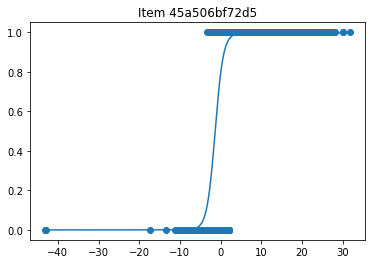

a : 1.0000000000000002  b:  -1.330155707936875  c:  6.83435378368026e-11
d:  0.9963667274106814


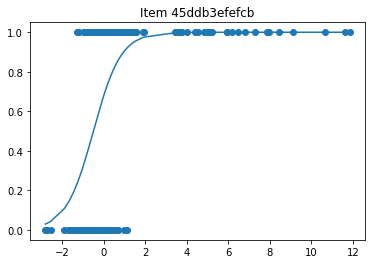

a : 1.509245086053172  b:  -0.4972818306832556  c:  7.269646023916885e-19
d:  0.999999999996934


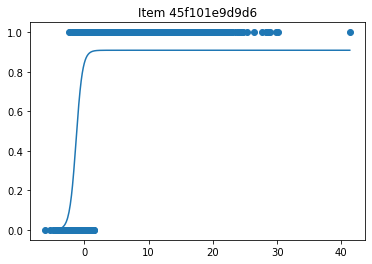

a : 1.9999999986169659  b:  -1.293515925314264  c:  4.463740002033537e-13
d:  0.9088988739435371


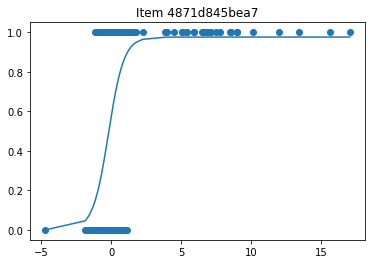

a : 1.8076457132550692  b:  -0.19907892763101326  c:  1.6293693965283888e-16
d:  0.9756865648032926


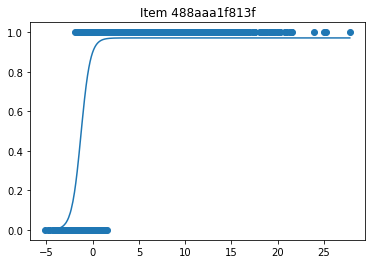

a : 1.9999999999999833  b:  -1.2644613939115663  c:  3.5158458363463975e-15
d:  0.9712541147330439


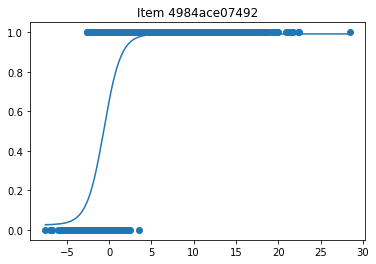

a : 1.000000000070435  b:  -0.6232280688200535  c:  0.025423210728535026
d:  0.9915010557650915


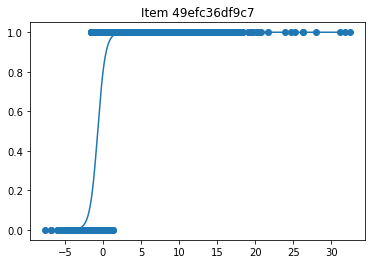

a : 1.9999999999999998  b:  -0.6775841089403484  c:  7.986366329286478e-23
d:  0.9999999999273753


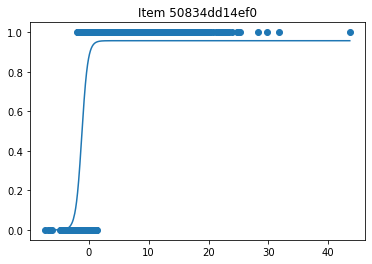

a : 1.9999999999991531  b:  -1.1779205238241042  c:  3.408677956134215e-15
d:  0.9571568056358374


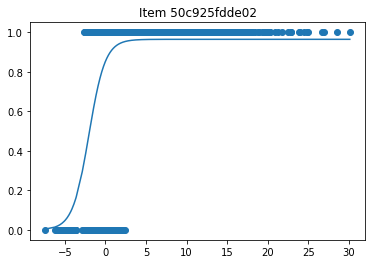

a : 1.0000000002058396  b:  -2.0293368232917572  c:  2.0228675923308133e-11
d:  0.9641810212767996


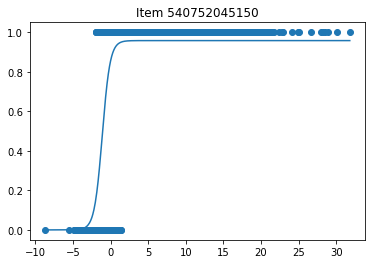

a : 1.9161854294123606  b:  -1.1096234879290752  c:  8.893836859500652e-15
d:  0.9577262909096634


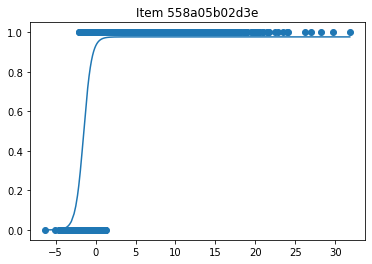

a : 1.9999999999999334  b:  -1.4959886398773905  c:  2.5145313720298874e-17
d:  0.9764613301765062


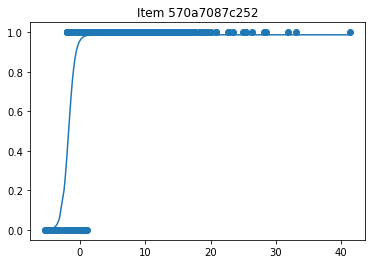

a : 1.99999999905894  b:  -1.7188548310668799  c:  2.451286088276164e-11
d:  0.9870707439544801


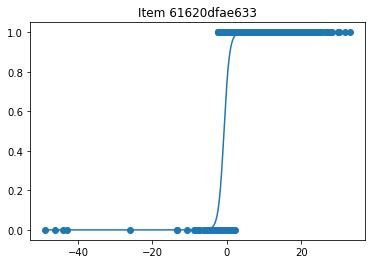

a : 1.3654802113418238  b:  -0.7742174686157234  c:  1.3257039369761275e-20
d:  0.9999406978876059


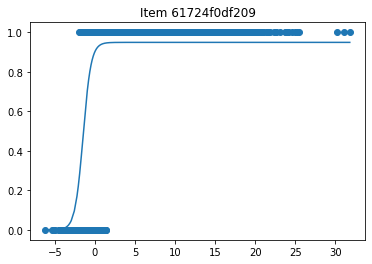

a : 1.9999999981352248  b:  -1.4778940141116168  c:  5.581020067558787e-11
d:  0.9487208316417985


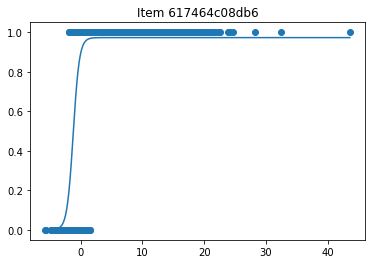

a : 1.9999999983309842  b:  -1.2192491899778721  c:  4.902658120240778e-11
d:  0.9728845482712584


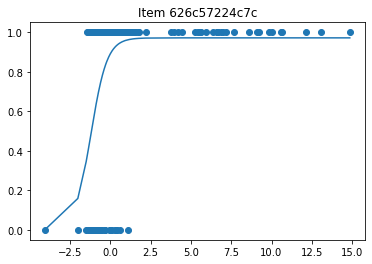

a : 1.999999999999944  b:  -1.2069621205000778  c:  5.289467886489848e-17
d:  0.9715866970877154


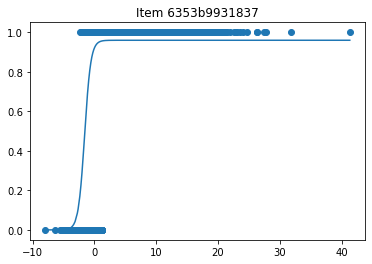

a : 1.9920675902230072  b:  -1.5867604956783732  c:  4.782038149686829e-16
d:  0.9594518426883327


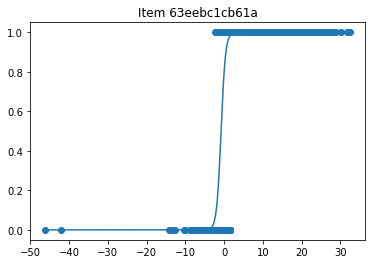

a : 1.7596306088805551  b:  -0.8115499412397719  c:  5.356639447804827e-18
d:  0.999355047080756


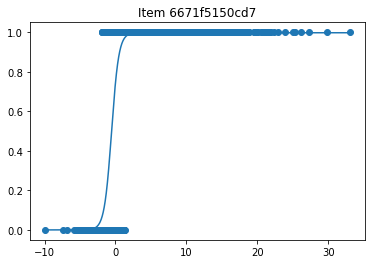

a : 1.9617184101885594  b:  -0.5492383297544965  c:  1.3334428567551564e-12
d:  0.9974663638098055


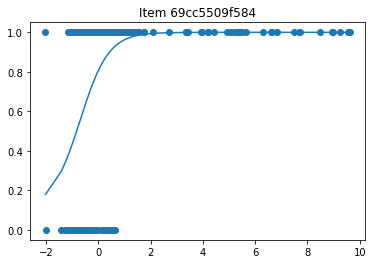

a : 1.8387604409148453  b:  -0.6933880147796815  c:  0.10841233953221437
d:  0.9996218063885651


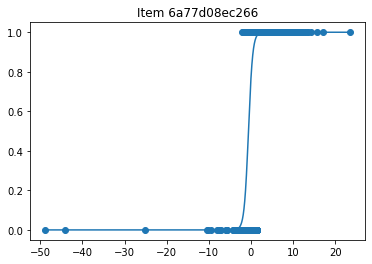

a : 1.9999999999999993  b:  -0.6058424315471589  c:  4.2802648645015967e-19
d:  0.9999999998493964


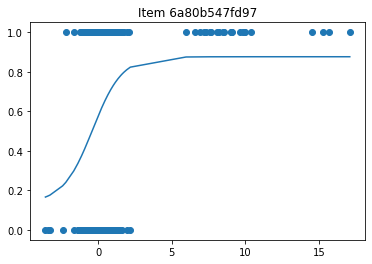

a : 1.0000000000000002  b:  -0.3751541404812681  c:  0.13753600214257375
d:  0.876090341710139


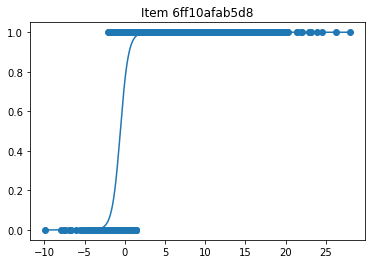

a : 1.9999999999999734  b:  -0.5582155176506367  c:  4.2407720011710255e-16
d:  0.999999999998634


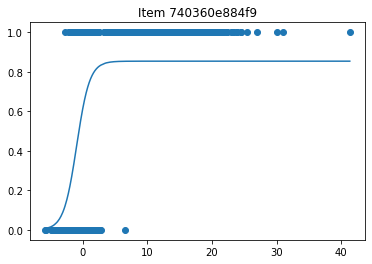

a : 1.0000000000006792  b:  -0.9046952426198277  c:  4.689143115177038e-09
d:  0.8536527519022225


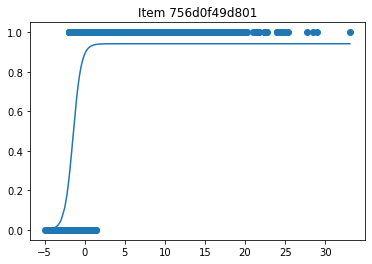

a : 1.9419126204543296  b:  -1.4603036393781466  c:  2.7231522025975625e-19
d:  0.9418423894801946


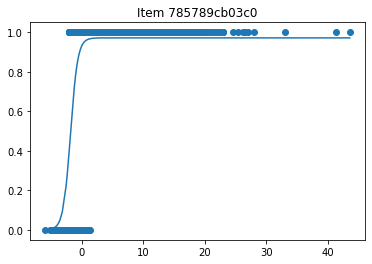

a : 1.7034541420258844  b:  -1.880643534045873  c:  6.1069040597573e-15
d:  0.9714245513646057


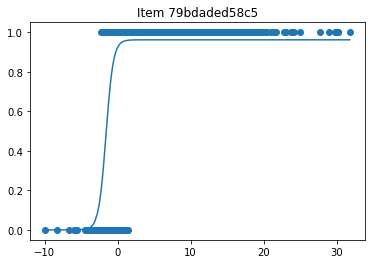

a : 1.999999999996036  b:  -1.5830359800004605  c:  7.628371273823072e-16
d:  0.961723608440591


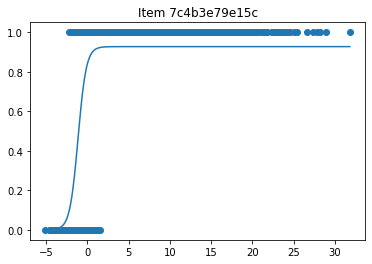

a : 1.9999999999347635  b:  -1.1181923045376518  c:  1.9303713297951017e-13
d:  0.9272923192979137


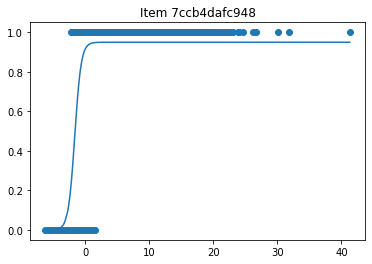

a : 1.999999999977199  b:  -1.656672844018275  c:  1.8173096473671256e-13
d:  0.9495145726860957


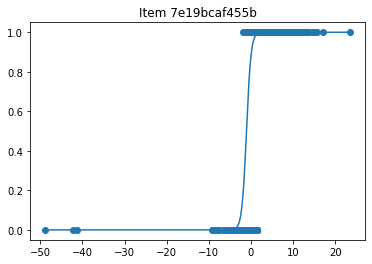

a : 1.8588695924260341  b:  -1.0781943497914348  c:  2.5518031133530627e-26
d:  0.9999999999984133


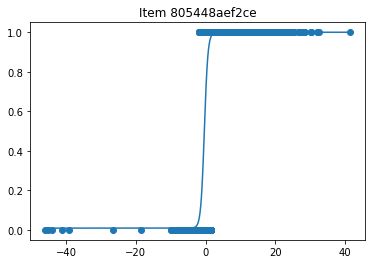

a : 1.9785418595834225  b:  -0.38813204236334226  c:  0.009020200611645358
d:  0.9999999999999999


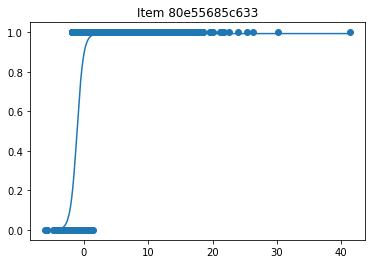

a : 1.9999999996648226  b:  -1.0821353505739053  c:  2.1636598277800224e-14
d:  0.9932528388385966


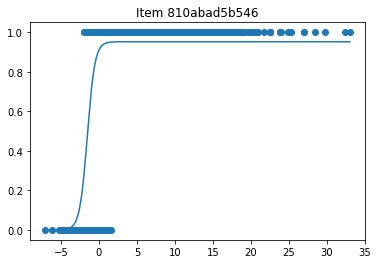

a : 1.9999999999645426  b:  -1.5327142765531667  c:  6.364515104059651e-15
d:  0.9518454768825352


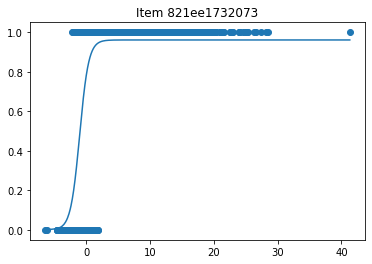

a : 1.41987214381853  b:  -1.0414567550462213  c:  9.76824159611202e-16
d:  0.9609825996859159


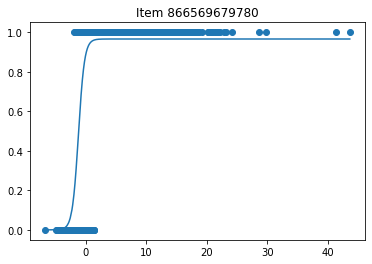

a : 1.9999999996573745  b:  -1.198168201195068  c:  1.3498161830688501e-11
d:  0.9658226465172103


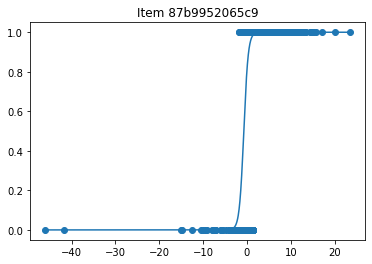

a : 1.9999999999998261  b:  -0.7203648650702403  c:  4.316308957836536e-15
d:  0.9999999999967731


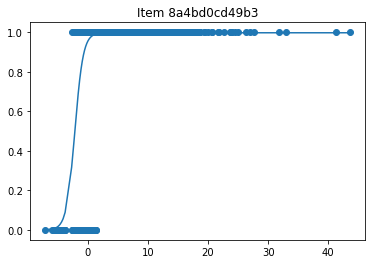

a : 1.437713975213692  b:  -2.1834527712620586  c:  2.4789303251534386e-10
d:  0.9973318453016173


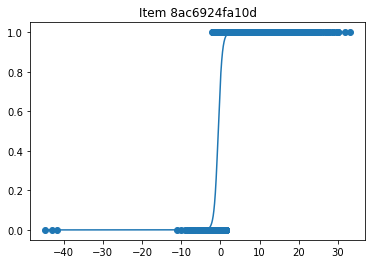

a : 1.9999999999999998  b:  -0.5536591828293469  c:  6.599952712595803e-20
d:  0.9999999999999997


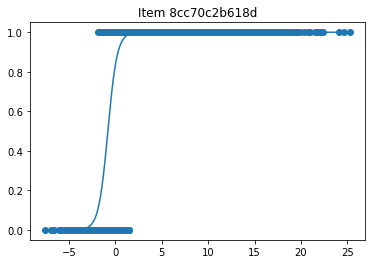

a : 1.99999999999998  b:  -0.8109767272519417  c:  4.295249219742678e-16
d:  0.9999999999945842


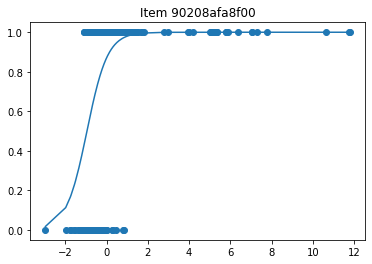

a : 1.9999999999999998  b:  -0.9536821949289361  c:  1.9259732523578944e-22
d:  0.9999999999999999


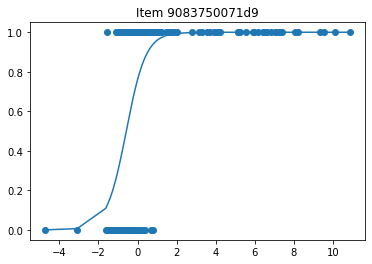

a : 1.9999999999991356  b:  -0.5755774946740307  c:  2.9576244843115154e-17
d:  0.9999999999538212


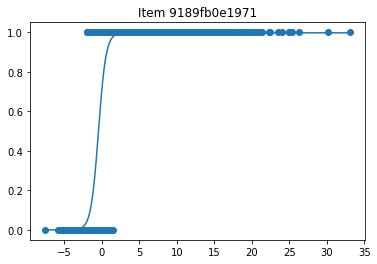

a : 1.9999999999908857  b:  -0.46772736473153215  c:  5.052827228629274e-10
d:  0.9970769794612511


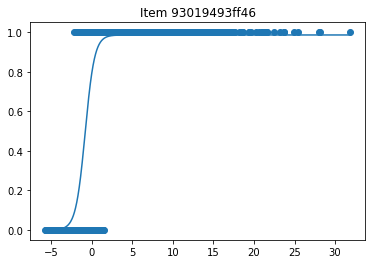

a : 1.7350676888499434  b:  -0.8178474807571943  c:  1.3313376583255197e-14
d:  0.9862053213551433


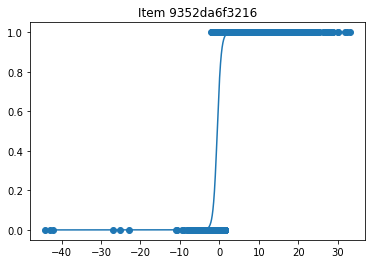

a : 1.999999999999734  b:  -0.5466974822881764  c:  3.780791727724589e-18
d:  0.9999999999711051


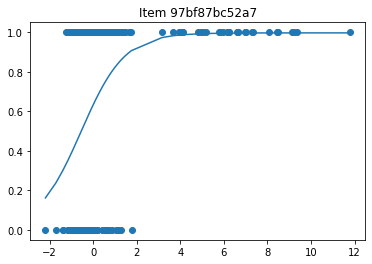

a : 1.0000000000000449  b:  -0.5589569235223525  c:  2.8226582587234096e-11
d:  0.9967717208390157


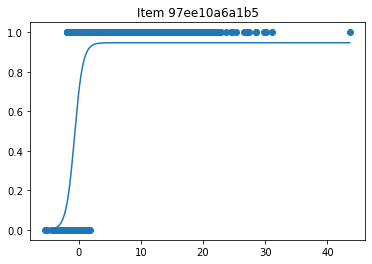

a : 1.4915206687976428  b:  -0.661792827884114  c:  1.0694034290489278e-19
d:  0.9469890466365228


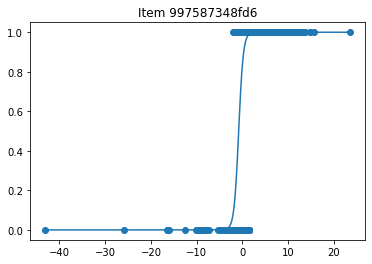

a : 1.9999999999999998  b:  -0.8357870937155693  c:  3.4120465207220907e-22
d:  0.9999999999999999


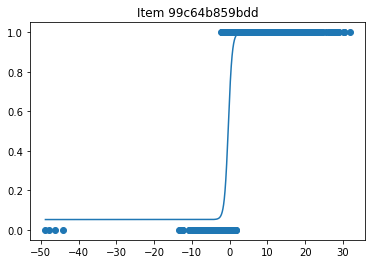

a : 1.954003959224042  b:  -0.36860566654476146  c:  0.05244786654914338
d:  0.999999999999996


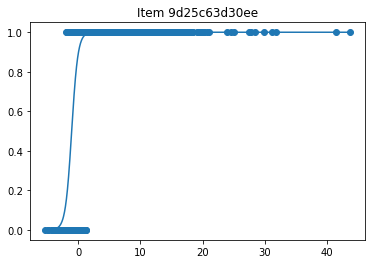

a : 1.9999999999999998  b:  -1.0301548926574953  c:  3.287243941274943e-23
d:  0.9999999515173021


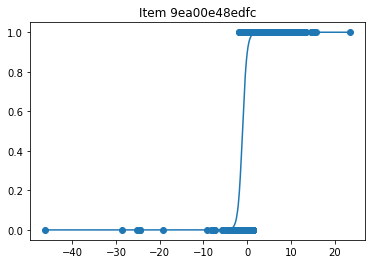

a : 1.9999999999999996  b:  -1.083309174827699  c:  1.630817976016481e-23
d:  0.9999999999252263


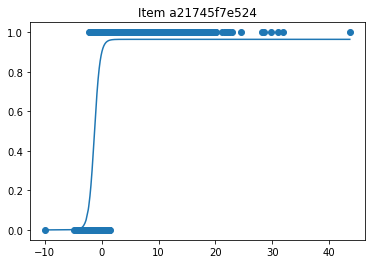

a : 1.9999999997134839  b:  -1.2889676258067682  c:  4.972732248471495e-13
d:  0.9640900452757548


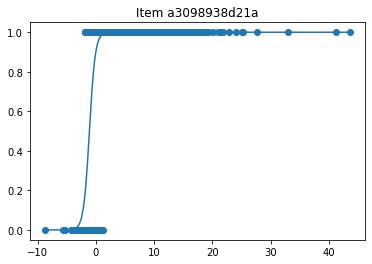

a : 1.9999999999999998  b:  -1.116862859000394  c:  1.3722886035151772e-22
d:  0.9999999999724322


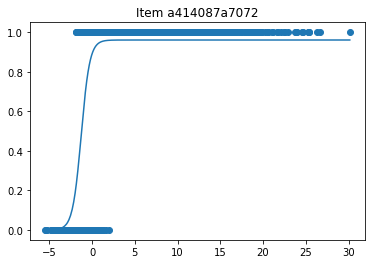

a : 1.999999999994754  b:  -1.273942542370657  c:  4.547887580365041e-12
d:  0.9607538901150575


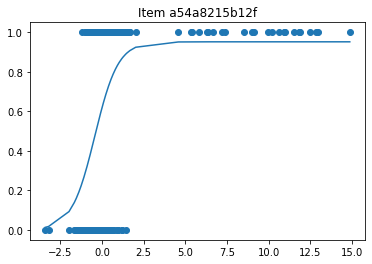

a : 1.4362289976616274  b:  -0.4245403102253176  c:  1.2042100151326508e-19
d:  0.9515969104485218


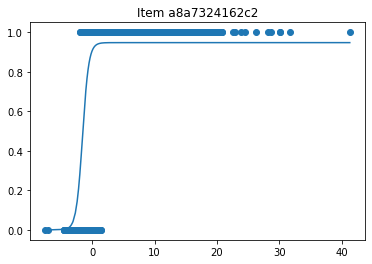

a : 1.999999999985732  b:  -1.5903004950793438  c:  1.9561477216399768e-18
d:  0.9474557872387189


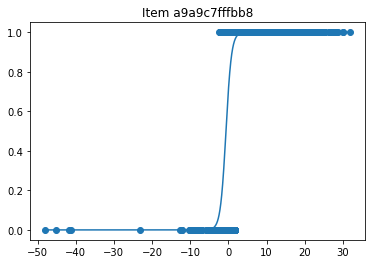

a : 1.3811672218724904  b:  -0.6492065909174607  c:  9.719214078256197e-19
d:  0.999999999994447


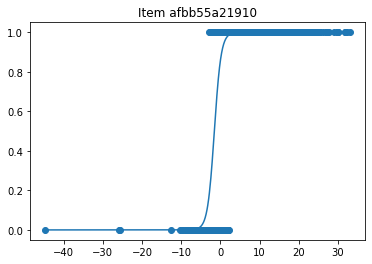

a : 1.159846246793994  b:  -1.5441279788713045  c:  1.8217652786149982e-19
d:  0.9992795084952566


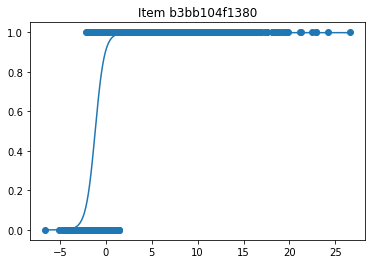

a : 1.9999999999999798  b:  -1.158698119281984  c:  3.845511456422056e-15
d:  0.9978763136752554


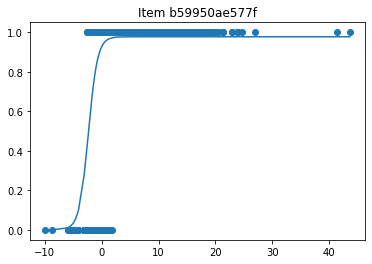

a : 1.2447106179389964  b:  -2.333396046008785  c:  2.5289616513200024e-12
d:  0.977142123204879


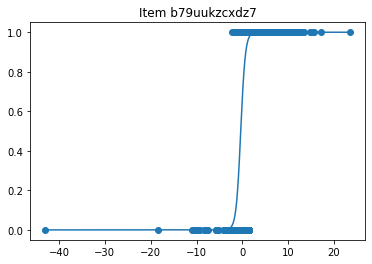

a : 1.9999999999999998  b:  -0.3553638876003184  c:  1.6075474213739262e-20
d:  0.9999999999999644


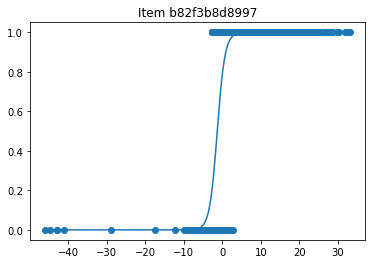

a : 1.0000000000103444  b:  -1.3472052218552133  c:  1.1107820196696858e-09
d:  0.9980185882187282


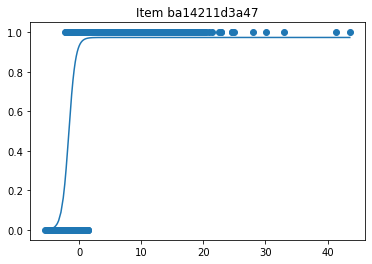

a : 1.8292223212763832  b:  -1.7174416218140343  c:  2.182507774415038e-18
d:  0.9736145785336466


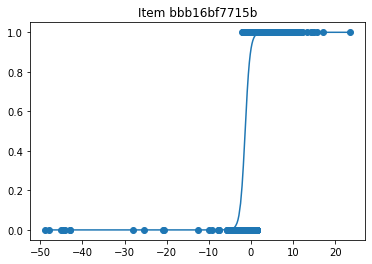

a : 1.7170248304174212  b:  -1.390567427022103  c:  1.1557292940848437e-18
d:  0.9997024521056531


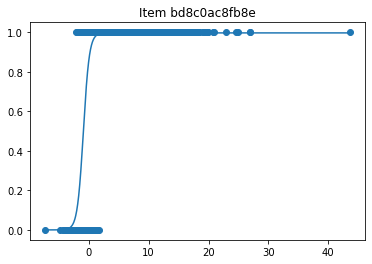

a : 1.9999999994633915  b:  -0.9141823270959192  c:  4.0143733360991784e-13
d:  0.9966783092206748


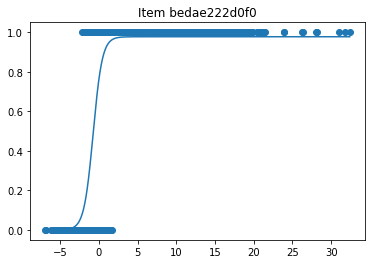

a : 1.7007994493007812  b:  -0.7376326305798432  c:  4.0582746974408576e-13
d:  0.977250765666177


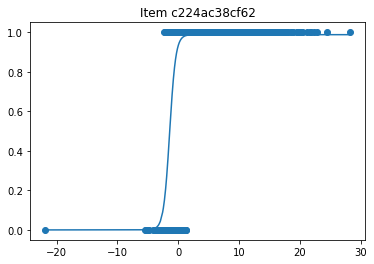

a : 1.9999999999972151  b:  -1.4127643402014776  c:  1.0527448508071015e-16
d:  0.987716389491407


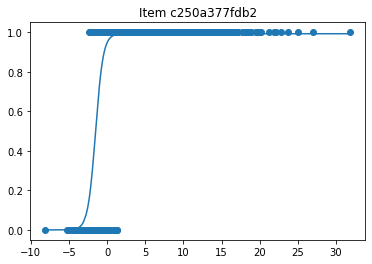

a : 1.9999999991656088  b:  -1.5274297008376667  c:  3.404490641706456e-14
d:  0.9925085994900027


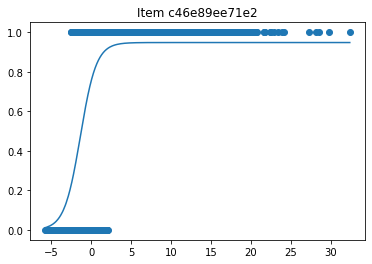

a : 1.000000003302676  b:  -1.356962643254264  c:  2.6016189337056165e-12
d:  0.9479249776420862


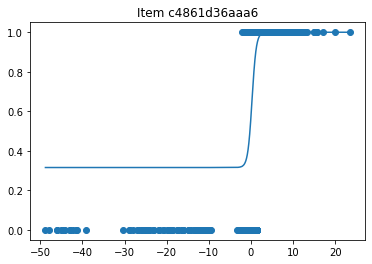

a : 1.9999999999805111  b:  0.2451234853546863  c:  0.31567315592249423
d:  0.9999999999640475


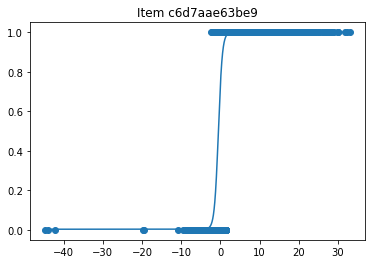

a : 1.9929157453202326  b:  -0.50927627182611  c:  0.0034678212071232468
d:  0.9999999999999999


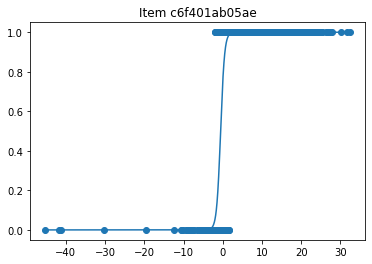

a : 1.9999999999998868  b:  -0.5400618795325207  c:  1.0161998553685324e-16
d:  0.9999999999874511


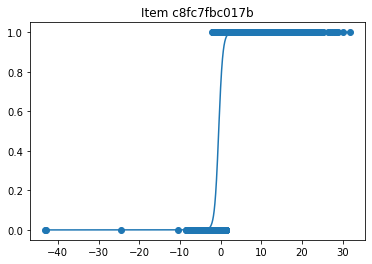

a : 1.999999999994287  b:  -0.4539361412499789  c:  2.5122155516606473e-15
d:  0.9999999998768813


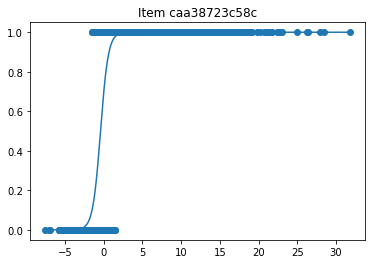

a : 1.9999999999999978  b:  -0.42048843814778636  c:  6.465890906814775e-18
d:  0.9999999997962148


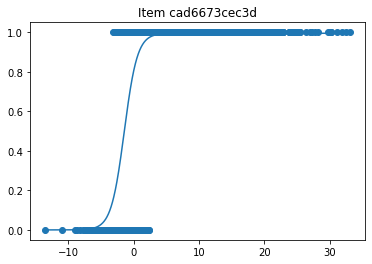

a : 1.000000000307128  b:  -1.4212483546256864  c:  1.4987813820918086e-08
d:  0.9948618474014636


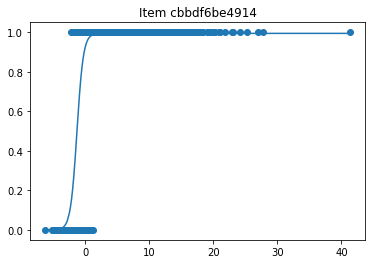

a : 1.9999999999992502  b:  -1.3153659410861627  c:  8.654258308297794e-16
d:  0.9942608856192514


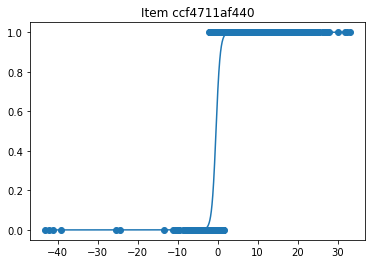

a : 1.924725962793837  b:  -0.40848296560108793  c:  6.600193729260761e-19
d:  0.9999999999991398


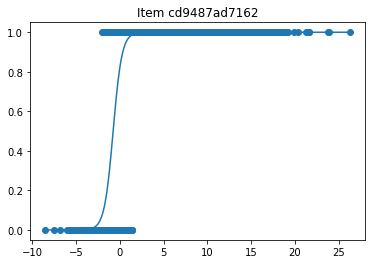

a : 1.9999999999999958  b:  -0.7498521687342653  c:  6.548087098349604e-17
d:  0.9999999999995884


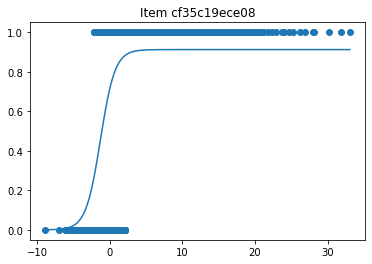

a : 1.0000000000000004  b:  -1.2641544039584134  c:  8.254909620493672e-14
d:  0.9122142590946807


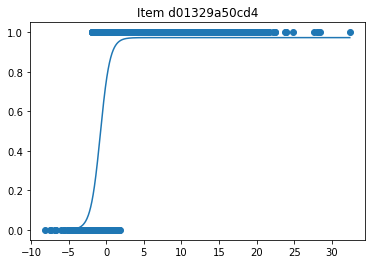

a : 1.5595423364061227  b:  -0.7919190386554751  c:  8.378254235269154e-15
d:  0.9728276583153347


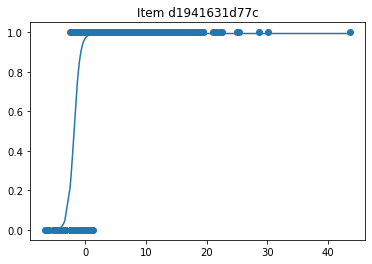

a : 1.9999999999809084  b:  -1.8228857329250916  c:  5.351815503763526e-11
d:  0.9935646358410595


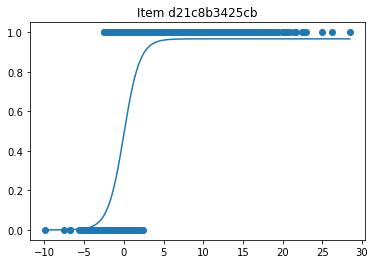

a : 1.000000000756939  b:  -0.0034573111837539455  c:  1.482737624660183e-10
d:  0.9666225598693032


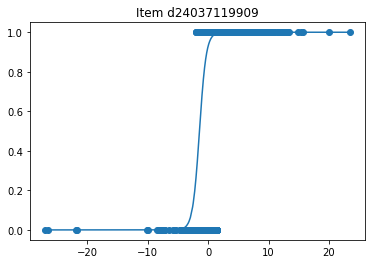

a : 1.7943898911609402  b:  -1.4478622779926344  c:  1.3049465891483325e-25
d:  0.9999999942597185


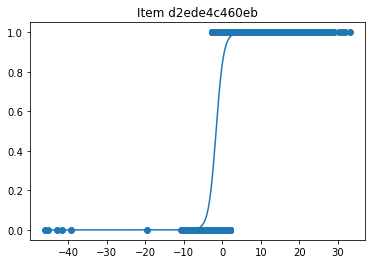

a : 1.0335725313428576  b:  -1.6536016555271438  c:  4.132465076046073e-18
d:  0.9993572998544955


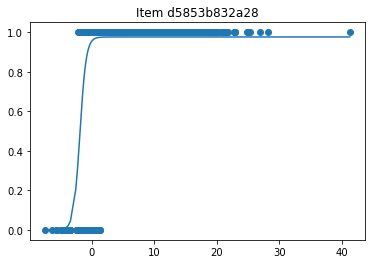

a : 1.9999999999907425  b:  -1.9045488939134239  c:  5.397186751008361e-10
d:  0.9761100195530071


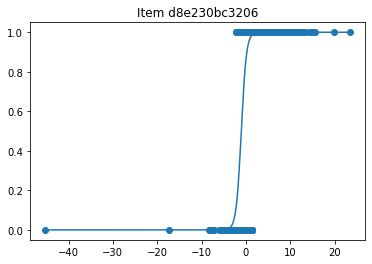

a : 1.7465378208097564  b:  -1.0294482568482761  c:  1.188874542223912e-25
d:  0.9999999999999112


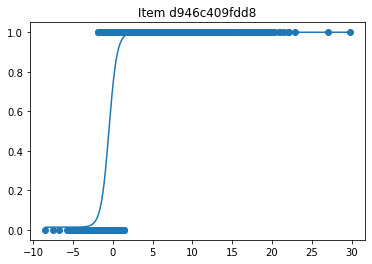

a : 1.9999999998900622  b:  -0.48505988514079074  c:  0.013771698235776118
d:  0.9999999999994432


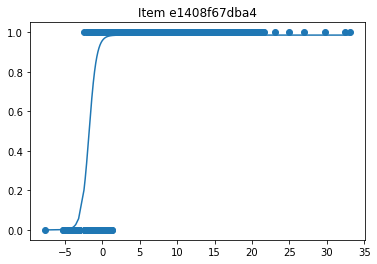

a : 1.9999999999999782  b:  -1.7713235325318653  c:  1.067524203087492e-12
d:  0.9855947027342574


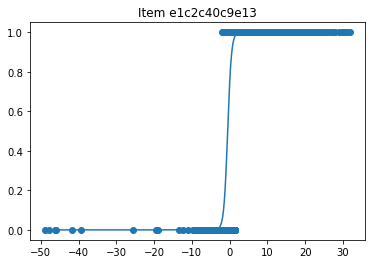

a : 1.9999999999999947  b:  -0.5496430592852258  c:  2.3225967104105147e-16
d:  0.9999999999991135


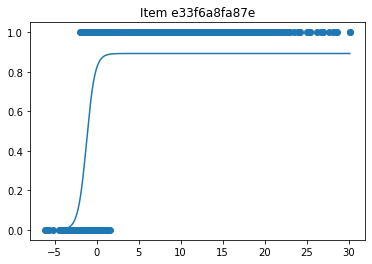

a : 1.9999999899517595  b:  -1.2073281768923165  c:  6.875060497732111e-18
d:  0.8925338168770112


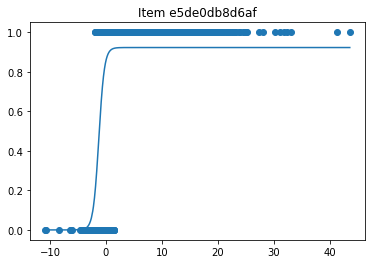

a : 1.999999999700024  b:  -1.2825029098062404  c:  4.52125849138136e-16
d:  0.9226401439426548


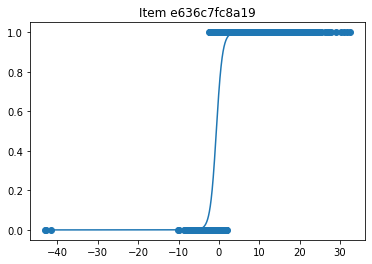

a : 1.3292181358699744  b:  -0.6589105619369492  c:  1.4546787961628086e-18
d:  0.9999999999983015


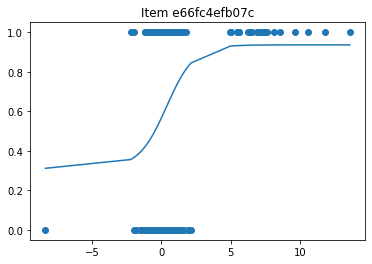

a : 1.0000000000000002  b:  0.3725002539591279  c:  0.3115701786124898
d:  0.9360623065158415


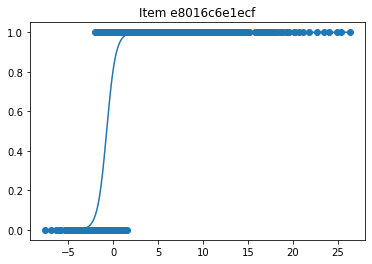

a : 1.9999999999816196  b:  -0.7284531459166498  c:  6.929367520893712e-15
d:  0.9999999997726439


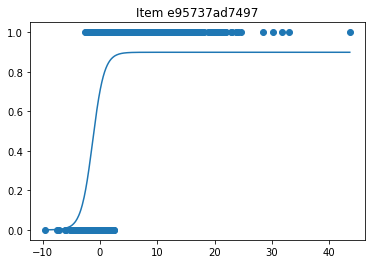

a : 1.0000000000000002  b:  -1.2915988193328836  c:  1.4004123599078048e-16
d:  0.8986584996978988


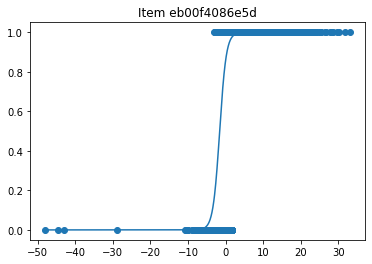

a : 1.1363846915727218  b:  -1.5809949379800254  c:  2.6136961987434374e-16
d:  0.9987790936932921


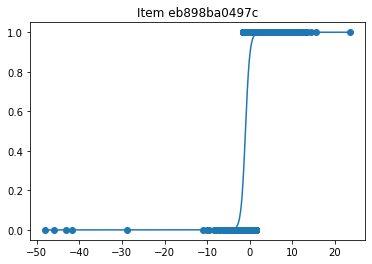

a : 1.9912482207217899  b:  -1.0290746686560759  c:  3.2029500604210203e-21
d:  0.9999999999990118


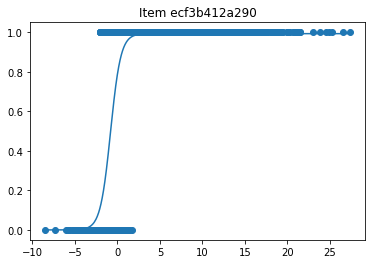

a : 1.6640258811422506  b:  -0.807809042221435  c:  3.270192511163743e-14
d:  0.9928738525648272


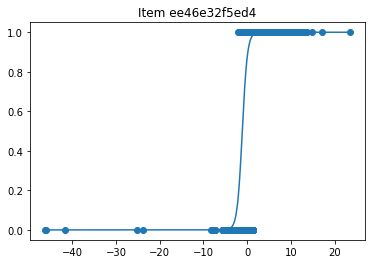

a : 1.7290782890081846  b:  -1.127696230624318  c:  2.008916337862741e-20
d:  0.9999999999999238


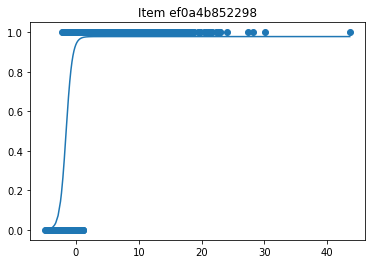

a : 1.9999999999853477  b:  -1.5984350421460256  c:  6.829924585142911e-15
d:  0.9780867090636131


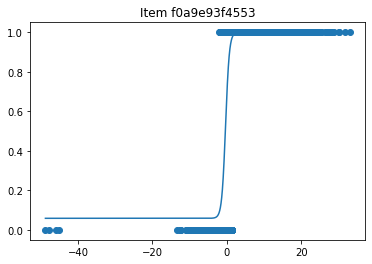

a : 1.9902187022573448  b:  -0.3503526977912733  c:  0.058721388288256925
d:  0.9999999999982151


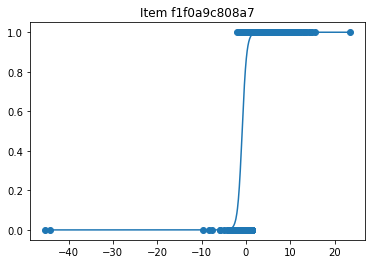

a : 1.9999999999999998  b:  -0.8315183558213819  c:  1.97755064833821e-22
d:  0.9999999999955226


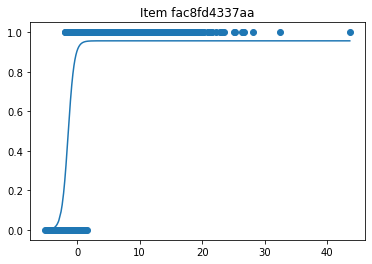

a : 1.9999999999424176  b:  -1.4547972914364924  c:  1.7378631445080905e-13
d:  0.9565570396325116


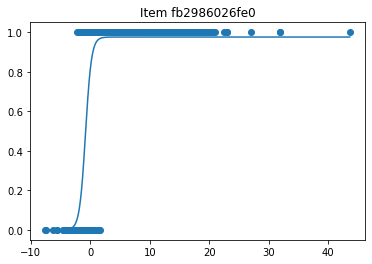

a : 1.9999999999098754  b:  -0.8080942321670552  c:  3.872786065750551e-11
d:  0.975751367849689


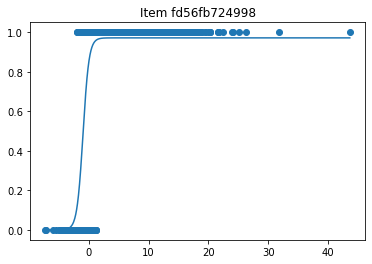

a : 1.9999999999270437  b:  -0.9459650881702012  c:  1.4716283800034892e-15
d:  0.9715318228882801


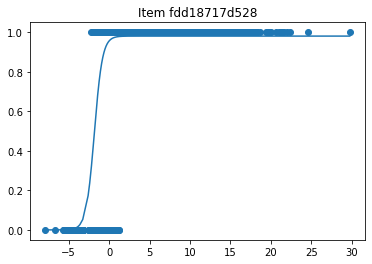

a : 1.999999999999966  b:  -1.8302590871440028  c:  3.1144321176693135e-13
d:  0.9805303688490475


In [816]:
for item_num in range(len(table.columns)):
    if ~np.isnan(solvedIRT_5.est_params[0][item_num]):
        plot_item_with_model(solvedIRT_5.thetas, item_num, table, [i[item_num] for i in solvedIRT_5.est_params[:-1]])

In [824]:
# distributionsOfEstimatedItemParameters(solvedIRT_3)

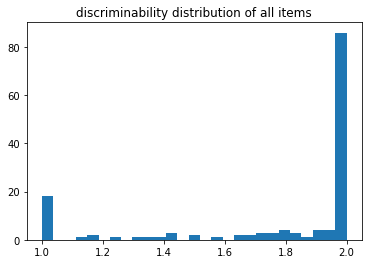

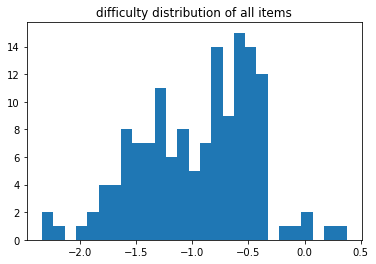

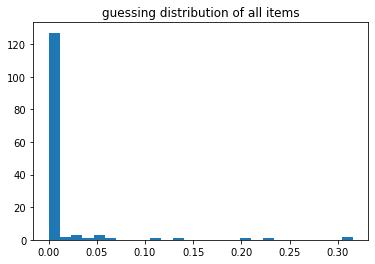

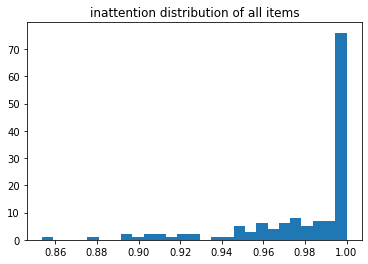

In [811]:
distributionsOfEstimatedItemParameters(solvedIRT_5)

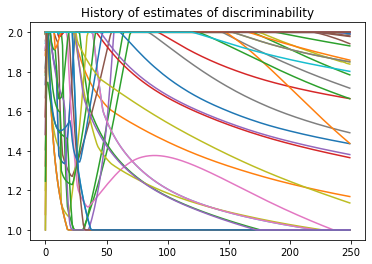

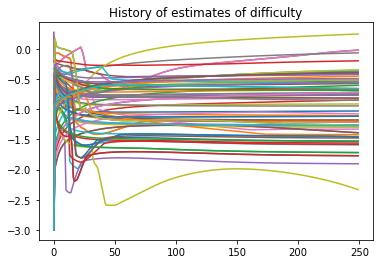

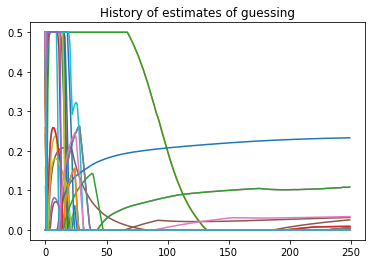

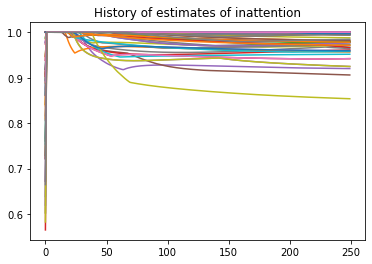

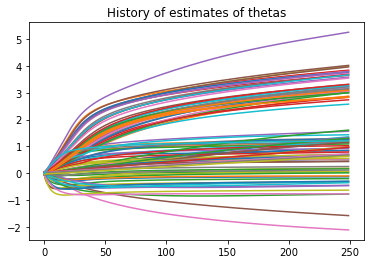

In [827]:
plot_sample_parameter_convergence(solvedIRT_5,100)

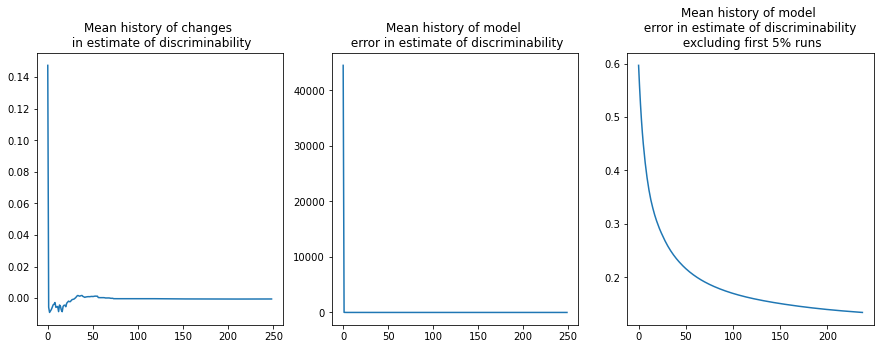

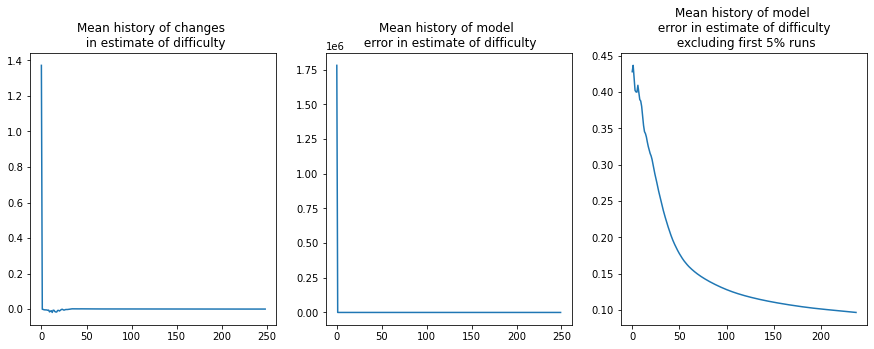

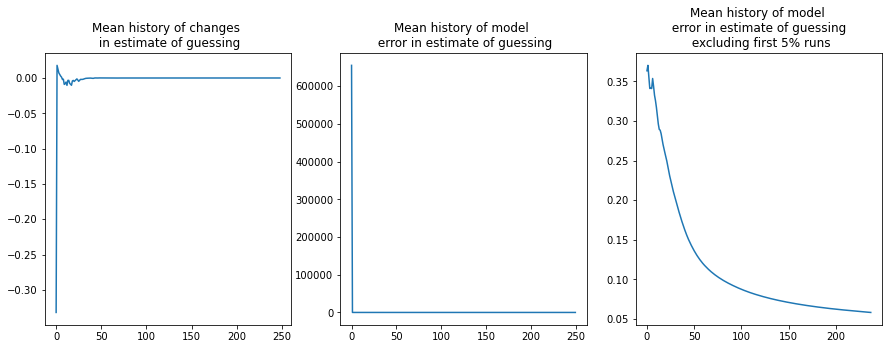

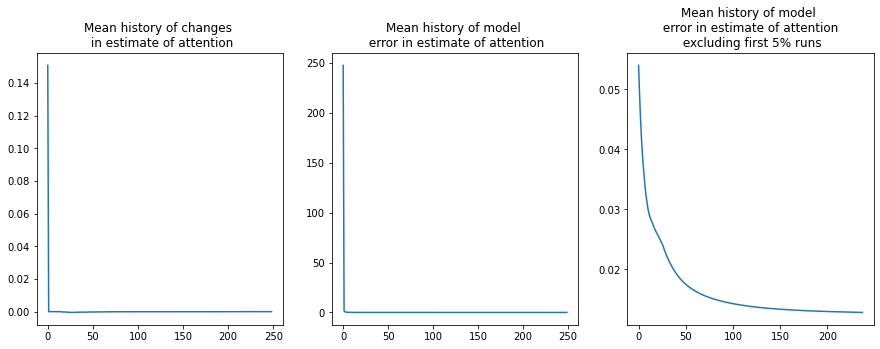

In [813]:
timeCourseOfParameterConvergence(solvedIRT_5)

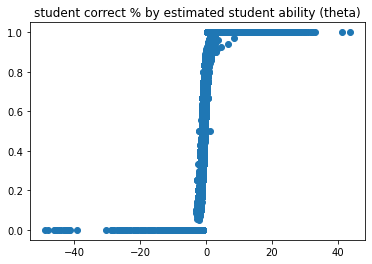

Correlation:  0.7077449612367663


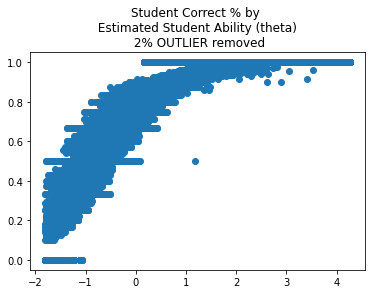

Correlation:  0.7495396051212854


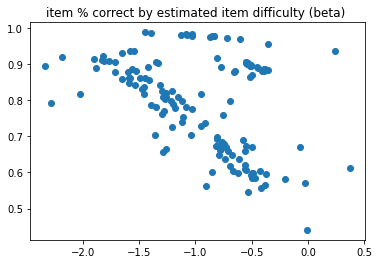

Correlation:  -0.39751009455171116


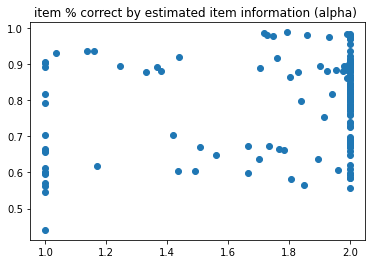

Correlation:  0.27516086645370813


In [859]:
correlationOfParametersByPerformance(solvedIRT_5, 2)

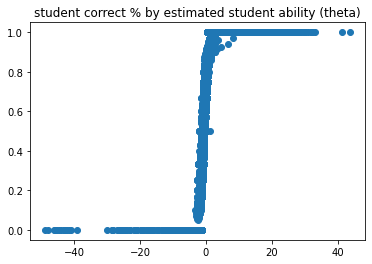

Correlation:  0.707717491512267


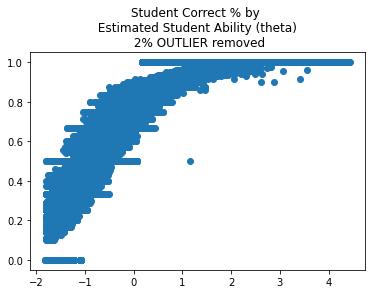

Correlation:  0.7495406649841387


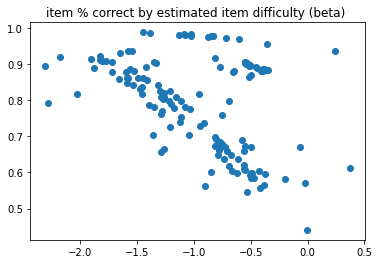

Correlation:  -0.3976835865573276


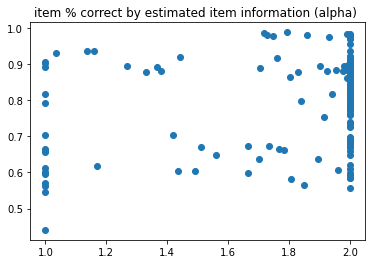

Correlation:  0.27576980939051826


In [864]:
correlationOfParametersByPerformance(solvedIRT_6, 2)


In [858]:
# np.corrcoef(solvedIRT_5.est_params[1][~np.isnan(solvedIRT_5.est_params[1])], solvedIRT_5.student_correct[~np.isnan(solvedIRT_5.est_params[1])])[0][1]

iteration # 0


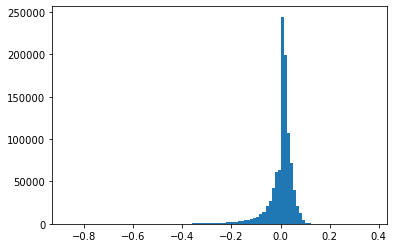

iteration # 1
iteration # 2
iteration # 3
iteration # 4
iteration # 5
iteration # 6
iteration # 7
iteration # 8
iteration # 9
iteration # 10


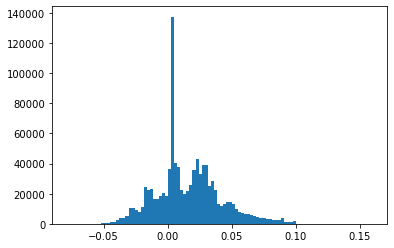

iteration # 11
iteration # 12
iteration # 13
iteration # 14
iteration # 15
iteration # 16
iteration # 17
iteration # 18
iteration # 19
iteration # 20


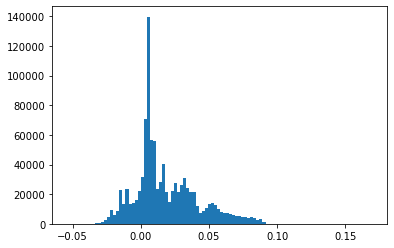

iteration # 21
iteration # 22
iteration # 23
iteration # 24
iteration # 25
iteration # 26
iteration # 27
iteration # 28
iteration # 29
iteration # 30


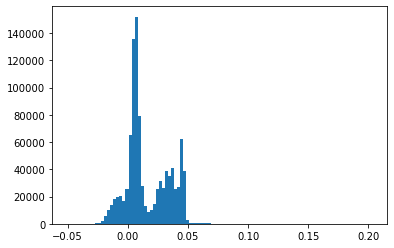

iteration # 31
iteration # 32
iteration # 33
iteration # 34
iteration # 35
iteration # 36
iteration # 37
iteration # 38
iteration # 39
iteration # 40


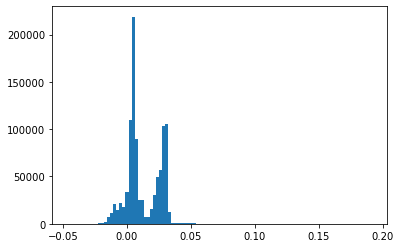

iteration # 41
iteration # 42
iteration # 43
iteration # 44
iteration # 45
iteration # 46
iteration # 47
iteration # 48
iteration # 49
iteration # 50


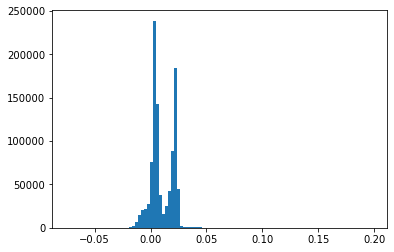

iteration # 51
iteration # 52
iteration # 53
iteration # 54
iteration # 55
iteration # 56
iteration # 57
iteration # 58
iteration # 59
iteration # 60


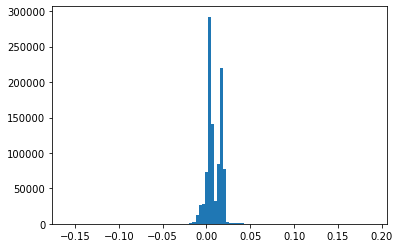

iteration # 61
iteration # 62
iteration # 63
iteration # 64
iteration # 65
iteration # 66
iteration # 67
iteration # 68
iteration # 69
iteration # 70


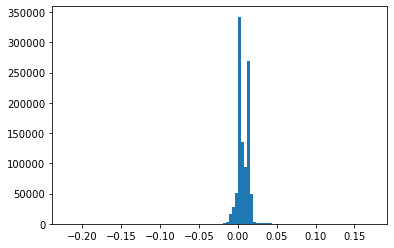

iteration # 71
iteration # 72
iteration # 73
iteration # 74
iteration # 75
iteration # 76
iteration # 77
iteration # 78
iteration # 79
iteration # 80


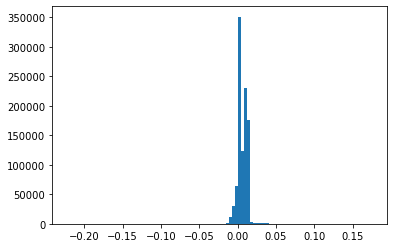

iteration # 81
iteration # 82
iteration # 83
iteration # 84
iteration # 85
iteration # 86
iteration # 87
iteration # 88
iteration # 89
iteration # 90


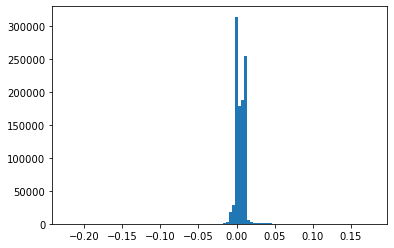

iteration # 91
iteration # 92
iteration # 93
iteration # 94
iteration # 95
iteration # 96
iteration # 97
iteration # 98
iteration # 99
iteration # 100


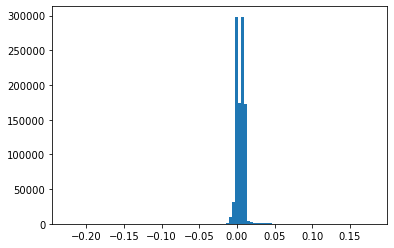

iteration # 101
iteration # 102
iteration # 103
iteration # 104
iteration # 105
iteration # 106
iteration # 107
iteration # 108
iteration # 109
iteration # 110


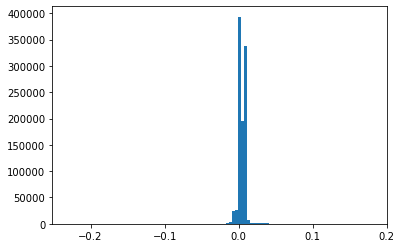

iteration # 111
iteration # 112
iteration # 113
iteration # 114
iteration # 115
iteration # 116
iteration # 117
iteration # 118
iteration # 119
iteration # 120


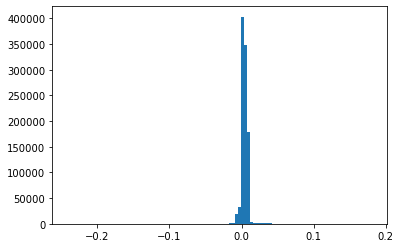

iteration # 121
iteration # 122
iteration # 123
iteration # 124
iteration # 125
iteration # 126
iteration # 127
iteration # 128
iteration # 129
iteration # 130


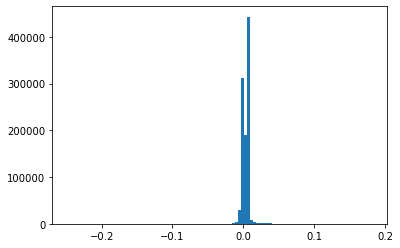

iteration # 131
iteration # 132
iteration # 133
iteration # 134
iteration # 135
iteration # 136
iteration # 137
iteration # 138
iteration # 139
iteration # 140


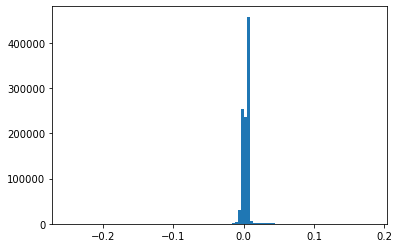

iteration # 141
iteration # 142
iteration # 143
iteration # 144
iteration # 145
iteration # 146
iteration # 147
iteration # 148
iteration # 149
iteration # 150


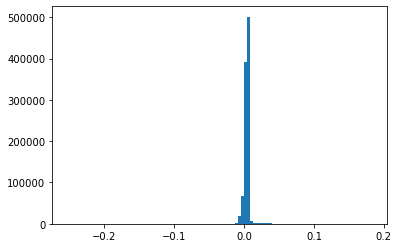

iteration # 151
iteration # 152
iteration # 153
iteration # 154
iteration # 155
iteration # 156
iteration # 157
iteration # 158
iteration # 159
iteration # 160


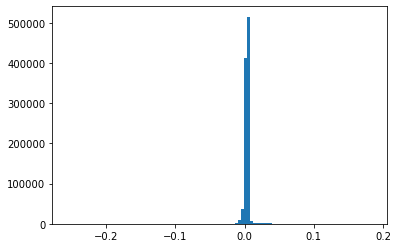

iteration # 161
iteration # 162
iteration # 163
iteration # 164
iteration # 165
iteration # 166
iteration # 167
iteration # 168
iteration # 169
iteration # 170


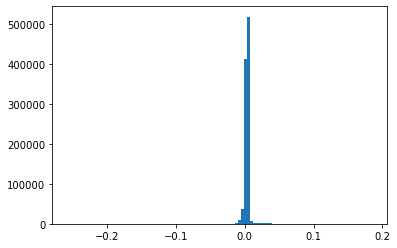

iteration # 171
iteration # 172
iteration # 173
iteration # 174
iteration # 175
iteration # 176
iteration # 177
iteration # 178
iteration # 179
iteration # 180


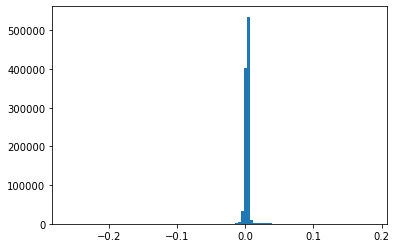

iteration # 181
iteration # 182
iteration # 183
iteration # 184
iteration # 185
iteration # 186
iteration # 187
iteration # 188
iteration # 189
iteration # 190


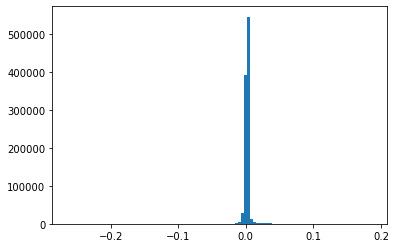

iteration # 191
iteration # 192
iteration # 193
iteration # 194
iteration # 195
iteration # 196
iteration # 197
iteration # 198
iteration # 199
iteration # 200


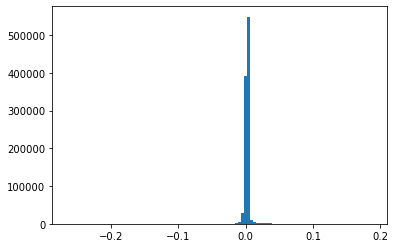

iteration # 201
iteration # 202
iteration # 203
iteration # 204
iteration # 205
iteration # 206
iteration # 207
iteration # 208
iteration # 209
iteration # 210


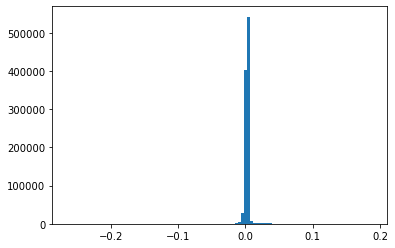

iteration # 211
iteration # 212
iteration # 213
iteration # 214
iteration # 215
iteration # 216
iteration # 217
iteration # 218
iteration # 219
iteration # 220


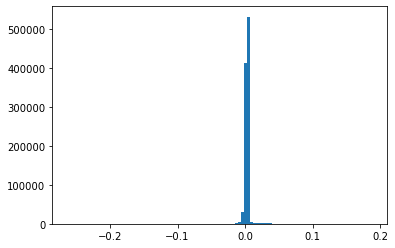

iteration # 221
iteration # 222
iteration # 223
iteration # 224
iteration # 225
iteration # 226
iteration # 227
iteration # 228
iteration # 229
iteration # 230


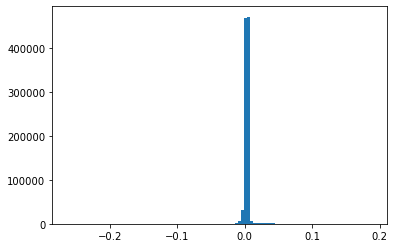

iteration # 231
iteration # 232
iteration # 233
iteration # 234
iteration # 235
iteration # 236
iteration # 237
iteration # 238
iteration # 239
iteration # 240


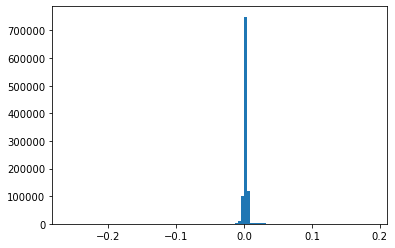

iteration # 241
iteration # 242
iteration # 243
iteration # 244
iteration # 245
iteration # 246
iteration # 247
iteration # 248
iteration # 249
4028.1396865844727  seconds.


In [860]:
starttime = time.time()
solvedIRT_6 = solve_IRT_for_matrix(table, all_thetas = None, iterations = 250, 
                                   FOUR_PL=True, show_convergence=10,
                                   bounds = ((1,-3,0,.5),(2,3,.5,1)))
print(time.time()-starttime, ' seconds.')



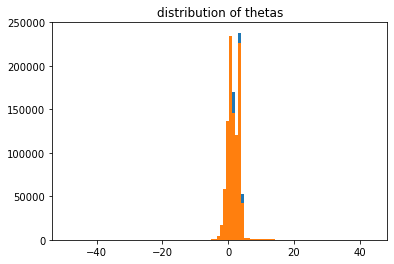

theta parameter correl:  0.9999767134725417
discriminability parameter correl:  0.9999854630803652
difficulty parameter correl:  0.9999910862947264
guessing parameter correl:  0.9999992687376561
atttention parameter correl:  0.9999991038792184


In [867]:
compareRuns(solvedIRT_5,solvedIRT_6)

In [908]:
list_of_skills

[('85afef75aa05478f8b25f9747875998c',),
 ('79817d8de6b049c1b6afecd50c65bf16',),
 ('297dcdf7d5014527906b62565e3c9107',),
 ('aiwohngu',),
 ('faa3bfaa479de311b77c005056801da1',),
 ('ungiecoo',),
 ('a20d7cf7e2f24281b503930836184a2d',),
 ('02a3bfaa479de311b77c005056801da1',),
 ('18a4bfaa479de311b77c005056801da1',),
 ('5aa3bfaa479de311b77c005056801da1',),
 ('aevoowon',),
 ('theecahs',),
 ('yohpecoo',),
 ('thohxith',),
 ('ijoophee',),
 ('1efabc206e5547309d19669314401ced',),
 ('iquahpai',),
 ('2aa5bfaa479de311b77c005056801da1',),
 ('f7a3bfaa479de311b77c005056801da1',),
 ('6b31e2e7569649b6930ca995f01c7435',),
 ('19a4bfaa479de311b77c005056801da1',),
 ('gohxaene',),
 ('f3a2bfaa479de311b77c005056801da1',),
 ('1fa3bfaa479de311b77c005056801da1',),
 ('0fdcb455f8f34917ae4444be04ab2172',),
 ('a0a3bfaa479de311b77c005056801da1',),
 ('ohquuuch',),
 ('13a5bfaa479de311b77c005056801da1',),
 ('0aaceabece72465f9cf1cd6f93aa90ec',),
 ('37a3bfaa479de311b77c005056801da1',),
 ('ooghahte',),
 ('f5a2bfaa479de311b77c0

In [ ]:
def submitSnowflakeQuery(query):
    try:
        import snowflake.connector
    except:
        !pip install snowflake-connector-python
        import snowflake.connector


    import base64
    WAREHOUSE = 'COMPUTE_WH'
    USER = 'OMAR_CLAFLIN'
    code = b'T2xsaWUyMSE='
    PASSWORD = base64.b64decode(code).decode("utf-8")
    ACCOUNT='Renaissance-MM82784'
    DATABASE = 'FRECKLE_PROD'
    # SCHEMA = ''
    # Gets the version
    ctx = snowflake.connector.connect(
        user=USER,
        password=PASSWORD,
        account=ACCOUNT, 
        database=DATABASE
    #     schema=SCHEMA
        )
    cs = ctx.cursor()
    try:
        cs.execute("USE warehouse COMPUTE_WH;")
        #cs.execute("USE DATABASE FRECKLE_PROD;")        
        cs.execute(query)
        all_rows = cs.fetchall()
        print(all_rows)
        #one_row = cs.fetchone()
        #print(one_row[0])
    finally:
        cs.close()
    ctx.close()



def export_object_to_csv(solvedIRT, skill_id, filename='estimatedItemParameters.csv'):
    #CHANGE THIS SO IT UPDATES/APPENDS CSV FILE
    #CHANGE SO IT SHIFTS ALL BETAS TO POSITIVE
    #inputs solved IRT object with all estimated parameters
    #exports a 10 field csv with 4 estimated parameters and 4 error scores for each question_id
    qid = solvedIRT.question_ids
    alpha,beta,gamma,epsilon = [solvedIRT.est_params[i] for i in range(4)]
    #normalize beta
    beta = beta + ((min(beta) - max(beta))/2) - min(beta)
    #could scale beta but then need to scale alpha -- skip for now, just interpretability for laypeople
    alpha_c,beta_c,gamma_c,epsilon_c = [np.asarray(solvedIRT.est_params[-1])[:,i] for i in range(4)]
    export_df = pd.DataFrame({'question_id': qid,
                       'skill_id': skill_id,
                       'discriminability': alpha,
                       'difficulty': beta,
                       'guessing': gamma,
                       'inattention': epsilon,
                       'discriminability_error': alpha_c,
                       'difficulty_error': beta_c,
                       'guessing_error': gamma_c,
                       'inattention_error': epsilon_c})
    #make directory, store csv in that directory
    import os
#     path = 'itemParametersBySkill'
#     if not os.path.isdir(path):
#         os.mkdir(path)
    if not os.path.isfile(filename):
        export_df.to_csv(filename, index=False)
    else:
        export_df.to_csv(filename, mode='a', header=False, index=False)


#get all skills
list_of_skills = query_for_skills()
los = [i[0] for i in list_of_skills]
print('fetched ', str(len(los)), ' skills.')
filename='estimatedItemParameters.csv'

for skill_id in los[570:]:
    print('skill_id: ', skill_id)
    
    try:
        #ETL for this skill
        import time
        start=time.time()
        df = loadAndFilterIntoDataframe(skill_id = skill_id)
        table=returnTable(df)
        print('loading time: ', time.time()-start)
        import numpy as np
        print('# of items: ',len(df), np.shape(df), np.shape(table))


        #solve IRT
        starttime = time.time()
        solvedIRT_7 = solve_IRT_for_matrix(table, all_thetas = None, iterations = 250, 
                                           FOUR_PL=True, show_convergence=0,
                                           bounds = ((1,-3,0,.5),(100,3,.5,1)))
        print('estimating parameter time: ', time.time()-starttime, ' seconds.')

        #write out csv to local directory -- change this for lambda or other resource to appropriate dir
        export_object_to_csv(solvedIRT_7, skill_id, filename)
    except:
        print('skipping ',skill_id, ' either loading or estimating broke.')

print('exporting to snowflake...')
import boto3, os
s3_client = boto3.client('s3')
response=s3_client.upload_file(filename,'product-snowflake-testing',filename)

#create snowflake table
submitSnowflakeQuery("create or replace table product_testing.ItemParameters (question_id TEXT, "+
                     "skill_id TEXT, discriminability FLOAT, difficulty FLOAT, guessing FLOAT, inattention FLOAT, "+
                    "discriminability_error FLOAT, difficulty_error FLOAT, guessing_error FLOAT, "+
                     "inattention_error FLOAT)")

#copy data into sf table
submitSnowflakeQuery("copy into product_testing.ItemParameters from @public.product_testing_stage/"+filename)

# #test with query -- not necessary for production
# submitSnowflakeQuery("select * from product_testing.itemParameters")






fetched  2408  skills.
skill_id:  a97e63d82400e4119e54005056801da1


In [1072]:
los.index(skill_id)
# los[550]
# los[560:]

570